In [3]:
library("feather")
library("lme4")
library("lmerTest")
library("ggplot2")
library("sjPlot")
require("MuMIn")
library("xlsx")
library("car")

In [4]:
df <-  read_feather("/Users/hun/Google Drive/HSE/PhD/PhD thesis/data/df_regr_instance_agg.feather")

Warning message:
“Coercing int64 to double”Warning message:
“Coercing int64 to double”

In [13]:
table(df$source)


iqbuzz 
 26963 

In [3]:
sum(is.na(df$is_ethicity_dangerous_meaning_value))

[1] 2420

In [4]:
sum(is.na(df$is_ethicity_aggressor_meaning_value))

[1] 20793

In [5]:
sum(is.na(df$is_ethicity_superior_meaning_value))

[1] 19373

In [6]:
dim(df)

[1] 26963    53

In [7]:
names(df)

[1] "instance_id"                         
 [2] "about_whole_nation_recoded_value"    
 [3] "assessor"                            
 [4] "comment"                             
 [5] "date"                                
 [6] "document.id"                         
 [7] "do_text_make_sense_raw_value"        
 [8] "encourage_aggression_meaning_value"  
 [9] "eth_group_to_code"                   
[10] "has_eth_conflict_raw_value"          
[11] "has_ethnonym_raw_value"              
[12] "has_pos_eth_interaction_raw_value"   
[13] "has_topic_culture_value"             
[14] "has_topic_daily_routine_value"       
[15] "has_topic_economics_value"           
[16] "has_topic_ethicity_value"            
[17] "has_topic_history_value"             
[18] "has_topic_humour_value"              
[19] "has_topic_migration_value"           
[20] "has_topic_other_value"               
[21] "has_topic_politics_value"            
[22] "has_topic_religion_value"            
[23] "has_topic_society_social_value"      
[24] "is_ethicity_aggressor_meaning_value" 
[25] "is_ethicity_dangerous_meaning_value" 
[26] "is_ethicity_superior_meaning_value"  
[27] "is_text_neg_raw_value"               
[28] "is_text_positive_raw_value"          
[29] "opinion_about_ethnonym_recoded_value"
[30] "represent_ethicity_meaning_value"    
[31] "seed_eth_group"                      
[32] "source"                              
[33] "stage"                               
[34] "source_text"                         
[35] "lemm_text"                           
[36] "city"                                
[37] "region"                              
[38] "created_date"                        
[39] "auth_age"                            
[40] "auth_gender"                         
[41] "auth_geo"                            
[42] "auth_name"                           
[43] "auth_nick"                           
[44] "auth_source"                         
[45] "doc_date"                            
[46] "domain"                              
[47] "doc_url"                             
[48] "ethno"                               
[49] "cntry"                               
[50] "pos"                                 
[51] "neg"                                 
[52] "words_num"                           
[53] "aggregated_groups"

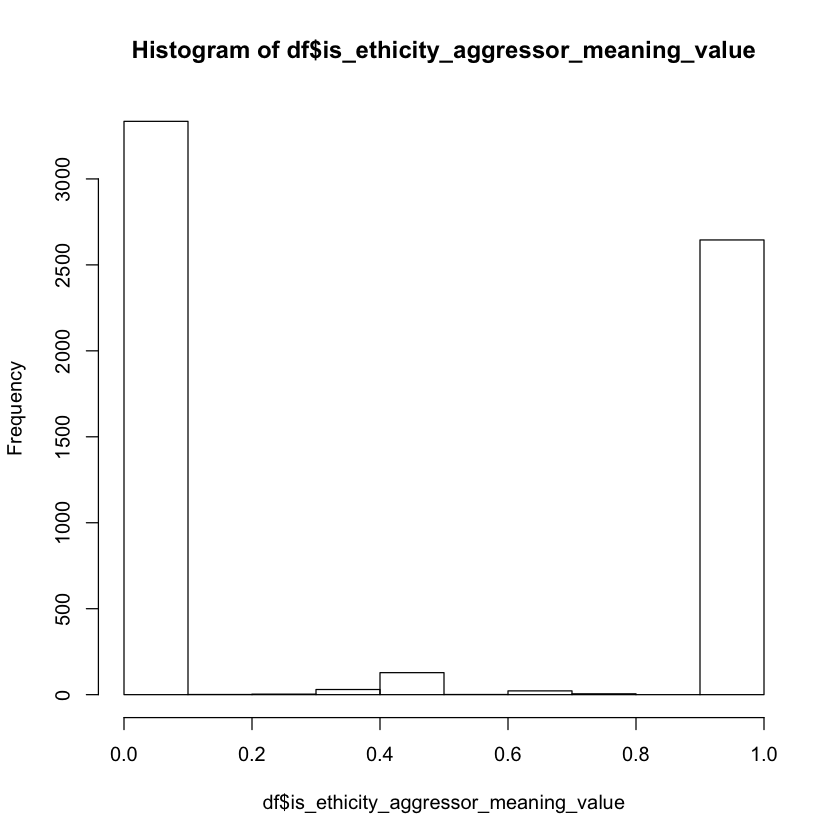

In [8]:
hist(df$is_ethicity_aggressor_meaning_value)

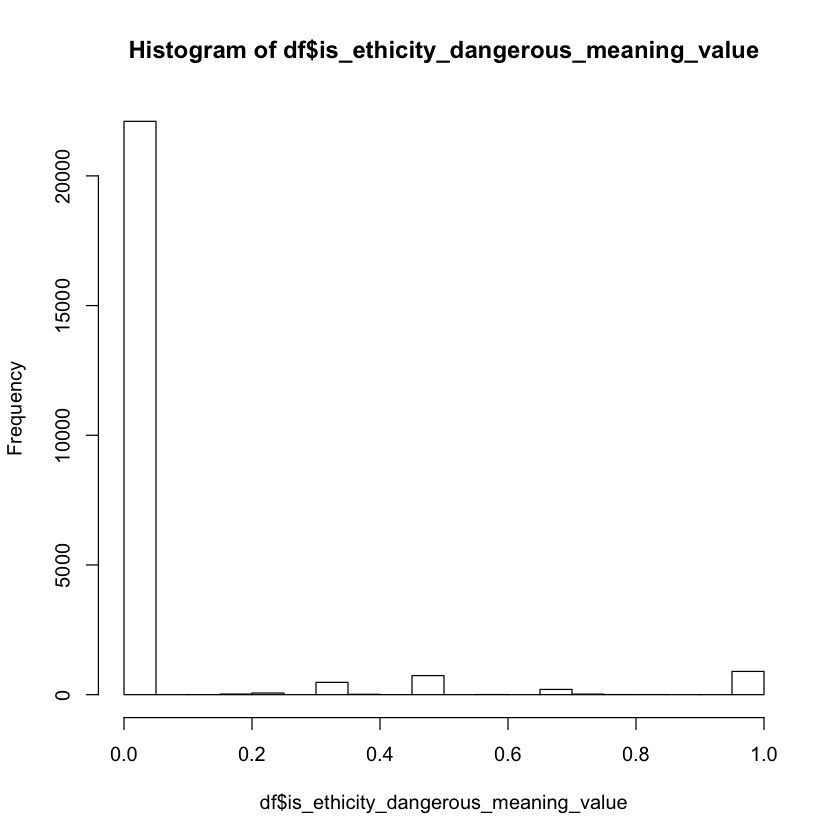

In [124]:
hist(df$is_ethicity_dangerous_meaning_value)

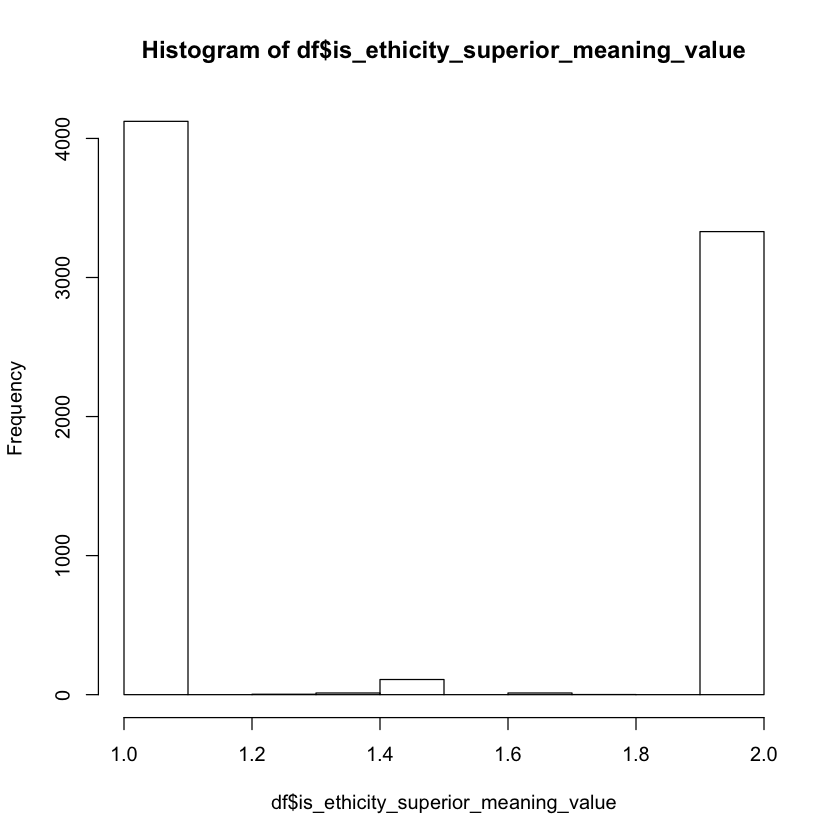

In [5]:
hist(df$is_ethicity_superior_meaning_value)

In [5]:
df$represent_ethicity_meaning_value    = ifelse(df$represent_ethicity_meaning_value > 0.5, 1, 0)
df$is_ethicity_aggressor_meaning_value = ifelse(df$is_ethicity_aggressor_meaning_value > 0.5, 1, 0)
df$is_ethicity_dangerous_meaning_value = ifelse(df$is_ethicity_dangerous_meaning_value > 0.5, 1, 0)
df$is_ethicity_superior_meaning_value  = ifelse(df$is_ethicity_superior_meaning_value > 1.5, 1, 0)

In [6]:
df$document.id = as.factor(df$document.id)
df$represent_ethicity_meaning_value = as.factor(df$represent_ethicity_meaning_value)
df$is_ethicity_aggressor_meaning_value = as.factor(df$is_ethicity_aggressor_meaning_value)
df$is_ethicity_dangerous_meaning_value = as.factor(df$is_ethicity_dangerous_meaning_value)
df$is_ethicity_superior_meaning_value = as.factor(df$is_ethicity_superior_meaning_value)
df$opinion_about_ethnonym_recoded_value = as.numeric(df$opinion_about_ethnonym_recoded_value)
df$eth_group_to_code = as.factor(df$eth_group_to_code)
df$aggregated_groups = as.factor(df$aggregated_groups)
df$auth_gender = as.factor(df$auth_gender)
df$region = as.factor(df$region)

In [7]:
table(df$is_ethicity_aggressor_meaning_value)


   0    1 
3497 2673 

In [9]:
table(df$is_ethicity_superior_meaning_value)


   0    1 
4247 3343 

In [10]:
table(df$is_ethicity_dangerous_meaning_value)


    0     1 
23413  1130 

Гипотеза 1: люди с более положительно относятся к представителем своей этнической группы.

In [11]:
model_1 = lmer(opinion_about_ethnonym_recoded_value ~ 
               represent_ethicity_meaning_value +
               (1|eth_group_to_code) +
               (1|region) +
               (1|document.id),
             data=df, REML = F)

In [12]:
r.squaredGLMM(model_1)

R2m        R2c 
0.08220261 0.51753602

In [13]:
summary(model_1)

Linear mixed model fit by maximum likelihood t-tests use Satterthwaite
  approximations to degrees of freedom [lmerMod]
Formula: 
opinion_about_ethnonym_recoded_value ~ represent_ethicity_meaning_value +  
    (1 | eth_group_to_code) + (1 | region) + (1 | document.id)
   Data: df

     AIC      BIC   logLik deviance df.resid 
 22343.3  22390.6 -11165.6  22331.3    19536 

Scaled residuals: 
    Min      1Q  Median      3Q     Max 
-5.0317 -0.3881 -0.0002  0.4437  4.6350 

Random effects:
 Groups            Name        Variance Std.Dev.
 document.id       (Intercept) 0.076269 0.27617 
 eth_group_to_code (Intercept) 0.040159 0.20040 
 region            (Intercept) 0.001016 0.03188 
 Residual                      0.130159 0.36078 
Number of obs: 19542, groups:  
document.id, 7575; eth_group_to_code, 97; region, 83

Fixed effects:
                                   Estimate Std. Error        df t value
(Intercept)                       9.533e-01  2.158e-02 1.122e+02   44.17
represent_ethic

In [33]:
model_1_1 = lmer(opinion_about_ethnonym_recoded_value ~ 
               represent_ethicity_meaning_value +
                auth_gender +
                 represent_ethicity_meaning_value:auth_gender +
               (1|eth_group_to_code) +
               (1|region) +
               (1|document.id),
             data=df, REML = F)

In [34]:
r.squaredGLMM(model_1_1)

R2m        R2c 
0.08555531 0.51605898

In [35]:
summary(model_1_1)

Warning message in abbreviate(rn, minlength = 11):
“abbreviate used with non-ASCII chars”Warning message in abbreviate(rn, minlength = 6):
“abbreviate used with non-ASCII chars”

Linear mixed model fit by maximum likelihood t-tests use Satterthwaite
  approximations to degrees of freedom [lmerMod]
Formula: 
opinion_about_ethnonym_recoded_value ~ represent_ethicity_meaning_value +  
    auth_gender + represent_ethicity_meaning_value:auth_gender +  
    (1 | eth_group_to_code) + (1 | region) + (1 | document.id)
   Data: df

     AIC      BIC   logLik deviance df.resid 
 20402.6  20464.8 -10193.3  20386.6    17732 

Scaled residuals: 
    Min      1Q  Median      3Q     Max 
-4.9014 -0.3934  0.0004  0.4514  4.1819 

Random effects:
 Groups            Name        Variance Std.Dev.
 document.id       (Intercept) 0.076010 0.27570 
 eth_group_to_code (Intercept) 0.039818 0.19954 
 region            (Intercept) 0.001061 0.03258 
 Residual                      0.131398 0.36249 
Number of obs: 17740, groups:  
document.id, 6751; eth_group_to_code, 97; region, 83

Fixed effects:
                                                       Estimate Std. Error
(Intercept)        

Plotting random effects...
Plotting random effects...
Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'абхаз' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'абхаз' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'абхаз' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'абхаз' in 'mbcsToSbcs': dot substituted for <b1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'абхаз' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'абхаз' in 'mbcsToSbcs': dot substituted for <85>”Warning message 

“conversion failure on 'азербайджанец' in 'mbcsToSbcs': dot substituted for <bd>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'азербайджанец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'азербайджанец' in 'mbcsToSbcs': dot substituted for <b5>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'азербайджанец' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'азербайджанец' in 'mbcsToSbcs': dot substituted for <86>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'азиат' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'азиат'

“conversion failure on 'американец' in 'mbcsToSbcs': dot substituted for <80>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'американец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'американец' in 'mbcsToSbcs': dot substituted for <b8>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'американец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'американец' in 'mbcsToSbcs': dot substituted for <ba>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'американец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'американец' in '

“conversion failure on 'басурманин' in 'mbcsToSbcs': dot substituted for <80>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'басурманин' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'басурманин' in 'mbcsToSbcs': dot substituted for <bc>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'басурманин' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'басурманин' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'басурманин' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'басурманин' in '

“conversion failure on 'вайнах' in 'mbcsToSbcs': dot substituted for <b9>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'вайнах' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'вайнах' in 'mbcsToSbcs': dot substituted for <bd>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'вайнах' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'вайнах' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'вайнах' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'вайнах' in 'mbcsToSbcs': dot substituted

“conversion failure on 'гастарбайтер' in 'mbcsToSbcs': dot substituted for <81>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'гастарбайтер' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'гастарбайтер' in 'mbcsToSbcs': dot substituted for <82>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'гастарбайтер' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'гастарбайтер' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'гастарбайтер' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'гаст

“conversion failure on 'дагестанец' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'дагестанец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'дагестанец' in 'mbcsToSbcs': dot substituted for <b3>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'дагестанец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'дагестанец' in 'mbcsToSbcs': dot substituted for <b5>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'дагестанец' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'дагестанец' in '

“conversion failure on 'евразиец' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'евразиец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'евразиец' in 'mbcsToSbcs': dot substituted for <b7>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'евразиец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'евразиец' in 'mbcsToSbcs': dot substituted for <b8>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'евразиец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'евразиец' in 'mbcsToSbcs': d

“conversion failure on 'ингуш' in 'mbcsToSbcs': dot substituted for <88>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'инородец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'инородец' in 'mbcsToSbcs': dot substituted for <b8>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'инородец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'инородец' in 'mbcsToSbcs': dot substituted for <bd>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'инородец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'инородец' in 'mbcsToSbcs': dot 

“conversion failure on 'кавказец' in 'mbcsToSbcs': dot substituted for <86>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'казак' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'казак' in 'mbcsToSbcs': dot substituted for <ba>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'казак' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'казак' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'казак' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'казак' in 'mbcsToSbcs': dot substituted for

“conversion failure on 'карачаевец' in 'mbcsToSbcs': dot substituted for <86>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'карел' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'карел' in 'mbcsToSbcs': dot substituted for <ba>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'карел' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'карел' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'карел' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'карел' in 'mbcsToSbcs': dot substituted f

“conversion failure on 'кумык' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'кумык' in 'mbcsToSbcs': dot substituted for <ba>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'латыш' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'латыш' in 'mbcsToSbcs': dot substituted for <bb>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'латыш' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'латыш' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'латыш' in 'mbcsToSbcs': dot substituted for <d

“conversion failure on 'манси' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'манси' in 'mbcsToSbcs': dot substituted for <bc>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'манси' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'манси' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'манси' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'манси' in 'mbcsToSbcs': dot substituted for <bd>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'манси' in 'mbcsToSbcs': dot substituted for <d

“conversion failure on 'монгол' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'монгол' in 'mbcsToSbcs': dot substituted for <bb>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'мордва' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'мордва' in 'mbcsToSbcs': dot substituted for <bc>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'мордва' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'мордва' in 'mbcsToSbcs': dot substituted for <be>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'мордва' in 'mbcsToSbcs': dot substituted

“conversion failure on 'ненец' in 'mbcsToSbcs': dot substituted for <bd>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'ненец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'ненец' in 'mbcsToSbcs': dot substituted for <b5>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'ненец' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'ненец' in 'mbcsToSbcs': dot substituted for <86>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'нерусь' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'нерусь' in 'mbcsToSbcs': dot substituted for 

“conversion failure on 'прибалт' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'прибалт' in 'mbcsToSbcs': dot substituted for <80>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'прибалт' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'прибалт' in 'mbcsToSbcs': dot substituted for <b8>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'прибалт' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'прибалт' in 'mbcsToSbcs': dot substituted for <b1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'прибалт' in 'mbcsToSbcs': dot subs

“conversion failure on 'русскоязычный' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'русскоязычный' in 'mbcsToSbcs': dot substituted for <80>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'русскоязычный' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'русскоязычный' in 'mbcsToSbcs': dot substituted for <83>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'русскоязычный' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'русскоязычный' in 'mbcsToSbcs': dot substituted for <81>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on

“conversion failure on 'среднеазиат' in 'mbcsToSbcs': dot substituted for <bd>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'среднеазиат' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'среднеазиат' in 'mbcsToSbcs': dot substituted for <b5>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'среднеазиат' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'среднеазиат' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'среднеазиат' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'среднеазиа

“conversion failure on 'тунгус' in 'mbcsToSbcs': dot substituted for <bd>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'тунгус' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'тунгус' in 'mbcsToSbcs': dot substituted for <b3>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'тунгус' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'тунгус' in 'mbcsToSbcs': dot substituted for <83>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'тунгус' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'тунгус' in 'mbcsToSbcs': dot substituted

“conversion failure on 'удмурт' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'удмурт' in 'mbcsToSbcs': dot substituted for <80>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'удмурт' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'удмурт' in 'mbcsToSbcs': dot substituted for <82>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'узбек' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'узбек' in 'mbcsToSbcs': dot substituted for <83>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'узбек' in 'mbcsToSbcs': dot substituted fo

“conversion failure on 'украинец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'украинец' in 'mbcsToSbcs': dot substituted for <b8>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'украинец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'украинец' in 'mbcsToSbcs': dot substituted for <bd>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'украинец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'украинец' in 'mbcsToSbcs': dot substituted for <b5>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'украинец' in 'mbcsToSbcs': d

“conversion failure on 'цыган' in 'mbcsToSbcs': dot substituted for <8b>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'цыган' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'цыган' in 'mbcsToSbcs': dot substituted for <b3>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'цыган' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'цыган' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'цыган' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'цыган' in 'mbcsToSbcs': dot substituted for <b

“conversion failure on 'чеченец' in 'mbcsToSbcs': dot substituted for <86>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'чуваш' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'чуваш' in 'mbcsToSbcs': dot substituted for <87>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'чуваш' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'чуваш' in 'mbcsToSbcs': dot substituted for <83>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'чуваш' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'чуваш' in 'mbcsToSbcs': dot substituted for 

“conversion failure on 'эвенк' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'эвенк' in 'mbcsToSbcs': dot substituted for <ba>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'эрзя' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'эрзя' in 'mbcsToSbcs': dot substituted for <8d>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'эрзя' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'эрзя' in 'mbcsToSbcs': dot substituted for <80>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'эрзя' in 'mbcsToSbcs': dot substituted for <d0>”Wa

“conversion failure on 'аварец' in 'mbcsToSbcs': dot substituted for <86>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'адыг' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'адыг' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'адыг' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'адыг' in 'mbcsToSbcs': dot substituted for <b4>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'адыг' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'адыг' in 'mbcsToSbcs': dot substituted for <8b>”Wa

“conversion failure on 'алан' in 'mbcsToSbcs': dot substituted for <bd>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'алеут' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'алеут' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'алеут' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'алеут' in 'mbcsToSbcs': dot substituted for <bb>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'алеут' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'алеут' in 'mbcsToSbcs': dot substituted for <b5

“conversion failure on 'армянин' in 'mbcsToSbcs': dot substituted for <bd>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'армянин' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'армянин' in 'mbcsToSbcs': dot substituted for <b8>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'армянин' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'армянин' in 'mbcsToSbcs': dot substituted for <bd>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'балкарец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'балкарец' in 'mbcsToSbcs': dot su

“conversion failure on 'башкир' in 'mbcsToSbcs': dot substituted for <80>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'беларус' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'беларус' in 'mbcsToSbcs': dot substituted for <b1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'беларус' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'беларус' in 'mbcsToSbcs': dot substituted for <b5>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'беларус' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'беларус' in 'mbcsToSbcs': dot subst

“conversion failure on 'великоросс' in 'mbcsToSbcs': dot substituted for <be>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'великоросс' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'великоросс' in 'mbcsToSbcs': dot substituted for <81>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'великоросс' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'великоросс' in 'mbcsToSbcs': dot substituted for <81>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'вепс' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'вепс' in 'mbcsToSbcs':

“conversion failure on 'горец' in 'mbcsToSbcs': dot substituted for <be>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'горец' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'горец' in 'mbcsToSbcs': dot substituted for <80>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'горец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'горец' in 'mbcsToSbcs': dot substituted for <b5>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'горец' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'горец' in 'mbcsToSbcs': dot substituted for <8

“conversion failure on 'даргинец' in 'mbcsToSbcs': dot substituted for <80>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'даргинец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'даргинец' in 'mbcsToSbcs': dot substituted for <b3>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'даргинец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'даргинец' in 'mbcsToSbcs': dot substituted for <b8>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'даргинец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'даргинец' in 'mbcsToSbcs': d

“conversion failure on 'жид' in 'mbcsToSbcs': dot substituted for <b8>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'жид' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'жид' in 'mbcsToSbcs': dot substituted for <b4>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'западенец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'западенец' in 'mbcsToSbcs': dot substituted for <b7>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'западенец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'западенец' in 'mbcsToSbcs': dot substitu

“conversion failure on 'кабардинец' in 'mbcsToSbcs': dot substituted for <b1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'кабардинец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'кабардинец' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'кабардинец' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'кабардинец' in 'mbcsToSbcs': dot substituted for <80>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'кабардинец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'кабардинец' in '

“conversion failure on 'калмык' in 'mbcsToSbcs': dot substituted for <ba>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'калмык' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'калмык' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'калмык' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'калмык' in 'mbcsToSbcs': dot substituted for <bb>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'калмык' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'калмык' in 'mbcsToSbcs': dot substituted

“conversion failure on 'киргиз' in 'mbcsToSbcs': dot substituted for <b7>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'китаец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'китаец' in 'mbcsToSbcs': dot substituted for <ba>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'китаец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'китаец' in 'mbcsToSbcs': dot substituted for <b8>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'китаец' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'китаец' in 'mbcsToSbcs': dot substituted

“conversion failure on 'лезгин' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'лезгин' in 'mbcsToSbcs': dot substituted for <bd>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'литовец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'литовец' in 'mbcsToSbcs': dot substituted for <bb>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'литовец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'литовец' in 'mbcsToSbcs': dot substituted for <b8>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'литовец' in 'mbcsToSbcs': dot substi

“conversion failure on 'молдаванин' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'молдаванин' in 'mbcsToSbcs': dot substituted for <bc>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'молдаванин' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'молдаванин' in 'mbcsToSbcs': dot substituted for <be>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'молдаванин' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'молдаванин' in 'mbcsToSbcs': dot substituted for <bb>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'молдаванин' in '

“conversion failure on 'нанаец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'нанаец' in 'mbcsToSbcs': dot substituted for <b5>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'нанаец' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'нанаец' in 'mbcsToSbcs': dot substituted for <86>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'нацмен' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'нацмен' in 'mbcsToSbcs': dot substituted for <bd>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'нацмен' in 'mbcsToSbcs': dot substituted

“conversion failure on 'ногаец' in 'mbcsToSbcs': dot substituted for <b3>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'ногаец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'ногаец' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'ногаец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'ногаец' in 'mbcsToSbcs': dot substituted for <b5>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'ногаец' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'ногаец' in 'mbcsToSbcs': dot substituted

“conversion failure on 'россиянин' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'россиянин' in 'mbcsToSbcs': dot substituted for <be>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'россиянин' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'россиянин' in 'mbcsToSbcs': dot substituted for <81>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'россиянин' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'россиянин' in 'mbcsToSbcs': dot substituted for <81>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'россиянин' in 'mbcsToS

“conversion failure on 'русскоязычный' in 'mbcsToSbcs': dot substituted for <bd>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'русскоязычный' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'русскоязычный' in 'mbcsToSbcs': dot substituted for <8b>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'русскоязычный' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'русскоязычный' in 'mbcsToSbcs': dot substituted for <b9>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'славянин' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'сла

“conversion failure on 'таджик' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'таджик' in 'mbcsToSbcs': dot substituted for <b8>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'таджик' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'таджик' in 'mbcsToSbcs': dot substituted for <ba>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'татарин' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'татарин' in 'mbcsToSbcs': dot substituted for <82>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'татарин' in 'mbcsToSbcs': dot substitu

“conversion failure on 'турок' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'турок' in 'mbcsToSbcs': dot substituted for <82>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'турок' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'турок' in 'mbcsToSbcs': dot substituted for <83>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'турок' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'турок' in 'mbcsToSbcs': dot substituted for <80>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'турок' in 'mbcsToSbcs': dot substituted for <d

“conversion failure on 'узкоглазый' in 'mbcsToSbcs': dot substituted for <be>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'узкоглазый' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'узкоглазый' in 'mbcsToSbcs': dot substituted for <b3>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'узкоглазый' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'узкоглазый' in 'mbcsToSbcs': dot substituted for <bb>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'узкоглазый' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'узкоглазый' in '

“conversion failure on 'хакас' in 'mbcsToSbcs': dot substituted for <ba>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'хакас' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'хакас' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'хакас' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'хакас' in 'mbcsToSbcs': dot substituted for <81>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'хант' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'хант' in 'mbcsToSbcs': dot substituted for <85>

“conversion failure on 'черножопый' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'черножопый' in 'mbcsToSbcs': dot substituted for <b5>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'черножопый' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'черножопый' in 'mbcsToSbcs': dot substituted for <80>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'черножопый' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'черножопый' in 'mbcsToSbcs': dot substituted for <bd>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'черножопый' in '

“conversion failure on 'чурка' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'чурка' in 'mbcsToSbcs': dot substituted for <87>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'чурка' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'чурка' in 'mbcsToSbcs': dot substituted for <83>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'чурка' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'чурка' in 'mbcsToSbcs': dot substituted for <80>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'чурка' in 'mbcsToSbcs': dot substituted for <d

“conversion failure on 'эстонец' in 'mbcsToSbcs': dot substituted for <b5>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'эстонец' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'эстонец' in 'mbcsToSbcs': dot substituted for <86>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'якут' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'якут' in 'mbcsToSbcs': dot substituted for <8f>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'якут' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'якут' in 'mbcsToSbcs': dot substituted for 

“conversion failure on 'азербайджанец' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'азербайджанец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'азербайджанец' in 'mbcsToSbcs': dot substituted for <b9>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'азербайджанец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'азербайджанец' in 'mbcsToSbcs': dot substituted for <b4>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'азербайджанец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on

“conversion failure on 'алтаец' in 'mbcsToSbcs': dot substituted for <b5>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'алтаец' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'алтаец' in 'mbcsToSbcs': dot substituted for <86>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'американец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'американец' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'американец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'американец' in 'mbcsToSbcs':

“conversion failure on 'балкарец' in 'mbcsToSbcs': dot substituted for <86>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'басурманин' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'басурманин' in 'mbcsToSbcs': dot substituted for <b1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'басурманин' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'басурманин' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'басурманин' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'басурманин' in 'mb

“conversion failure on 'бурят' in 'mbcsToSbcs': dot substituted for <80>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'бурят' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'бурят' in 'mbcsToSbcs': dot substituted for <8f>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'бурят' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'бурят' in 'mbcsToSbcs': dot substituted for <82>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'вайнах' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'вайнах' in 'mbcsToSbcs': dot substituted for 

“conversion failure on 'гагауз' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'гагауз' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'гагауз' in 'mbcsToSbcs': dot substituted for <83>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'гагауз' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'гагауз' in 'mbcsToSbcs': dot substituted for <b7>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'гастарбайтер' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'гастарбайтер' in 'mbcsToSbcs': dot

“conversion failure on 'грузин' in 'mbcsToSbcs': dot substituted for <83>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'грузин' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'грузин' in 'mbcsToSbcs': dot substituted for <b7>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'грузин' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'грузин' in 'mbcsToSbcs': dot substituted for <b8>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'грузин' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'грузин' in 'mbcsToSbcs': dot substituted

“conversion failure on 'другой' in 'mbcsToSbcs': dot substituted for <be>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'другой' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'другой' in 'mbcsToSbcs': dot substituted for <b9>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'евразиец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'евразиец' in 'mbcsToSbcs': dot substituted for <b5>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'евразиец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'евразиец' in 'mbcsToSbcs': dot sub

“conversion failure on 'западенец' in 'mbcsToSbcs': dot substituted for <86>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'ингуш' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'ингуш' in 'mbcsToSbcs': dot substituted for <b8>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'ингуш' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'ингуш' in 'mbcsToSbcs': dot substituted for <bd>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'ингуш' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'ингуш' in 'mbcsToSbcs': dot substituted fo

“conversion failure on 'кавказец' in 'mbcsToSbcs': dot substituted for <b2>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'кавказец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'кавказец' in 'mbcsToSbcs': dot substituted for <ba>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'кавказец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'кавказец' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'кавказец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'кавказец' in 'mbcsToSbcs': d

“conversion failure on 'карачаевец' in 'mbcsToSbcs': dot substituted for <87>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'карачаевец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'карачаевец' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'карачаевец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'карачаевец' in 'mbcsToSbcs': dot substituted for <b5>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'карачаевец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'карачаевец' in '

“conversion failure on 'коряк' in 'mbcsToSbcs': dot substituted for <8f>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'коряк' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'коряк' in 'mbcsToSbcs': dot substituted for <ba>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'кумык' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'кумык' in 'mbcsToSbcs': dot substituted for <ba>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'кумык' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'кумык' in 'mbcsToSbcs': dot substituted for <8

“conversion failure on 'малорос' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'малорос' in 'mbcsToSbcs': dot substituted for <bb>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'малорос' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'малорос' in 'mbcsToSbcs': dot substituted for <be>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'малорос' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'малорос' in 'mbcsToSbcs': dot substituted for <80>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'малорос' in 'mbcsToSbcs': dot subs

“conversion failure on 'монгол' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'монгол' in 'mbcsToSbcs': dot substituted for <bc>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'монгол' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'монгол' in 'mbcsToSbcs': dot substituted for <be>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'монгол' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'монгол' in 'mbcsToSbcs': dot substituted for <bd>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'монгол' in 'mbcsToSbcs': dot substituted

“conversion failure on 'немец' in 'mbcsToSbcs': dot substituted for <bc>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'немец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'немец' in 'mbcsToSbcs': dot substituted for <b5>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'немец' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'немец' in 'mbcsToSbcs': dot substituted for <86>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'ненец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'ненец' in 'mbcsToSbcs': dot substituted for <b

“conversion failure on 'поляк' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'поляк' in 'mbcsToSbcs': dot substituted for <be>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'поляк' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'поляк' in 'mbcsToSbcs': dot substituted for <bb>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'поляк' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'поляк' in 'mbcsToSbcs': dot substituted for <8f>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'поляк' in 'mbcsToSbcs': dot substituted for <d

“conversion failure on 'русский' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'русский' in 'mbcsToSbcs': dot substituted for <81>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'русский' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'русский' in 'mbcsToSbcs': dot substituted for <81>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'русский' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'русский' in 'mbcsToSbcs': dot substituted for <ba>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'русский' in 'mbcsToSbcs': dot subs

“conversion failure on 'славянин' in 'mbcsToSbcs': dot substituted for <bd>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'среднеазиат' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'среднеазиат' in 'mbcsToSbcs': dot substituted for <81>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'среднеазиат' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'среднеазиат' in 'mbcsToSbcs': dot substituted for <80>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'среднеазиат' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'среднеазиат' 

“conversion failure on 'тува' in 'mbcsToSbcs': dot substituted for <83>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'тува' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'тува' in 'mbcsToSbcs': dot substituted for <b2>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'тува' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'тува' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'тунгус' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'тунгус' in 'mbcsToSbcs': dot substituted for <82>”

“conversion failure on 'угр' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'угр' in 'mbcsToSbcs': dot substituted for <80>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'удмурт' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'удмурт' in 'mbcsToSbcs': dot substituted for <83>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'удмурт' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'удмурт' in 'mbcsToSbcs': dot substituted for <b4>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'удмурт' in 'mbcsToSbcs': dot substituted for <

“conversion failure on 'уйгур' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'уйгур' in 'mbcsToSbcs': dot substituted for <80>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'украинец' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'украинец' in 'mbcsToSbcs': dot substituted for <83>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'украинец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'украинец' in 'mbcsToSbcs': dot substituted for <ba>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'украинец' in 'mbcsToSbcs': dot sub

“conversion failure on 'хохол' in 'mbcsToSbcs': dot substituted for <be>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'хохол' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'хохол' in 'mbcsToSbcs': dot substituted for <85>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'хохол' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'хохол' in 'mbcsToSbcs': dot substituted for <be>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'хохол' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'хохол' in 'mbcsToSbcs': dot substituted for <b

“conversion failure on 'чеченец' in 'mbcsToSbcs': dot substituted for <b5>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'чеченец' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'чеченец' in 'mbcsToSbcs': dot substituted for <87>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'чеченец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'чеченец' in 'mbcsToSbcs': dot substituted for <b5>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'чеченец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'чеченец' in 'mbcsToSbcs': dot subs

“conversion failure on 'чухонец' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'чухонец' in 'mbcsToSbcs': dot substituted for <86>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'эвенк' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'эвенк' in 'mbcsToSbcs': dot substituted for <8d>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'эвенк' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'эвенк' in 'mbcsToSbcs': dot substituted for <b2>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'эвенк' in 'mbcsToSbcs': dot substituted fo

“conversion failure on 'аварец' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'аварец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'аварец' in 'mbcsToSbcs': dot substituted for <b2>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'аварец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'аварец' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'аварец' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'аварец' in 'mbcsToSbcs': dot substituted

“conversion failure on 'азиат' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'азиат' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'азиат' in 'mbcsToSbcs': dot substituted for <82>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'алан' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'алан' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'алан' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'алан' in 'mbcsToSbcs': dot substituted for <bb>”W

“conversion failure on 'американец' in 'mbcsToSbcs': dot substituted for <86>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'армянин' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'армянин' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'армянин' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'армянин' in 'mbcsToSbcs': dot substituted for <80>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'армянин' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'армянин' in 'mbcsToSbcs': dot s

“conversion failure on 'башкир' in 'mbcsToSbcs': dot substituted for <b1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'башкир' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'башкир' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'башкир' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'башкир' in 'mbcsToSbcs': dot substituted for <88>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'башкир' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'башкир' in 'mbcsToSbcs': dot substituted

“conversion failure on 'великоросс' in 'mbcsToSbcs': dot substituted for <bb>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'великоросс' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'великоросс' in 'mbcsToSbcs': dot substituted for <b8>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'великоросс' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'великоросс' in 'mbcsToSbcs': dot substituted for <ba>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'великоросс' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'великоросс' in '

“conversion failure on 'гастарбайтер' in 'mbcsToSbcs': dot substituted for <b9>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'гастарбайтер' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'гастарбайтер' in 'mbcsToSbcs': dot substituted for <82>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'гастарбайтер' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'гастарбайтер' in 'mbcsToSbcs': dot substituted for <b5>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'гастарбайтер' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'гаст

“conversion failure on 'дагестанец' in 'mbcsToSbcs': dot substituted for <bd>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'дагестанец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'дагестанец' in 'mbcsToSbcs': dot substituted for <b5>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'дагестанец' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'дагестанец' in 'mbcsToSbcs': dot substituted for <86>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'даргинец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'даргинец' in 'mbcs

“conversion failure on 'еврей' in 'mbcsToSbcs': dot substituted for <b2>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'еврей' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'еврей' in 'mbcsToSbcs': dot substituted for <80>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'еврей' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'еврей' in 'mbcsToSbcs': dot substituted for <b5>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'еврей' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'еврей' in 'mbcsToSbcs': dot substituted for <b

“conversion failure on 'инородец' in 'mbcsToSbcs': dot substituted for <b4>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'инородец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'инородец' in 'mbcsToSbcs': dot substituted for <b5>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'инородец' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'инородец' in 'mbcsToSbcs': dot substituted for <86>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'кабардинец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'кабардинец' in 'mbcsToSbcs

“conversion failure on 'казах' in 'mbcsToSbcs': dot substituted for <ba>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'казах' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'казах' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'казах' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'казах' in 'mbcsToSbcs': dot substituted for <b7>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'казах' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'казах' in 'mbcsToSbcs': dot substituted for <b

“conversion failure on 'киргиз' in 'mbcsToSbcs': dot substituted for <ba>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'киргиз' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'киргиз' in 'mbcsToSbcs': dot substituted for <b8>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'киргиз' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'киргиз' in 'mbcsToSbcs': dot substituted for <80>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'киргиз' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'киргиз' in 'mbcsToSbcs': dot substituted

“conversion failure on 'лезгин' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'лезгин' in 'mbcsToSbcs': dot substituted for <bb>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'лезгин' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'лезгин' in 'mbcsToSbcs': dot substituted for <b5>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'лезгин' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'лезгин' in 'mbcsToSbcs': dot substituted for <b7>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'лезгин' in 'mbcsToSbcs': dot substituted

“conversion failure on 'мариец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'мариец' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'мариец' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'мариец' in 'mbcsToSbcs': dot substituted for <80>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'мариец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'мариец' in 'mbcsToSbcs': dot substituted for <b8>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'мариец' in 'mbcsToSbcs': dot substituted

“conversion failure on 'мордва' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'мордва' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'нанаец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'нанаец' in 'mbcsToSbcs': dot substituted for <bd>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'нанаец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'нанаец' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'нанаец' in 'mbcsToSbcs': dot substituted

“conversion failure on 'нерусь' in 'mbcsToSbcs': dot substituted for <83>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'нерусь' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'нерусь' in 'mbcsToSbcs': dot substituted for <81>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'нерусь' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'нерусь' in 'mbcsToSbcs': dot substituted for <8c>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'ногаец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'ногаец' in 'mbcsToSbcs': dot substituted

“conversion failure on 'росс' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'росс' in 'mbcsToSbcs': dot substituted for <80>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'росс' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'росс' in 'mbcsToSbcs': dot substituted for <be>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'росс' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'росс' in 'mbcsToSbcs': dot substituted for <81>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'росс' in 'mbcsToSbcs': dot substituted for <d1>”Warn

“conversion failure on 'русскоязычный' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'русскоязычный' in 'mbcsToSbcs': dot substituted for <8f>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'русскоязычный' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'русскоязычный' in 'mbcsToSbcs': dot substituted for <b7>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'русскоязычный' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'русскоязычный' in 'mbcsToSbcs': dot substituted for <8b>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on

“conversion failure on 'среднеазиат' in 'mbcsToSbcs': dot substituted for <82>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'таджик' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'таджик' in 'mbcsToSbcs': dot substituted for <82>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'таджик' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'таджик' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'таджик' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'таджик' in 'mbcsToSbcs': dot substi

“conversion failure on 'туркмен' in 'mbcsToSbcs': dot substituted for <80>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'туркмен' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'туркмен' in 'mbcsToSbcs': dot substituted for <ba>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'туркмен' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'туркмен' in 'mbcsToSbcs': dot substituted for <bc>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'туркмен' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'туркмен' in 'mbcsToSbcs': dot subs

“conversion failure on 'узбек' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'узбек' in 'mbcsToSbcs': dot substituted for <ba>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'узкоглазый' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'узкоглазый' in 'mbcsToSbcs': dot substituted for <83>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'узкоглазый' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'узкоглазый' in 'mbcsToSbcs': dot substituted for <b7>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'узкоглазый' in 'mbcsToSbcs

“conversion failure on 'финн' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'финн' in 'mbcsToSbcs': dot substituted for <bd>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'финн' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'финн' in 'mbcsToSbcs': dot substituted for <bd>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'хакас' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'хакас' in 'mbcsToSbcs': dot substituted for <85>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'хакас' in 'mbcsToSbcs': dot substituted for <d0>”W

“conversion failure on 'черкес' in 'mbcsToSbcs': dot substituted for <80>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'черкес' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'черкес' in 'mbcsToSbcs': dot substituted for <ba>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'черкес' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'черкес' in 'mbcsToSbcs': dot substituted for <b5>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'черкес' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'черкес' in 'mbcsToSbcs': dot substituted

“conversion failure on 'чукча' in 'mbcsToSbcs': dot substituted for <87>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'чукча' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'чукча' in 'mbcsToSbcs': dot substituted for <83>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'чукча' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'чукча' in 'mbcsToSbcs': dot substituted for <ba>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'чукча' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'чукча' in 'mbcsToSbcs': dot substituted for <8

“conversion failure on 'эстонец' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'эстонец' in 'mbcsToSbcs': dot substituted for <81>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'эстонец' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'эстонец' in 'mbcsToSbcs': dot substituted for <82>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'эстонец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'эстонец' in 'mbcsToSbcs': dot substituted for <be>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'эстонец' in 'mbcsToSbcs': dot subs

“conversion failure on 'азербайджанец' in 'mbcsToSbcs': dot substituted for <b7>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'азербайджанец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'азербайджанец' in 'mbcsToSbcs': dot substituted for <b5>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'азербайджанец' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'азербайджанец' in 'mbcsToSbcs': dot substituted for <80>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'азербайджанец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on

“conversion failure on 'алтаец' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'алтаец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'алтаец' in 'mbcsToSbcs': dot substituted for <bb>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'алтаец' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'алтаец' in 'mbcsToSbcs': dot substituted for <82>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'алтаец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'алтаец' in 'mbcsToSbcs': dot substituted

“conversion failure on 'балкарец' in 'mbcsToSbcs': dot substituted for <ba>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'балкарец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'балкарец' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'балкарец' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'балкарец' in 'mbcsToSbcs': dot substituted for <80>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'балкарец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'балкарец' in 'mbcsToSbcs': d

“conversion failure on 'беларус' in 'mbcsToSbcs': dot substituted for <83>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'беларус' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'беларус' in 'mbcsToSbcs': dot substituted for <81>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'бурят' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'бурят' in 'mbcsToSbcs': dot substituted for <b1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'бурят' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'бурят' in 'mbcsToSbcs': dot substituted 

“conversion failure on 'вепс' in 'mbcsToSbcs': dot substituted for <81>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'гагауз' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'гагауз' in 'mbcsToSbcs': dot substituted for <b3>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'гагауз' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'гагауз' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'гагауз' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'гагауз' in 'mbcsToSbcs': dot substituted f

“conversion failure on 'грек' in 'mbcsToSbcs': dot substituted for <b5>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'грек' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'грек' in 'mbcsToSbcs': dot substituted for <ba>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'грузин' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'грузин' in 'mbcsToSbcs': dot substituted for <b3>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'грузин' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'грузин' in 'mbcsToSbcs': dot substituted for <

“conversion failure on 'другой' in 'mbcsToSbcs': dot substituted for <b4>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'другой' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'другой' in 'mbcsToSbcs': dot substituted for <80>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'другой' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'другой' in 'mbcsToSbcs': dot substituted for <83>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'другой' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'другой' in 'mbcsToSbcs': dot substituted

“conversion failure on 'западенец' in 'mbcsToSbcs': dot substituted for <b4>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'западенец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'западенец' in 'mbcsToSbcs': dot substituted for <b5>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'западенец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'западенец' in 'mbcsToSbcs': dot substituted for <bd>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'западенец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'западенец' in 'mbcsToS

“conversion failure on 'кабардинец' in 'mbcsToSbcs': dot substituted for <b5>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'кабардинец' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'кабардинец' in 'mbcsToSbcs': dot substituted for <86>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'кавказец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'кавказец' in 'mbcsToSbcs': dot substituted for <ba>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'кавказец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'кавказец' in 'mbcsToSb

“conversion failure on 'карачаевец' in 'mbcsToSbcs': dot substituted for <ba>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'карачаевец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'карачаевец' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'карачаевец' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'карачаевец' in 'mbcsToSbcs': dot substituted for <80>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'карачаевец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'карачаевец' in '

“conversion failure on 'китаец' in 'mbcsToSbcs': dot substituted for <86>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'коряк' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'коряк' in 'mbcsToSbcs': dot substituted for <ba>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'коряк' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'коряк' in 'mbcsToSbcs': dot substituted for <be>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'коряк' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'коряк' in 'mbcsToSbcs': dot substituted for <

“conversion failure on 'литовец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'литовец' in 'mbcsToSbcs': dot substituted for <b5>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'литовец' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'литовец' in 'mbcsToSbcs': dot substituted for <86>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'малорос' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'малорос' in 'mbcsToSbcs': dot substituted for <bc>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'малорос' in 'mbcsToSbcs': dot subs

“conversion failure on 'молдаванин' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'молдаванин' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'молдаванин' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'молдаванин' in 'mbcsToSbcs': dot substituted for <bd>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'молдаванин' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'молдаванин' in 'mbcsToSbcs': dot substituted for <b8>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'молдаванин' in '

“conversion failure on 'нацмен' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'нацмен' in 'mbcsToSbcs': dot substituted for <b5>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'нацмен' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'нацмен' in 'mbcsToSbcs': dot substituted for <bd>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'немец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'немец' in 'mbcsToSbcs': dot substituted for <bd>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'немец' in 'mbcsToSbcs': dot substituted fo

“conversion failure on 'осетин' in 'mbcsToSbcs': dot substituted for <b5>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'осетин' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'осетин' in 'mbcsToSbcs': dot substituted for <82>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'осетин' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'осетин' in 'mbcsToSbcs': dot substituted for <b8>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'осетин' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'осетин' in 'mbcsToSbcs': dot substituted

“conversion failure on 'россиянин' in 'mbcsToSbcs': dot substituted for <bd>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'россиянин' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'россиянин' in 'mbcsToSbcs': dot substituted for <b8>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'россиянин' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'россиянин' in 'mbcsToSbcs': dot substituted for <bd>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'русский' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'русский' in 'mbcsToSbcs'

“conversion failure on 'славянин' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'славянин' in 'mbcsToSbcs': dot substituted for <b2>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'славянин' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'славянин' in 'mbcsToSbcs': dot substituted for <8f>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'славянин' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'славянин' in 'mbcsToSbcs': dot substituted for <bd>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'славянин' in 'mbcsToSbcs': d

“conversion failure on 'татарин' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'татарин' in 'mbcsToSbcs': dot substituted for <80>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'татарин' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'татарин' in 'mbcsToSbcs': dot substituted for <b8>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'татарин' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'татарин' in 'mbcsToSbcs': dot substituted for <bd>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'тува' in 'mbcsToSbcs': dot substit

“conversion failure on 'тюрк' in 'mbcsToSbcs': dot substituted for <8e>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'тюрк' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'тюрк' in 'mbcsToSbcs': dot substituted for <80>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'тюрк' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'тюрк' in 'mbcsToSbcs': dot substituted for <ba>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'угр' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'угр' in 'mbcsToSbcs': dot substituted for <83>”Warnin

“conversion failure on 'узкоглазый' in 'mbcsToSbcs': dot substituted for <b9>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'уйгур' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'уйгур' in 'mbcsToSbcs': dot substituted for <83>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'уйгур' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'уйгур' in 'mbcsToSbcs': dot substituted for <b9>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'уйгур' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'уйгур' in 'mbcsToSbcs': dot substituted f

“conversion failure on 'хач' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'хач' in 'mbcsToSbcs': dot substituted for <85>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'хач' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'хач' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'хач' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'хач' in 'mbcsToSbcs': dot substituted for <87>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'хохол' in 'mbcsToSbcs': dot substituted for <d1>”Warning m

“conversion failure on 'черножопый' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'черножопый' in 'mbcsToSbcs': dot substituted for <bf>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'черножопый' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'черножопый' in 'mbcsToSbcs': dot substituted for <8b>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'черножопый' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'черножопый' in 'mbcsToSbcs': dot substituted for <b9>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'чеченец' in 'mbc

“conversion failure on 'чухонец' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'чухонец' in 'mbcsToSbcs': dot substituted for <83>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'чухонец' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'чухонец' in 'mbcsToSbcs': dot substituted for <85>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'чухонец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'чухонец' in 'mbcsToSbcs': dot substituted for <be>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'чухонец' in 'mbcsToSbcs': dot subs

“conversion failure on 'абхаз' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'абхаз' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'абхаз' in 'mbcsToSbcs': dot substituted for <b1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'абхаз' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'абхаз' in 'mbcsToSbcs': dot substituted for <85>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'абхаз' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'абхаз' in 'mbcsToSbcs': dot substituted for <b

“conversion failure on 'азербайджанец' in 'mbcsToSbcs': dot substituted for <b5>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'азербайджанец' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'азербайджанец' in 'mbcsToSbcs': dot substituted for <86>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'азиат' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'азиат' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'азиат' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'азиат' in 'mbcsToSbcs'

“conversion failure on 'американец' in 'mbcsToSbcs': dot substituted for <b8>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'американец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'американец' in 'mbcsToSbcs': dot substituted for <ba>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'американец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'американец' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'американец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'американец' in '

“conversion failure on 'басурманин' in 'mbcsToSbcs': dot substituted for <bc>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'басурманин' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'басурманин' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'басурманин' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'басурманин' in 'mbcsToSbcs': dot substituted for <bd>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'басурманин' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'басурманин' in '

“conversion failure on 'вайнах' in 'mbcsToSbcs': dot substituted for <bd>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'вайнах' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'вайнах' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'вайнах' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'вайнах' in 'mbcsToSbcs': dot substituted for <85>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'великоросс' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'великоросс' in 'mbcsToSbcs': dot sub

“conversion failure on 'гастарбайтер' in 'mbcsToSbcs': dot substituted for <82>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'гастарбайтер' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'гастарбайтер' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'гастарбайтер' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'гастарбайтер' in 'mbcsToSbcs': dot substituted for <80>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'гастарбайтер' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'гаст

“conversion failure on 'дагестанец' in 'mbcsToSbcs': dot substituted for <b3>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'дагестанец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'дагестанец' in 'mbcsToSbcs': dot substituted for <b5>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'дагестанец' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'дагестанец' in 'mbcsToSbcs': dot substituted for <81>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'дагестанец' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'дагестанец' in '

“conversion failure on 'евразиец' in 'mbcsToSbcs': dot substituted for <b7>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'евразиец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'евразиец' in 'mbcsToSbcs': dot substituted for <b8>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'евразиец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'евразиец' in 'mbcsToSbcs': dot substituted for <b5>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'евразиец' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'евразиец' in 'mbcsToSbcs': d

“conversion failure on 'инородец' in 'mbcsToSbcs': dot substituted for <b8>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'инородец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'инородец' in 'mbcsToSbcs': dot substituted for <bd>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'инородец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'инородец' in 'mbcsToSbcs': dot substituted for <be>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'инородец' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'инородец' in 'mbcsToSbcs': d

“conversion failure on 'казак' in 'mbcsToSbcs': dot substituted for <ba>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'казак' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'казак' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'казак' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'казак' in 'mbcsToSbcs': dot substituted for <b7>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'казак' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'казак' in 'mbcsToSbcs': dot substituted for <b

“conversion failure on 'карел' in 'mbcsToSbcs': dot substituted for <ba>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'карел' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'карел' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'карел' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'карел' in 'mbcsToSbcs': dot substituted for <80>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'карел' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'карел' in 'mbcsToSbcs': dot substituted for <b

“conversion failure on 'латыш' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'латыш' in 'mbcsToSbcs': dot substituted for <bb>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'латыш' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'латыш' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'латыш' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'латыш' in 'mbcsToSbcs': dot substituted for <82>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'латыш' in 'mbcsToSbcs': dot substituted for <d

“conversion failure on 'манси' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'манси' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'манси' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'манси' in 'mbcsToSbcs': dot substituted for <bd>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'манси' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'манси' in 'mbcsToSbcs': dot substituted for <81>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'манси' in 'mbcsToSbcs': dot substituted for <d

“conversion failure on 'мордва' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'мордва' in 'mbcsToSbcs': dot substituted for <bc>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'мордва' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'мордва' in 'mbcsToSbcs': dot substituted for <be>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'мордва' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'мордва' in 'mbcsToSbcs': dot substituted for <80>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'мордва' in 'mbcsToSbcs': dot substituted

“conversion failure on 'ненец' in 'mbcsToSbcs': dot substituted for <b5>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'ненец' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'ненец' in 'mbcsToSbcs': dot substituted for <86>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'нерусь' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'нерусь' in 'mbcsToSbcs': dot substituted for <bd>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'нерусь' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'нерусь' in 'mbcsToSbcs': dot substituted fo

“conversion failure on 'прибалт' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'прибалт' in 'mbcsToSbcs': dot substituted for <b8>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'прибалт' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'прибалт' in 'mbcsToSbcs': dot substituted for <b1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'прибалт' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'прибалт' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'прибалт' in 'mbcsToSbcs': dot subs

“conversion failure on 'русскоязычный' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'русскоязычный' in 'mbcsToSbcs': dot substituted for <83>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'русскоязычный' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'русскоязычный' in 'mbcsToSbcs': dot substituted for <81>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'русскоязычный' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'русскоязычный' in 'mbcsToSbcs': dot substituted for <81>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on

“conversion failure on 'среднеазиат' in 'mbcsToSbcs': dot substituted for <b5>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'среднеазиат' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'среднеазиат' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'среднеазиат' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'среднеазиат' in 'mbcsToSbcs': dot substituted for <b7>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'среднеазиат' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'среднеазиа

“conversion failure on 'тунгус' in 'mbcsToSbcs': dot substituted for <b3>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'тунгус' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'тунгус' in 'mbcsToSbcs': dot substituted for <83>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'тунгус' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'тунгус' in 'mbcsToSbcs': dot substituted for <81>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'туркмен' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'туркмен' in 'mbcsToSbcs': dot substitut

“conversion failure on 'удмурт' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'удмурт' in 'mbcsToSbcs': dot substituted for <82>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'узбек' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'узбек' in 'mbcsToSbcs': dot substituted for <83>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'узбек' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'узбек' in 'mbcsToSbcs': dot substituted for <b7>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'узбек' in 'mbcsToSbcs': dot substituted for 

“conversion failure on 'украинец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'украинец' in 'mbcsToSbcs': dot substituted for <bd>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'украинец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'украинец' in 'mbcsToSbcs': dot substituted for <b5>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'украинец' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'украинец' in 'mbcsToSbcs': dot substituted for <86>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'финн' in 'mbcsToSbcs': dot s

“conversion failure on 'цыган' in 'mbcsToSbcs': dot substituted for <b3>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'цыган' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'цыган' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'цыган' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'цыган' in 'mbcsToSbcs': dot substituted for <bd>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'черкес' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'черкес' in 'mbcsToSbcs': dot substituted for 

“conversion failure on 'чуваш' in 'mbcsToSbcs': dot substituted for <87>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'чуваш' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'чуваш' in 'mbcsToSbcs': dot substituted for <83>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'чуваш' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'чуваш' in 'mbcsToSbcs': dot substituted for <b2>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'чуваш' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'чуваш' in 'mbcsToSbcs': dot substituted for <b

“conversion failure on 'эрзя' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'эрзя' in 'mbcsToSbcs': dot substituted for <8d>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'эрзя' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'эрзя' in 'mbcsToSbcs': dot substituted for <80>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'эрзя' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'эрзя' in 'mbcsToSbcs': dot substituted for <b7>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'эрзя' in 'mbcsToSbcs': dot substituted for <d1>”Warn

“conversion failure on 'адыг' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'адыг' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'адыг' in 'mbcsToSbcs': dot substituted for <b4>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'адыг' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'адыг' in 'mbcsToSbcs': dot substituted for <8b>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'адыг' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'адыг' in 'mbcsToSbcs': dot substituted for <b3>”Warn

“conversion failure on 'алеут' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'алеут' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'алеут' in 'mbcsToSbcs': dot substituted for <bb>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'алеут' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'алеут' in 'mbcsToSbcs': dot substituted for <b5>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'алеут' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'алеут' in 'mbcsToSbcs': dot substituted for <8

“conversion failure on 'армянин' in 'mbcsToSbcs': dot substituted for <b8>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'армянин' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'армянин' in 'mbcsToSbcs': dot substituted for <bd>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'балкарец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'балкарец' in 'mbcsToSbcs': dot substituted for <b1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'балкарец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'балкарец' in 'mbcsToSbcs': dot 

“conversion failure on 'беларус' in 'mbcsToSbcs': dot substituted for <b1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'беларус' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'беларус' in 'mbcsToSbcs': dot substituted for <b5>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'беларус' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'беларус' in 'mbcsToSbcs': dot substituted for <bb>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'беларус' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'беларус' in 'mbcsToSbcs': dot subs

“conversion failure on 'великоросс' in 'mbcsToSbcs': dot substituted for <81>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'великоросс' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'великоросс' in 'mbcsToSbcs': dot substituted for <81>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'вепс' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'вепс' in 'mbcsToSbcs': dot substituted for <b2>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'вепс' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'вепс' in 'mbcsToSbcs': dot substit

“conversion failure on 'горец' in 'mbcsToSbcs': dot substituted for <80>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'горец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'горец' in 'mbcsToSbcs': dot substituted for <b5>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'горец' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'горец' in 'mbcsToSbcs': dot substituted for <86>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'грек' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'грек' in 'mbcsToSbcs': dot substituted for <b3>

“conversion failure on 'даргинец' in 'mbcsToSbcs': dot substituted for <b3>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'даргинец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'даргинец' in 'mbcsToSbcs': dot substituted for <b8>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'даргинец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'даргинец' in 'mbcsToSbcs': dot substituted for <bd>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'даргинец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'даргинец' in 'mbcsToSbcs': d

“conversion failure on 'жид' in 'mbcsToSbcs': dot substituted for <b4>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'западенец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'западенец' in 'mbcsToSbcs': dot substituted for <b7>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'западенец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'западенец' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'западенец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'западенец' in 'mbcsToSbcs': 

“conversion failure on 'кабардинец' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'кабардинец' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'кабардинец' in 'mbcsToSbcs': dot substituted for <80>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'кабардинец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'кабардинец' in 'mbcsToSbcs': dot substituted for <b4>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'кабардинец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'кабардинец' in '

“conversion failure on 'калмык' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'калмык' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'калмык' in 'mbcsToSbcs': dot substituted for <bb>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'калмык' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'калмык' in 'mbcsToSbcs': dot substituted for <bc>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'калмык' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'калмык' in 'mbcsToSbcs': dot substituted

“conversion failure on 'китаец' in 'mbcsToSbcs': dot substituted for <ba>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'китаец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'китаец' in 'mbcsToSbcs': dot substituted for <b8>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'китаец' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'китаец' in 'mbcsToSbcs': dot substituted for <82>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'китаец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'китаец' in 'mbcsToSbcs': dot substituted

“conversion failure on 'литовец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'литовец' in 'mbcsToSbcs': dot substituted for <bb>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'литовец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'литовец' in 'mbcsToSbcs': dot substituted for <b8>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'литовец' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'литовец' in 'mbcsToSbcs': dot substituted for <82>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'литовец' in 'mbcsToSbcs': dot subs

“conversion failure on 'молдаванин' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'молдаванин' in 'mbcsToSbcs': dot substituted for <be>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'молдаванин' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'молдаванин' in 'mbcsToSbcs': dot substituted for <bb>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'молдаванин' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'молдаванин' in 'mbcsToSbcs': dot substituted for <b4>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'молдаванин' in '

“conversion failure on 'нанаец' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'нанаец' in 'mbcsToSbcs': dot substituted for <86>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'нацмен' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'нацмен' in 'mbcsToSbcs': dot substituted for <bd>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'нацмен' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'нацмен' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'нацмен' in 'mbcsToSbcs': dot substituted

“conversion failure on 'ногаец' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'ногаец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'ногаец' in 'mbcsToSbcs': dot substituted for <b5>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'ногаец' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'ногаец' in 'mbcsToSbcs': dot substituted for <86>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'осетин' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'осетин' in 'mbcsToSbcs': dot substituted

“conversion failure on 'россиянин' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'россиянин' in 'mbcsToSbcs': dot substituted for <81>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'россиянин' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'россиянин' in 'mbcsToSbcs': dot substituted for <81>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'россиянин' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'россиянин' in 'mbcsToSbcs': dot substituted for <b8>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'россиянин' in 'mbcsToS

“conversion failure on 'русскоязычный' in 'mbcsToSbcs': dot substituted for <8b>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'русскоязычный' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'русскоязычный' in 'mbcsToSbcs': dot substituted for <b9>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'славянин' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'славянин' in 'mbcsToSbcs': dot substituted for <81>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'славянин' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'славянин' in 

“conversion failure on 'таджик' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'таджик' in 'mbcsToSbcs': dot substituted for <ba>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'татарин' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'татарин' in 'mbcsToSbcs': dot substituted for <82>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'татарин' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'татарин' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'татарин' in 'mbcsToSbcs': dot substi

“conversion failure on 'турок' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'турок' in 'mbcsToSbcs': dot substituted for <83>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'турок' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'турок' in 'mbcsToSbcs': dot substituted for <80>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'турок' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'турок' in 'mbcsToSbcs': dot substituted for <be>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'турок' in 'mbcsToSbcs': dot substituted for <d

“conversion failure on 'узкоглазый' in 'mbcsToSbcs': dot substituted for <b3>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'узкоглазый' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'узкоглазый' in 'mbcsToSbcs': dot substituted for <bb>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'узкоглазый' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'узкоглазый' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'узкоглазый' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'узкоглазый' in '

“conversion failure on 'хакас' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'хакас' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'хакас' in 'mbcsToSbcs': dot substituted for <81>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'хант' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'хант' in 'mbcsToSbcs': dot substituted for <85>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'хант' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'хант' in 'mbcsToSbcs': dot substituted for <b0>”W

“conversion failure on 'черножопый' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'черножопый' in 'mbcsToSbcs': dot substituted for <80>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'черножопый' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'черножопый' in 'mbcsToSbcs': dot substituted for <bd>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'черножопый' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'черножопый' in 'mbcsToSbcs': dot substituted for <be>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'черножопый' in '

“conversion failure on 'чурка' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'чурка' in 'mbcsToSbcs': dot substituted for <83>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'чурка' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'чурка' in 'mbcsToSbcs': dot substituted for <80>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'чурка' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'чурка' in 'mbcsToSbcs': dot substituted for <ba>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'чурка' in 'mbcsToSbcs': dot substituted for <d

“conversion failure on 'эстонец' in 'mbcsToSbcs': dot substituted for <86>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'якут' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'якут' in 'mbcsToSbcs': dot substituted for <8f>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'якут' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'якут' in 'mbcsToSbcs': dot substituted for <ba>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'якут' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'якут' in 'mbcsToSbcs': dot substituted for <83>”W

“conversion failure on 'азербайджанец' in 'mbcsToSbcs': dot substituted for <b9>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'азербайджанец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'азербайджанец' in 'mbcsToSbcs': dot substituted for <b4>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'азербайджанец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'азербайджанец' in 'mbcsToSbcs': dot substituted for <b6>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'азербайджанец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on

“conversion failure on 'алтаец' in 'mbcsToSbcs': dot substituted for <86>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'американец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'американец' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'американец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'американец' in 'mbcsToSbcs': dot substituted for <bc>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'американец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'американец' in 'mbcs

“conversion failure on 'басурманин' in 'mbcsToSbcs': dot substituted for <b1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'басурманин' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'басурманин' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'басурманин' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'басурманин' in 'mbcsToSbcs': dot substituted for <81>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'басурманин' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'басурманин' in '

“conversion failure on 'бурят' in 'mbcsToSbcs': dot substituted for <8f>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'бурят' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'бурят' in 'mbcsToSbcs': dot substituted for <82>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'вайнах' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'вайнах' in 'mbcsToSbcs': dot substituted for <b2>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'вайнах' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'вайнах' in 'mbcsToSbcs': dot substituted fo

“conversion failure on 'гагауз' in 'mbcsToSbcs': dot substituted for <83>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'гагауз' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'гагауз' in 'mbcsToSbcs': dot substituted for <b7>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'гастарбайтер' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'гастарбайтер' in 'mbcsToSbcs': dot substituted for <b3>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'гастарбайтер' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'гастарбайтер' in 'mbcs

“conversion failure on 'грузин' in 'mbcsToSbcs': dot substituted for <b7>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'грузин' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'грузин' in 'mbcsToSbcs': dot substituted for <b8>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'грузин' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'грузин' in 'mbcsToSbcs': dot substituted for <bd>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'дагестанец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'дагестанец' in 'mbcsToSbcs': dot sub

“conversion failure on 'другой' in 'mbcsToSbcs': dot substituted for <b9>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'евразиец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'евразиец' in 'mbcsToSbcs': dot substituted for <b5>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'евразиец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'евразиец' in 'mbcsToSbcs': dot substituted for <b2>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'евразиец' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'евразиец' in 'mbcsToSbcs': dot

“conversion failure on 'ингуш' in 'mbcsToSbcs': dot substituted for <b8>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'ингуш' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'ингуш' in 'mbcsToSbcs': dot substituted for <bd>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'ингуш' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'ингуш' in 'mbcsToSbcs': dot substituted for <b3>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'ингуш' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'ингуш' in 'mbcsToSbcs': dot substituted for <8

“conversion failure on 'кавказец' in 'mbcsToSbcs': dot substituted for <ba>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'кавказец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'кавказец' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'кавказец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'кавказец' in 'mbcsToSbcs': dot substituted for <b7>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'кавказец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'кавказец' in 'mbcsToSbcs': d

“conversion failure on 'карачаевец' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'карачаевец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'карачаевец' in 'mbcsToSbcs': dot substituted for <b5>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'карачаевец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'карачаевец' in 'mbcsToSbcs': dot substituted for <b2>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'карачаевец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'карачаевец' in '

“conversion failure on 'коряк' in 'mbcsToSbcs': dot substituted for <ba>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'кумык' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'кумык' in 'mbcsToSbcs': dot substituted for <ba>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'кумык' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'кумык' in 'mbcsToSbcs': dot substituted for <83>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'кумык' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'кумык' in 'mbcsToSbcs': dot substituted for <b

“conversion failure on 'малорос' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'малорос' in 'mbcsToSbcs': dot substituted for <be>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'малорос' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'малорос' in 'mbcsToSbcs': dot substituted for <80>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'малорос' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'малорос' in 'mbcsToSbcs': dot substituted for <be>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'малорос' in 'mbcsToSbcs': dot subs

“conversion failure on 'монгол' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'монгол' in 'mbcsToSbcs': dot substituted for <be>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'монгол' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'монгол' in 'mbcsToSbcs': dot substituted for <bd>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'монгол' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'монгол' in 'mbcsToSbcs': dot substituted for <b3>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'монгол' in 'mbcsToSbcs': dot substituted

“conversion failure on 'немец' in 'mbcsToSbcs': dot substituted for <b5>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'немец' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'немец' in 'mbcsToSbcs': dot substituted for <86>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'ненец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'ненец' in 'mbcsToSbcs': dot substituted for <bd>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'ненец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'ненец' in 'mbcsToSbcs': dot substituted for <b

“conversion failure on 'поляк' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'поляк' in 'mbcsToSbcs': dot substituted for <bb>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'поляк' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'поляк' in 'mbcsToSbcs': dot substituted for <8f>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'поляк' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'поляк' in 'mbcsToSbcs': dot substituted for <ba>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'прибалт' in 'mbcsToSbcs': dot substituted for 

“conversion failure on 'русский' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'русский' in 'mbcsToSbcs': dot substituted for <81>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'русский' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'русский' in 'mbcsToSbcs': dot substituted for <ba>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'русский' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'русский' in 'mbcsToSbcs': dot substituted for <b8>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'русский' in 'mbcsToSbcs': dot subs

“conversion failure on 'среднеазиат' in 'mbcsToSbcs': dot substituted for <81>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'среднеазиат' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'среднеазиат' in 'mbcsToSbcs': dot substituted for <80>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'среднеазиат' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'среднеазиат' in 'mbcsToSbcs': dot substituted for <b5>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'среднеазиат' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'среднеазиа

“conversion failure on 'тува' in 'mbcsToSbcs': dot substituted for <b2>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'тува' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'тува' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'тунгус' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'тунгус' in 'mbcsToSbcs': dot substituted for <82>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'тунгус' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'тунгус' in 'mbcsToSbcs': dot substituted for <

“conversion failure on 'удмурт' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'удмурт' in 'mbcsToSbcs': dot substituted for <83>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'удмурт' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'удмурт' in 'mbcsToSbcs': dot substituted for <b4>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'удмурт' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'удмурт' in 'mbcsToSbcs': dot substituted for <bc>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'удмурт' in 'mbcsToSbcs': dot substituted

“conversion failure on 'украинец' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'украинец' in 'mbcsToSbcs': dot substituted for <83>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'украинец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'украинец' in 'mbcsToSbcs': dot substituted for <ba>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'украинец' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'украинец' in 'mbcsToSbcs': dot substituted for <80>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'украинец' in 'mbcsToSbcs': d

“conversion failure on 'хохол' in 'mbcsToSbcs': dot substituted for <85>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'хохол' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'хохол' in 'mbcsToSbcs': dot substituted for <be>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'хохол' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'хохол' in 'mbcsToSbcs': dot substituted for <bb>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'цыган' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'цыган' in 'mbcsToSbcs': dot substituted for <8

“conversion failure on 'чеченец' in 'mbcsToSbcs': dot substituted for <87>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'чеченец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'чеченец' in 'mbcsToSbcs': dot substituted for <b5>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'чеченец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'чеченец' in 'mbcsToSbcs': dot substituted for <bd>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'чеченец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'чеченец' in 'mbcsToSbcs': dot subs

“conversion failure on 'эвенк' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'эвенк' in 'mbcsToSbcs': dot substituted for <8d>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'эвенк' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'эвенк' in 'mbcsToSbcs': dot substituted for <b2>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'эвенк' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'эвенк' in 'mbcsToSbcs': dot substituted for <b5>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'эвенк' in 'mbcsToSbcs': dot substituted for <d

“conversion failure on 'аварец' in 'mbcsToSbcs': dot substituted for <b2>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'аварец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'аварец' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'аварец' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'аварец' in 'mbcsToSbcs': dot substituted for <80>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'аварец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'аварец' in 'mbcsToSbcs': dot substituted

“conversion failure on 'азиат' in 'mbcsToSbcs': dot substituted for <82>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'алан' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'алан' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'алан' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'алан' in 'mbcsToSbcs': dot substituted for <bb>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'алан' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'алан' in 'mbcsToSbcs': dot substituted for <b0>”War

“conversion failure on 'армянин' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'армянин' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'армянин' in 'mbcsToSbcs': dot substituted for <80>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'армянин' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'армянин' in 'mbcsToSbcs': dot substituted for <bc>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'армянин' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'армянин' in 'mbcsToSbcs': dot subs

“conversion failure on 'башкир' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'башкир' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'башкир' in 'mbcsToSbcs': dot substituted for <88>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'башкир' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'башкир' in 'mbcsToSbcs': dot substituted for <ba>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'башкир' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'башкир' in 'mbcsToSbcs': dot substituted

“conversion failure on 'великоросс' in 'mbcsToSbcs': dot substituted for <b8>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'великоросс' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'великоросс' in 'mbcsToSbcs': dot substituted for <ba>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'великоросс' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'великоросс' in 'mbcsToSbcs': dot substituted for <be>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'великоросс' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'великоросс' in '

“conversion failure on 'гастарбайтер' in 'mbcsToSbcs': dot substituted for <82>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'гастарбайтер' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'гастарбайтер' in 'mbcsToSbcs': dot substituted for <b5>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'гастарбайтер' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'гастарбайтер' in 'mbcsToSbcs': dot substituted for <80>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'горец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'горец' in '

“conversion failure on 'дагестанец' in 'mbcsToSbcs': dot substituted for <b5>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'дагестанец' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'дагестанец' in 'mbcsToSbcs': dot substituted for <86>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'даргинец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'даргинец' in 'mbcsToSbcs': dot substituted for <b4>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'даргинец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'даргинец' in 'mbcsToSb

“conversion failure on 'еврей' in 'mbcsToSbcs': dot substituted for <80>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'еврей' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'еврей' in 'mbcsToSbcs': dot substituted for <b5>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'еврей' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'еврей' in 'mbcsToSbcs': dot substituted for <b9>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'жид' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'жид' in 'mbcsToSbcs': dot substituted for <b6>”W

“conversion failure on 'инородец' in 'mbcsToSbcs': dot substituted for <b5>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'инородец' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'инородец' in 'mbcsToSbcs': dot substituted for <86>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'кабардинец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'кабардинец' in 'mbcsToSbcs': dot substituted for <ba>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'кабардинец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'кабардинец' in 'mbcsTo

“conversion failure on 'казах' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'казах' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'казах' in 'mbcsToSbcs': dot substituted for <b7>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'казах' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'казах' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'казах' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'казах' in 'mbcsToSbcs': dot substituted for <8

“conversion failure on 'киргиз' in 'mbcsToSbcs': dot substituted for <b8>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'киргиз' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'киргиз' in 'mbcsToSbcs': dot substituted for <80>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'киргиз' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'киргиз' in 'mbcsToSbcs': dot substituted for <b3>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'киргиз' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'киргиз' in 'mbcsToSbcs': dot substituted

“conversion failure on 'лезгин' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'лезгин' in 'mbcsToSbcs': dot substituted for <b5>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'лезгин' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'лезгин' in 'mbcsToSbcs': dot substituted for <b7>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'лезгин' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'лезгин' in 'mbcsToSbcs': dot substituted for <b3>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'лезгин' in 'mbcsToSbcs': dot substituted

“conversion failure on 'мариец' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'мариец' in 'mbcsToSbcs': dot substituted for <80>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'мариец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'мариец' in 'mbcsToSbcs': dot substituted for <b8>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'мариец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'мариец' in 'mbcsToSbcs': dot substituted for <b5>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'мариец' in 'mbcsToSbcs': dot substituted

“conversion failure on 'нанаец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'нанаец' in 'mbcsToSbcs': dot substituted for <bd>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'нанаец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'нанаец' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'нанаец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'нанаец' in 'mbcsToSbcs': dot substituted for <bd>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'нанаец' in 'mbcsToSbcs': dot substituted

“conversion failure on 'нерусь' in 'mbcsToSbcs': dot substituted for <81>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'нерусь' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'нерусь' in 'mbcsToSbcs': dot substituted for <8c>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'ногаец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'ногаец' in 'mbcsToSbcs': dot substituted for <bd>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'ногаец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'ногаец' in 'mbcsToSbcs': dot substituted

“conversion failure on 'росс' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'росс' in 'mbcsToSbcs': dot substituted for <be>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'росс' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'росс' in 'mbcsToSbcs': dot substituted for <81>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'росс' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'росс' in 'mbcsToSbcs': dot substituted for <81>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'россиянин' in 'mbcsToSbcs': dot substituted for <d1>

“conversion failure on 'русскоязычный' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'русскоязычный' in 'mbcsToSbcs': dot substituted for <b7>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'русскоязычный' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'русскоязычный' in 'mbcsToSbcs': dot substituted for <8b>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'русскоязычный' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'русскоязычный' in 'mbcsToSbcs': dot substituted for <87>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on

“conversion failure on 'таджик' in 'mbcsToSbcs': dot substituted for <82>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'таджик' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'таджик' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'таджик' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'таджик' in 'mbcsToSbcs': dot substituted for <b4>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'таджик' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'таджик' in 'mbcsToSbcs': dot substituted

“conversion failure on 'туркмен' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'туркмен' in 'mbcsToSbcs': dot substituted for <bc>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'туркмен' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'туркмен' in 'mbcsToSbcs': dot substituted for <b5>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'туркмен' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'туркмен' in 'mbcsToSbcs': dot substituted for <bd>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'турок' in 'mbcsToSbcs': dot substi

“conversion failure on 'узкоглазый' in 'mbcsToSbcs': dot substituted for <83>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'узкоглазый' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'узкоглазый' in 'mbcsToSbcs': dot substituted for <b7>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'узкоглазый' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'узкоглазый' in 'mbcsToSbcs': dot substituted for <ba>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'узкоглазый' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'узкоглазый' in '

“conversion failure on 'финн' in 'mbcsToSbcs': dot substituted for <bd>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'хакас' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'хакас' in 'mbcsToSbcs': dot substituted for <85>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'хакас' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'хакас' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'хакас' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'хакас' in 'mbcsToSbcs': dot substituted for <ba

“conversion failure on 'черкес' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'черкес' in 'mbcsToSbcs': dot substituted for <b5>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'черкес' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'черкес' in 'mbcsToSbcs': dot substituted for <81>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'черножопый' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'черножопый' in 'mbcsToSbcs': dot substituted for <87>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'черножопый' in 'mbcsToSbcs': dot

“conversion failure on 'чукча' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'чукча' in 'mbcsToSbcs': dot substituted for <ba>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'чукча' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'чукча' in 'mbcsToSbcs': dot substituted for <87>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'чукча' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'чукча' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'чурка' in 'mbcsToSbcs': dot substituted for <d

“conversion failure on 'эстонец' in 'mbcsToSbcs': dot substituted for <82>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'эстонец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'эстонец' in 'mbcsToSbcs': dot substituted for <be>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'эстонец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'эстонец' in 'mbcsToSbcs': dot substituted for <bd>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'эстонец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'эстонец' in 'mbcsToSbcs': dot subs

“conversion failure on 'азербайджанец' in 'mbcsToSbcs': dot substituted for <b5>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'азербайджанец' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'азербайджанец' in 'mbcsToSbcs': dot substituted for <80>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'азербайджанец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'азербайджанец' in 'mbcsToSbcs': dot substituted for <b1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'азербайджанец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on

“conversion failure on 'алтаец' in 'mbcsToSbcs': dot substituted for <bb>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'алтаец' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'алтаец' in 'mbcsToSbcs': dot substituted for <82>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'алтаец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'алтаец' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'алтаец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'алтаец' in 'mbcsToSbcs': dot substituted

“conversion failure on 'балкарец' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'балкарец' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'балкарец' in 'mbcsToSbcs': dot substituted for <80>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'балкарец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'балкарец' in 'mbcsToSbcs': dot substituted for <b5>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'балкарец' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'балкарец' in 'mbcsToSbcs': d

“conversion failure on 'беларус' in 'mbcsToSbcs': dot substituted for <81>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'бурят' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'бурят' in 'mbcsToSbcs': dot substituted for <b1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'бурят' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'бурят' in 'mbcsToSbcs': dot substituted for <83>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'бурят' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'бурят' in 'mbcsToSbcs': dot substituted for 

“conversion failure on 'гагауз' in 'mbcsToSbcs': dot substituted for <b3>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'гагауз' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'гагауз' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'гагауз' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'гагауз' in 'mbcsToSbcs': dot substituted for <b3>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'гагауз' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'гагауз' in 'mbcsToSbcs': dot substituted

“conversion failure on 'грек' in 'mbcsToSbcs': dot substituted for <ba>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'грузин' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'грузин' in 'mbcsToSbcs': dot substituted for <b3>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'грузин' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'грузин' in 'mbcsToSbcs': dot substituted for <80>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'грузин' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'грузин' in 'mbcsToSbcs': dot substituted f

“conversion failure on 'другой' in 'mbcsToSbcs': dot substituted for <80>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'другой' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'другой' in 'mbcsToSbcs': dot substituted for <83>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'другой' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'другой' in 'mbcsToSbcs': dot substituted for <b3>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'другой' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'другой' in 'mbcsToSbcs': dot substituted

“conversion failure on 'западенец' in 'mbcsToSbcs': dot substituted for <b5>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'западенец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'западенец' in 'mbcsToSbcs': dot substituted for <bd>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'западенец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'западенец' in 'mbcsToSbcs': dot substituted for <b5>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'западенец' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'западенец' in 'mbcsToS

“conversion failure on 'кабардинец' in 'mbcsToSbcs': dot substituted for <86>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'кавказец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'кавказец' in 'mbcsToSbcs': dot substituted for <ba>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'кавказец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'кавказец' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'кавказец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'кавказец' in 'mbcsToSbcs':

“conversion failure on 'карачаевец' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'карачаевец' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'карачаевец' in 'mbcsToSbcs': dot substituted for <80>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'карачаевец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'карачаевец' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'карачаевец' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'карачаевец' in '

“conversion failure on 'коряк' in 'mbcsToSbcs': dot substituted for <ba>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'коряк' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'коряк' in 'mbcsToSbcs': dot substituted for <be>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'коряк' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'коряк' in 'mbcsToSbcs': dot substituted for <80>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'коряк' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'коряк' in 'mbcsToSbcs': dot substituted for <8

“conversion failure on 'литовец' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'литовец' in 'mbcsToSbcs': dot substituted for <86>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'малорос' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'малорос' in 'mbcsToSbcs': dot substituted for <bc>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'малорос' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'малорос' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'малорос' in 'mbcsToSbcs': dot subs

“conversion failure on 'молдаванин' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'молдаванин' in 'mbcsToSbcs': dot substituted for <bd>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'молдаванин' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'молдаванин' in 'mbcsToSbcs': dot substituted for <b8>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'молдаванин' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'молдаванин' in 'mbcsToSbcs': dot substituted for <bd>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'монгол' in 'mbcs

“conversion failure on 'нацмен' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'нацмен' in 'mbcsToSbcs': dot substituted for <bd>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'немец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'немец' in 'mbcsToSbcs': dot substituted for <bd>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'немец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'немец' in 'mbcsToSbcs': dot substituted for <b5>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'немец' in 'mbcsToSbcs': dot substituted for 

“conversion failure on 'осетин' in 'mbcsToSbcs': dot substituted for <82>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'осетин' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'осетин' in 'mbcsToSbcs': dot substituted for <b8>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'осетин' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'осетин' in 'mbcsToSbcs': dot substituted for <bd>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'поляк' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'поляк' in 'mbcsToSbcs': dot substituted f

“conversion failure on 'россиянин' in 'mbcsToSbcs': dot substituted for <b8>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'россиянин' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'россиянин' in 'mbcsToSbcs': dot substituted for <bd>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'русский' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'русский' in 'mbcsToSbcs': dot substituted for <80>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'русский' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'русский' in 'mbcsToSbcs': do

“conversion failure on 'славянин' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'славянин' in 'mbcsToSbcs': dot substituted for <8f>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'славянин' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'славянин' in 'mbcsToSbcs': dot substituted for <bd>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'славянин' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'славянин' in 'mbcsToSbcs': dot substituted for <b8>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'славянин' in 'mbcsToSbcs': d

“conversion failure on 'татарин' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'татарин' in 'mbcsToSbcs': dot substituted for <b8>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'татарин' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'татарин' in 'mbcsToSbcs': dot substituted for <bd>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'тува' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'тува' in 'mbcsToSbcs': dot substituted for <82>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'тува' in 'mbcsToSbcs': dot substituted f

“conversion failure on 'тюрк' in 'mbcsToSbcs': dot substituted for <80>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'тюрк' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'тюрк' in 'mbcsToSbcs': dot substituted for <ba>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'угр' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'угр' in 'mbcsToSbcs': dot substituted for <83>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'угр' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'угр' in 'mbcsToSbcs': dot substituted for <b3>”Warning 

“conversion failure on 'уйгур' in 'mbcsToSbcs': dot substituted for <83>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'уйгур' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'уйгур' in 'mbcsToSbcs': dot substituted for <b9>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'уйгур' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'уйгур' in 'mbcsToSbcs': dot substituted for <b3>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'уйгур' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'уйгур' in 'mbcsToSbcs': dot substituted for <8

“conversion failure on 'хач' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'хач' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'хач' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'хач' in 'mbcsToSbcs': dot substituted for <87>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'хохол' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'хохол' in 'mbcsToSbcs': dot substituted for <85>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'хохол' in 'mbcsToSbcs': dot substituted for <d0>”Warni

“conversion failure on 'черножопый' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'черножопый' in 'mbcsToSbcs': dot substituted for <8b>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'черножопый' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'черножопый' in 'mbcsToSbcs': dot substituted for <b9>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'чеченец' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'чеченец' in 'mbcsToSbcs': dot substituted for <87>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'чеченец' in 'mbcsToSbc

“conversion failure on 'чухонец' in 'mbcsToSbcs': dot substituted for <85>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'чухонец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'чухонец' in 'mbcsToSbcs': dot substituted for <be>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'чухонец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'чухонец' in 'mbcsToSbcs': dot substituted for <bd>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'чухонец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'чухонец' in 'mbcsToSbcs': dot subs

“conversion failure on 'абхаз' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'абхаз' in 'mbcsToSbcs': dot substituted for <85>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'абхаз' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'абхаз' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'абхаз' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'абхаз' in 'mbcsToSbcs': dot substituted for <b7>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'аварец' in 'mbcsToSbcs': dot substituted for <

“conversion failure on 'азиат' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'азиат' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'азиат' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'азиат' in 'mbcsToSbcs': dot substituted for <b7>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'азиат' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'азиат' in 'mbcsToSbcs': dot substituted for <b8>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'азиат' in 'mbcsToSbcs': dot substituted for <d

“conversion failure on 'американец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'американец' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'американец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'американец' in 'mbcsToSbcs': dot substituted for <bd>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'американец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'американец' in 'mbcsToSbcs': dot substituted for <b5>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'американец' in '

“conversion failure on 'басурманин' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'басурманин' in 'mbcsToSbcs': dot substituted for <bd>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'басурманин' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'басурманин' in 'mbcsToSbcs': dot substituted for <b8>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'басурманин' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'басурманин' in 'mbcsToSbcs': dot substituted for <bd>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'башкир' in 'mbcs

“conversion failure on 'вайнах' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'вайнах' in 'mbcsToSbcs': dot substituted for <85>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'великоросс' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'великоросс' in 'mbcsToSbcs': dot substituted for <b2>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'великоросс' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'великоросс' in 'mbcsToSbcs': dot substituted for <b5>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'великоросс' in 'mbcsToSb

“conversion failure on 'гастарбайтер' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'гастарбайтер' in 'mbcsToSbcs': dot substituted for <80>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'гастарбайтер' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'гастарбайтер' in 'mbcsToSbcs': dot substituted for <b1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'гастарбайтер' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'гастарбайтер' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'гаст

“conversion failure on 'дагестанец' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'дагестанец' in 'mbcsToSbcs': dot substituted for <81>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'дагестанец' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'дагестанец' in 'mbcsToSbcs': dot substituted for <82>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'дагестанец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'дагестанец' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'дагестанец' in '

“conversion failure on 'евразиец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'евразиец' in 'mbcsToSbcs': dot substituted for <b5>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'евразиец' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'евразиец' in 'mbcsToSbcs': dot substituted for <86>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'еврей' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'еврей' in 'mbcsToSbcs': dot substituted for <b5>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'еврей' in 'mbcsToSbcs': dot substi

“conversion failure on 'инородец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'инородец' in 'mbcsToSbcs': dot substituted for <be>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'инородец' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'инородец' in 'mbcsToSbcs': dot substituted for <80>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'инородец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'инородец' in 'mbcsToSbcs': dot substituted for <be>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'инородец' in 'mbcsToSbcs': d

“conversion failure on 'казак' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'казак' in 'mbcsToSbcs': dot substituted for <b7>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'казак' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'казак' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'казак' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'казак' in 'mbcsToSbcs': dot substituted for <ba>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'казах' in 'mbcsToSbcs': dot substituted for <d

“conversion failure on 'карел' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'карел' in 'mbcsToSbcs': dot substituted for <80>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'карел' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'карел' in 'mbcsToSbcs': dot substituted for <b5>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'карел' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'карел' in 'mbcsToSbcs': dot substituted for <bb>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'киргиз' in 'mbcsToSbcs': dot substituted for <

“conversion failure on 'латыш' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'латыш' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'латыш' in 'mbcsToSbcs': dot substituted for <82>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'латыш' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'латыш' in 'mbcsToSbcs': dot substituted for <8b>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'латыш' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'латыш' in 'mbcsToSbcs': dot substituted for <8

“conversion failure on 'манси' in 'mbcsToSbcs': dot substituted for <bd>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'манси' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'манси' in 'mbcsToSbcs': dot substituted for <81>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'манси' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'манси' in 'mbcsToSbcs': dot substituted for <b8>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'мариец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'мариец' in 'mbcsToSbcs': dot substituted for 

“conversion failure on 'мордва' in 'mbcsToSbcs': dot substituted for <be>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'мордва' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'мордва' in 'mbcsToSbcs': dot substituted for <80>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'мордва' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'мордва' in 'mbcsToSbcs': dot substituted for <b4>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'мордва' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'мордва' in 'mbcsToSbcs': dot substituted

“conversion failure on 'нерусь' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'нерусь' in 'mbcsToSbcs': dot substituted for <bd>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'нерусь' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'нерусь' in 'mbcsToSbcs': dot substituted for <b5>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'нерусь' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'нерусь' in 'mbcsToSbcs': dot substituted for <80>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'нерусь' in 'mbcsToSbcs': dot substituted

“conversion failure on 'прибалт' in 'mbcsToSbcs': dot substituted for <b1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'прибалт' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'прибалт' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'прибалт' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'прибалт' in 'mbcsToSbcs': dot substituted for <bb>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'прибалт' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'прибалт' in 'mbcsToSbcs': dot subs

“conversion failure on 'русскоязычный' in 'mbcsToSbcs': dot substituted for <81>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'русскоязычный' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'русскоязычный' in 'mbcsToSbcs': dot substituted for <81>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'русскоязычный' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'русскоязычный' in 'mbcsToSbcs': dot substituted for <ba>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'русскоязычный' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on

“conversion failure on 'среднеазиат' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'среднеазиат' in 'mbcsToSbcs': dot substituted for <b7>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'среднеазиат' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'среднеазиат' in 'mbcsToSbcs': dot substituted for <b8>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'среднеазиат' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'среднеазиат' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'среднеазиа

“conversion failure on 'тунгус' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'тунгус' in 'mbcsToSbcs': dot substituted for <81>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'туркмен' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'туркмен' in 'mbcsToSbcs': dot substituted for <82>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'туркмен' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'туркмен' in 'mbcsToSbcs': dot substituted for <83>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'туркмен' in 'mbcsToSbcs': dot substi

“conversion failure on 'узбек' in 'mbcsToSbcs': dot substituted for <83>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'узбек' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'узбек' in 'mbcsToSbcs': dot substituted for <b7>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'узбек' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'узбек' in 'mbcsToSbcs': dot substituted for <b1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'узбек' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'узбек' in 'mbcsToSbcs': dot substituted for <b

“conversion failure on 'украинец' in 'mbcsToSbcs': dot substituted for <b5>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'украинец' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'украинец' in 'mbcsToSbcs': dot substituted for <86>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'финн' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'финн' in 'mbcsToSbcs': dot substituted for <84>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'финн' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'финн' in 'mbcsToSbcs': dot substituted f

“conversion failure on 'цыган' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'цыган' in 'mbcsToSbcs': dot substituted for <bd>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'черкес' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'черкес' in 'mbcsToSbcs': dot substituted for <87>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'черкес' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'черкес' in 'mbcsToSbcs': dot substituted for <b5>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'черкес' in 'mbcsToSbcs': dot substituted f

“conversion failure on 'чуваш' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'чуваш' in 'mbcsToSbcs': dot substituted for <b2>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'чуваш' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'чуваш' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'чуваш' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'чуваш' in 'mbcsToSbcs': dot substituted for <88>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'чукча' in 'mbcsToSbcs': dot substituted for <d

“conversion failure on 'эрзя' in 'mbcsToSbcs': dot substituted for <80>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'эрзя' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'эрзя' in 'mbcsToSbcs': dot substituted for <b7>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'эрзя' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'эрзя' in 'mbcsToSbcs': dot substituted for <8f>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'эстонец' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'эстонец' in 'mbcsToSbcs': dot substituted for <8d

“conversion failure on 'адыг' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'адыг' in 'mbcsToSbcs': dot substituted for <8b>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'адыг' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'адыг' in 'mbcsToSbcs': dot substituted for <b3>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'азербайджанец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'азербайджанец' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'азербайджанец' in 'mbcsToSbcs': do

“conversion failure on 'алеут' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'алеут' in 'mbcsToSbcs': dot substituted for <b5>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'алеут' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'алеут' in 'mbcsToSbcs': dot substituted for <83>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'алеут' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'алеут' in 'mbcsToSbcs': dot substituted for <82>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'алтаец' in 'mbcsToSbcs': dot substituted for <

“conversion failure on 'балкарец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'балкарец' in 'mbcsToSbcs': dot substituted for <b1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'балкарец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'балкарец' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'балкарец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'балкарец' in 'mbcsToSbcs': dot substituted for <bb>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'балкарец' in 'mbcsToSbcs': d

“conversion failure on 'беларус' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'беларус' in 'mbcsToSbcs': dot substituted for <bb>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'беларус' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'беларус' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'беларус' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'беларус' in 'mbcsToSbcs': dot substituted for <80>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'беларус' in 'mbcsToSbcs': dot subs

“conversion failure on 'вепс' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'вепс' in 'mbcsToSbcs': dot substituted for <b2>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'вепс' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'вепс' in 'mbcsToSbcs': dot substituted for <b5>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'вепс' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'вепс' in 'mbcsToSbcs': dot substituted for <bf>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'вепс' in 'mbcsToSbcs': dot substituted for <d1>”Warn

“conversion failure on 'горец' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'горец' in 'mbcsToSbcs': dot substituted for <86>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'грек' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'грек' in 'mbcsToSbcs': dot substituted for <b3>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'грек' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'грек' in 'mbcsToSbcs': dot substituted for <80>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'грек' in 'mbcsToSbcs': dot substituted for <d0>”Wa

“conversion failure on 'даргинец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'даргинец' in 'mbcsToSbcs': dot substituted for <bd>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'даргинец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'даргинец' in 'mbcsToSbcs': dot substituted for <b5>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'даргинец' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'даргинец' in 'mbcsToSbcs': dot substituted for <86>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'другой' in 'mbcsToSbcs': dot

“conversion failure on 'западенец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'западенец' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'западенец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'западенец' in 'mbcsToSbcs': dot substituted for <bf>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'западенец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'западенец' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'западенец' in 'mbcsToS

“conversion failure on 'кабардинец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'кабардинец' in 'mbcsToSbcs': dot substituted for <b4>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'кабардинец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'кабардинец' in 'mbcsToSbcs': dot substituted for <b8>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'кабардинец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'кабардинец' in 'mbcsToSbcs': dot substituted for <bd>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'кабардинец' in '

“conversion failure on 'калмык' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'калмык' in 'mbcsToSbcs': dot substituted for <bc>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'калмык' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'калмык' in 'mbcsToSbcs': dot substituted for <8b>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'калмык' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'калмык' in 'mbcsToSbcs': dot substituted for <ba>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'карачаевец' in 'mbcsToSbcs': dot substit

“conversion failure on 'китаец' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'китаец' in 'mbcsToSbcs': dot substituted for <82>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'китаец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'китаец' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'китаец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'китаец' in 'mbcsToSbcs': dot substituted for <b5>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'китаец' in 'mbcsToSbcs': dot substituted

“conversion failure on 'литовец' in 'mbcsToSbcs': dot substituted for <b8>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'литовец' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'литовец' in 'mbcsToSbcs': dot substituted for <82>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'литовец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'литовец' in 'mbcsToSbcs': dot substituted for <be>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'литовец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'литовец' in 'mbcsToSbcs': dot subs

“conversion failure on 'молдаванин' in 'mbcsToSbcs': dot substituted for <bb>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'молдаванин' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'молдаванин' in 'mbcsToSbcs': dot substituted for <b4>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'молдаванин' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'молдаванин' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'молдаванин' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'молдаванин' in '

“conversion failure on 'нацмен' in 'mbcsToSbcs': dot substituted for <bd>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'нацмен' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'нацмен' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'нацмен' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'нацмен' in 'mbcsToSbcs': dot substituted for <86>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'нацмен' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'нацмен' in 'mbcsToSbcs': dot substituted

“conversion failure on 'ногаец' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'ногаец' in 'mbcsToSbcs': dot substituted for <86>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'осетин' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'осетин' in 'mbcsToSbcs': dot substituted for <be>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'осетин' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'осетин' in 'mbcsToSbcs': dot substituted for <81>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'осетин' in 'mbcsToSbcs': dot substituted

“conversion failure on 'россиянин' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'россиянин' in 'mbcsToSbcs': dot substituted for <81>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'россиянин' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'россиянин' in 'mbcsToSbcs': dot substituted for <b8>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'россиянин' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'россиянин' in 'mbcsToSbcs': dot substituted for <8f>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'россиянин' in 'mbcsToS

“conversion failure on 'русскоязычный' in 'mbcsToSbcs': dot substituted for <b9>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'славянин' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'славянин' in 'mbcsToSbcs': dot substituted for <81>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'славянин' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'славянин' in 'mbcsToSbcs': dot substituted for <bb>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'славянин' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'славянин' in 'mbcsToSbc

“conversion failure on 'татарин' in 'mbcsToSbcs': dot substituted for <82>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'татарин' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'татарин' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'татарин' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'татарин' in 'mbcsToSbcs': dot substituted for <82>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'татарин' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'татарин' in 'mbcsToSbcs': dot subs

“conversion failure on 'турок' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'турок' in 'mbcsToSbcs': dot substituted for <be>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'турок' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'турок' in 'mbcsToSbcs': dot substituted for <ba>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'тюрк' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'тюрк' in 'mbcsToSbcs': dot substituted for <82>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'тюрк' in 'mbcsToSbcs': dot substituted for <d1>”

“conversion failure on 'узкоглазый' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'узкоглазый' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'узкоглазый' in 'mbcsToSbcs': dot substituted for <b7>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'узкоглазый' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'узкоглазый' in 'mbcsToSbcs': dot substituted for <8b>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'узкоглазый' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'узкоглазый' in '

“conversion failure on 'хант' in 'mbcsToSbcs': dot substituted for <85>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'хант' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'хант' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'хант' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'хант' in 'mbcsToSbcs': dot substituted for <bd>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'хант' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'хант' in 'mbcsToSbcs': dot substituted for <82>”Warn

“conversion failure on 'черножопый' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'черножопый' in 'mbcsToSbcs': dot substituted for <be>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'черножопый' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'черножопый' in 'mbcsToSbcs': dot substituted for <b6>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'черножопый' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'черножопый' in 'mbcsToSbcs': dot substituted for <be>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'черножопый' in '

“conversion failure on 'чурка' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'чурка' in 'mbcsToSbcs': dot substituted for <ba>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'чурка' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'чурка' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'чухонец' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'чухонец' in 'mbcsToSbcs': dot substituted for <87>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'чухонец' in 'mbcsToSbcs': dot substituted 

“conversion failure on 'якут' in 'mbcsToSbcs': dot substituted for <ba>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'якут' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'якут' in 'mbcsToSbcs': dot substituted for <83>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'якут' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'якут' in 'mbcsToSbcs': dot substituted for <82>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'абхаз' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'абхаз' in 'mbcsToSbcs': dot substituted for <b0>”Wa

“conversion failure on 'азербайджанец' in 'mbcsToSbcs': dot substituted for <b6>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'азербайджанец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'азербайджанец' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'азербайджанец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'азербайджанец' in 'mbcsToSbcs': dot substituted for <bd>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'азербайджанец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on

“conversion failure on 'американец' in 'mbcsToSbcs': dot substituted for <bc>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'американец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'американец' in 'mbcsToSbcs': dot substituted for <b5>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'американец' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'американец' in 'mbcsToSbcs': dot substituted for <80>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'американец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'американец' in '

“conversion failure on 'басурманин' in 'mbcsToSbcs': dot substituted for <81>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'басурманин' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'басурманин' in 'mbcsToSbcs': dot substituted for <83>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'басурманин' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'басурманин' in 'mbcsToSbcs': dot substituted for <80>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'басурманин' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'басурманин' in '

“conversion failure on 'вайнах' in 'mbcsToSbcs': dot substituted for <b2>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'вайнах' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'вайнах' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'вайнах' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'вайнах' in 'mbcsToSbcs': dot substituted for <b9>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'вайнах' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'вайнах' in 'mbcsToSbcs': dot substituted

“conversion failure on 'гастарбайтер' in 'mbcsToSbcs': dot substituted for <b3>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'гастарбайтер' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'гастарбайтер' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'гастарбайтер' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'гастарбайтер' in 'mbcsToSbcs': dot substituted for <81>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'гастарбайтер' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'гаст

“conversion failure on 'грузин' in 'mbcsToSbcs': dot substituted for <bd>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'дагестанец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'дагестанец' in 'mbcsToSbcs': dot substituted for <b4>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'дагестанец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'дагестанец' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'дагестанец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'дагестанец' in 'mbcs

“conversion failure on 'евразиец' in 'mbcsToSbcs': dot substituted for <b2>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'евразиец' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'евразиец' in 'mbcsToSbcs': dot substituted for <80>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'евразиец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'евразиец' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'евразиец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'евразиец' in 'mbcsToSbcs': d

“conversion failure on 'ингуш' in 'mbcsToSbcs': dot substituted for <b3>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'ингуш' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'ингуш' in 'mbcsToSbcs': dot substituted for <83>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'ингуш' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'ингуш' in 'mbcsToSbcs': dot substituted for <88>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'инородец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'инородец' in 'mbcsToSbcs': dot substituted 

“conversion failure on 'кавказец' in 'mbcsToSbcs': dot substituted for <b7>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'кавказец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'кавказец' in 'mbcsToSbcs': dot substituted for <b5>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'кавказец' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'кавказец' in 'mbcsToSbcs': dot substituted for <86>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'казак' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'казак' in 'mbcsToSbcs': dot sub

“conversion failure on 'карачаевец' in 'mbcsToSbcs': dot substituted for <b2>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'карачаевец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'карачаевец' in 'mbcsToSbcs': dot substituted for <b5>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'карачаевец' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'карачаевец' in 'mbcsToSbcs': dot substituted for <86>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'карел' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'карел' in 'mbcsToSbcs

“conversion failure on 'кумык' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'кумык' in 'mbcsToSbcs': dot substituted for <bc>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'кумык' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'кумык' in 'mbcsToSbcs': dot substituted for <8b>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'кумык' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'кумык' in 'mbcsToSbcs': dot substituted for <ba>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'латыш' in 'mbcsToSbcs': dot substituted for <d

“conversion failure on 'малорос' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'малорос' in 'mbcsToSbcs': dot substituted for <be>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'малорос' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'малорос' in 'mbcsToSbcs': dot substituted for <81>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'манси' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'манси' in 'mbcsToSbcs': dot substituted for <bc>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'манси' in 'mbcsToSbcs': dot substitute

“conversion failure on 'монгол' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'монгол' in 'mbcsToSbcs': dot substituted for <b3>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'монгол' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'монгол' in 'mbcsToSbcs': dot substituted for <be>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'монгол' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'монгол' in 'mbcsToSbcs': dot substituted for <bb>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'мордва' in 'mbcsToSbcs': dot substituted

“conversion failure on 'ненец' in 'mbcsToSbcs': dot substituted for <bd>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'ненец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'ненец' in 'mbcsToSbcs': dot substituted for <b5>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'ненец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'ненец' in 'mbcsToSbcs': dot substituted for <bd>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'ненец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'ненец' in 'mbcsToSbcs': dot substituted for <b

“conversion failure on 'поляк' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'поляк' in 'mbcsToSbcs': dot substituted for <ba>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'прибалт' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'прибалт' in 'mbcsToSbcs': dot substituted for <bf>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'прибалт' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'прибалт' in 'mbcsToSbcs': dot substituted for <80>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'прибалт' in 'mbcsToSbcs': dot substitu

“conversion failure on 'русский' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'русский' in 'mbcsToSbcs': dot substituted for <b8>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'русский' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'русский' in 'mbcsToSbcs': dot substituted for <b9>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'русскоязычный' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'русскоязычный' in 'mbcsToSbcs': dot substituted for <80>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'русскоязычный' in 'mbc

“conversion failure on 'среднеазиат' in 'mbcsToSbcs': dot substituted for <b5>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'среднеазиат' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'среднеазиат' in 'mbcsToSbcs': dot substituted for <b4>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'среднеазиат' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'среднеазиат' in 'mbcsToSbcs': dot substituted for <bd>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'среднеазиат' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'среднеазиа

“conversion failure on 'тунгус' in 'mbcsToSbcs': dot substituted for <82>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'тунгус' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'тунгус' in 'mbcsToSbcs': dot substituted for <83>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'тунгус' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'тунгус' in 'mbcsToSbcs': dot substituted for <bd>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'тунгус' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'тунгус' in 'mbcsToSbcs': dot substituted

“conversion failure on 'удмурт' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'удмурт' in 'mbcsToSbcs': dot substituted for <bc>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'удмурт' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'удмурт' in 'mbcsToSbcs': dot substituted for <83>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'удмурт' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'удмурт' in 'mbcsToSbcs': dot substituted for <80>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'удмурт' in 'mbcsToSbcs': dot substituted

“conversion failure on 'украинец' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'украинец' in 'mbcsToSbcs': dot substituted for <80>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'украинец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'украинец' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'украинец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'украинец' in 'mbcsToSbcs': dot substituted for <b8>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'украинец' in 'mbcsToSbcs': d

“conversion failure on 'хохол' in 'mbcsToSbcs': dot substituted for <bb>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'цыган' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'цыган' in 'mbcsToSbcs': dot substituted for <86>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'цыган' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'цыган' in 'mbcsToSbcs': dot substituted for <8b>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'цыган' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'цыган' in 'mbcsToSbcs': dot substituted for <b

“conversion failure on 'чеченец' in 'mbcsToSbcs': dot substituted for <bd>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'чеченец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'чеченец' in 'mbcsToSbcs': dot substituted for <b5>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'чеченец' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'чеченец' in 'mbcsToSbcs': dot substituted for <86>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'чуваш' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'чуваш' in 'mbcsToSbcs': dot substitu

“conversion failure on 'эвенк' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'эвенк' in 'mbcsToSbcs': dot substituted for <b5>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'эвенк' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'эвенк' in 'mbcsToSbcs': dot substituted for <bd>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'эвенк' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'эвенк' in 'mbcsToSbcs': dot substituted for <ba>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'эрзя' in 'mbcsToSbcs': dot substituted for <d1

“conversion failure on 'аварец' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'аварец' in 'mbcsToSbcs': dot substituted for <80>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'аварец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'аварец' in 'mbcsToSbcs': dot substituted for <b5>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'аварец' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'аварец' in 'mbcsToSbcs': dot substituted for <86>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'адыг' in 'mbcsToSbcs':

“conversion failure on 'алан' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'алан' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'алан' in 'mbcsToSbcs': dot substituted for <bb>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'алан' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'алан' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'алан' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'алан' in 'mbcsToSbcs': dot substit

“conversion failure on 'армянин' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'армянин' in 'mbcsToSbcs': dot substituted for <80>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'армянин' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'армянин' in 'mbcsToSbcs': dot substituted for <bc>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'армянин' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'армянин' in 'mbcsToSbcs': dot substituted for <8f>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'армянин' in 'mbc

“conversion failure on 'башкир' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'башкир' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'башкир' in 'mbcsToSbcs': dot substituted for <88>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'башкир' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'башкир' in 'mbcsToSbcs': dot substituted for <ba>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'башкир' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'башкир' in 'mbcsToSbcs

“conversion failure on 'великоросс' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'великоросс' in 'mbcsToSbcs': dot substituted for <b8>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'великоросс' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'великоросс' in 'mbcsToSbcs': dot substituted for <ba>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'великоросс' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'великоросс' in 'mbcsToSbcs': dot substituted for <be>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on

“conversion failure on 'гастарбайтер' in 'mbcsToSbcs': dot substituted for <b9>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'гастарбайтер' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'гастарбайтер' in 'mbcsToSbcs': dot substituted for <82>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'гастарбайтер' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'гастарбайтер' in 'mbcsToSbcs': dot substituted for <b5>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'гастарбайтер' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversio

“conversion failure on 'дагестанец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'дагестанец' in 'mbcsToSbcs': dot substituted for <bd>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'дагестанец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'дагестанец' in 'mbcsToSbcs': dot substituted for <b5>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'дагестанец' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'дагестанец' in 'mbcsToSbcs': dot substituted for <86>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on

“conversion failure on 'еврей' in 'mbcsToSbcs': dot substituted for <b5>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'еврей' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'еврей' in 'mbcsToSbcs': dot substituted for <b2>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'еврей' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'еврей' in 'mbcsToSbcs': dot substituted for <80>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'еврей' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'еврей' in 'mbcsToSbcs': dot 

“conversion failure on 'инородец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'инородец' in 'mbcsToSbcs': dot substituted for <be>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'инородец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'инородец' in 'mbcsToSbcs': dot substituted for <b4>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'инородец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'инородец' in 'mbcsToSbcs': dot substituted for <b5>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'инородец' 

“conversion failure on 'казак' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'казак' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'казак' in 'mbcsToSbcs': dot substituted for <ba>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'казах' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'казах' in 'mbcsToSbcs': dot substituted for <ba>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'казах' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'казах' in 'mbcsToSbcs': dot 

“conversion failure on 'карел' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'карел' in 'mbcsToSbcs': dot substituted for <b5>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'карел' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'карел' in 'mbcsToSbcs': dot substituted for <bb>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'киргиз' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'киргиз' in 'mbcsToSbcs': dot substituted for <ba>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'киргиз' in 'mbcsToSbcs': d

“conversion failure on 'латыш' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'латыш' in 'mbcsToSbcs': dot substituted for <82>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'латыш' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'латыш' in 'mbcsToSbcs': dot substituted for <8b>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'латыш' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'латыш' in 'mbcsToSbcs': dot substituted for <88>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'лезгин' in 'mbcsToSbcs': dot

“conversion failure on 'манси' in 'mbcsToSbcs': dot substituted for <bd>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'манси' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'манси' in 'mbcsToSbcs': dot substituted for <81>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'манси' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'манси' in 'mbcsToSbcs': dot substituted for <b8>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'мариец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'мариец' in 'mbcsToSbcs': do

“conversion failure on 'мордва' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'мордва' in 'mbcsToSbcs': dot substituted for <be>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'мордва' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'мордва' in 'mbcsToSbcs': dot substituted for <80>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'мордва' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'мордва' in 'mbcsToSbcs': dot substituted for <b4>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'мордва' in 'mbcsToSbcs

“conversion failure on 'ненец' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'ненец' in 'mbcsToSbcs': dot substituted for <86>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'нерусь' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'нерусь' in 'mbcsToSbcs': dot substituted for <bd>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'нерусь' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'нерусь' in 'mbcsToSbcs': dot substituted for <b5>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'нерусь' in 'mbcsToSbcs':

“conversion failure on 'прибалт' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'прибалт' in 'mbcsToSbcs': dot substituted for <b8>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'прибалт' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'прибалт' in 'mbcsToSbcs': dot substituted for <b1>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'прибалт' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'прибалт' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'прибалт' in 'mbc

“conversion failure on 'русскоязычный' in 'mbcsToSbcs': dot substituted for <80>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'русскоязычный' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'русскоязычный' in 'mbcsToSbcs': dot substituted for <83>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'русскоязычный' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'русскоязычный' in 'mbcsToSbcs': dot substituted for <81>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'русскоязычный' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“con

“conversion failure on 'среднеазиат' in 'mbcsToSbcs': dot substituted for <bd>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'среднеазиат' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'среднеазиат' in 'mbcsToSbcs': dot substituted for <b5>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'среднеазиат' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'среднеазиат' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'среднеазиат' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion fail

“conversion failure on 'тунгус' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'тунгус' in 'mbcsToSbcs': dot substituted for <bd>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'тунгус' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'тунгус' in 'mbcsToSbcs': dot substituted for <b3>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'тунгус' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'тунгус' in 'mbcsToSbcs': dot substituted for <83>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'тунгус' in 'mbcsToSbcs

“conversion failure on 'удмурт' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'удмурт' in 'mbcsToSbcs': dot substituted for <83>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'удмурт' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'удмурт' in 'mbcsToSbcs': dot substituted for <80>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'удмурт' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'удмурт' in 'mbcsToSbcs': dot substituted for <82>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'узбек' in 'mbcsToSbcs'

“conversion failure on 'украинец' in 'mbcsToSbcs': dot substituted for <80>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'украинец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'украинец' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'украинец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'украинец' in 'mbcsToSbcs': dot substituted for <b8>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'украинец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'украинец' 

“conversion failure on 'хохол' in 'mbcsToSbcs': dot substituted for <bb>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'цыган' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'цыган' in 'mbcsToSbcs': dot substituted for <86>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'цыган' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'цыган' in 'mbcsToSbcs': dot substituted for <8b>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'цыган' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'цыган' in 'mbcsToSbcs': dot 

“conversion failure on 'чеченец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'чеченец' in 'mbcsToSbcs': dot substituted for <bd>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'чеченец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'чеченец' in 'mbcsToSbcs': dot substituted for <b5>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'чеченец' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'чеченец' in 'mbcsToSbcs': dot substituted for <86>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'чуваш' in 'mbcsT

“conversion failure on 'эвенк' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'эвенк' in 'mbcsToSbcs': dot substituted for <b2>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'эвенк' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'эвенк' in 'mbcsToSbcs': dot substituted for <b5>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'эвенк' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'эвенк' in 'mbcsToSbcs': dot substituted for <bd>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'эвенк' in 'mbcsToSbcs': dot 

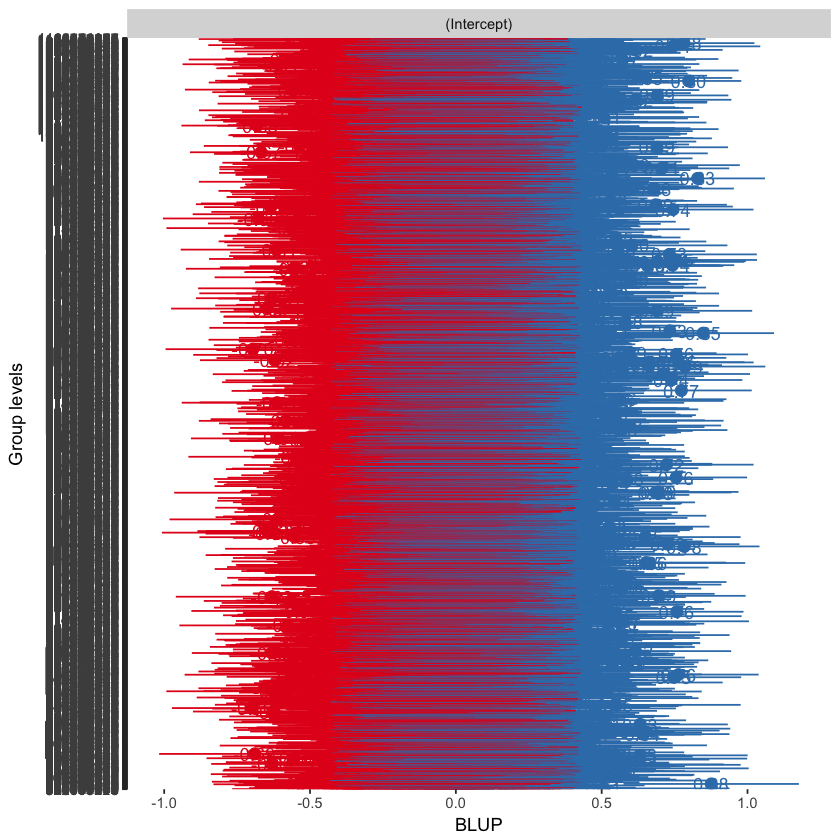

Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Адыгея' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Адыгея' in 'mbcsToSbcs': dot substituted for <90>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Адыгея' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Адыгея' in 'mbcsToSbcs': dot substituted for <b4>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Адыгея' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Адыгея' in 'mbcsToSbcs': dot substituted for <8b>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$la

“conversion failure on 'Амурская область' in 'mbcsToSbcs': dot substituted for <bc>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Амурская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Амурская область' in 'mbcsToSbcs': dot substituted for <83>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Амурская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Амурская область' in 'mbcsToSbcs': dot substituted for <80>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Амурская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“con

“conversion failure on 'Архангельская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Архангельская область' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Архангельская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Архангельская область' in 'mbcsToSbcs': dot substituted for <8f>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Архангельская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Архангельская область' in 'mbcsToSbcs': dot substituted for <be>”Warning message in grid.Call(C_textBounds, as.graphicsAn

“conversion failure on 'Астраханская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Астраханская область' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Астраханская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Астраханская область' in 'mbcsToSbcs': dot substituted for <81>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Астраханская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Астраханская область' in 'mbcsToSbcs': dot substituted for <82>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$

“conversion failure on 'Белгородская область' in 'mbcsToSbcs': dot substituted for <81>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Белгородская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Белгородская область' in 'mbcsToSbcs': dot substituted for <ba>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Белгородская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Белгородская область' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Белгородская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$

“conversion failure on 'Брянская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Брянская область' in 'mbcsToSbcs': dot substituted for <8c>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Бурятия' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Бурятия' in 'mbcsToSbcs': dot substituted for <91>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Бурятия' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Бурятия' in 'mbcsToSbcs': dot substituted for <83>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Бурятия' in 'mbc

“conversion failure on 'Владимирская область' in 'mbcsToSbcs': dot substituted for <81>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Владимирская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Владимирская область' in 'mbcsToSbcs': dot substituted for <82>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Владимирская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Владимирская область' in 'mbcsToSbcs': dot substituted for <8c>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Волгоградская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x

“conversion failure on 'Вологодская область' in 'mbcsToSbcs': dot substituted for <be>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Вологодская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Вологодская область' in 'mbcsToSbcs': dot substituted for <bb>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Вологодская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Вологодская область' in 'mbcsToSbcs': dot substituted for <be>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Вологодская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label)

“conversion failure on 'Воронежская область' in 'mbcsToSbcs': dot substituted for <81>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Воронежская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Воронежская область' in 'mbcsToSbcs': dot substituted for <ba>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Воронежская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Воронежская область' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Воронежская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label)

“conversion failure on 'Еврейская Аобл' in 'mbcsToSbcs': dot substituted for <ba>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Еврейская Аобл' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Еврейская Аобл' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Еврейская Аобл' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Еврейская Аобл' in 'mbcsToSbcs': dot substituted for <8f>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Еврейская Аобл' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion fail

“conversion failure on 'Ивановская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ивановская область' in 'mbcsToSbcs': dot substituted for <b2>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ивановская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ивановская область' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ивановская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ивановская область' in 'mbcsToSbcs': dot substituted for <bd>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x,

“conversion failure on 'Иркутская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Иркутская область' in 'mbcsToSbcs': dot substituted for <98>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Иркутская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Иркутская область' in 'mbcsToSbcs': dot substituted for <80>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Иркутская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Иркутская область' in 'mbcsToSbcs': dot substituted for <ba>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, 

“conversion failure on 'Кабардино-Балкарская' in 'mbcsToSbcs': dot substituted for <be>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Кабардино-Балкарская' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Кабардино-Балкарская' in 'mbcsToSbcs': dot substituted for <91>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Кабардино-Балкарская' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Кабардино-Балкарская' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Кабардино-Балкарская' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$

“conversion failure on 'Калининградская область' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Калининградская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Калининградская область' in 'mbcsToSbcs': dot substituted for <8f>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Калининградская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Калининградская область' in 'mbcsToSbcs': dot substituted for <be>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Калининградская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, a

“conversion failure on 'Калужская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Калужская область' in 'mbcsToSbcs': dot substituted for <8f>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Калужская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Калужская область' in 'mbcsToSbcs': dot substituted for <be>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Калужская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Калужская область' in 'mbcsToSbcs': dot substituted for <b1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, 

“conversion failure on 'Карачаево-Черкесская' in 'mbcsToSbcs': dot substituted for <80>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Карачаево-Черкесская' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Карачаево-Черкесская' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Карачаево-Черкесская' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Карачаево-Черкесская' in 'mbcsToSbcs': dot substituted for <87>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Карачаево-Черкесская' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$

“conversion failure on 'Кемеровская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Кемеровская область' in 'mbcsToSbcs': dot substituted for <b5>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Кемеровская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Кемеровская область' in 'mbcsToSbcs': dot substituted for <bc>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Кемеровская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Кемеровская область' in 'mbcsToSbcs': dot substituted for <b5>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label)

“conversion failure on 'Кировская область' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Кировская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Кировская область' in 'mbcsToSbcs': dot substituted for <8f>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Кировская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Кировская область' in 'mbcsToSbcs': dot substituted for <be>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Кировская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, 

“conversion failure on 'Костромская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Костромская область' in 'mbcsToSbcs': dot substituted for <b1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Костромская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Костромская область' in 'mbcsToSbcs': dot substituted for <bb>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Костромская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Костромская область' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label)

“conversion failure on 'Красноярский край' in 'mbcsToSbcs': dot substituted for <80>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Красноярский край' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Красноярский край' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Красноярский край' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Красноярский край' in 'mbcsToSbcs': dot substituted for <81>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Красноярский край' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, 

“conversion failure on 'Курганская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Курганская область' in 'mbcsToSbcs': dot substituted for <be>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Курганская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Курганская область' in 'mbcsToSbcs': dot substituted for <b1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Курганская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Курганская область' in 'mbcsToSbcs': dot substituted for <bb>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x,

“conversion failure on 'Ленинградская область' in 'mbcsToSbcs': dot substituted for <b8>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ленинградская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ленинградская область' in 'mbcsToSbcs': dot substituted for <bd>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ленинградская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ленинградская область' in 'mbcsToSbcs': dot substituted for <b3>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ленинградская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAn

“conversion failure on 'Липецкая область' in 'mbcsToSbcs': dot substituted for <8f>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Липецкая область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Липецкая область' in 'mbcsToSbcs': dot substituted for <be>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Липецкая область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Липецкая область' in 'mbcsToSbcs': dot substituted for <b1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Липецкая область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“con

“conversion failure on 'Магаданская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Магаданская область' in 'mbcsToSbcs': dot substituted for <8c>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Марий Эл' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Марий Эл' in 'mbcsToSbcs': dot substituted for <9c>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Марий Эл' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Марий Эл' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Марий 

“conversion failure on 'Московская область' in 'mbcsToSbcs': dot substituted for <ba>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Московская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Московская область' in 'mbcsToSbcs': dot substituted for <be>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Московская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Московская область' in 'mbcsToSbcs': dot substituted for <b2>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Московская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x,

“conversion failure on 'Мурманская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Мурманская область' in 'mbcsToSbcs': dot substituted for <b1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Мурманская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Мурманская область' in 'mbcsToSbcs': dot substituted for <bb>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Мурманская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Мурманская область' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x,

“conversion failure on 'Нижегородская область' in 'mbcsToSbcs': dot substituted for <b4>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Нижегородская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Нижегородская область' in 'mbcsToSbcs': dot substituted for <81>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Нижегородская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Нижегородская область' in 'mbcsToSbcs': dot substituted for <ba>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Нижегородская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAn

“conversion failure on 'Новгородская область' in 'mbcsToSbcs': dot substituted for <be>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Новгородская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Новгородская область' in 'mbcsToSbcs': dot substituted for <b1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Новгородская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Новгородская область' in 'mbcsToSbcs': dot substituted for <bb>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Новгородская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$

“conversion failure on 'Новосибирская область' in 'mbcsToSbcs': dot substituted for <81>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Новосибирская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Новосибирская область' in 'mbcsToSbcs': dot substituted for <82>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Новосибирская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Новосибирская область' in 'mbcsToSbcs': dot substituted for <8c>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Омская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$l

“conversion failure on 'Оренбургская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Оренбургская область' in 'mbcsToSbcs': dot substituted for <ba>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Оренбургская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Оренбургская область' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Оренбургская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Оренбургская область' in 'mbcsToSbcs': dot substituted for <8f>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$

“conversion failure on 'Орловская область' in 'mbcsToSbcs': dot substituted for <82>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Орловская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Орловская область' in 'mbcsToSbcs': dot substituted for <8c>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Пензенская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Пензенская область' in 'mbcsToSbcs': dot substituted for <9f>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Пензенская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$

“conversion failure on 'Пермский край' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Пермский край' in 'mbcsToSbcs': dot substituted for <b8>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Пермский край' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Пермский край' in 'mbcsToSbcs': dot substituted for <b9>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Пермский край' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Пермский край' in 'mbcsToSbcs': dot substituted for <ba>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on

“conversion failure on 'Псковская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Псковская область' in 'mbcsToSbcs': dot substituted for <81>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Псковская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Псковская область' in 'mbcsToSbcs': dot substituted for <ba>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Псковская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Псковская область' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, 

“conversion failure on 'Ростовская область' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ростовская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ростовская область' in 'mbcsToSbcs': dot substituted for <81>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ростовская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ростовская область' in 'mbcsToSbcs': dot substituted for <82>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ростовская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x,

“conversion failure on 'Самарская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Самарская область' in 'mbcsToSbcs': dot substituted for <81>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Самарская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Самарская область' in 'mbcsToSbcs': dot substituted for <ba>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Самарская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Самарская область' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, 

“conversion failure on 'Санкт-Петербург' in 'mbcsToSbcs': dot substituted for <b3>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Саратовская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Саратовская область' in 'mbcsToSbcs': dot substituted for <a1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Саратовская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Саратовская область' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Саратовская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$

“conversion failure on 'Саха /Якутия/' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Саха /Якутия/' in 'mbcsToSbcs': dot substituted for <83>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Саха /Якутия/' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Саха /Якутия/' in 'mbcsToSbcs': dot substituted for <82>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Саха /Якутия/' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Саха /Якутия/' in 'mbcsToSbcs': dot substituted for <b8>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on

“conversion failure on 'Свердловская область' in 'mbcsToSbcs': dot substituted for <b5>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Свердловская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Свердловская область' in 'mbcsToSbcs': dot substituted for <80>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Свердловская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Свердловская область' in 'mbcsToSbcs': dot substituted for <b4>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Свердловская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$

“conversion failure on 'Северная Осетия - Алания' in 'mbcsToSbcs': dot substituted for <8f>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Северная Осетия - Алания' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Северная Осетия - Алания' in 'mbcsToSbcs': dot substituted for <9e>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Северная Осетия - Алания' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Северная Осетия - Алания' in 'mbcsToSbcs': dot substituted for <81>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Северная Осетия - Алания' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBou

“conversion failure on 'Смоленская область' in 'mbcsToSbcs': dot substituted for <b1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Смоленская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Смоленская область' in 'mbcsToSbcs': dot substituted for <bb>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Смоленская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Смоленская область' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Смоленская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x,

“conversion failure on 'Тамбовская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Тамбовская область' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Тамбовская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Тамбовская область' in 'mbcsToSbcs': dot substituted for <bc>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Тамбовская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Тамбовская область' in 'mbcsToSbcs': dot substituted for <b1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x,

“conversion failure on 'Тверская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Тверская область' in 'mbcsToSbcs': dot substituted for <a2>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Тверская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Тверская область' in 'mbcsToSbcs': dot substituted for <b2>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Тверская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Тверская область' in 'mbcsToSbcs': dot substituted for <b5>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“con

“conversion failure on 'Томская область' in 'mbcsToSbcs': dot substituted for <bb>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Томская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Томская область' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Томская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Томская область' in 'mbcsToSbcs': dot substituted for <81>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Томская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversio

“conversion failure on 'Тюменская область' in 'mbcsToSbcs': dot substituted for <8e>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Тюменская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Тюменская область' in 'mbcsToSbcs': dot substituted for <bc>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Тюменская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Тюменская область' in 'mbcsToSbcs': dot substituted for <b5>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Тюменская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, 

“conversion failure on 'Ульяновская область' in 'mbcsToSbcs': dot substituted for <a3>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ульяновская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ульяновская область' in 'mbcsToSbcs': dot substituted for <bb>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ульяновская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ульяновская область' in 'mbcsToSbcs': dot substituted for <8c>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ульяновская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label)

“conversion failure on 'Хабаровский край' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Хабаровский край' in 'mbcsToSbcs': dot substituted for <81>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Хабаровский край' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Хабаровский край' in 'mbcsToSbcs': dot substituted for <ba>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Хабаровский край' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Хабаровский край' in 'mbcsToSbcs': dot substituted for <b8>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“con

“conversion failure on 'Ханты-Мансийский Автономный окру' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ханты-Мансийский Автономный окру' in 'mbcsToSbcs': dot substituted for <b8>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ханты-Мансийский Автономный окру' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ханты-Мансийский Автономный окру' in 'mbcsToSbcs': dot substituted for <b9>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ханты-Мансийский Автономный окру' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ханты-Мансийский Автономный окру' in 'mbcsToSbcs': dot substituted

“conversion failure on 'Челябинская область' in 'mbcsToSbcs': dot substituted for <bb>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Челябинская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Челябинская область' in 'mbcsToSbcs': dot substituted for <8f>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Челябинская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Челябинская область' in 'mbcsToSbcs': dot substituted for <b1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Челябинская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label)

“conversion failure on 'Чувашская' in 'mbcsToSbcs': dot substituted for <a7>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Чувашская' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Чувашская' in 'mbcsToSbcs': dot substituted for <83>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Чувашская' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Чувашская' in 'mbcsToSbcs': dot substituted for <b2>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Чувашская' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Чувашская' in 'mbcsToS

“conversion failure on 'Ямало-Ненецкий  АО' in 'mbcsToSbcs': dot substituted for <9d>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ямало-Ненецкий  АО' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ямало-Ненецкий  АО' in 'mbcsToSbcs': dot substituted for <b5>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ямало-Ненецкий  АО' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ямало-Ненецкий  АО' in 'mbcsToSbcs': dot substituted for <bd>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ямало-Ненецкий  АО' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x,

“conversion failure on 'Ярославская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ярославская область' in 'mbcsToSbcs': dot substituted for <81>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ярославская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ярославская область' in 'mbcsToSbcs': dot substituted for <82>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ярославская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ярославская область' in 'mbcsToSbcs': dot substituted for <8c>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label)

“conversion failure on 'Алтайский край' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Алтайский край' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Алтайский край' in 'mbcsToSbcs': dot substituted for <b9>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Амурская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Амурская область' in 'mbcsToSbcs': dot substituted for <90>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Амурская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversio

“conversion failure on 'Архангельская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Архангельская область' in 'mbcsToSbcs': dot substituted for <8c>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Архангельская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Архангельская область' in 'mbcsToSbcs': dot substituted for <81>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Архангельская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Архангельская область' in 'mbcsToSbcs': dot substituted for <ba>”Warning message in grid.Call(C_textBounds, as.graphicsAn

“conversion failure on 'Астраханская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Астраханская область' in 'mbcsToSbcs': dot substituted for <be>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Астраханская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Астраханская область' in 'mbcsToSbcs': dot substituted for <b1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Астраханская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Астраханская область' in 'mbcsToSbcs': dot substituted for <bb>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$

“conversion failure on 'Белгородская область' in 'mbcsToSbcs': dot substituted for <80>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Белгородская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Белгородская область' in 'mbcsToSbcs': dot substituted for <be>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Белгородская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Белгородская область' in 'mbcsToSbcs': dot substituted for <b4>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Белгородская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$

“conversion failure on 'Брянская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Брянская область' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Брянская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Брянская область' in 'mbcsToSbcs': dot substituted for <81>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Брянская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Брянская область' in 'mbcsToSbcs': dot substituted for <82>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“con

“conversion failure on 'Владимирская область' in 'mbcsToSbcs': dot substituted for <b1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Владимирская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Владимирская область' in 'mbcsToSbcs': dot substituted for <bb>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Владимирская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Владимирская область' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Владимирская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$

“conversion failure on 'Волгоградская область' in 'mbcsToSbcs': dot substituted for <82>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Волгоградская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Волгоградская область' in 'mbcsToSbcs': dot substituted for <8c>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Вологодская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Вологодская область' in 'mbcsToSbcs': dot substituted for <92>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Вологодская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$

“conversion failure on 'Воронежская область' in 'mbcsToSbcs': dot substituted for <bd>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Воронежская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Воронежская область' in 'mbcsToSbcs': dot substituted for <b5>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Воронежская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Воронежская область' in 'mbcsToSbcs': dot substituted for <b6>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Воронежская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label)

“conversion failure on 'Еврейская Аобл' in 'mbcsToSbcs': dot substituted for <b5>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Еврейская Аобл' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Еврейская Аобл' in 'mbcsToSbcs': dot substituted for <b9>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Еврейская Аобл' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Еврейская Аобл' in 'mbcsToSbcs': dot substituted for <81>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Еврейская Аобл' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion fail

“conversion failure on 'Забайкальский край' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Забайкальский край' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Забайкальский край' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Забайкальский край' in 'mbcsToSbcs': dot substituted for <b9>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ивановская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ивановская область' in 'mbcsToSbcs': dot substituted for <98>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x,

“conversion failure on 'Ингушетия' in 'mbcsToSbcs': dot substituted for <b5>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ингушетия' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ингушетия' in 'mbcsToSbcs': dot substituted for <82>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ингушетия' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ингушетия' in 'mbcsToSbcs': dot substituted for <b8>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ингушетия' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ингушетия' in 'mbcsToS

“conversion failure on 'Кабардино-Балкарская' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Кабардино-Балкарская' in 'mbcsToSbcs': dot substituted for <b4>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Кабардино-Балкарская' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Кабардино-Балкарская' in 'mbcsToSbcs': dot substituted for <b8>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Кабардино-Балкарская' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Кабардино-Балкарская' in 'mbcsToSbcs': dot substituted for <bd>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$

“conversion failure on 'Калининградская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Калининградская область' in 'mbcsToSbcs': dot substituted for <b4>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Калининградская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Калининградская область' in 'mbcsToSbcs': dot substituted for <81>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Калининградская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Калининградская область' in 'mbcsToSbcs': dot substituted for <ba>”Warning message in grid.Call(C_textBounds, a

“conversion failure on 'Калужская область' in 'mbcsToSbcs': dot substituted for <b6>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Калужская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Калужская область' in 'mbcsToSbcs': dot substituted for <81>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Калужская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Калужская область' in 'mbcsToSbcs': dot substituted for <ba>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Калужская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, 

“conversion failure on 'Камчатский край' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Камчатский край' in 'mbcsToSbcs': dot substituted for <b9>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Карачаево-Черкесская' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Карачаево-Черкесская' in 'mbcsToSbcs': dot substituted for <9a>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Карачаево-Черкесская' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Карачаево-Черкесская' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$

“conversion failure on 'Карелия' in 'mbcsToSbcs': dot substituted for <bb>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Карелия' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Карелия' in 'mbcsToSbcs': dot substituted for <b8>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Карелия' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Карелия' in 'mbcsToSbcs': dot substituted for <8f>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Кемеровская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Кемеровская область' i

“conversion failure on 'Кировская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Кировская область' in 'mbcsToSbcs': dot substituted for <b2>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Кировская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Кировская область' in 'mbcsToSbcs': dot substituted for <81>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Кировская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Кировская область' in 'mbcsToSbcs': dot substituted for <ba>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, 

“conversion failure on 'Костромская область' in 'mbcsToSbcs': dot substituted for <ba>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Костромская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Костромская область' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Костромская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Костромская область' in 'mbcsToSbcs': dot substituted for <8f>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Костромская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label)

“conversion failure on 'Краснодарский край' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Краснодарский край' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Краснодарский край' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Краснодарский край' in 'mbcsToSbcs': dot substituted for <b9>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Красноярский край' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Красноярский край' in 'mbcsToSbcs': dot substituted for <9a>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x

“conversion failure on 'Курганская область' in 'mbcsToSbcs': dot substituted for <81>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Курганская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Курганская область' in 'mbcsToSbcs': dot substituted for <ba>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Курганская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Курганская область' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Курганская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x,

“conversion failure on 'Ленинградская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ленинградская область' in 'mbcsToSbcs': dot substituted for <9b>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ленинградская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ленинградская область' in 'mbcsToSbcs': dot substituted for <b5>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ленинградская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ленинградская область' in 'mbcsToSbcs': dot substituted for <bd>”Warning message in grid.Call(C_textBounds, as.graphicsAn

“conversion failure on 'Липецкая область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Липецкая область' in 'mbcsToSbcs': dot substituted for <86>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Липецкая область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Липецкая область' in 'mbcsToSbcs': dot substituted for <ba>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Липецкая область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Липецкая область' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“con

“conversion failure on 'Магаданская область' in 'mbcsToSbcs': dot substituted for <bb>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Магаданская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Магаданская область' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Магаданская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Магаданская область' in 'mbcsToSbcs': dot substituted for <81>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Магаданская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label)

“conversion failure on 'Московская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Московская область' in 'mbcsToSbcs': dot substituted for <9c>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Московская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Московская область' in 'mbcsToSbcs': dot substituted for <be>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Московская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Московская область' in 'mbcsToSbcs': dot substituted for <81>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x,

“conversion failure on 'Мурманская область' in 'mbcsToSbcs': dot substituted for <ba>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Мурманская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Мурманская область' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Мурманская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Мурманская область' in 'mbcsToSbcs': dot substituted for <8f>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Мурманская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x,

“conversion failure on 'Нижегородская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Нижегородская область' in 'mbcsToSbcs': dot substituted for <be>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Нижегородская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Нижегородская область' in 'mbcsToSbcs': dot substituted for <80>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Нижегородская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Нижегородская область' in 'mbcsToSbcs': dot substituted for <be>”Warning message in grid.Call(C_textBounds, as.graphicsAn

“conversion failure on 'Новгородская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Новгородская область' in 'mbcsToSbcs': dot substituted for <ba>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Новгородская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Новгородская область' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Новгородская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Новгородская область' in 'mbcsToSbcs': dot substituted for <8f>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$

“conversion failure on 'Новосибирская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Новосибирская область' in 'mbcsToSbcs': dot substituted for <b1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Новосибирская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Новосибирская область' in 'mbcsToSbcs': dot substituted for <bb>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Новосибирская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Новосибирская область' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAn

“conversion failure on 'Оренбургская область' in 'mbcsToSbcs': dot substituted for <83>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Оренбургская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Оренбургская область' in 'mbcsToSbcs': dot substituted for <80>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Оренбургская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Оренбургская область' in 'mbcsToSbcs': dot substituted for <b3>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Оренбургская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$

“conversion failure on 'Орловская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Орловская область' in 'mbcsToSbcs': dot substituted for <bb>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Орловская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Орловская область' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Орловская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Орловская область' in 'mbcsToSbcs': dot substituted for <81>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, 

“conversion failure on 'Пермский край' in 'mbcsToSbcs': dot substituted for <80>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Пермский край' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Пермский край' in 'mbcsToSbcs': dot substituted for <bc>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Пермский край' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Пермский край' in 'mbcsToSbcs': dot substituted for <81>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Пермский край' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on

“conversion failure on 'Псковская область' in 'mbcsToSbcs': dot substituted for <81>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Псковская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Псковская область' in 'mbcsToSbcs': dot substituted for <ba>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Псковская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Псковская область' in 'mbcsToSbcs': dot substituted for <be>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Псковская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, 

“conversion failure on 'Ростовская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ростовская область' in 'mbcsToSbcs': dot substituted for <be>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ростовская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ростовская область' in 'mbcsToSbcs': dot substituted for <b1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ростовская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ростовская область' in 'mbcsToSbcs': dot substituted for <bb>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x,

“conversion failure on 'Самарская область' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Самарская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Самарская область' in 'mbcsToSbcs': dot substituted for <bc>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Самарская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Самарская область' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Самарская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, 

“conversion failure on 'Санкт-Петербург' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Санкт-Петербург' in 'mbcsToSbcs': dot substituted for <b1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Санкт-Петербург' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Санкт-Петербург' in 'mbcsToSbcs': dot substituted for <83>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Санкт-Петербург' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Санкт-Петербург' in 'mbcsToSbcs': dot substituted for <80>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversio

“conversion failure on 'Саха /Якутия/' in 'mbcsToSbcs': dot substituted for <85>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Саха /Якутия/' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Саха /Якутия/' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Саха /Якутия/' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Саха /Якутия/' in 'mbcsToSbcs': dot substituted for <af>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Саха /Якутия/' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on

“conversion failure on 'Сахалинская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Сахалинская область' in 'mbcsToSbcs': dot substituted for <8c>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Свердловская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Свердловская область' in 'mbcsToSbcs': dot substituted for <a1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Свердловская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Свердловская область' in 'mbcsToSbcs': dot substituted for <b2>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$la

“conversion failure on 'Северная Осетия - Алания' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Северная Осетия - Алания' in 'mbcsToSbcs': dot substituted for <80>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Северная Осетия - Алания' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Северная Осетия - Алания' in 'mbcsToSbcs': dot substituted for <bd>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Северная Осетия - Алания' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Северная Осетия - Алания' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBou

“conversion failure on 'Смоленская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Смоленская область' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Смоленская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Смоленская область' in 'mbcsToSbcs': dot substituted for <8f>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Смоленская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Смоленская область' in 'mbcsToSbcs': dot substituted for <be>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x,

“conversion failure on 'Ставропольский край' in 'mbcsToSbcs': dot substituted for <80>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ставропольский край' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ставропольский край' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ставропольский край' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ставропольский край' in 'mbcsToSbcs': dot substituted for <b9>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Тамбовская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label),

“conversion failure on 'Татарстан' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Татарстан' in 'mbcsToSbcs': dot substituted for <81>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Татарстан' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Татарстан' in 'mbcsToSbcs': dot substituted for <82>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Татарстан' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Татарстан' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Татарстан' in 'mbcsToS

“conversion failure on 'Томская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Томская область' in 'mbcsToSbcs': dot substituted for <8f>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Томская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Томская область' in 'mbcsToSbcs': dot substituted for <be>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Томская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Томская область' in 'mbcsToSbcs': dot substituted for <b1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversio

“conversion failure on 'Тыва' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Тыва' in 'mbcsToSbcs': dot substituted for <b2>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Тыва' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Тыва' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Тюменская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Тюменская область' in 'mbcsToSbcs': dot substituted for <a2>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Тюменская область' in 'mbc

“conversion failure on 'Удмуртская' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Удмуртская' in 'mbcsToSbcs': dot substituted for <ba>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Удмуртская' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Удмуртская' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Удмуртская' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Удмуртская' in 'mbcsToSbcs': dot substituted for <8f>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ульяновская обла

“conversion failure on 'Хабаровский край' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Хабаровский край' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Хабаровский край' in 'mbcsToSbcs': dot substituted for <80>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Хабаровский край' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Хабаровский край' in 'mbcsToSbcs': dot substituted for <be>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Хабаровский край' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“con

“conversion failure on 'Ханты-Мансийский Автономный окру' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ханты-Мансийский Автономный окру' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ханты-Мансийский Автономный окру' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ханты-Мансийский Автономный окру' in 'mbcsToSbcs': dot substituted for <bd>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ханты-Мансийский Автономный окру' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ханты-Мансийский Автономный окру' in 'mbcsToSbcs': dot substituted

“conversion failure on 'Ханты-Мансийский Автономный окру' in 'mbcsToSbcs': dot substituted for <83>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Челябинская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Челябинская область' in 'mbcsToSbcs': dot substituted for <a7>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Челябинская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Челябинская область' in 'mbcsToSbcs': dot substituted for <b5>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Челябинская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsA

“conversion failure on 'Чеченская' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Чеченская' in 'mbcsToSbcs': dot substituted for <ba>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Чеченская' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Чеченская' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Чеченская' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Чеченская' in 'mbcsToSbcs': dot substituted for <8f>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Чувашская' in 'mbcsToS

“conversion failure on 'Ямало-Ненецкий  АО' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ямало-Ненецкий  АО' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ямало-Ненецкий  АО' in 'mbcsToSbcs': dot substituted for <bb>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ямало-Ненецкий  АО' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ямало-Ненецкий  АО' in 'mbcsToSbcs': dot substituted for <be>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ямало-Ненецкий  АО' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x,

“conversion failure on 'Ярославская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ярославская область' in 'mbcsToSbcs': dot substituted for <b1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ярославская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ярославская область' in 'mbcsToSbcs': dot substituted for <bb>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ярославская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ярославская область' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label)

“conversion failure on 'Алтайский край' in 'mbcsToSbcs': dot substituted for <b9>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Алтайский край' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Алтайский край' in 'mbcsToSbcs': dot substituted for <ba>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Алтайский край' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Алтайский край' in 'mbcsToSbcs': dot substituted for <80>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Алтайский край' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion fail

“conversion failure on 'Архангельская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Архангельская область' in 'mbcsToSbcs': dot substituted for <b3>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Архангельская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Архангельская область' in 'mbcsToSbcs': dot substituted for <b5>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Архангельская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Архангельская область' in 'mbcsToSbcs': dot substituted for <bb>”Warning message in grid.Call(C_textBounds, as.graphicsAn

“conversion failure on 'Астраханская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Астраханская область' in 'mbcsToSbcs': dot substituted for <ba>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Астраханская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Астраханская область' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Астраханская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Астраханская область' in 'mbcsToSbcs': dot substituted for <8f>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$

“conversion failure on 'Белгородская область' in 'mbcsToSbcs': dot substituted for <bb>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Белгородская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Белгородская область' in 'mbcsToSbcs': dot substituted for <b3>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Белгородская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Белгородская область' in 'mbcsToSbcs': dot substituted for <be>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Белгородская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$

“conversion failure on 'Брянская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Брянская область' in 'mbcsToSbcs': dot substituted for <be>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Брянская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Брянская область' in 'mbcsToSbcs': dot substituted for <b1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Брянская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Брянская область' in 'mbcsToSbcs': dot substituted for <bb>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“con

“conversion failure on 'Владимирская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Владимирская область' in 'mbcsToSbcs': dot substituted for <8f>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Владимирская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Владимирская область' in 'mbcsToSbcs': dot substituted for <be>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Владимирская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Владимирская область' in 'mbcsToSbcs': dot substituted for <b1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$

“conversion failure on 'Волгоградская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Волгоградская область' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Волгоградская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Волгоградская область' in 'mbcsToSbcs': dot substituted for <81>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Волгоградская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Волгоградская область' in 'mbcsToSbcs': dot substituted for <82>”Warning message in grid.Call(C_textBounds, as.graphicsAn

“conversion failure on 'Воронежская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Воронежская область' in 'mbcsToSbcs': dot substituted for <80>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Воронежская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Воронежская область' in 'mbcsToSbcs': dot substituted for <be>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Воронежская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Воронежская область' in 'mbcsToSbcs': dot substituted for <bd>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label)

“conversion failure on 'Еврейская Аобл' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Еврейская Аобл' in 'mbcsToSbcs': dot substituted for <b2>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Еврейская Аобл' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Еврейская Аобл' in 'mbcsToSbcs': dot substituted for <80>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Еврейская Аобл' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Еврейская Аобл' in 'mbcsToSbcs': dot substituted for <b5>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion fail

“conversion failure on 'Забайкальский край' in 'mbcsToSbcs': dot substituted for <b9>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Забайкальский край' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Забайкальский край' in 'mbcsToSbcs': dot substituted for <ba>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Забайкальский край' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Забайкальский край' in 'mbcsToSbcs': dot substituted for <80>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Забайкальский край' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x,

“conversion failure on 'Ингушетия' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ингушетия' in 'mbcsToSbcs': dot substituted for <83>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ингушетия' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ингушетия' in 'mbcsToSbcs': dot substituted for <88>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ингушетия' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ингушетия' in 'mbcsToSbcs': dot substituted for <b5>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ингушетия' in 'mbcsToS

“conversion failure on 'Кабардино-Балкарская' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Кабардино-Балкарская' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Кабардино-Балкарская' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Кабардино-Балкарская' in 'mbcsToSbcs': dot substituted for <80>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Кабардино-Балкарская' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Кабардино-Балкарская' in 'mbcsToSbcs': dot substituted for <b4>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$

“conversion failure on 'Калининградская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Калининградская область' in 'mbcsToSbcs': dot substituted for <80>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Калининградская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Калининградская область' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Калининградская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Калининградская область' in 'mbcsToSbcs': dot substituted for <b4>”Warning message in grid.Call(C_textBounds, a

“conversion failure on 'Калужская область' in 'mbcsToSbcs': dot substituted for <bb>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Калужская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Калужская область' in 'mbcsToSbcs': dot substituted for <83>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Калужская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Калужская область' in 'mbcsToSbcs': dot substituted for <b6>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Калужская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, 

“conversion failure on 'Камчатский край' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Камчатский край' in 'mbcsToSbcs': dot substituted for <80>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Камчатский край' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Камчатский край' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Камчатский край' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Камчатский край' in 'mbcsToSbcs': dot substituted for <b9>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversio

“conversion failure on 'Карелия' in 'mbcsToSbcs': dot substituted for <80>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Карелия' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Карелия' in 'mbcsToSbcs': dot substituted for <b5>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Карелия' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Карелия' in 'mbcsToSbcs': dot substituted for <bb>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Карелия' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Карелия' in 'mbcsToSbcs': dot subs

“conversion failure on 'Кировская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Кировская область' in 'mbcsToSbcs': dot substituted for <80>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Кировская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Кировская область' in 'mbcsToSbcs': dot substituted for <be>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Кировская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Кировская область' in 'mbcsToSbcs': dot substituted for <b2>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, 

“conversion failure on 'Костромская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Костромская область' in 'mbcsToSbcs': dot substituted for <81>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Костромская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Костромская область' in 'mbcsToSbcs': dot substituted for <ba>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Костромская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Костромская область' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label)

“conversion failure on 'Краснодарский край' in 'mbcsToSbcs': dot substituted for <ba>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Краснодарский край' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Краснодарский край' in 'mbcsToSbcs': dot substituted for <80>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Краснодарский край' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Краснодарский край' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Краснодарский край' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x,

“conversion failure on 'Курганская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Курганская область' in 'mbcsToSbcs': dot substituted for <bd>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Курганская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Курганская область' in 'mbcsToSbcs': dot substituted for <81>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Курганская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Курганская область' in 'mbcsToSbcs': dot substituted for <ba>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x,

“conversion failure on 'Курская область' in 'mbcsToSbcs': dot substituted for <82>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Курская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Курская область' in 'mbcsToSbcs': dot substituted for <8c>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ленинградская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ленинградская область' in 'mbcsToSbcs': dot substituted for <9b>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ленинградская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x,

“conversion failure on 'Липецкая область' in 'mbcsToSbcs': dot substituted for <bf>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Липецкая область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Липецкая область' in 'mbcsToSbcs': dot substituted for <b5>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Липецкая область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Липецкая область' in 'mbcsToSbcs': dot substituted for <86>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Липецкая область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“con

“conversion failure on 'Магаданская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Магаданская область' in 'mbcsToSbcs': dot substituted for <b1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Магаданская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Магаданская область' in 'mbcsToSbcs': dot substituted for <bb>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Магаданская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Магаданская область' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label)

“conversion failure on 'Москва' in 'mbcsToSbcs': dot substituted for <b2>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Москва' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Москва' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Московская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Московская область' in 'mbcsToSbcs': dot substituted for <9c>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Московская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Моск

“conversion failure on 'Мурманская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Мурманская область' in 'mbcsToSbcs': dot substituted for <81>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Мурманская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Мурманская область' in 'mbcsToSbcs': dot substituted for <ba>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Мурманская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Мурманская область' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x,

“conversion failure on 'Нижегородская область' in 'mbcsToSbcs': dot substituted for <b5>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Нижегородская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Нижегородская область' in 'mbcsToSbcs': dot substituted for <b3>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Нижегородская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Нижегородская область' in 'mbcsToSbcs': dot substituted for <be>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Нижегородская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAn

“conversion failure on 'Новгородская область' in 'mbcsToSbcs': dot substituted for <b4>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Новгородская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Новгородская область' in 'mbcsToSbcs': dot substituted for <81>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Новгородская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Новгородская область' in 'mbcsToSbcs': dot substituted for <ba>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Новгородская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$

“conversion failure on 'Новосибирская область' in 'mbcsToSbcs': dot substituted for <8f>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Новосибирская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Новосибирская область' in 'mbcsToSbcs': dot substituted for <be>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Новосибирская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Новосибирская область' in 'mbcsToSbcs': dot substituted for <b1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Новосибирская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAn

“conversion failure on 'Оренбургская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Оренбургская область' in 'mbcsToSbcs': dot substituted for <b1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Оренбургская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Оренбургская область' in 'mbcsToSbcs': dot substituted for <83>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Оренбургская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Оренбургская область' in 'mbcsToSbcs': dot substituted for <80>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$

“conversion failure on 'Орловская область' in 'mbcsToSbcs': dot substituted for <be>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Орловская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Орловская область' in 'mbcsToSbcs': dot substituted for <b1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Орловская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Орловская область' in 'mbcsToSbcs': dot substituted for <bb>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Орловская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, 

“conversion failure on 'Пермский край' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Пермский край' in 'mbcsToSbcs': dot substituted for <b5>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Пермский край' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Пермский край' in 'mbcsToSbcs': dot substituted for <80>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Пермский край' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Пермский край' in 'mbcsToSbcs': dot substituted for <bc>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on

“conversion failure on 'Псковская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Псковская область' in 'mbcsToSbcs': dot substituted for <9f>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Псковская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Псковская область' in 'mbcsToSbcs': dot substituted for <81>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Псковская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Псковская область' in 'mbcsToSbcs': dot substituted for <ba>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, 

“conversion failure on 'Ростовская область' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ростовская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ростовская область' in 'mbcsToSbcs': dot substituted for <8f>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ростовская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ростовская область' in 'mbcsToSbcs': dot substituted for <be>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ростовская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x,

“conversion failure on 'Самарская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Самарская область' in 'mbcsToSbcs': dot substituted for <a1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Самарская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Самарская область' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Самарская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Самарская область' in 'mbcsToSbcs': dot substituted for <bc>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, 

“conversion failure on 'Санкт-Петербург' in 'mbcsToSbcs': dot substituted for <b5>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Санкт-Петербург' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Санкт-Петербург' in 'mbcsToSbcs': dot substituted for <80>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Санкт-Петербург' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Санкт-Петербург' in 'mbcsToSbcs': dot substituted for <b1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Санкт-Петербург' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversio

“conversion failure on 'Саха /Якутия/' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Саха /Якутия/' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Саха /Якутия/' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Саха /Якутия/' in 'mbcsToSbcs': dot substituted for <85>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Саха /Якутия/' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Саха /Якутия/' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on

“conversion failure on 'Сахалинская область' in 'mbcsToSbcs': dot substituted for <81>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Сахалинская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Сахалинская область' in 'mbcsToSbcs': dot substituted for <82>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Сахалинская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Сахалинская область' in 'mbcsToSbcs': dot substituted for <8c>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Свердловская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label

“conversion failure on 'Северная Осетия - Алания' in 'mbcsToSbcs': dot substituted for <b2>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Северная Осетия - Алания' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Северная Осетия - Алания' in 'mbcsToSbcs': dot substituted for <b5>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Северная Осетия - Алания' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Северная Осетия - Алания' in 'mbcsToSbcs': dot substituted for <80>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Северная Осетия - Алания' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBou

“conversion failure on 'Смоленская область' in 'mbcsToSbcs': dot substituted for <81>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Смоленская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Смоленская область' in 'mbcsToSbcs': dot substituted for <ba>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Смоленская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Смоленская область' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Смоленская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x,

“conversion failure on 'Ставропольский край' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ставропольский край' in 'mbcsToSbcs': dot substituted for <ba>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ставропольский край' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ставропольский край' in 'mbcsToSbcs': dot substituted for <80>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ставропольский край' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ставропольский край' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label)

“conversion failure on 'Татарстан' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Татарстан' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Татарстан' in 'mbcsToSbcs': dot substituted for <80>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Татарстан' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Татарстан' in 'mbcsToSbcs': dot substituted for <81>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Татарстан' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Татарстан' in 'mbcsToS

“conversion failure on 'Томская область' in 'mbcsToSbcs': dot substituted for <ba>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Томская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Томская область' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Томская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Томская область' in 'mbcsToSbcs': dot substituted for <8f>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Томская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversio

“conversion failure on 'Тыва' in 'mbcsToSbcs': dot substituted for <a2>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Тыва' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Тыва' in 'mbcsToSbcs': dot substituted for <8b>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Тыва' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Тыва' in 'mbcsToSbcs': dot substituted for <b2>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Тыва' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Тыва' in 'mbcsToSbcs': dot substituted for <b0>”Warn

“conversion failure on 'Удмуртская' in 'mbcsToSbcs': dot substituted for <82>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Удмуртская' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Удмуртская' in 'mbcsToSbcs': dot substituted for <81>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Удмуртская' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Удмуртская' in 'mbcsToSbcs': dot substituted for <ba>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Удмуртская' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Удмуртская' in '

“conversion failure on 'Хабаровский край' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Хабаровский край' in 'mbcsToSbcs': dot substituted for <b1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Хабаровский край' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Хабаровский край' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Хабаровский край' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Хабаровский край' in 'mbcsToSbcs': dot substituted for <80>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“con

“conversion failure on 'Ханты-Мансийский Автономный окру' in 'mbcsToSbcs': dot substituted for <8b>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ханты-Мансийский Автономный окру' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ханты-Мансийский Автономный окру' in 'mbcsToSbcs': dot substituted for <9c>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ханты-Мансийский Автономный окру' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ханты-Мансийский Автономный окру' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ханты-Мансийский Автономный окру' in 'mbcsToSbcs': dot substituted

“conversion failure on 'Ханты-Мансийский Автономный окру' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ханты-Мансийский Автономный окру' in 'mbcsToSbcs': dot substituted for <80>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ханты-Мансийский Автономный окру' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ханты-Мансийский Автономный окру' in 'mbcsToSbcs': dot substituted for <83>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Челябинская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Челябинская область' in 'mbcsToSbcs': dot substituted for <a7>”Warning message 

“conversion failure on 'Чеченская' in 'mbcsToSbcs': dot substituted for <bd>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Чеченская' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Чеченская' in 'mbcsToSbcs': dot substituted for <81>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Чеченская' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Чеченская' in 'mbcsToSbcs': dot substituted for <ba>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Чеченская' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Чеченская' in 'mbcsToS

“conversion failure on 'Ямало-Ненецкий  АО' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ямало-Ненецкий  АО' in 'mbcsToSbcs': dot substituted for <bc>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ямало-Ненецкий  АО' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ямало-Ненецкий  АО' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ямало-Ненецкий  АО' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ямало-Ненецкий  АО' in 'mbcsToSbcs': dot substituted for <bb>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x,

“conversion failure on 'Ярославская область' in 'mbcsToSbcs': dot substituted for <8f>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ярославская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ярославская область' in 'mbcsToSbcs': dot substituted for <be>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ярославская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ярославская область' in 'mbcsToSbcs': dot substituted for <b1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ярославская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label)

“conversion failure on 'Алтайский край' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Алтайский край' in 'mbcsToSbcs': dot substituted for <b8>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Алтайский край' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Алтайский край' in 'mbcsToSbcs': dot substituted for <b9>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Алтайский край' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Алтайский край' in 'mbcsToSbcs': dot substituted for <ba>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion fail

“conversion failure on 'Архангельская область' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Архангельская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Архангельская область' in 'mbcsToSbcs': dot substituted for <bd>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Архангельская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Архангельская область' in 'mbcsToSbcs': dot substituted for <b3>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Архангельская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAn

“conversion failure on 'Астраханская область' in 'mbcsToSbcs': dot substituted for <bd>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Астраханская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Астраханская область' in 'mbcsToSbcs': dot substituted for <81>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Астраханская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Астраханская область' in 'mbcsToSbcs': dot substituted for <ba>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Астраханская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$

“conversion failure on 'Белгородская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Белгородская область' in 'mbcsToSbcs': dot substituted for <b5>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Белгородская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Белгородская область' in 'mbcsToSbcs': dot substituted for <bb>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Белгородская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Белгородская область' in 'mbcsToSbcs': dot substituted for <b3>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$

“conversion failure on 'Брянская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Брянская область' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Брянская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Брянская область' in 'mbcsToSbcs': dot substituted for <8f>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Брянская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Брянская область' in 'mbcsToSbcs': dot substituted for <be>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“con

“conversion failure on 'Владимирская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Владимирская область' in 'mbcsToSbcs': dot substituted for <ba>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Владимирская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Владимирская область' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Владимирская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Владимирская область' in 'mbcsToSbcs': dot substituted for <8f>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$

“conversion failure on 'Волгоградская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Волгоградская область' in 'mbcsToSbcs': dot substituted for <b1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Волгоградская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Волгоградская область' in 'mbcsToSbcs': dot substituted for <bb>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Волгоградская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Волгоградская область' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAn

“conversion failure on 'Воронежская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Воронежская область' in 'mbcsToSbcs': dot substituted for <92>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Воронежская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Воронежская область' in 'mbcsToSbcs': dot substituted for <be>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Воронежская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Воронежская область' in 'mbcsToSbcs': dot substituted for <80>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label)

“conversion failure on 'Дагестан' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Дагестан' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Дагестан' in 'mbcsToSbcs': dot substituted for <bd>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Еврейская Аобл' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Еврейская Аобл' in 'mbcsToSbcs': dot substituted for <95>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Еврейская Аобл' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Еврейская 

“conversion failure on 'Забайкальский край' in 'mbcsToSbcs': dot substituted for <ba>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Забайкальский край' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Забайкальский край' in 'mbcsToSbcs': dot substituted for <b8>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Забайкальский край' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Забайкальский край' in 'mbcsToSbcs': dot substituted for <b9>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Забайкальский край' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x,

“conversion failure on 'Ингушетия' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ингушетия' in 'mbcsToSbcs': dot substituted for <bd>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ингушетия' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ингушетия' in 'mbcsToSbcs': dot substituted for <b3>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ингушетия' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ингушетия' in 'mbcsToSbcs': dot substituted for <83>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ингушетия' in 'mbcsToS

“conversion failure on 'Кабардино-Балкарская' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Кабардино-Балкарская' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Кабардино-Балкарская' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Кабардино-Балкарская' in 'mbcsToSbcs': dot substituted for <b1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Кабардино-Балкарская' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Кабардино-Балкарская' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$

“conversion failure on 'Калининградская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Калининградская область' in 'mbcsToSbcs': dot substituted for <bd>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Калининградская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Калининградская область' in 'mbcsToSbcs': dot substituted for <b3>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Калининградская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Калининградская область' in 'mbcsToSbcs': dot substituted for <80>”Warning message in grid.Call(C_textBounds, a

“conversion failure on 'Калужская область' in 'mbcsToSbcs': dot substituted for <9a>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Калужская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Калужская область' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Калужская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Калужская область' in 'mbcsToSbcs': dot substituted for <bb>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Калужская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, 

“conversion failure on 'Камчатский край' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Камчатский край' in 'mbcsToSbcs': dot substituted for <b9>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Камчатский край' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Камчатский край' in 'mbcsToSbcs': dot substituted for <ba>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Камчатский край' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Камчатский край' in 'mbcsToSbcs': dot substituted for <80>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversio

“conversion failure on 'Карелия' in 'mbcsToSbcs': dot substituted for <9a>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Карелия' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Карелия' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Карелия' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Карелия' in 'mbcsToSbcs': dot substituted for <80>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Карелия' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Карелия' in 'mbcsToSbcs': dot subs

“conversion failure on 'Кировская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Кировская область' in 'mbcsToSbcs': dot substituted for <9a>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Кировская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Кировская область' in 'mbcsToSbcs': dot substituted for <b8>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Кировская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Кировская область' in 'mbcsToSbcs': dot substituted for <80>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, 

“conversion failure on 'Костромская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Костромская область' in 'mbcsToSbcs': dot substituted for <be>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Костромская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Костромская область' in 'mbcsToSbcs': dot substituted for <bc>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Костромская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Костромская область' in 'mbcsToSbcs': dot substituted for <81>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label)

“conversion failure on 'Краснодарский край' in 'mbcsToSbcs': dot substituted for <b8>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Краснодарский край' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Краснодарский край' in 'mbcsToSbcs': dot substituted for <b9>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Краснодарский край' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Краснодарский край' in 'mbcsToSbcs': dot substituted for <ba>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Краснодарский край' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x,

“conversion failure on 'Курганская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Курганская область' in 'mbcsToSbcs': dot substituted for <b3>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Курганская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Курганская область' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Курганская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Курганская область' in 'mbcsToSbcs': dot substituted for <bd>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x,

“conversion failure on 'Курская область' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Курская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Курская область' in 'mbcsToSbcs': dot substituted for <81>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Курская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Курская область' in 'mbcsToSbcs': dot substituted for <82>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Курская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversio

“conversion failure on 'Липецкая область' in 'mbcsToSbcs': dot substituted for <9b>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Липецкая область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Липецкая область' in 'mbcsToSbcs': dot substituted for <b8>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Липецкая область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Липецкая область' in 'mbcsToSbcs': dot substituted for <bf>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Липецкая область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“con

“conversion failure on 'Магаданская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Магаданская область' in 'mbcsToSbcs': dot substituted for <8f>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Магаданская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Магаданская область' in 'mbcsToSbcs': dot substituted for <be>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Магаданская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Магаданская область' in 'mbcsToSbcs': dot substituted for <b1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label)

“conversion failure on 'Москва' in 'mbcsToSbcs': dot substituted for <81>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Москва' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Москва' in 'mbcsToSbcs': dot substituted for <ba>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Москва' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Москва' in 'mbcsToSbcs': dot substituted for <b2>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Москва' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Москва' in 'mbcsToSbcs': dot substituted

“conversion failure on 'Мурманская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Мурманская область' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Мурманская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Мурманская область' in 'mbcsToSbcs': dot substituted for <bd>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Мурманская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Мурманская область' in 'mbcsToSbcs': dot substituted for <81>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x,

“conversion failure on 'Нижегородская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Нижегородская область' in 'mbcsToSbcs': dot substituted for <b6>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Нижегородская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Нижегородская область' in 'mbcsToSbcs': dot substituted for <b5>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Нижегородская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Нижегородская область' in 'mbcsToSbcs': dot substituted for <b3>”Warning message in grid.Call(C_textBounds, as.graphicsAn

“conversion failure on 'Новгородская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Новгородская область' in 'mbcsToSbcs': dot substituted for <be>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Новгородская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Новгородская область' in 'mbcsToSbcs': dot substituted for <b4>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Новгородская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Новгородская область' in 'mbcsToSbcs': dot substituted for <81>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$

“conversion failure on 'Новосибирская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Новосибирская область' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Новосибирская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Новосибирская область' in 'mbcsToSbcs': dot substituted for <8f>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Новосибирская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Новосибирская область' in 'mbcsToSbcs': dot substituted for <be>”Warning message in grid.Call(C_textBounds, as.graphicsAn

“conversion failure on 'Оренбургская область' in 'mbcsToSbcs': dot substituted for <b5>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Оренбургская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Оренбургская область' in 'mbcsToSbcs': dot substituted for <bd>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Оренбургская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Оренбургская область' in 'mbcsToSbcs': dot substituted for <b1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Оренбургская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$

“conversion failure on 'Орловская область' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Орловская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Орловская область' in 'mbcsToSbcs': dot substituted for <8f>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Орловская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Орловская область' in 'mbcsToSbcs': dot substituted for <be>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Орловская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, 

“conversion failure on 'Пензенская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Пензенская область' in 'mbcsToSbcs': dot substituted for <8c>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Пермский край' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Пермский край' in 'mbcsToSbcs': dot substituted for <9f>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Пермский край' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Пермский край' in 'mbcsToSbcs': dot substituted for <b5>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion 

“conversion failure on 'Приморский край' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Приморский край' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Приморский край' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Приморский край' in 'mbcsToSbcs': dot substituted for <b9>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Псковская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Псковская область' in 'mbcsToSbcs': dot substituted for <9f>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conve

“conversion failure on 'Ростовская область' in 'mbcsToSbcs': dot substituted for <81>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ростовская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ростовская область' in 'mbcsToSbcs': dot substituted for <ba>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ростовская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ростовская область' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ростовская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x,

“conversion failure on 'Рязанская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Рязанская область' in 'mbcsToSbcs': dot substituted for <82>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Рязанская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Рязанская область' in 'mbcsToSbcs': dot substituted for <8c>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Самарская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Самарская область' in 'mbcsToSbcs': dot substituted for <a1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, 

“conversion failure on 'Санкт-Петербург' in 'mbcsToSbcs': dot substituted for <b5>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Санкт-Петербург' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Санкт-Петербург' in 'mbcsToSbcs': dot substituted for <82>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Санкт-Петербург' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Санкт-Петербург' in 'mbcsToSbcs': dot substituted for <b5>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Санкт-Петербург' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversio

“conversion failure on 'Саратовская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Саратовская область' in 'mbcsToSbcs': dot substituted for <8c>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Саха /Якутия/' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Саха /Якутия/' in 'mbcsToSbcs': dot substituted for <a1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Саха /Якутия/' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Саха /Якутия/' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversio

“conversion failure on 'Сахалинская область' in 'mbcsToSbcs': dot substituted for <bb>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Сахалинская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Сахалинская область' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Сахалинская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Сахалинская область' in 'mbcsToSbcs': dot substituted for <81>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Сахалинская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label)

“conversion failure on 'Северная Осетия - Алания' in 'mbcsToSbcs': dot substituted for <a1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Северная Осетия - Алания' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Северная Осетия - Алания' in 'mbcsToSbcs': dot substituted for <b5>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Северная Осетия - Алания' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Северная Осетия - Алания' in 'mbcsToSbcs': dot substituted for <b2>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Северная Осетия - Алания' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBou

“conversion failure on 'Смоленская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Смоленская область' in 'mbcsToSbcs': dot substituted for <b5>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Смоленская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Смоленская область' in 'mbcsToSbcs': dot substituted for <bd>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Смоленская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Смоленская область' in 'mbcsToSbcs': dot substituted for <81>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x,

“conversion failure on 'Ставропольский край' in 'mbcsToSbcs': dot substituted for <ba>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ставропольский край' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ставропольский край' in 'mbcsToSbcs': dot substituted for <b8>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ставропольский край' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ставропольский край' in 'mbcsToSbcs': dot substituted for <b9>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ставропольский край' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label)

“conversion failure on 'Татарстан' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Татарстан' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Татарстан' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Татарстан' in 'mbcsToSbcs': dot substituted for <82>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Татарстан' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Татарстан' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Татарстан' in 'mbcsToS

“conversion failure on 'Томская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Томская область' in 'mbcsToSbcs': dot substituted for <bc>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Томская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Томская область' in 'mbcsToSbcs': dot substituted for <81>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Томская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Томская область' in 'mbcsToSbcs': dot substituted for <ba>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversio

“conversion failure on 'Тульская область' in 'mbcsToSbcs': dot substituted for <81>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Тульская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Тульская область' in 'mbcsToSbcs': dot substituted for <82>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Тульская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Тульская область' in 'mbcsToSbcs': dot substituted for <8c>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Тыва' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion fail

“conversion failure on 'Удмуртская' in 'mbcsToSbcs': dot substituted for <bc>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Удмуртская' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Удмуртская' in 'mbcsToSbcs': dot substituted for <83>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Удмуртская' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Удмуртская' in 'mbcsToSbcs': dot substituted for <80>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Удмуртская' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Удмуртская' in '

“conversion failure on 'Ульяновская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ульяновская область' in 'mbcsToSbcs': dot substituted for <8c>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Хабаровский край' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Хабаровский край' in 'mbcsToSbcs': dot substituted for <a5>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Хабаровский край' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Хабаровский край' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, 

“conversion failure on 'Ханты-Мансийский Автономный окру' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ханты-Мансийский Автономный окру' in 'mbcsToSbcs': dot substituted for <bd>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ханты-Мансийский Автономный окру' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ханты-Мансийский Автономный окру' in 'mbcsToSbcs': dot substituted for <82>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ханты-Мансийский Автономный окру' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ханты-Мансийский Автономный окру' in 'mbcsToSbcs': dot substituted

“conversion failure on 'Ханты-Мансийский Автономный окру' in 'mbcsToSbcs': dot substituted for <b9>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ханты-Мансийский Автономный окру' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ханты-Мансийский Автономный окру' in 'mbcsToSbcs': dot substituted for <be>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ханты-Мансийский Автономный окру' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ханты-Мансийский Автономный окру' in 'mbcsToSbcs': dot substituted for <ba>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ханты-Мансийский Автономный окру' in 'mbcsToSbcs': dot substituted

“conversion failure on 'Чеченская' in 'mbcsToSbcs': dot substituted for <b5>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Чеченская' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Чеченская' in 'mbcsToSbcs': dot substituted for <87>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Чеченская' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Чеченская' in 'mbcsToSbcs': dot substituted for <b5>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Чеченская' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Чеченская' in 'mbcsToS

“conversion failure on 'Чукотский АО' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Чукотский АО' in 'mbcsToSbcs': dot substituted for <90>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Чукотский АО' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Чукотский АО' in 'mbcsToSbcs': dot substituted for <9e>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ямало-Ненецкий  АО' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ямало-Ненецкий  АО' in 'mbcsToSbcs': dot substituted for <af>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion fail

“conversion failure on 'Ярославская область' in 'mbcsToSbcs': dot substituted for <81>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ярославская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ярославская область' in 'mbcsToSbcs': dot substituted for <ba>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ярославская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ярославская область' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ярославская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label)

“conversion failure on 'Алтайский край' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Алтайский край' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Алтайский край' in 'mbcsToSbcs': dot substituted for <b9>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Алтайский край' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Алтайский край' in 'mbcsToSbcs': dot substituted for <81>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Алтайский край' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion fail

“conversion failure on 'Архангельская область' in 'mbcsToSbcs': dot substituted for <90>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Архангельская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Архангельская область' in 'mbcsToSbcs': dot substituted for <80>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Архангельская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Архангельская область' in 'mbcsToSbcs': dot substituted for <85>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Архангельская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAn

“conversion failure on 'Астраханская область' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Астраханская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Астраханская область' in 'mbcsToSbcs': dot substituted for <85>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Астраханская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Астраханская область' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Астраханская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$

“conversion failure on 'Башкортостан' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Башкортостан' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Башкортостан' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Башкортостан' in 'mbcsToSbcs': dot substituted for <bd>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Белгородская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Белгородская область' in 'mbcsToSbcs': dot substituted for <91>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion 

“conversion failure on 'Брянская область' in 'mbcsToSbcs': dot substituted for <bd>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Брянская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Брянская область' in 'mbcsToSbcs': dot substituted for <81>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Брянская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Брянская область' in 'mbcsToSbcs': dot substituted for <ba>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Брянская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“con

“conversion failure on 'Владимирская область' in 'mbcsToSbcs': dot substituted for <b8>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Владимирская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Владимирская область' in 'mbcsToSbcs': dot substituted for <80>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Владимирская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Владимирская область' in 'mbcsToSbcs': dot substituted for <81>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Владимирская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$

“conversion failure on 'Волгоградская область' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Волгоградская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Волгоградская область' in 'mbcsToSbcs': dot substituted for <8f>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Волгоградская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Волгоградская область' in 'mbcsToSbcs': dot substituted for <be>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Волгоградская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAn

“conversion failure on 'Вологодская область' in 'mbcsToSbcs': dot substituted for <81>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Вологодская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Вологодская область' in 'mbcsToSbcs': dot substituted for <82>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Вологодская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Вологодская область' in 'mbcsToSbcs': dot substituted for <8c>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Воронежская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label)

“conversion failure on 'Дагестан' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Дагестан' in 'mbcsToSbcs': dot substituted for <81>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Дагестан' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Дагестан' in 'mbcsToSbcs': dot substituted for <82>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Дагестан' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Дагестан' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Дагестан' in 'mbcsToSbcs': d

“conversion failure on 'Забайкальский край' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Забайкальский край' in 'mbcsToSbcs': dot substituted for <8c>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Забайкальский край' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Забайкальский край' in 'mbcsToSbcs': dot substituted for <81>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Забайкальский край' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Забайкальский край' in 'mbcsToSbcs': dot substituted for <ba>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x,

“conversion failure on 'Ивановская область' in 'mbcsToSbcs': dot substituted for <82>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ивановская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ивановская область' in 'mbcsToSbcs': dot substituted for <8c>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ингушетия' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ингушетия' in 'mbcsToSbcs': dot substituted for <98>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ингушетия' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure

“conversion failure on 'Иркутская область' in 'mbcsToSbcs': dot substituted for <82>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Иркутская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Иркутская область' in 'mbcsToSbcs': dot substituted for <8c>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Кабардино-Балкарская' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Кабардино-Балкарская' in 'mbcsToSbcs': dot substituted for <9a>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Кабардино-Балкарская' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x

“conversion failure on 'Калининградская область' in 'mbcsToSbcs': dot substituted for <b8>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Калининградская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Калининградская область' in 'mbcsToSbcs': dot substituted for <bd>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Калининградская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Калининградская область' in 'mbcsToSbcs': dot substituted for <b8>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Калининградская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, a

“conversion failure on 'Калмыкия' in 'mbcsToSbcs': dot substituted for <ba>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Калмыкия' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Калмыкия' in 'mbcsToSbcs': dot substituted for <b8>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Калмыкия' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Калмыкия' in 'mbcsToSbcs': dot substituted for <8f>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Калужская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Калужская область' 

“conversion failure on 'Камчатский край' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Камчатский край' in 'mbcsToSbcs': dot substituted for <81>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Камчатский край' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Камчатский край' in 'mbcsToSbcs': dot substituted for <ba>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Камчатский край' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Камчатский край' in 'mbcsToSbcs': dot substituted for <b8>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversio

“conversion failure on 'Карачаево-Черкесская' in 'mbcsToSbcs': dot substituted for <ba>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Карачаево-Черкесская' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Карачаево-Черкесская' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Карачаево-Черкесская' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Карачаево-Черкесская' in 'mbcsToSbcs': dot substituted for <8f>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Карелия' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, 

“conversion failure on 'Кемеровская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Кемеровская область' in 'mbcsToSbcs': dot substituted for <81>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Кемеровская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Кемеровская область' in 'mbcsToSbcs': dot substituted for <82>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Кемеровская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Кемеровская область' in 'mbcsToSbcs': dot substituted for <8c>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label)

“conversion failure on 'Костромская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Костромская область' in 'mbcsToSbcs': dot substituted for <81>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Костромская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Костромская область' in 'mbcsToSbcs': dot substituted for <82>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Костромская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Костромская область' in 'mbcsToSbcs': dot substituted for <80>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label)

“conversion failure on 'Краснодарский край' in 'mbcsToSbcs': dot substituted for <80>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Краснодарский край' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Краснодарский край' in 'mbcsToSbcs': dot substituted for <81>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Краснодарский край' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Краснодарский край' in 'mbcsToSbcs': dot substituted for <ba>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Краснодарский край' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x,

“conversion failure on 'Курганская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Курганская область' in 'mbcsToSbcs': dot substituted for <9a>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Курганская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Курганская область' in 'mbcsToSbcs': dot substituted for <83>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Курганская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Курганская область' in 'mbcsToSbcs': dot substituted for <80>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x,

“conversion failure on 'Курская область' in 'mbcsToSbcs': dot substituted for <be>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Курская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Курская область' in 'mbcsToSbcs': dot substituted for <b1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Курская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Курская область' in 'mbcsToSbcs': dot substituted for <bb>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Курская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversio

“conversion failure on 'Ленинградская область' in 'mbcsToSbcs': dot substituted for <81>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ленинградская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ленинградская область' in 'mbcsToSbcs': dot substituted for <82>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ленинградская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ленинградская область' in 'mbcsToSbcs': dot substituted for <8c>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Липецкая область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x

“conversion failure on 'Магаданская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Магаданская область' in 'mbcsToSbcs': dot substituted for <81>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Магаданская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Магаданская область' in 'mbcsToSbcs': dot substituted for <ba>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Магаданская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Магаданская область' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label)

“conversion failure on 'Мордовия' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Мордовия' in 'mbcsToSbcs': dot substituted for <8f>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Москва' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Москва' in 'mbcsToSbcs': dot substituted for <9c>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Москва' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Москва' in 'mbcsToSbcs': dot substituted for <be>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Москва' in 'mbcsToSbcs': dot substit

“conversion failure on 'Мурманская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Мурманская область' in 'mbcsToSbcs': dot substituted for <83>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Мурманская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Мурманская область' in 'mbcsToSbcs': dot substituted for <80>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Мурманская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Мурманская область' in 'mbcsToSbcs': dot substituted for <bc>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x,

“conversion failure on 'Ненецкий АО' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ненецкий АО' in 'mbcsToSbcs': dot substituted for <9e>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Нижегородская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Нижегородская область' in 'mbcsToSbcs': dot substituted for <9d>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Нижегородская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Нижегородская область' in 'mbcsToSbcs': dot substituted for <b8>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x

“conversion failure on 'Новгородская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Новгородская область' in 'mbcsToSbcs': dot substituted for <b3>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Новгородская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Новгородская область' in 'mbcsToSbcs': dot substituted for <be>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Новгородская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Новгородская область' in 'mbcsToSbcs': dot substituted for <80>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$

“conversion failure on 'Новосибирская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Новосибирская область' in 'mbcsToSbcs': dot substituted for <80>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Новосибирская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Новосибирская область' in 'mbcsToSbcs': dot substituted for <81>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Новосибирская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Новосибирская область' in 'mbcsToSbcs': dot substituted for <ba>”Warning message in grid.Call(C_textBounds, as.graphicsAn

“conversion failure on 'Омская область' in 'mbcsToSbcs': dot substituted for <8c>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Оренбургская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Оренбургская область' in 'mbcsToSbcs': dot substituted for <9e>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Оренбургская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Оренбургская область' in 'mbcsToSbcs': dot substituted for <80>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Оренбургская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label)

“conversion failure on 'Орловская область' in 'mbcsToSbcs': dot substituted for <b2>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Орловская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Орловская область' in 'mbcsToSbcs': dot substituted for <81>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Орловская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Орловская область' in 'mbcsToSbcs': dot substituted for <ba>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Орловская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, 

“conversion failure on 'Пензенская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Пензенская область' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Пензенская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Пензенская область' in 'mbcsToSbcs': dot substituted for <81>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Пензенская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Пензенская область' in 'mbcsToSbcs': dot substituted for <82>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x,

“conversion failure on 'Приморский край' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Приморский край' in 'mbcsToSbcs': dot substituted for <b9>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Приморский край' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Приморский край' in 'mbcsToSbcs': dot substituted for <ba>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Приморский край' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Приморский край' in 'mbcsToSbcs': dot substituted for <80>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversio

“conversion failure on 'Ростовская область' in 'mbcsToSbcs': dot substituted for <82>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ростовская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ростовская область' in 'mbcsToSbcs': dot substituted for <be>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ростовская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ростовская область' in 'mbcsToSbcs': dot substituted for <b2>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ростовская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x,

“conversion failure on 'Рязанская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Рязанская область' in 'mbcsToSbcs': dot substituted for <bb>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Рязанская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Рязанская область' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Рязанская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Рязанская область' in 'mbcsToSbcs': dot substituted for <81>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, 

“conversion failure on 'Санкт-Петербург' in 'mbcsToSbcs': dot substituted for <ba>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Санкт-Петербург' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Санкт-Петербург' in 'mbcsToSbcs': dot substituted for <82>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Санкт-Петербург' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Санкт-Петербург' in 'mbcsToSbcs': dot substituted for <9f>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Санкт-Петербург' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversio

“conversion failure on 'Саратовская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Саратовская область' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Саратовская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Саратовская область' in 'mbcsToSbcs': dot substituted for <81>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Саратовская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Саратовская область' in 'mbcsToSbcs': dot substituted for <82>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label)

“conversion failure on 'Сахалинская область' in 'mbcsToSbcs': dot substituted for <8f>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Сахалинская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Сахалинская область' in 'mbcsToSbcs': dot substituted for <be>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Сахалинская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Сахалинская область' in 'mbcsToSbcs': dot substituted for <b1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Сахалинская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label)

“conversion failure on 'Свердловская область' in 'mbcsToSbcs': dot substituted for <81>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Свердловская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Свердловская область' in 'mbcsToSbcs': dot substituted for <82>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Свердловская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Свердловская область' in 'mbcsToSbcs': dot substituted for <8c>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Северная Осетия - Алания' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnno

“conversion failure on 'Смоленская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Смоленская область' in 'mbcsToSbcs': dot substituted for <bc>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Смоленская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Смоленская область' in 'mbcsToSbcs': dot substituted for <be>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Смоленская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Смоленская область' in 'mbcsToSbcs': dot substituted for <bb>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x,

“conversion failure on 'Ставропольский край' in 'mbcsToSbcs': dot substituted for <bb>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ставропольский край' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ставропольский край' in 'mbcsToSbcs': dot substituted for <8c>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ставропольский край' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ставропольский край' in 'mbcsToSbcs': dot substituted for <81>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ставропольский край' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label)

“conversion failure on 'Тамбовская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Тамбовская область' in 'mbcsToSbcs': dot substituted for <82>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Тамбовская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Тамбовская область' in 'mbcsToSbcs': dot substituted for <8c>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Татарстан' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Татарстан' in 'mbcsToSbcs': dot substituted for <a2>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversio

“conversion failure on 'Тверская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Тверская область' in 'mbcsToSbcs': dot substituted for <8c>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Томская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Томская область' in 'mbcsToSbcs': dot substituted for <a2>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Томская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Томская область' in 'mbcsToSbcs': dot substituted for <be>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“convers

“conversion failure on 'Тульская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Тульская область' in 'mbcsToSbcs': dot substituted for <bb>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Тульская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Тульская область' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Тульская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Тульская область' in 'mbcsToSbcs': dot substituted for <81>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“con

“conversion failure on 'Удмуртская' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Удмуртская' in 'mbcsToSbcs': dot substituted for <a3>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Удмуртская' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Удмуртская' in 'mbcsToSbcs': dot substituted for <b4>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Удмуртская' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Удмуртская' in 'mbcsToSbcs': dot substituted for <bc>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Удмуртская' in '

“conversion failure on 'Ульяновская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ульяновская область' in 'mbcsToSbcs': dot substituted for <81>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ульяновская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ульяновская область' in 'mbcsToSbcs': dot substituted for <82>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ульяновская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ульяновская область' in 'mbcsToSbcs': dot substituted for <8c>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label)

“conversion failure on 'Ханты-Мансийский Автономный окру' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ханты-Мансийский Автономный окру' in 'mbcsToSbcs': dot substituted for <a5>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ханты-Мансийский Автономный окру' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ханты-Мансийский Автономный окру' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ханты-Мансийский Автономный окру' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ханты-Мансийский Автономный окру' in 'mbcsToSbcs': dot substituted

“conversion failure on 'Ханты-Мансийский Автономный окру' in 'mbcsToSbcs': dot substituted for <bd>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ханты-Мансийский Автономный окру' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ханты-Мансийский Автономный окру' in 'mbcsToSbcs': dot substituted for <8b>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ханты-Мансийский Автономный окру' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ханты-Мансийский Автономный окру' in 'mbcsToSbcs': dot substituted for <b9>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ханты-Мансийский Автономный окру' in 'mbcsToSbcs': dot substituted

“conversion failure on 'Челябинская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Челябинская область' in 'mbcsToSbcs': dot substituted for <8c>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Чеченская' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Чеченская' in 'mbcsToSbcs': dot substituted for <a7>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Чеченская' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Чеченская' in 'mbcsToSbcs': dot substituted for <b5>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Че

“conversion failure on 'Чукотский АО' in 'mbcsToSbcs': dot substituted for <ba>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Чукотский АО' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Чукотский АО' in 'mbcsToSbcs': dot substituted for <b8>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Чукотский АО' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Чукотский АО' in 'mbcsToSbcs': dot substituted for <b9>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Чукотский АО' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Чуко

“conversion failure on 'Ярославская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ярославская область' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ярославская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ярославская область' in 'mbcsToSbcs': dot substituted for <b2>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ярославская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ярославская область' in 'mbcsToSbcs': dot substituted for <81>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label)

“conversion failure on 'Алтайский край' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Алтайский край' in 'mbcsToSbcs': dot substituted for <bb>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Алтайский край' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Алтайский край' in 'mbcsToSbcs': dot substituted for <82>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Алтайский край' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Алтайский край' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion fail

“conversion failure on 'Амурская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Амурская область' in 'mbcsToSbcs': dot substituted for <82>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Амурская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Амурская область' in 'mbcsToSbcs': dot substituted for <8c>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Архангельская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Архангельская область' in 'mbcsToSbcs': dot substituted for <90>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x

“conversion failure on 'Астраханская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Астраханская область' in 'mbcsToSbcs': dot substituted for <82>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Астраханская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Астраханская область' in 'mbcsToSbcs': dot substituted for <80>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Астраханская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Астраханская область' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$

“conversion failure on 'Башкортостан' in 'mbcsToSbcs': dot substituted for <be>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Башкортостан' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Башкортостан' in 'mbcsToSbcs': dot substituted for <81>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Башкортостан' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Башкортостан' in 'mbcsToSbcs': dot substituted for <82>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Башкортостан' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Башк

“conversion failure on 'Брянская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Брянская область' in 'mbcsToSbcs': dot substituted for <80>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Брянская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Брянская область' in 'mbcsToSbcs': dot substituted for <8f>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Брянская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Брянская область' in 'mbcsToSbcs': dot substituted for <bd>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“con

“conversion failure on 'Владимирская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Владимирская область' in 'mbcsToSbcs': dot substituted for <b8>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Владимирская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Владимирская область' in 'mbcsToSbcs': dot substituted for <bc>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Владимирская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Владимирская область' in 'mbcsToSbcs': dot substituted for <b8>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$

“conversion failure on 'Волгоградская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Волгоградская область' in 'mbcsToSbcs': dot substituted for <81>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Волгоградская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Волгоградская область' in 'mbcsToSbcs': dot substituted for <ba>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Волгоградская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Волгоградская область' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAn

“conversion failure on 'Вологодская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Вологодская область' in 'mbcsToSbcs': dot substituted for <bb>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Вологодская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Вологодская область' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Вологодская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Вологодская область' in 'mbcsToSbcs': dot substituted for <81>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label)

“conversion failure on 'Дагестан' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Дагестан' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Дагестан' in 'mbcsToSbcs': dot substituted for <b3>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Дагестан' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Дагестан' in 'mbcsToSbcs': dot substituted for <b5>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Дагестан' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Дагестан' in 'mbcsToSbcs': d

“conversion failure on 'Забайкальский край' in 'mbcsToSbcs': dot substituted for <ba>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Забайкальский край' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Забайкальский край' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Забайкальский край' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Забайкальский край' in 'mbcsToSbcs': dot substituted for <bb>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Забайкальский край' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x,

“conversion failure on 'Ивановская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ивановская область' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ивановская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ивановская область' in 'mbcsToSbcs': dot substituted for <81>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ивановская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ивановская область' in 'mbcsToSbcs': dot substituted for <82>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x,

“conversion failure on 'Иркутская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Иркутская область' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Иркутская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Иркутская область' in 'mbcsToSbcs': dot substituted for <81>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Иркутская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Иркутская область' in 'mbcsToSbcs': dot substituted for <82>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, 

“conversion failure on 'Калининградская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Калининградская область' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Калининградская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Калининградская область' in 'mbcsToSbcs': dot substituted for <bb>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Калининградская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Калининградская область' in 'mbcsToSbcs': dot substituted for <b8>”Warning message in grid.Call(C_textBounds, a

“conversion failure on 'Калмыкия' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Калмыкия' in 'mbcsToSbcs': dot substituted for <bc>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Калмыкия' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Калмыкия' in 'mbcsToSbcs': dot substituted for <8b>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Калмыкия' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Калмыкия' in 'mbcsToSbcs': dot substituted for <ba>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Калмыкия' in 'mbcsToSbcs': d

“conversion failure on 'Камчатский край' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Камчатский край' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Камчатский край' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Камчатский край' in 'mbcsToSbcs': dot substituted for <82>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Камчатский край' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Камчатский край' in 'mbcsToSbcs': dot substituted for <81>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversio

“conversion failure on 'Карачаево-Черкесская' in 'mbcsToSbcs': dot substituted for <81>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Карачаево-Черкесская' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Карачаево-Черкесская' in 'mbcsToSbcs': dot substituted for <81>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Карачаево-Черкесская' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Карачаево-Черкесская' in 'mbcsToSbcs': dot substituted for <ba>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Карачаево-Черкесская' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$

“conversion failure on 'Кемеровская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Кемеровская область' in 'mbcsToSbcs': dot substituted for <bb>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Кемеровская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Кемеровская область' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Кемеровская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Кемеровская область' in 'mbcsToSbcs': dot substituted for <81>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label)

“conversion failure on 'Костромская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Костромская область' in 'mbcsToSbcs': dot substituted for <9a>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Костромская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Костромская область' in 'mbcsToSbcs': dot substituted for <be>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Костромская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Костромская область' in 'mbcsToSbcs': dot substituted for <81>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label)

“conversion failure on 'Краснодарский край' in 'mbcsToSbcs': dot substituted for <b4>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Краснодарский край' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Краснодарский край' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Краснодарский край' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Краснодарский край' in 'mbcsToSbcs': dot substituted for <80>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Краснодарский край' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x,

“conversion failure on 'Красноярский край' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Красноярский край' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Красноярский край' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Красноярский край' in 'mbcsToSbcs': dot substituted for <b9>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Курганская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Курганская область' in 'mbcsToSbcs': dot substituted for <9a>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y

“conversion failure on 'Курская область' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Курская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Курская область' in 'mbcsToSbcs': dot substituted for <8f>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Курская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Курская область' in 'mbcsToSbcs': dot substituted for <be>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Курская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversio

“conversion failure on 'Ленинградская область' in 'mbcsToSbcs': dot substituted for <bb>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ленинградская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ленинградская область' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ленинградская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ленинградская область' in 'mbcsToSbcs': dot substituted for <81>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ленинградская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAn

“conversion failure on 'Магаданская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Магаданская область' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Магаданская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Магаданская область' in 'mbcsToSbcs': dot substituted for <bd>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Магаданская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Магаданская область' in 'mbcsToSbcs': dot substituted for <81>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label)

“conversion failure on 'Мордовия' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Мордовия' in 'mbcsToSbcs': dot substituted for <b2>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Мордовия' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Мордовия' in 'mbcsToSbcs': dot substituted for <b8>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Мордовия' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Мордовия' in 'mbcsToSbcs': dot substituted for <8f>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Москва' in 'mbcsToSbcs': dot

“conversion failure on 'Московская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Московская область' in 'mbcsToSbcs': dot substituted for <8c>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Мурманская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Мурманская область' in 'mbcsToSbcs': dot substituted for <9c>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Мурманская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Мурманская область' in 'mbcsToSbcs': dot substituted for <83>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x,

“conversion failure on 'Ненецкий АО' in 'mbcsToSbcs': dot substituted for <b8>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ненецкий АО' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ненецкий АО' in 'mbcsToSbcs': dot substituted for <b9>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ненецкий АО' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ненецкий АО' in 'mbcsToSbcs': dot substituted for <90>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ненецкий АО' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ненецкий А

“conversion failure on 'Новгородская область' in 'mbcsToSbcs': dot substituted for <9d>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Новгородская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Новгородская область' in 'mbcsToSbcs': dot substituted for <be>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Новгородская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Новгородская область' in 'mbcsToSbcs': dot substituted for <b2>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Новгородская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$

“conversion failure on 'Новосибирская область' in 'mbcsToSbcs': dot substituted for <b8>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Новосибирская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Новосибирская область' in 'mbcsToSbcs': dot substituted for <b1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Новосибирская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Новосибирская область' in 'mbcsToSbcs': dot substituted for <b8>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Новосибирская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAn

“conversion failure on 'Омская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Омская область' in 'mbcsToSbcs': dot substituted for <81>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Омская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Омская область' in 'mbcsToSbcs': dot substituted for <82>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Омская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Омская область' in 'mbcsToSbcs': dot substituted for <8c>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion fail

“conversion failure on 'Орловская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Орловская область' in 'mbcsToSbcs': dot substituted for <bb>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Орловская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Орловская область' in 'mbcsToSbcs': dot substituted for <be>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Орловская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Орловская область' in 'mbcsToSbcs': dot substituted for <b2>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, 

“conversion failure on 'Пензенская область' in 'mbcsToSbcs': dot substituted for <be>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Пензенская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Пензенская область' in 'mbcsToSbcs': dot substituted for <b1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Пензенская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Пензенская область' in 'mbcsToSbcs': dot substituted for <bb>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Пензенская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x,

“conversion failure on 'Приморский край' in 'mbcsToSbcs': dot substituted for <81>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Приморский край' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Приморский край' in 'mbcsToSbcs': dot substituted for <ba>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Приморский край' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Приморский край' in 'mbcsToSbcs': dot substituted for <b8>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Приморский край' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversio

“conversion failure on 'Ростовская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ростовская область' in 'mbcsToSbcs': dot substituted for <be>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ростовская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ростовская область' in 'mbcsToSbcs': dot substituted for <81>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ростовская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ростовская область' in 'mbcsToSbcs': dot substituted for <82>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x,

“conversion failure on 'Рязанская область' in 'mbcsToSbcs': dot substituted for <8f>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Рязанская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Рязанская область' in 'mbcsToSbcs': dot substituted for <be>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Рязанская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Рязанская область' in 'mbcsToSbcs': dot substituted for <b1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Рязанская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, 

“conversion failure on 'Санкт-Петербург' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Санкт-Петербург' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Санкт-Петербург' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Санкт-Петербург' in 'mbcsToSbcs': dot substituted for <bd>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Санкт-Петербург' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Санкт-Петербург' in 'mbcsToSbcs': dot substituted for <ba>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversio

“conversion failure on 'Саратовская область' in 'mbcsToSbcs': dot substituted for <be>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Саратовская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Саратовская область' in 'mbcsToSbcs': dot substituted for <b1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Саратовская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Саратовская область' in 'mbcsToSbcs': dot substituted for <bb>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Саратовская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label)

“conversion failure on 'Сахалинская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Сахалинская область' in 'mbcsToSbcs': dot substituted for <ba>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Сахалинская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Сахалинская область' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Сахалинская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Сахалинская область' in 'mbcsToSbcs': dot substituted for <8f>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label)

“conversion failure on 'Свердловская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Свердловская область' in 'mbcsToSbcs': dot substituted for <bb>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Свердловская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Свердловская область' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Свердловская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Свердловская область' in 'mbcsToSbcs': dot substituted for <81>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$

“conversion failure on 'Северная Осетия - Алания' in 'mbcsToSbcs': dot substituted for <b8>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Северная Осетия - Алания' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Северная Осетия - Алания' in 'mbcsToSbcs': dot substituted for <8f>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Смоленская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Смоленская область' in 'mbcsToSbcs': dot substituted for <a1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Смоленская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAn

“conversion failure on 'Ставропольский край' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ставропольский край' in 'mbcsToSbcs': dot substituted for <bf>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ставропольский край' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ставропольский край' in 'mbcsToSbcs': dot substituted for <be>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ставропольский край' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ставропольский край' in 'mbcsToSbcs': dot substituted for <bb>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label)

“conversion failure on 'Тамбовская область' in 'mbcsToSbcs': dot substituted for <bb>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Тамбовская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Тамбовская область' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Тамбовская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Тамбовская область' in 'mbcsToSbcs': dot substituted for <81>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Тамбовская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x,

“conversion failure on 'Тверская область' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Тверская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Тверская область' in 'mbcsToSbcs': dot substituted for <81>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Тверская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Тверская область' in 'mbcsToSbcs': dot substituted for <82>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Тверская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“con

“conversion failure on 'Тульская область' in 'mbcsToSbcs': dot substituted for <8f>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Тульская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Тульская область' in 'mbcsToSbcs': dot substituted for <be>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Тульская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Тульская область' in 'mbcsToSbcs': dot substituted for <b1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Тульская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“con

“conversion failure on 'Тюменская область' in 'mbcsToSbcs': dot substituted for <81>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Тюменская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Тюменская область' in 'mbcsToSbcs': dot substituted for <82>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Тюменская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Тюменская область' in 'mbcsToSbcs': dot substituted for <8c>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Удмуртская' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conv

“conversion failure on 'Ульяновская область' in 'mbcsToSbcs': dot substituted for <b1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ульяновская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ульяновская область' in 'mbcsToSbcs': dot substituted for <bb>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ульяновская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ульяновская область' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ульяновская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label)

“conversion failure on 'Хакасия' in 'mbcsToSbcs': dot substituted for <81>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Хакасия' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Хакасия' in 'mbcsToSbcs': dot substituted for <b8>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Хакасия' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Хакасия' in 'mbcsToSbcs': dot substituted for <8f>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ханты-Мансийский Автономный окру' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ханты-Ман

“conversion failure on 'Ханты-Мансийский Автономный окру' in 'mbcsToSbcs': dot substituted for <be>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ханты-Мансийский Автономный окру' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ханты-Мансийский Автономный окру' in 'mbcsToSbcs': dot substituted for <bc>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ханты-Мансийский Автономный окру' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ханты-Мансийский Автономный окру' in 'mbcsToSbcs': dot substituted for <bd>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ханты-Мансийский Автономный окру' in 'mbcsToSbcs': dot substituted

“conversion failure on 'Челябинская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Челябинская область' in 'mbcsToSbcs': dot substituted for <81>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Челябинская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Челябинская область' in 'mbcsToSbcs': dot substituted for <82>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Челябинская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Челябинская область' in 'mbcsToSbcs': dot substituted for <8c>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label)

“conversion failure on 'Чукотский АО' in 'mbcsToSbcs': dot substituted for <82>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Чукотский АО' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Чукотский АО' in 'mbcsToSbcs': dot substituted for <81>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Чукотский АО' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Чукотский АО' in 'mbcsToSbcs': dot substituted for <ba>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Чукотский АО' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Чуко

“conversion failure on 'Ярославская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ярославская область' in 'mbcsToSbcs': dot substituted for <81>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ярославская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ярославская область' in 'mbcsToSbcs': dot substituted for <bb>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ярославская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ярославская область' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label)

“conversion failure on 'Алтай' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Алтай' in 'mbcsToSbcs': dot substituted for <b9>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Алтайский край' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Алтайский край' in 'mbcsToSbcs': dot substituted for <90>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Алтайский край' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Алтайский край' in 'mbcsToSbcs': dot substituted for <bb>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Алтайский 

“conversion failure on 'Амурская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Амурская область' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Амурская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Амурская область' in 'mbcsToSbcs': dot substituted for <81>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Амурская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Амурская область' in 'mbcsToSbcs': dot substituted for <82>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“con

“conversion failure on 'Астраханская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Астраханская область' in 'mbcsToSbcs': dot substituted for <90>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Астраханская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Астраханская область' in 'mbcsToSbcs': dot substituted for <81>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Астраханская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Астраханская область' in 'mbcsToSbcs': dot substituted for <82>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$

“conversion failure on 'Башкортостан' in 'mbcsToSbcs': dot substituted for <80>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Башкортостан' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Башкортостан' in 'mbcsToSbcs': dot substituted for <82>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Башкортостан' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Башкортостан' in 'mbcsToSbcs': dot substituted for <be>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Башкортостан' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Башк

“conversion failure on 'Белгородская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Белгородская область' in 'mbcsToSbcs': dot substituted for <8c>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Брянская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Брянская область' in 'mbcsToSbcs': dot substituted for <91>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Брянская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Брянская область' in 'mbcsToSbcs': dot substituted for <80>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y

“conversion failure on 'Владимирская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Владимирская область' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Владимирская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Владимирская область' in 'mbcsToSbcs': dot substituted for <b4>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Владимирская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Владимирская область' in 'mbcsToSbcs': dot substituted for <b8>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$

“conversion failure on 'Волгоградская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Волгоградская область' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Волгоградская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Волгоградская область' in 'mbcsToSbcs': dot substituted for <b4>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Волгоградская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Волгоградская область' in 'mbcsToSbcs': dot substituted for <81>”Warning message in grid.Call(C_textBounds, as.graphicsAn

“conversion failure on 'Вологодская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Вологодская область' in 'mbcsToSbcs': dot substituted for <be>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Вологодская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Вологодская область' in 'mbcsToSbcs': dot substituted for <b1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Вологодская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Вологодская область' in 'mbcsToSbcs': dot substituted for <bb>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label)

“conversion failure on 'Воронежская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Воронежская область' in 'mbcsToSbcs': dot substituted for <8c>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Дагестан' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Дагестан' in 'mbcsToSbcs': dot substituted for <94>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Дагестан' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Дагестан' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Дагест

“conversion failure on 'Забайкальский край' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Забайкальский край' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Забайкальский край' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Забайкальский край' in 'mbcsToSbcs': dot substituted for <b9>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Забайкальский край' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Забайкальский край' in 'mbcsToSbcs': dot substituted for <ba>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x,

“conversion failure on 'Ивановская область' in 'mbcsToSbcs': dot substituted for <be>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ивановская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ивановская область' in 'mbcsToSbcs': dot substituted for <b1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ивановская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ивановская область' in 'mbcsToSbcs': dot substituted for <bb>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ивановская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x,

“conversion failure on 'Иркутская область' in 'mbcsToSbcs': dot substituted for <be>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Иркутская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Иркутская область' in 'mbcsToSbcs': dot substituted for <b1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Иркутская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Иркутская область' in 'mbcsToSbcs': dot substituted for <bb>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Иркутская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, 

“conversion failure on 'Кабардино-Балкарская' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Кабардино-Балкарская' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Кабардино-Балкарская' in 'mbcsToSbcs': dot substituted for <8f>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Калининградская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Калининградская область' in 'mbcsToSbcs': dot substituted for <9a>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Калининградская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphic

“conversion failure on 'Калмыкия' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Калмыкия' in 'mbcsToSbcs': dot substituted for <9a>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Калмыкия' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Калмыкия' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Калмыкия' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Калмыкия' in 'mbcsToSbcs': dot substituted for <bb>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Калмыкия' in 'mbcsToSbcs': d

“conversion failure on 'Камчатский край' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Камчатский край' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Камчатский край' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Камчатский край' in 'mbcsToSbcs': dot substituted for <bc>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Камчатский край' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Камчатский край' in 'mbcsToSbcs': dot substituted for <87>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversio

“conversion failure on 'Карачаево-Черкесская' in 'mbcsToSbcs': dot substituted for <80>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Карачаево-Черкесская' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Карачаево-Черкесская' in 'mbcsToSbcs': dot substituted for <ba>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Карачаево-Черкесская' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Карачаево-Черкесская' in 'mbcsToSbcs': dot substituted for <b5>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Карачаево-Черкесская' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$

“conversion failure on 'Кемеровская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Кемеровская область' in 'mbcsToSbcs': dot substituted for <8f>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Кемеровская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Кемеровская область' in 'mbcsToSbcs': dot substituted for <be>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Кемеровская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Кемеровская область' in 'mbcsToSbcs': dot substituted for <b1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label)

“conversion failure on 'Коми' in 'mbcsToSbcs': dot substituted for <9a>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Коми' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Коми' in 'mbcsToSbcs': dot substituted for <be>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Коми' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Коми' in 'mbcsToSbcs': dot substituted for <bc>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Коми' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Коми' in 'mbcsToSbcs': dot substituted for <b8>”Warn

“conversion failure on 'Краснодарский край' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Краснодарский край' in 'mbcsToSbcs': dot substituted for <81>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Краснодарский край' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Краснодарский край' in 'mbcsToSbcs': dot substituted for <bd>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Краснодарский край' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Краснодарский край' in 'mbcsToSbcs': dot substituted for <be>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x,

“conversion failure on 'Красноярский край' in 'mbcsToSbcs': dot substituted for <b8>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Красноярский край' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Красноярский край' in 'mbcsToSbcs': dot substituted for <b9>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Красноярский край' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Красноярский край' in 'mbcsToSbcs': dot substituted for <ba>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Красноярский край' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, 

“conversion failure on 'Курская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Курская область' in 'mbcsToSbcs': dot substituted for <80>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Курская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Курская область' in 'mbcsToSbcs': dot substituted for <81>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Курская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Курская область' in 'mbcsToSbcs': dot substituted for <ba>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversio

“conversion failure on 'Ленинградская область' in 'mbcsToSbcs': dot substituted for <8f>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ленинградская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ленинградская область' in 'mbcsToSbcs': dot substituted for <be>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ленинградская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ленинградская область' in 'mbcsToSbcs': dot substituted for <b1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ленинградская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAn

“conversion failure on 'Магаданская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Магаданская область' in 'mbcsToSbcs': dot substituted for <b3>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Магаданская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Магаданская область' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Магаданская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Магаданская область' in 'mbcsToSbcs': dot substituted for <b4>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label)

“conversion failure on 'Мордовия' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Мордовия' in 'mbcsToSbcs': dot substituted for <80>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Мордовия' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Мордовия' in 'mbcsToSbcs': dot substituted for <b4>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Мордовия' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Мордовия' in 'mbcsToSbcs': dot substituted for <be>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Мордовия' in 'mbcsToSbcs': d

“conversion failure on 'Московская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Московская область' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Московская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Московская область' in 'mbcsToSbcs': dot substituted for <81>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Московская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Московская область' in 'mbcsToSbcs': dot substituted for <82>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x,

“conversion failure on 'Ненецкий АО' in 'mbcsToSbcs': dot substituted for <b5>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ненецкий АО' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ненецкий АО' in 'mbcsToSbcs': dot substituted for <86>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ненецкий АО' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ненецкий АО' in 'mbcsToSbcs': dot substituted for <ba>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ненецкий АО' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ненецкий А

“conversion failure on 'Нижегородская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Нижегородская область' in 'mbcsToSbcs': dot substituted for <82>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Нижегородская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Нижегородская область' in 'mbcsToSbcs': dot substituted for <8c>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Новгородская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Новгородская область' in 'mbcsToSbcs': dot substituted for <9d>”Warning message in grid.Call(C_textBounds, as.graphicsAnno

“conversion failure on 'Новосибирская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Новосибирская область' in 'mbcsToSbcs': dot substituted for <be>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Новосибирская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Новосибирская область' in 'mbcsToSbcs': dot substituted for <81>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Новосибирская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Новосибирская область' in 'mbcsToSbcs': dot substituted for <b8>”Warning message in grid.Call(C_textBounds, as.graphicsAn

“conversion failure on 'Омская область' in 'mbcsToSbcs': dot substituted for <b1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Омская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Омская область' in 'mbcsToSbcs': dot substituted for <bb>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Омская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Омская область' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Омская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion fail

“conversion failure on 'Орловская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Орловская область' in 'mbcsToSbcs': dot substituted for <9e>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Орловская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Орловская область' in 'mbcsToSbcs': dot substituted for <80>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Орловская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Орловская область' in 'mbcsToSbcs': dot substituted for <bb>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, 

“conversion failure on 'Пензенская область' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Пензенская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Пензенская область' in 'mbcsToSbcs': dot substituted for <8f>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Пензенская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Пензенская область' in 'mbcsToSbcs': dot substituted for <be>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Пензенская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x,

“conversion failure on 'Приморский край' in 'mbcsToSbcs': dot substituted for <be>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Приморский край' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Приморский край' in 'mbcsToSbcs': dot substituted for <80>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Приморский край' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Приморский край' in 'mbcsToSbcs': dot substituted for <81>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Приморский край' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversio

“conversion failure on 'Псковская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Псковская область' in 'mbcsToSbcs': dot substituted for <8c>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ростовская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ростовская область' in 'mbcsToSbcs': dot substituted for <a0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ростовская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ростовская область' in 'mbcsToSbcs': dot substituted for <be>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x

“conversion failure on 'Рязанская область' in 'mbcsToSbcs': dot substituted for <ba>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Рязанская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Рязанская область' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Рязанская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Рязанская область' in 'mbcsToSbcs': dot substituted for <8f>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Рязанская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, 

“conversion failure on 'Самарская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Самарская область' in 'mbcsToSbcs': dot substituted for <8c>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Санкт-Петербург' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Санкт-Петербург' in 'mbcsToSbcs': dot substituted for <a1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Санкт-Петербург' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Санкт-Петербург' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conve

“conversion failure on 'Саратовская область' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Саратовская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Саратовская область' in 'mbcsToSbcs': dot substituted for <8f>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Саратовская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Саратовская область' in 'mbcsToSbcs': dot substituted for <be>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Саратовская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label)

“conversion failure on 'Сахалинская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Сахалинская область' in 'mbcsToSbcs': dot substituted for <bd>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Сахалинская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Сахалинская область' in 'mbcsToSbcs': dot substituted for <81>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Сахалинская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Сахалинская область' in 'mbcsToSbcs': dot substituted for <ba>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label)

“conversion failure on 'Свердловская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Свердловская область' in 'mbcsToSbcs': dot substituted for <be>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Свердловская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Свердловская область' in 'mbcsToSbcs': dot substituted for <b1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Свердловская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Свердловская область' in 'mbcsToSbcs': dot substituted for <bb>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$

“conversion failure on 'Северная Осетия - Алания' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Северная Осетия - Алания' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Северная Осетия - Алания' in 'mbcsToSbcs': dot substituted for <bd>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Северная Осетия - Алания' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Северная Осетия - Алания' in 'mbcsToSbcs': dot substituted for <b8>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Северная Осетия - Алания' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBou

“conversion failure on 'Ставропольский край' in 'mbcsToSbcs': dot substituted for <b2>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ставропольский край' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ставропольский край' in 'mbcsToSbcs': dot substituted for <80>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ставропольский край' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ставропольский край' in 'mbcsToSbcs': dot substituted for <be>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ставропольский край' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label)

“conversion failure on 'Тамбовская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Тамбовская область' in 'mbcsToSbcs': dot substituted for <be>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Тамбовская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Тамбовская область' in 'mbcsToSbcs': dot substituted for <b1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Тамбовская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Тамбовская область' in 'mbcsToSbcs': dot substituted for <bb>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x,

“conversion failure on 'Тверская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Тверская область' in 'mbcsToSbcs': dot substituted for <b1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Тверская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Тверская область' in 'mbcsToSbcs': dot substituted for <bb>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Тверская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Тверская область' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“con

“conversion failure on 'Тульская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Тульская область' in 'mbcsToSbcs': dot substituted for <ba>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Тульская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Тульская область' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Тульская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Тульская область' in 'mbcsToSbcs': dot substituted for <8f>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“con

“conversion failure on 'Тюменская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Тюменская область' in 'mbcsToSbcs': dot substituted for <bb>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Тюменская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Тюменская область' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Тюменская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Тюменская область' in 'mbcsToSbcs': dot substituted for <81>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, 

“conversion failure on 'Ульяновская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ульяновская область' in 'mbcsToSbcs': dot substituted for <8f>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ульяновская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ульяновская область' in 'mbcsToSbcs': dot substituted for <be>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ульяновская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ульяновская область' in 'mbcsToSbcs': dot substituted for <b1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label)

“conversion failure on 'Хакасия' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Хакасия' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Хакасия' in 'mbcsToSbcs': dot substituted for <ba>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Хакасия' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Хакасия' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Хакасия' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Хакасия' in 'mbcsToSbcs': dot subs

“conversion failure on 'Ханты-Мансийский Автономный окру' in 'mbcsToSbcs': dot substituted for <82>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ханты-Мансийский Автономный окру' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ханты-Мансийский Автономный окру' in 'mbcsToSbcs': dot substituted for <be>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ханты-Мансийский Автономный окру' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ханты-Мансийский Автономный окру' in 'mbcsToSbcs': dot substituted for <bd>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ханты-Мансийский Автономный окру' in 'mbcsToSbcs': dot substituted

“conversion failure on 'Челябинская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Челябинская область' in 'mbcsToSbcs': dot substituted for <b1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Челябинская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Челябинская область' in 'mbcsToSbcs': dot substituted for <bb>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Челябинская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Челябинская область' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label)

“conversion failure on 'Чукотский АО' in 'mbcsToSbcs': dot substituted for <83>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Чукотский АО' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Чукотский АО' in 'mbcsToSbcs': dot substituted for <ba>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Чукотский АО' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Чукотский АО' in 'mbcsToSbcs': dot substituted for <be>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Чукотский АО' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Чуко

“conversion failure on 'Ярославская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ярославская область' in 'mbcsToSbcs': dot substituted for <af>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ярославская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ярославская область' in 'mbcsToSbcs': dot substituted for <80>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ярославская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ярославская область' in 'mbcsToSbcs': dot substituted for <be>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label)

“conversion failure on 'Алтай' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Алтай' in 'mbcsToSbcs': dot substituted for <bb>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Алтай' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Алтай' in 'mbcsToSbcs': dot substituted for <82>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Алтай' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Алтай' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Алтай' in 'mbcsToSbcs': dot substituted for <d

“conversion failure on 'Амурская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Амурская область' in 'mbcsToSbcs': dot substituted for <be>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Амурская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Амурская область' in 'mbcsToSbcs': dot substituted for <b1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Амурская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Амурская область' in 'mbcsToSbcs': dot substituted for <bb>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“con

“conversion failure on 'Архангельская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Архангельская область' in 'mbcsToSbcs': dot substituted for <81>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Архангельская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Архангельская область' in 'mbcsToSbcs': dot substituted for <82>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Архангельская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Архангельская область' in 'mbcsToSbcs': dot substituted for <8c>”Warning message in grid.Call(C_textBounds, as.graphicsAn

“conversion failure on 'Башкортостан' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Башкортостан' in 'mbcsToSbcs': dot substituted for <88>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Башкортостан' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Башкортостан' in 'mbcsToSbcs': dot substituted for <ba>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Башкортостан' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Башкортостан' in 'mbcsToSbcs': dot substituted for <be>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Башк

“conversion failure on 'Белгородская область' in 'mbcsToSbcs': dot substituted for <bb>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Белгородская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Белгородская область' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Белгородская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Белгородская область' in 'mbcsToSbcs': dot substituted for <81>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Белгородская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$

“conversion failure on 'Бурятия' in 'mbcsToSbcs': dot substituted for <b8>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Бурятия' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Бурятия' in 'mbcsToSbcs': dot substituted for <8f>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Владимирская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Владимирская область' in 'mbcsToSbcs': dot substituted for <92>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Владимирская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure

“conversion failure on 'Волгоградская область' in 'mbcsToSbcs': dot substituted for <b3>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Волгоградская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Волгоградская область' in 'mbcsToSbcs': dot substituted for <be>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Волгоградская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Волгоградская область' in 'mbcsToSbcs': dot substituted for <b3>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Волгоградская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAn

“conversion failure on 'Вологодская область' in 'mbcsToSbcs': dot substituted for <81>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Вологодская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Вологодская область' in 'mbcsToSbcs': dot substituted for <ba>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Вологодская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Вологодская область' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Вологодская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label)

“conversion failure on 'Воронежская область' in 'mbcsToSbcs': dot substituted for <bb>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Воронежская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Воронежская область' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Воронежская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Воронежская область' in 'mbcsToSbcs': dot substituted for <81>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Воронежская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label)

“conversion failure on 'Еврейская Аобл' in 'mbcsToSbcs': dot substituted for <bb>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Забайкальский край' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Забайкальский край' in 'mbcsToSbcs': dot substituted for <97>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Забайкальский край' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Забайкальский край' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Забайкальский край' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y

“conversion failure on 'Ивановская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ивановская область' in 'mbcsToSbcs': dot substituted for <ba>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ивановская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ивановская область' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ивановская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ивановская область' in 'mbcsToSbcs': dot substituted for <8f>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x,

“conversion failure on 'Иркутская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Иркутская область' in 'mbcsToSbcs': dot substituted for <ba>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Иркутская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Иркутская область' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Иркутская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Иркутская область' in 'mbcsToSbcs': dot substituted for <8f>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, 

“conversion failure on 'Кабардино-Балкарская' in 'mbcsToSbcs': dot substituted for <80>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Кабардино-Балкарская' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Кабардино-Балкарская' in 'mbcsToSbcs': dot substituted for <81>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Кабардино-Балкарская' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Кабардино-Балкарская' in 'mbcsToSbcs': dot substituted for <ba>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Кабардино-Балкарская' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$

“conversion failure on 'Калининградская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Калининградская область' in 'mbcsToSbcs': dot substituted for <81>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Калининградская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Калининградская область' in 'mbcsToSbcs': dot substituted for <82>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Калининградская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Калининградская область' in 'mbcsToSbcs': dot substituted for <8c>”Warning message in grid.Call(C_textBounds, a

“conversion failure on 'Калужская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Калужская область' in 'mbcsToSbcs': dot substituted for <82>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Калужская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Калужская область' in 'mbcsToSbcs': dot substituted for <8c>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Камчатский край' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Камчатский край' in 'mbcsToSbcs': dot substituted for <9a>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“c

“conversion failure on 'Карачаево-Черкесская' in 'mbcsToSbcs': dot substituted for <be>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Карачаево-Черкесская' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Карачаево-Черкесская' in 'mbcsToSbcs': dot substituted for <a7>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Карачаево-Черкесская' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Карачаево-Черкесская' in 'mbcsToSbcs': dot substituted for <b5>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Карачаево-Черкесская' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$

“conversion failure on 'Кемеровская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Кемеровская область' in 'mbcsToSbcs': dot substituted for <81>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Кемеровская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Кемеровская область' in 'mbcsToSbcs': dot substituted for <ba>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Кемеровская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Кемеровская область' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label)

“conversion failure on 'Кировская область' in 'mbcsToSbcs': dot substituted for <81>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Кировская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Кировская область' in 'mbcsToSbcs': dot substituted for <82>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Кировская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Кировская область' in 'mbcsToSbcs': dot substituted for <8c>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Коми' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion

“conversion failure on 'Краснодарский край' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Краснодарский край' in 'mbcsToSbcs': dot substituted for <9a>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Краснодарский край' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Краснодарский край' in 'mbcsToSbcs': dot substituted for <80>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Краснодарский край' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Краснодарский край' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x,

“conversion failure on 'Красноярский край' in 'mbcsToSbcs': dot substituted for <80>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Красноярский край' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Красноярский край' in 'mbcsToSbcs': dot substituted for <81>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Красноярский край' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Красноярский край' in 'mbcsToSbcs': dot substituted for <ba>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Красноярский край' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, 

“conversion failure on 'Курганская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Курганская область' in 'mbcsToSbcs': dot substituted for <8c>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Курская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Курская область' in 'mbcsToSbcs': dot substituted for <9a>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Курская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Курская область' in 'mbcsToSbcs': dot substituted for <83>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“con

“conversion failure on 'Ленинградская область' in 'mbcsToSbcs': dot substituted for <81>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ленинградская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ленинградская область' in 'mbcsToSbcs': dot substituted for <ba>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ленинградская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ленинградская область' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ленинградская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAn

“conversion failure on 'Липецкая область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Липецкая область' in 'mbcsToSbcs': dot substituted for <8c>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Магаданская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Магаданская область' in 'mbcsToSbcs': dot substituted for <9c>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Магаданская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Магаданская область' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x,

“conversion failure on 'Марий Эл' in 'mbcsToSbcs': dot substituted for <ad>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Марий Эл' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Марий Эл' in 'mbcsToSbcs': dot substituted for <bb>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Мордовия' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Мордовия' in 'mbcsToSbcs': dot substituted for <9c>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Мордовия' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Мордовия' in 'mbcsToSbcs': d

“conversion failure on 'Московская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Московская область' in 'mbcsToSbcs': dot substituted for <be>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Московская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Московская область' in 'mbcsToSbcs': dot substituted for <b1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Московская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Московская область' in 'mbcsToSbcs': dot substituted for <bb>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x,

“conversion failure on 'Ненецкий АО' in 'mbcsToSbcs': dot substituted for <9d>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ненецкий АО' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ненецкий АО' in 'mbcsToSbcs': dot substituted for <b5>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ненецкий АО' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ненецкий АО' in 'mbcsToSbcs': dot substituted for <bd>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ненецкий АО' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ненецкий А

“conversion failure on 'Нижегородская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Нижегородская область' in 'mbcsToSbcs': dot substituted for <bb>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Нижегородская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Нижегородская область' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Нижегородская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Нижегородская область' in 'mbcsToSbcs': dot substituted for <81>”Warning message in grid.Call(C_textBounds, as.graphicsAn

“conversion failure on 'Новосибирская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Новосибирская область' in 'mbcsToSbcs': dot substituted for <9d>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Новосибирская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Новосибирская область' in 'mbcsToSbcs': dot substituted for <be>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Новосибирская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Новосибирская область' in 'mbcsToSbcs': dot substituted for <b2>”Warning message in grid.Call(C_textBounds, as.graphicsAn

“conversion failure on 'Омская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Омская область' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Омская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Омская область' in 'mbcsToSbcs': dot substituted for <8f>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Омская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Омская область' in 'mbcsToSbcs': dot substituted for <be>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion fail

“conversion failure on 'Оренбургская область' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Оренбургская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Оренбургская область' in 'mbcsToSbcs': dot substituted for <81>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Оренбургская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Оренбургская область' in 'mbcsToSbcs': dot substituted for <82>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Оренбургская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$

“conversion failure on 'Пензенская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Пензенская область' in 'mbcsToSbcs': dot substituted for <bd>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Пензенская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Пензенская область' in 'mbcsToSbcs': dot substituted for <81>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Пензенская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Пензенская область' in 'mbcsToSbcs': dot substituted for <ba>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x,

“conversion failure on 'Приморский край' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Приморский край' in 'mbcsToSbcs': dot substituted for <80>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Приморский край' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Приморский край' in 'mbcsToSbcs': dot substituted for <b8>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Приморский край' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Приморский край' in 'mbcsToSbcs': dot substituted for <bc>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversio

“conversion failure on 'Псковская область' in 'mbcsToSbcs': dot substituted for <bb>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Псковская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Псковская область' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Псковская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Псковская область' in 'mbcsToSbcs': dot substituted for <81>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Псковская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, 

“conversion failure on 'Рязанская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Рязанская область' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Рязанская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Рязанская область' in 'mbcsToSbcs': dot substituted for <bd>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Рязанская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Рязанская область' in 'mbcsToSbcs': dot substituted for <81>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, 

“conversion failure on 'Самарская область' in 'mbcsToSbcs': dot substituted for <bb>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Самарская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Самарская область' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Самарская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Самарская область' in 'mbcsToSbcs': dot substituted for <81>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Самарская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, 

“conversion failure on 'Саратовская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Саратовская область' in 'mbcsToSbcs': dot substituted for <b2>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Саратовская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Саратовская область' in 'mbcsToSbcs': dot substituted for <81>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Саратовская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Саратовская область' in 'mbcsToSbcs': dot substituted for <ba>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label)

“conversion failure on 'Сахалинская область' in 'mbcsToSbcs': dot substituted for <85>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Сахалинская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Сахалинская область' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Сахалинская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Сахалинская область' in 'mbcsToSbcs': dot substituted for <bb>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Сахалинская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label)

“conversion failure on 'Свердловская область' in 'mbcsToSbcs': dot substituted for <81>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Свердловская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Свердловская область' in 'mbcsToSbcs': dot substituted for <ba>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Свердловская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Свердловская область' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Свердловская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$

“conversion failure on 'Северная Осетия - Алания' in 'mbcsToSbcs': dot substituted for <8f>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Северная Осетия - Алания' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Северная Осетия - Алания' in 'mbcsToSbcs': dot substituted for <90>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Северная Осетия - Алания' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Северная Осетия - Алания' in 'mbcsToSbcs': dot substituted for <bb>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Северная Осетия - Алания' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBou

“conversion failure on 'Ставропольский край' in 'mbcsToSbcs': dot substituted for <a1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ставропольский край' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ставропольский край' in 'mbcsToSbcs': dot substituted for <82>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ставропольский край' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ставропольский край' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ставропольский край' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label)

“conversion failure on 'Тамбовская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Тамбовская область' in 'mbcsToSbcs': dot substituted for <ba>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Тамбовская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Тамбовская область' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Тамбовская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Тамбовская область' in 'mbcsToSbcs': dot substituted for <8f>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x,

“conversion failure on 'Тверская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Тверская область' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Тверская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Тверская область' in 'mbcsToSbcs': dot substituted for <8f>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Тверская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Тверская область' in 'mbcsToSbcs': dot substituted for <be>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“con

“conversion failure on 'Тульская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Тульская область' in 'mbcsToSbcs': dot substituted for <bb>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Тульская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Тульская область' in 'mbcsToSbcs': dot substituted for <8c>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Тульская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Тульская область' in 'mbcsToSbcs': dot substituted for <81>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“con

“conversion failure on 'Тюменская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Тюменская область' in 'mbcsToSbcs': dot substituted for <8f>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Тюменская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Тюменская область' in 'mbcsToSbcs': dot substituted for <be>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Тюменская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Тюменская область' in 'mbcsToSbcs': dot substituted for <b1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, 

“conversion failure on 'Ульяновская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ульяновская область' in 'mbcsToSbcs': dot substituted for <81>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ульяновская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ульяновская область' in 'mbcsToSbcs': dot substituted for <ba>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ульяновская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ульяновская область' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label)

“conversion failure on 'Хабаровский край' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Хабаровский край' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Хабаровский край' in 'mbcsToSbcs': dot substituted for <b9>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Хакасия' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Хакасия' in 'mbcsToSbcs': dot substituted for <a5>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Хакасия' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Хакасия

“conversion failure on 'Ханты-Мансийский Автономный окру' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ханты-Мансийский Автономный окру' in 'mbcsToSbcs': dot substituted for <90>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ханты-Мансийский Автономный окру' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ханты-Мансийский Автономный окру' in 'mbcsToSbcs': dot substituted for <b2>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ханты-Мансийский Автономный окру' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ханты-Мансийский Автономный окру' in 'mbcsToSbcs': dot substituted

“conversion failure on 'Челябинская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Челябинская область' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Челябинская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Челябинская область' in 'mbcsToSbcs': dot substituted for <8f>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Челябинская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Челябинская область' in 'mbcsToSbcs': dot substituted for <be>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label)

“conversion failure on 'Чувашская' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Чувашская' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Чувашская' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Чувашская' in 'mbcsToSbcs': dot substituted for <8f>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Чукотский АО' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Чукотский АО' in 'mbcsToSbcs': dot substituted for <a7>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Чукотский АО' in

“conversion failure on 'Ямало-Ненецкий  АО' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ямало-Ненецкий  АО' in 'mbcsToSbcs': dot substituted for <b9>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ямало-Ненецкий  АО' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ямало-Ненецкий  АО' in 'mbcsToSbcs': dot substituted for <90>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ямало-Ненецкий  АО' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ямало-Ненецкий  АО' in 'mbcsToSbcs': dot substituted for <9e>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x,

“conversion failure on 'Адыгея' in 'mbcsToSbcs': dot substituted for <b3>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Адыгея' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Адыгея' in 'mbcsToSbcs': dot substituted for <b5>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Адыгея' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Адыгея' in 'mbcsToSbcs': dot substituted for <8f>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Алтай' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Алтай' in 'mbcsToSbcs': dot substituted f

“conversion failure on 'Амурская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Амурская область' in 'mbcsToSbcs': dot substituted for <ba>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Амурская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Амурская область' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Амурская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Амурская область' in 'mbcsToSbcs': dot substituted for <8f>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“con

“conversion failure on 'Архангельская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Архангельская область' in 'mbcsToSbcs': dot substituted for <b1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Архангельская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Архангельская область' in 'mbcsToSbcs': dot substituted for <bb>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Архангельская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Архангельская область' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAn

“conversion failure on 'Астраханская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Астраханская область' in 'mbcsToSbcs': dot substituted for <8c>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Башкортостан' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Башкортостан' in 'mbcsToSbcs': dot substituted for <91>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Башкортостан' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Башкортостан' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion 

“conversion failure on 'Белгородская область' in 'mbcsToSbcs': dot substituted for <8f>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Белгородская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Белгородская область' in 'mbcsToSbcs': dot substituted for <be>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Белгородская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Белгородская область' in 'mbcsToSbcs': dot substituted for <b1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Белгородская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$

“conversion failure on 'Бурятия' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Бурятия' in 'mbcsToSbcs': dot substituted for <80>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Бурятия' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Бурятия' in 'mbcsToSbcs': dot substituted for <8f>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Бурятия' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Бурятия' in 'mbcsToSbcs': dot substituted for <82>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Бурятия' in 'mbcsToSbcs': dot subs

“conversion failure on 'Волгоградская область' in 'mbcsToSbcs': dot substituted for <92>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Волгоградская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Волгоградская область' in 'mbcsToSbcs': dot substituted for <be>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Волгоградская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Волгоградская область' in 'mbcsToSbcs': dot substituted for <bb>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Волгоградская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAn

“conversion failure on 'Вологодская область' in 'mbcsToSbcs': dot substituted for <b3>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Вологодская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Вологодская область' in 'mbcsToSbcs': dot substituted for <be>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Вологодская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Вологодская область' in 'mbcsToSbcs': dot substituted for <b4>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Вологодская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label)

“conversion failure on 'Воронежская область' in 'mbcsToSbcs': dot substituted for <8f>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Воронежская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Воронежская область' in 'mbcsToSbcs': dot substituted for <be>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Воронежская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Воронежская область' in 'mbcsToSbcs': dot substituted for <b1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Воронежская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label)

“conversion failure on 'Еврейская Аобл' in 'mbcsToSbcs': dot substituted for <90>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Еврейская Аобл' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Еврейская Аобл' in 'mbcsToSbcs': dot substituted for <be>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Еврейская Аобл' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Еврейская Аобл' in 'mbcsToSbcs': dot substituted for <b1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Еврейская Аобл' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion fail

“conversion failure on 'Ивановская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ивановская область' in 'mbcsToSbcs': dot substituted for <be>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ивановская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ивановская область' in 'mbcsToSbcs': dot substituted for <b2>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ивановская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ивановская область' in 'mbcsToSbcs': dot substituted for <81>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x,

“conversion failure on 'Иркутская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Иркутская область' in 'mbcsToSbcs': dot substituted for <83>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Иркутская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Иркутская область' in 'mbcsToSbcs': dot substituted for <82>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Иркутская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Иркутская область' in 'mbcsToSbcs': dot substituted for <81>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, 

“conversion failure on 'Кабардино-Балкарская' in 'mbcsToSbcs': dot substituted for <bb>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Кабардино-Балкарская' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Кабардино-Балкарская' in 'mbcsToSbcs': dot substituted for <ba>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Кабардино-Балкарская' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Кабардино-Балкарская' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Кабардино-Балкарская' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$

“conversion failure on 'Калининградская область' in 'mbcsToSbcs': dot substituted for <b1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Калининградская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Калининградская область' in 'mbcsToSbcs': dot substituted for <bb>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Калининградская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Калининградская область' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Калининградская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, a

“conversion failure on 'Калужская область' in 'mbcsToSbcs': dot substituted for <bb>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Калужская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Калужская область' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Калужская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Калужская область' in 'mbcsToSbcs': dot substituted for <81>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Калужская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, 

“conversion failure on 'Карачаево-Черкесская' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Карачаево-Черкесская' in 'mbcsToSbcs': dot substituted for <b5>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Карачаево-Черкесская' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Карачаево-Черкесская' in 'mbcsToSbcs': dot substituted for <b2>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Карачаево-Черкесская' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Карачаево-Черкесская' in 'mbcsToSbcs': dot substituted for <be>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$

“conversion failure on 'Кемеровская область' in 'mbcsToSbcs': dot substituted for <80>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Кемеровская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Кемеровская область' in 'mbcsToSbcs': dot substituted for <be>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Кемеровская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Кемеровская область' in 'mbcsToSbcs': dot substituted for <b2>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Кемеровская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label)

“conversion failure on 'Кировская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Кировская область' in 'mbcsToSbcs': dot substituted for <bb>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Кировская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Кировская область' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Кировская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Кировская область' in 'mbcsToSbcs': dot substituted for <81>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, 

“conversion failure on 'Костромская область' in 'mbcsToSbcs': dot substituted for <81>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Костромская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Костромская область' in 'mbcsToSbcs': dot substituted for <82>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Костромская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Костромская область' in 'mbcsToSbcs': dot substituted for <8c>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Краснодарский край' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label),

“conversion failure on 'Красноярский край' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Красноярский край' in 'mbcsToSbcs': dot substituted for <be>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Красноярский край' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Красноярский край' in 'mbcsToSbcs': dot substituted for <8f>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Красноярский край' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Красноярский край' in 'mbcsToSbcs': dot substituted for <80>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, 

“conversion failure on 'Курганская область' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Курганская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Курганская область' in 'mbcsToSbcs': dot substituted for <81>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Курганская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Курганская область' in 'mbcsToSbcs': dot substituted for <82>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Курганская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x,

“conversion failure on 'Ленинградская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ленинградская область' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ленинградская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ленинградская область' in 'mbcsToSbcs': dot substituted for <b4>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ленинградская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ленинградская область' in 'mbcsToSbcs': dot substituted for <81>”Warning message in grid.Call(C_textBounds, as.graphicsAn

“conversion failure on 'Липецкая область' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Липецкая область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Липецкая область' in 'mbcsToSbcs': dot substituted for <81>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Липецкая область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Липецкая область' in 'mbcsToSbcs': dot substituted for <82>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Липецкая область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“con

“conversion failure on 'Марий Эл' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Марий Эл' in 'mbcsToSbcs': dot substituted for <b8>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Марий Эл' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Марий Эл' in 'mbcsToSbcs': dot substituted for <b9>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Марий Эл' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Марий Эл' in 'mbcsToSbcs': dot substituted for <ad>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Марий Эл' in 'mbcsToSbcs': d

“conversion failure on 'Московская область' in 'mbcsToSbcs': dot substituted for <ba>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Московская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Московская область' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Московская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Московская область' in 'mbcsToSbcs': dot substituted for <8f>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Московская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x,

“conversion failure on 'Мурманская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Мурманская область' in 'mbcsToSbcs': dot substituted for <82>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Мурманская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Мурманская область' in 'mbcsToSbcs': dot substituted for <8c>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ненецкий АО' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ненецкий АО' in 'mbcsToSbcs': dot substituted for <9d>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conve

“conversion failure on 'Нижегородская область' in 'mbcsToSbcs': dot substituted for <8f>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Нижегородская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Нижегородская область' in 'mbcsToSbcs': dot substituted for <be>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Нижегородская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Нижегородская область' in 'mbcsToSbcs': dot substituted for <b1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Нижегородская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAn

“conversion failure on 'Новгородская область' in 'mbcsToSbcs': dot substituted for <81>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Новгородская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Новгородская область' in 'mbcsToSbcs': dot substituted for <82>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Новгородская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Новгородская область' in 'mbcsToSbcs': dot substituted for <8c>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Новосибирская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x

“conversion failure on 'Омская область' in 'mbcsToSbcs': dot substituted for <bc>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Омская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Омская область' in 'mbcsToSbcs': dot substituted for <81>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Омская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Омская область' in 'mbcsToSbcs': dot substituted for <ba>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Омская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion fail

“conversion failure on 'Оренбургская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Оренбургская область' in 'mbcsToSbcs': dot substituted for <b1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Оренбургская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Оренбургская область' in 'mbcsToSbcs': dot substituted for <bb>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Оренбургская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Оренбургская область' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$

“conversion failure on 'Пензенская область' in 'mbcsToSbcs': dot substituted for <bd>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Пензенская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Пензенская область' in 'mbcsToSbcs': dot substituted for <b7>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Пензенская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Пензенская область' in 'mbcsToSbcs': dot substituted for <b5>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Пензенская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x,

“conversion failure on 'Пермский край' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Пермский край' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Пермский край' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Пермский край' in 'mbcsToSbcs': dot substituted for <b9>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Приморский край' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Приморский край' in 'mbcsToSbcs': dot substituted for <9f>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failur

“conversion failure on 'Псковская область' in 'mbcsToSbcs': dot substituted for <8f>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Псковская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Псковская область' in 'mbcsToSbcs': dot substituted for <be>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Псковская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Псковская область' in 'mbcsToSbcs': dot substituted for <b1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Псковская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, 

“conversion failure on 'Рязанская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Рязанская область' in 'mbcsToSbcs': dot substituted for <a0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Рязанская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Рязанская область' in 'mbcsToSbcs': dot substituted for <8f>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Рязанская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Рязанская область' in 'mbcsToSbcs': dot substituted for <b7>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, 

“conversion failure on 'Самарская область' in 'mbcsToSbcs': dot substituted for <8f>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Самарская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Самарская область' in 'mbcsToSbcs': dot substituted for <be>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Самарская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Самарская область' in 'mbcsToSbcs': dot substituted for <b1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Самарская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, 

“conversion failure on 'Саратовская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Саратовская область' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Саратовская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Саратовская область' in 'mbcsToSbcs': dot substituted for <82>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Саратовская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Саратовская область' in 'mbcsToSbcs': dot substituted for <be>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label)

“conversion failure on 'Саха /Якутия/' in 'mbcsToSbcs': dot substituted for <8f>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Сахалинская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Сахалинская область' in 'mbcsToSbcs': dot substituted for <a1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Сахалинская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Сахалинская область' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Сахалинская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x,

“conversion failure on 'Свердловская область' in 'mbcsToSbcs': dot substituted for <bb>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Свердловская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Свердловская область' in 'mbcsToSbcs': dot substituted for <be>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Свердловская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Свердловская область' in 'mbcsToSbcs': dot substituted for <b2>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Свердловская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$

“conversion failure on 'Северная Осетия - Алания' in 'mbcsToSbcs': dot substituted for <b5>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Северная Осетия - Алания' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Северная Осетия - Алания' in 'mbcsToSbcs': dot substituted for <82>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Северная Осетия - Алания' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Северная Осетия - Алания' in 'mbcsToSbcs': dot substituted for <b8>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Северная Осетия - Алания' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBou

“conversion failure on 'Смоленская область' in 'mbcsToSbcs': dot substituted for <81>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Смоленская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Смоленская область' in 'mbcsToSbcs': dot substituted for <82>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Смоленская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Смоленская область' in 'mbcsToSbcs': dot substituted for <8c>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ставропольский край' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x

“conversion failure on 'Тамбовская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Тамбовская область' in 'mbcsToSbcs': dot substituted for <be>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Тамбовская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Тамбовская область' in 'mbcsToSbcs': dot substituted for <b2>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Тамбовская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Тамбовская область' in 'mbcsToSbcs': dot substituted for <81>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x,

“conversion failure on 'Тверская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Тверская область' in 'mbcsToSbcs': dot substituted for <80>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Тверская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Тверская область' in 'mbcsToSbcs': dot substituted for <81>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Тверская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Тверская область' in 'mbcsToSbcs': dot substituted for <ba>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“con

“conversion failure on 'Томская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Томская область' in 'mbcsToSbcs': dot substituted for <8c>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Тульская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Тульская область' in 'mbcsToSbcs': dot substituted for <a2>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Тульская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Тульская область' in 'mbcsToSbcs': dot substituted for <83>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conve

“conversion failure on 'Тюменская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Тюменская область' in 'mbcsToSbcs': dot substituted for <81>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Тюменская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Тюменская область' in 'mbcsToSbcs': dot substituted for <ba>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Тюменская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Тюменская область' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, 

“conversion failure on 'Ульяновская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ульяновская область' in 'mbcsToSbcs': dot substituted for <bd>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ульяновская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ульяновская область' in 'mbcsToSbcs': dot substituted for <be>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ульяновская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ульяновская область' in 'mbcsToSbcs': dot substituted for <b2>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label)

“conversion failure on 'Хабаровский край' in 'mbcsToSbcs': dot substituted for <b9>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Хабаровский край' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Хабаровский край' in 'mbcsToSbcs': dot substituted for <ba>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Хабаровский край' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Хабаровский край' in 'mbcsToSbcs': dot substituted for <80>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Хабаровский край' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“con

“conversion failure on 'Ханты-Мансийский Автономный окру' in 'mbcsToSbcs': dot substituted for <ba>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ханты-Мансийский Автономный окру' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ханты-Мансийский Автономный окру' in 'mbcsToSbcs': dot substituted for <b8>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ханты-Мансийский Автономный окру' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ханты-Мансийский Автономный окру' in 'mbcsToSbcs': dot substituted for <b9>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ханты-Мансийский Автономный окру' in 'mbcsToSbcs': dot substituted

“conversion failure on 'Челябинская область' in 'mbcsToSbcs': dot substituted for <bd>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Челябинская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Челябинская область' in 'mbcsToSbcs': dot substituted for <81>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Челябинская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Челябинская область' in 'mbcsToSbcs': dot substituted for <ba>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Челябинская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label)

“conversion failure on 'Чувашская' in 'mbcsToSbcs': dot substituted for <88>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Чувашская' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Чувашская' in 'mbcsToSbcs': dot substituted for <81>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Чувашская' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Чувашская' in 'mbcsToSbcs': dot substituted for <ba>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Чувашская' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Чувашская' in 'mbcsToS

“conversion failure on 'Ямало-Ненецкий  АО' in 'mbcsToSbcs': dot substituted for <86>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ямало-Ненецкий  АО' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ямало-Ненецкий  АО' in 'mbcsToSbcs': dot substituted for <ba>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ямало-Ненецкий  АО' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ямало-Ненецкий  АО' in 'mbcsToSbcs': dot substituted for <b8>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ямало-Ненецкий  АО' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x,

“conversion failure on 'Адыгея' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Адыгея' in 'mbcsToSbcs': dot substituted for <b4>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Адыгея' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Адыгея' in 'mbcsToSbcs': dot substituted for <8b>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Адыгея' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Адыгея' in 'mbcsToSbcs': dot substituted for <b3>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Адыгея' in 'mbcsToSbcs': dot substituted

“conversion failure on 'Амурская область' in 'mbcsToSbcs': dot substituted for <83>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Амурская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Амурская область' in 'mbcsToSbcs': dot substituted for <80>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Амурская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Амурская область' in 'mbcsToSbcs': dot substituted for <81>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Амурская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“con

“conversion failure on 'Архангельская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Архангельская область' in 'mbcsToSbcs': dot substituted for <8f>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Архангельская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Архангельская область' in 'mbcsToSbcs': dot substituted for <be>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Архангельская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Архангельская область' in 'mbcsToSbcs': dot substituted for <b1>”Warning message in grid.Call(C_textBounds, as.graphicsAn

“conversion failure on 'Астраханская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Астраханская область' in 'mbcsToSbcs': dot substituted for <81>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Астраханская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Астраханская область' in 'mbcsToSbcs': dot substituted for <82>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Астраханская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Астраханская область' in 'mbcsToSbcs': dot substituted for <8c>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$

“conversion failure on 'Белгородская область' in 'mbcsToSbcs': dot substituted for <ba>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Белгородская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Белгородская область' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Белгородская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Белгородская область' in 'mbcsToSbcs': dot substituted for <8f>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Белгородская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$

“conversion failure on 'Бурятия' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Бурятия' in 'mbcsToSbcs': dot substituted for <91>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Бурятия' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Бурятия' in 'mbcsToSbcs': dot substituted for <83>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Бурятия' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Бурятия' in 'mbcsToSbcs': dot substituted for <80>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Бурятия' in 'mbcsToSbcs': dot subs

“conversion failure on 'Владимирская область' in 'mbcsToSbcs': dot substituted for <82>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Владимирская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Владимирская область' in 'mbcsToSbcs': dot substituted for <8c>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Волгоградская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Волгоградская область' in 'mbcsToSbcs': dot substituted for <92>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Волгоградская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot

“conversion failure on 'Вологодская область' in 'mbcsToSbcs': dot substituted for <bb>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Вологодская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Вологодская область' in 'mbcsToSbcs': dot substituted for <be>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Вологодская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Вологодская область' in 'mbcsToSbcs': dot substituted for <b3>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Вологодская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label)

“conversion failure on 'Воронежская область' in 'mbcsToSbcs': dot substituted for <ba>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Воронежская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Воронежская область' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Воронежская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Воронежская область' in 'mbcsToSbcs': dot substituted for <8f>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Воронежская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label)

“conversion failure on 'Еврейская Аобл' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Еврейская Аобл' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Еврейская Аобл' in 'mbcsToSbcs': dot substituted for <8f>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Еврейская Аобл' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Еврейская Аобл' in 'mbcsToSbcs': dot substituted for <90>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Еврейская Аобл' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion fail

“conversion failure on 'Ивановская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ивановская область' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ивановская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ивановская область' in 'mbcsToSbcs': dot substituted for <bd>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ивановская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ивановская область' in 'mbcsToSbcs': dot substituted for <be>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x,

“conversion failure on 'Иркутская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Иркутская область' in 'mbcsToSbcs': dot substituted for <80>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Иркутская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Иркутская область' in 'mbcsToSbcs': dot substituted for <ba>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Иркутская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Иркутская область' in 'mbcsToSbcs': dot substituted for <83>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, 

“conversion failure on 'Кабардино-Балкарская' in 'mbcsToSbcs': dot substituted for <91>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Кабардино-Балкарская' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Кабардино-Балкарская' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Кабардино-Балкарская' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Кабардино-Балкарская' in 'mbcsToSbcs': dot substituted for <bb>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Кабардино-Балкарская' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$

“conversion failure on 'Калининградская область' in 'mbcsToSbcs': dot substituted for <8f>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Калининградская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Калининградская область' in 'mbcsToSbcs': dot substituted for <be>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Калининградская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Калининградская область' in 'mbcsToSbcs': dot substituted for <b1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Калининградская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, a

“conversion failure on 'Калужская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Калужская область' in 'mbcsToSbcs': dot substituted for <be>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Калужская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Калужская область' in 'mbcsToSbcs': dot substituted for <b1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Калужская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Калужская область' in 'mbcsToSbcs': dot substituted for <bb>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, 

“conversion failure on 'Карачаево-Черкесская' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Карачаево-Черкесская' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Карачаево-Черкесская' in 'mbcsToSbcs': dot substituted for <87>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Карачаево-Черкесская' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Карачаево-Черкесская' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Карачаево-Черкесская' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$

“conversion failure on 'Кемеровская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Кемеровская область' in 'mbcsToSbcs': dot substituted for <bc>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Кемеровская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Кемеровская область' in 'mbcsToSbcs': dot substituted for <b5>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Кемеровская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Кемеровская область' in 'mbcsToSbcs': dot substituted for <80>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label)

“conversion failure on 'Кировская область' in 'mbcsToSbcs': dot substituted for <8f>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Кировская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Кировская область' in 'mbcsToSbcs': dot substituted for <be>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Кировская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Кировская область' in 'mbcsToSbcs': dot substituted for <b1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Кировская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, 

“conversion failure on 'Костромская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Костромская область' in 'mbcsToSbcs': dot substituted for <bb>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Костромская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Костромская область' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Костромская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Костромская область' in 'mbcsToSbcs': dot substituted for <81>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label)

“conversion failure on 'Красноярский край' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Красноярский край' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Красноярский край' in 'mbcsToSbcs': dot substituted for <81>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Красноярский край' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Красноярский край' in 'mbcsToSbcs': dot substituted for <bd>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Красноярский край' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, 

“conversion failure on 'Курганская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Курганская область' in 'mbcsToSbcs': dot substituted for <b1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Курганская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Курганская область' in 'mbcsToSbcs': dot substituted for <bb>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Курганская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Курганская область' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x,

“conversion failure on 'Ленинградская область' in 'mbcsToSbcs': dot substituted for <bd>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ленинградская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ленинградская область' in 'mbcsToSbcs': dot substituted for <b3>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ленинградская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ленинградская область' in 'mbcsToSbcs': dot substituted for <80>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ленинградская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAn

“conversion failure on 'Липецкая область' in 'mbcsToSbcs': dot substituted for <be>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Липецкая область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Липецкая область' in 'mbcsToSbcs': dot substituted for <b1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Липецкая область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Липецкая область' in 'mbcsToSbcs': dot substituted for <bb>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Липецкая область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“con

“conversion failure on 'Марий Эл' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Марий Эл' in 'mbcsToSbcs': dot substituted for <9c>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Марий Эл' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Марий Эл' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Марий Эл' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Марий Эл' in 'mbcsToSbcs': dot substituted for <80>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Марий Эл' in 'mbcsToSbcs': d

“conversion failure on 'Московская область' in 'mbcsToSbcs': dot substituted for <be>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Московская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Московская область' in 'mbcsToSbcs': dot substituted for <b2>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Московская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Московская область' in 'mbcsToSbcs': dot substituted for <81>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Московская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x,

“conversion failure on 'Мурманская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Мурманская область' in 'mbcsToSbcs': dot substituted for <bb>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Мурманская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Мурманская область' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Мурманская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Мурманская область' in 'mbcsToSbcs': dot substituted for <81>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x,

“conversion failure on 'Нижегородская область' in 'mbcsToSbcs': dot substituted for <81>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Нижегородская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Нижегородская область' in 'mbcsToSbcs': dot substituted for <ba>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Нижегородская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Нижегородская область' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Нижегородская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAn

“conversion failure on 'Новгородская область' in 'mbcsToSbcs': dot substituted for <b1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Новгородская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Новгородская область' in 'mbcsToSbcs': dot substituted for <bb>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Новгородская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Новгородская область' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Новгородская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$

“conversion failure on 'Новосибирская область' in 'mbcsToSbcs': dot substituted for <82>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Новосибирская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Новосибирская область' in 'mbcsToSbcs': dot substituted for <8c>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Омская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Омская область' in 'mbcsToSbcs': dot substituted for <9e>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Омская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$

“conversion failure on 'Оренбургская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Оренбургская область' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Оренбургская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Оренбургская область' in 'mbcsToSbcs': dot substituted for <8f>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Оренбургская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Оренбургская область' in 'mbcsToSbcs': dot substituted for <be>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$

“conversion failure on 'Орловская область' in 'mbcsToSbcs': dot substituted for <8c>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Пензенская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Пензенская область' in 'mbcsToSbcs': dot substituted for <9f>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Пензенская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Пензенская область' in 'mbcsToSbcs': dot substituted for <b5>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Пензенская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, 

“conversion failure on 'Пермский край' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Пермский край' in 'mbcsToSbcs': dot substituted for <b9>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Пермский край' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Пермский край' in 'mbcsToSbcs': dot substituted for <ba>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Пермский край' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Пермский край' in 'mbcsToSbcs': dot substituted for <80>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on

“conversion failure on 'Псковская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Псковская область' in 'mbcsToSbcs': dot substituted for <ba>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Псковская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Псковская область' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Псковская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Псковская область' in 'mbcsToSbcs': dot substituted for <8f>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, 

“conversion failure on 'Ростовская область' in 'mbcsToSbcs': dot substituted for <81>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ростовская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ростовская область' in 'mbcsToSbcs': dot substituted for <82>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ростовская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ростовская область' in 'mbcsToSbcs': dot substituted for <8c>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Рязанская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, 

“conversion failure on 'Самарская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Самарская область' in 'mbcsToSbcs': dot substituted for <ba>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Самарская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Самарская область' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Самарская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Самарская область' in 'mbcsToSbcs': dot substituted for <8f>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, 

“conversion failure on 'Саратовская область' in 'mbcsToSbcs': dot substituted for <a1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Саратовская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Саратовская область' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Саратовская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Саратовская область' in 'mbcsToSbcs': dot substituted for <80>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Саратовская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label)

“conversion failure on 'Саха /Якутия/' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Саха /Якутия/' in 'mbcsToSbcs': dot substituted for <82>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Саха /Якутия/' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Саха /Якутия/' in 'mbcsToSbcs': dot substituted for <b8>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Саха /Якутия/' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Саха /Якутия/' in 'mbcsToSbcs': dot substituted for <8f>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on

“conversion failure on 'Свердловская область' in 'mbcsToSbcs': dot substituted for <80>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Свердловская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Свердловская область' in 'mbcsToSbcs': dot substituted for <b4>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Свердловская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Свердловская область' in 'mbcsToSbcs': dot substituted for <bb>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Свердловская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$

“conversion failure on 'Северная Осетия - Алания' in 'mbcsToSbcs': dot substituted for <9e>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Северная Осетия - Алания' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Северная Осетия - Алания' in 'mbcsToSbcs': dot substituted for <81>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Северная Осетия - Алания' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Северная Осетия - Алания' in 'mbcsToSbcs': dot substituted for <b5>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Северная Осетия - Алания' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBou

“conversion failure on 'Смоленская область' in 'mbcsToSbcs': dot substituted for <bb>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Смоленская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Смоленская область' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Смоленская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Смоленская область' in 'mbcsToSbcs': dot substituted for <81>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Смоленская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x,

“conversion failure on 'Тамбовская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Тамбовская область' in 'mbcsToSbcs': dot substituted for <bc>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Тамбовская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Тамбовская область' in 'mbcsToSbcs': dot substituted for <b1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Тамбовская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Тамбовская область' in 'mbcsToSbcs': dot substituted for <be>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x,

“conversion failure on 'Тверская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Тверская область' in 'mbcsToSbcs': dot substituted for <b2>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Тверская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Тверская область' in 'mbcsToSbcs': dot substituted for <b5>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Тверская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Тверская область' in 'mbcsToSbcs': dot substituted for <80>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“con

“conversion failure on 'Томская область' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Томская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Томская область' in 'mbcsToSbcs': dot substituted for <81>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Томская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Томская область' in 'mbcsToSbcs': dot substituted for <82>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Томская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversio

“conversion failure on 'Тюменская область' in 'mbcsToSbcs': dot substituted for <bc>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Тюменская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Тюменская область' in 'mbcsToSbcs': dot substituted for <b5>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Тюменская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Тюменская область' in 'mbcsToSbcs': dot substituted for <bd>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Тюменская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, 

“conversion failure on 'Ульяновская область' in 'mbcsToSbcs': dot substituted for <bb>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ульяновская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ульяновская область' in 'mbcsToSbcs': dot substituted for <8c>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ульяновская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ульяновская область' in 'mbcsToSbcs': dot substituted for <8f>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ульяновская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label)

“conversion failure on 'Хабаровский край' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Хабаровский край' in 'mbcsToSbcs': dot substituted for <ba>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Хабаровский край' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Хабаровский край' in 'mbcsToSbcs': dot substituted for <b8>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Хабаровский край' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Хабаровский край' in 'mbcsToSbcs': dot substituted for <b9>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“con

“conversion failure on 'Ханты-Мансийский Автономный окру' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ханты-Мансийский Автономный окру' in 'mbcsToSbcs': dot substituted for <b9>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ханты-Мансийский Автономный окру' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ханты-Мансийский Автономный окру' in 'mbcsToSbcs': dot substituted for <81>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ханты-Мансийский Автономный окру' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ханты-Мансийский Автономный окру' in 'mbcsToSbcs': dot substituted

“conversion failure on 'Челябинская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Челябинская область' in 'mbcsToSbcs': dot substituted for <b1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Челябинская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Челябинская область' in 'mbcsToSbcs': dot substituted for <b8>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Челябинская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Челябинская область' in 'mbcsToSbcs': dot substituted for <bd>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label)

“conversion failure on 'Чувашская' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Чувашская' in 'mbcsToSbcs': dot substituted for <b2>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Чувашская' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Чувашская' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Чувашская' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Чувашская' in 'mbcsToSbcs': dot substituted for <88>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Чувашская' in 'mbcsToS

“conversion failure on 'Ямало-Ненецкий  АО' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ямало-Ненецкий  АО' in 'mbcsToSbcs': dot substituted for <bd>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ямало-Ненецкий  АО' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ямало-Ненецкий  АО' in 'mbcsToSbcs': dot substituted for <b5>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ямало-Ненецкий  АО' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ямало-Ненецкий  АО' in 'mbcsToSbcs': dot substituted for <86>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x,

“conversion failure on 'Ярославская область' in 'mbcsToSbcs': dot substituted for <82>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ярославская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ярославская область' in 'mbcsToSbcs': dot substituted for <8c>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Адыгея' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Адыгея' in 'mbcsToSbcs': dot substituted for <90>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Адыгея' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'А

“conversion failure on 'Амурская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Амурская область' in 'mbcsToSbcs': dot substituted for <90>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Амурская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Амурская область' in 'mbcsToSbcs': dot substituted for <bc>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Амурская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Амурская область' in 'mbcsToSbcs': dot substituted for <83>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“con

“conversion failure on 'Архангельская область' in 'mbcsToSbcs': dot substituted for <81>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Архангельская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Архангельская область' in 'mbcsToSbcs': dot substituted for <ba>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Архангельская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Архангельская область' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Архангельская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAn

“conversion failure on 'Астраханская область' in 'mbcsToSbcs': dot substituted for <b1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Астраханская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Астраханская область' in 'mbcsToSbcs': dot substituted for <bb>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Астраханская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Астраханская область' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Астраханская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$

“conversion failure on 'Белгородская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Белгородская область' in 'mbcsToSbcs': dot substituted for <b4>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Белгородская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Белгородская область' in 'mbcsToSbcs': dot substituted for <81>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Белгородская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Белгородская область' in 'mbcsToSbcs': dot substituted for <ba>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$

“conversion failure on 'Брянская область' in 'mbcsToSbcs': dot substituted for <81>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Брянская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Брянская область' in 'mbcsToSbcs': dot substituted for <82>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Брянская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Брянская область' in 'mbcsToSbcs': dot substituted for <8c>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Бурятия' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion f

“conversion failure on 'Владимирская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Владимирская область' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Владимирская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Владимирская область' in 'mbcsToSbcs': dot substituted for <81>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Владимирская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Владимирская область' in 'mbcsToSbcs': dot substituted for <82>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$

“conversion failure on 'Вологодская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Вологодская область' in 'mbcsToSbcs': dot substituted for <92>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Вологодская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Вологодская область' in 'mbcsToSbcs': dot substituted for <be>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Вологодская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Вологодская область' in 'mbcsToSbcs': dot substituted for <bb>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label)

“conversion failure on 'Воронежская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Воронежская область' in 'mbcsToSbcs': dot substituted for <b6>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Воронежская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Воронежская область' in 'mbcsToSbcs': dot substituted for <81>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Воронежская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Воронежская область' in 'mbcsToSbcs': dot substituted for <ba>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label)

“conversion failure on 'Еврейская Аобл' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Еврейская Аобл' in 'mbcsToSbcs': dot substituted for <81>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Еврейская Аобл' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Еврейская Аобл' in 'mbcsToSbcs': dot substituted for <ba>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Еврейская Аобл' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Еврейская Аобл' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion fail

“conversion failure on 'Забайкальский край' in 'mbcsToSbcs': dot substituted for <b9>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ивановская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ивановская область' in 'mbcsToSbcs': dot substituted for <98>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ивановская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ивановская область' in 'mbcsToSbcs': dot substituted for <b2>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ивановская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x,

“conversion failure on 'Ингушетия' in 'mbcsToSbcs': dot substituted for <b8>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ингушетия' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ингушетия' in 'mbcsToSbcs': dot substituted for <8f>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Иркутская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Иркутская область' in 'mbcsToSbcs': dot substituted for <98>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Иркутская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on

“conversion failure on 'Кабардино-Балкарская' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Кабардино-Балкарская' in 'mbcsToSbcs': dot substituted for <bd>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Кабардино-Балкарская' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Кабардино-Балкарская' in 'mbcsToSbcs': dot substituted for <be>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Кабардино-Балкарская' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Кабардино-Балкарская' in 'mbcsToSbcs': dot substituted for <91>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$

“conversion failure on 'Калининградская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Калининградская область' in 'mbcsToSbcs': dot substituted for <ba>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Калининградская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Калининградская область' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Калининградская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Калининградская область' in 'mbcsToSbcs': dot substituted for <8f>”Warning message in grid.Call(C_textBounds, a

“conversion failure on 'Калужская область' in 'mbcsToSbcs': dot substituted for <ba>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Калужская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Калужская область' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Калужская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Калужская область' in 'mbcsToSbcs': dot substituted for <8f>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Калужская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, 

“conversion failure on 'Карачаево-Черкесская' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Карачаево-Черкесская' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Карачаево-Черкесская' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Карачаево-Черкесская' in 'mbcsToSbcs': dot substituted for <80>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Карачаево-Черкесская' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Карачаево-Черкесская' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$

“conversion failure on 'Карелия' in 'mbcsToSbcs': dot substituted for <8f>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Кемеровская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Кемеровская область' in 'mbcsToSbcs': dot substituted for <9a>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Кемеровская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Кемеровская область' in 'mbcsToSbcs': dot substituted for <b5>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Кемеровская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, 

“conversion failure on 'Кировская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Кировская область' in 'mbcsToSbcs': dot substituted for <ba>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Кировская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Кировская область' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Кировская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Кировская область' in 'mbcsToSbcs': dot substituted for <8f>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, 

“conversion failure on 'Костромская область' in 'mbcsToSbcs': dot substituted for <8f>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Костромская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Костромская область' in 'mbcsToSbcs': dot substituted for <be>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Костромская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Костромская область' in 'mbcsToSbcs': dot substituted for <b1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Костромская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label)

“conversion failure on 'Красноярский край' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Красноярский край' in 'mbcsToSbcs': dot substituted for <9a>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Красноярский край' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Красноярский край' in 'mbcsToSbcs': dot substituted for <80>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Красноярский край' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Красноярский край' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, 

“conversion failure on 'Курганская область' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Курганская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Курганская область' in 'mbcsToSbcs': dot substituted for <8f>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Курганская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Курганская область' in 'mbcsToSbcs': dot substituted for <be>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Курганская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x,

“conversion failure on 'Ленинградская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ленинградская область' in 'mbcsToSbcs': dot substituted for <bd>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ленинградская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ленинградская область' in 'mbcsToSbcs': dot substituted for <b8>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ленинградская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ленинградская область' in 'mbcsToSbcs': dot substituted for <bd>”Warning message in grid.Call(C_textBounds, as.graphicsAn

“conversion failure on 'Липецкая область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Липецкая область' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Липецкая область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Липецкая область' in 'mbcsToSbcs': dot substituted for <8f>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Липецкая область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Липецкая область' in 'mbcsToSbcs': dot substituted for <be>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“con

“conversion failure on 'Магаданская область' in 'mbcsToSbcs': dot substituted for <81>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Магаданская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Магаданская область' in 'mbcsToSbcs': dot substituted for <82>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Магаданская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Магаданская область' in 'mbcsToSbcs': dot substituted for <8c>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Марий Эл' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y,

“conversion failure on 'Московская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Московская область' in 'mbcsToSbcs': dot substituted for <81>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Московская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Московская область' in 'mbcsToSbcs': dot substituted for <ba>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Московская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Московская область' in 'mbcsToSbcs': dot substituted for <be>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x,

“conversion failure on 'Мурманская область' in 'mbcsToSbcs': dot substituted for <8f>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Мурманская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Мурманская область' in 'mbcsToSbcs': dot substituted for <be>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Мурманская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Мурманская область' in 'mbcsToSbcs': dot substituted for <b1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Мурманская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x,

“conversion failure on 'Нижегородская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Нижегородская область' in 'mbcsToSbcs': dot substituted for <be>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Нижегородская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Нижегородская область' in 'mbcsToSbcs': dot substituted for <b4>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Нижегородская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Нижегородская область' in 'mbcsToSbcs': dot substituted for <81>”Warning message in grid.Call(C_textBounds, as.graphicsAn

“conversion failure on 'Новгородская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Новгородская область' in 'mbcsToSbcs': dot substituted for <8f>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Новгородская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Новгородская область' in 'mbcsToSbcs': dot substituted for <be>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Новгородская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Новгородская область' in 'mbcsToSbcs': dot substituted for <b1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$

“conversion failure on 'Новосибирская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Новосибирская область' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Новосибирская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Новосибирская область' in 'mbcsToSbcs': dot substituted for <81>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Новосибирская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Новосибирская область' in 'mbcsToSbcs': dot substituted for <82>”Warning message in grid.Call(C_textBounds, as.graphicsAn

“conversion failure on 'Оренбургская область' in 'mbcsToSbcs': dot substituted for <b3>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Оренбургская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Оренбургская область' in 'mbcsToSbcs': dot substituted for <81>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Оренбургская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Оренбургская область' in 'mbcsToSbcs': dot substituted for <ba>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Оренбургская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$

“conversion failure on 'Орловская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Орловская область' in 'mbcsToSbcs': dot substituted for <81>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Орловская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Орловская область' in 'mbcsToSbcs': dot substituted for <82>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Орловская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Орловская область' in 'mbcsToSbcs': dot substituted for <8c>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, 

“conversion failure on 'Пермский край' in 'mbcsToSbcs': dot substituted for <81>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Пермский край' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Пермский край' in 'mbcsToSbcs': dot substituted for <ba>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Пермский край' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Пермский край' in 'mbcsToSbcs': dot substituted for <b8>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Пермский край' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on

“conversion failure on 'Псковская область' in 'mbcsToSbcs': dot substituted for <be>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Псковская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Псковская область' in 'mbcsToSbcs': dot substituted for <b2>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Псковская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Псковская область' in 'mbcsToSbcs': dot substituted for <81>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Псковская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, 

“conversion failure on 'Ростовская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ростовская область' in 'mbcsToSbcs': dot substituted for <bb>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ростовская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ростовская область' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ростовская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ростовская область' in 'mbcsToSbcs': dot substituted for <81>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x,

“conversion failure on 'Самарская область' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Самарская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Самарская область' in 'mbcsToSbcs': dot substituted for <80>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Самарская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Самарская область' in 'mbcsToSbcs': dot substituted for <81>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Самарская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, 

“conversion failure on 'Санкт-Петербург' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Санкт-Петербург' in 'mbcsToSbcs': dot substituted for <80>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Санкт-Петербург' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Санкт-Петербург' in 'mbcsToSbcs': dot substituted for <b3>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Саратовская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Саратовская область' in 'mbcsToSbcs': dot substituted for <a1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“c

“conversion failure on 'Саха /Якутия/' in 'mbcsToSbcs': dot substituted for <af>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Саха /Якутия/' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Саха /Якутия/' in 'mbcsToSbcs': dot substituted for <ba>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Саха /Якутия/' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Саха /Якутия/' in 'mbcsToSbcs': dot substituted for <83>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Саха /Якутия/' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on

“conversion failure on 'Свердловская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Свердловская область' in 'mbcsToSbcs': dot substituted for <b2>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Свердловская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Свердловская область' in 'mbcsToSbcs': dot substituted for <b5>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Свердловская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Свердловская область' in 'mbcsToSbcs': dot substituted for <80>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$

“conversion failure on 'Северная Осетия - Алания' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Северная Осетия - Алания' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Северная Осетия - Алания' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Северная Осетия - Алания' in 'mbcsToSbcs': dot substituted for <8f>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Северная Осетия - Алания' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Северная Осетия - Алания' in 'mbcsToSbcs': dot substituted for <9e>”Warning message in grid.Call(C_textBou

“conversion failure on 'Смоленская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Смоленская область' in 'mbcsToSbcs': dot substituted for <be>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Смоленская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Смоленская область' in 'mbcsToSbcs': dot substituted for <b1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Смоленская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Смоленская область' in 'mbcsToSbcs': dot substituted for <bb>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x,

“conversion failure on 'Ставропольский край' in 'mbcsToSbcs': dot substituted for <b9>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Тамбовская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Тамбовская область' in 'mbcsToSbcs': dot substituted for <a2>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Тамбовская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Тамбовская область' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Тамбовская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x

“conversion failure on 'Татарстан' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Татарстан' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Татарстан' in 'mbcsToSbcs': dot substituted for <bd>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Тверская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Тверская область' in 'mbcsToSbcs': dot substituted for <a2>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Тверская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Т

“conversion failure on 'Томская область' in 'mbcsToSbcs': dot substituted for <b1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Томская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Томская область' in 'mbcsToSbcs': dot substituted for <bb>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Томская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Томская область' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Томская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversio

“conversion failure on 'Тюменская область' in 'mbcsToSbcs': dot substituted for <a2>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Тюменская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Тюменская область' in 'mbcsToSbcs': dot substituted for <8e>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Тюменская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Тюменская область' in 'mbcsToSbcs': dot substituted for <bc>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Тюменская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, 

“conversion failure on 'Удмуртская' in 'mbcsToSbcs': dot substituted for <8f>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ульяновская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ульяновская область' in 'mbcsToSbcs': dot substituted for <a3>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ульяновская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ульяновская область' in 'mbcsToSbcs': dot substituted for <bb>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ульяновская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$

“conversion failure on 'Хабаровский край' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Хабаровский край' in 'mbcsToSbcs': dot substituted for <b2>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Хабаровский край' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Хабаровский край' in 'mbcsToSbcs': dot substituted for <81>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Хабаровский край' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Хабаровский край' in 'mbcsToSbcs': dot substituted for <ba>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“con

“conversion failure on 'Ханты-Мансийский Автономный окру' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ханты-Мансийский Автономный окру' in 'mbcsToSbcs': dot substituted for <81>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ханты-Мансийский Автономный окру' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ханты-Мансийский Автономный окру' in 'mbcsToSbcs': dot substituted for <b8>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ханты-Мансийский Автономный окру' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ханты-Мансийский Автономный окру' in 'mbcsToSbcs': dot substituted

“conversion failure on 'Челябинская область' in 'mbcsToSbcs': dot substituted for <b5>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Челябинская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Челябинская область' in 'mbcsToSbcs': dot substituted for <bb>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Челябинская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Челябинская область' in 'mbcsToSbcs': dot substituted for <8f>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Челябинская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label)

“conversion failure on 'Чеченская' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Чеченская' in 'mbcsToSbcs': dot substituted for <8f>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Чувашская' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Чувашская' in 'mbcsToSbcs': dot substituted for <a7>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Чувашская' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Чувашская' in 'mbcsToSbcs': dot substituted for <83>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Чувашская' in 'mbcsToS

“conversion failure on 'Ямало-Ненецкий  АО' in 'mbcsToSbcs': dot substituted for <be>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ямало-Ненецкий  АО' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ямало-Ненецкий  АО' in 'mbcsToSbcs': dot substituted for <9d>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ямало-Ненецкий  АО' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ямало-Ненецкий  АО' in 'mbcsToSbcs': dot substituted for <b5>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ямало-Ненецкий  АО' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x,

“conversion failure on 'Ярославская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ярославская область' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ярославская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ярославская область' in 'mbcsToSbcs': dot substituted for <81>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ярославская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ярославская область' in 'mbcsToSbcs': dot substituted for <82>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label)

“conversion failure on 'Алтайский край' in 'mbcsToSbcs': dot substituted for <80>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Алтайский край' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Алтайский край' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Алтайский край' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Алтайский край' in 'mbcsToSbcs': dot substituted for <b9>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Амурская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion fa

“conversion failure on 'Архангельская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Архангельская область' in 'mbcsToSbcs': dot substituted for <bb>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Архангельская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Архангельская область' in 'mbcsToSbcs': dot substituted for <8c>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Архангельская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Архангельская область' in 'mbcsToSbcs': dot substituted for <81>”Warning message in grid.Call(C_textBounds, as.graphicsAn

“conversion failure on 'Астраханская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Астраханская область' in 'mbcsToSbcs': dot substituted for <8f>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Астраханская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Астраханская область' in 'mbcsToSbcs': dot substituted for <be>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Астраханская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Астраханская область' in 'mbcsToSbcs': dot substituted for <b1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$

“conversion failure on 'Белгородская область' in 'mbcsToSbcs': dot substituted for <be>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Белгородская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Белгородская область' in 'mbcsToSbcs': dot substituted for <80>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Белгородская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Белгородская область' in 'mbcsToSbcs': dot substituted for <be>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Белгородская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$

“conversion failure on 'Брянская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Брянская область' in 'mbcsToSbcs': dot substituted for <bb>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Брянская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Брянская область' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Брянская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Брянская область' in 'mbcsToSbcs': dot substituted for <81>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“con

“conversion failure on 'Владимирская область' in 'mbcsToSbcs': dot substituted for <be>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Владимирская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Владимирская область' in 'mbcsToSbcs': dot substituted for <b1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Владимирская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Владимирская область' in 'mbcsToSbcs': dot substituted for <bb>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Владимирская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$

“conversion failure on 'Волгоградская область' in 'mbcsToSbcs': dot substituted for <81>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Волгоградская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Волгоградская область' in 'mbcsToSbcs': dot substituted for <82>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Волгоградская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Волгоградская область' in 'mbcsToSbcs': dot substituted for <8c>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Вологодская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnno

“conversion failure on 'Воронежская область' in 'mbcsToSbcs': dot substituted for <be>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Воронежская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Воронежская область' in 'mbcsToSbcs': dot substituted for <bd>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Воронежская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Воронежская область' in 'mbcsToSbcs': dot substituted for <b5>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Воронежская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label)

“conversion failure on 'Еврейская Аобл' in 'mbcsToSbcs': dot substituted for <80>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Еврейская Аобл' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Еврейская Аобл' in 'mbcsToSbcs': dot substituted for <b5>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Еврейская Аобл' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Еврейская Аобл' in 'mbcsToSbcs': dot substituted for <b9>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Еврейская Аобл' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion fail

“conversion failure on 'Забайкальский край' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Забайкальский край' in 'mbcsToSbcs': dot substituted for <80>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Забайкальский край' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Забайкальский край' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Забайкальский край' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Забайкальский край' in 'mbcsToSbcs': dot substituted for <b9>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x,

“conversion failure on 'Ингушетия' in 'mbcsToSbcs': dot substituted for <88>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ингушетия' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ингушетия' in 'mbcsToSbcs': dot substituted for <b5>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ингушетия' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ингушетия' in 'mbcsToSbcs': dot substituted for <82>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ингушетия' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ингушетия' in 'mbcsToS

“conversion failure on 'Кабардино-Балкарская' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Кабардино-Балкарская' in 'mbcsToSbcs': dot substituted for <80>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Кабардино-Балкарская' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Кабардино-Балкарская' in 'mbcsToSbcs': dot substituted for <b4>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Кабардино-Балкарская' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Кабардино-Балкарская' in 'mbcsToSbcs': dot substituted for <b8>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$

“conversion failure on 'Калининградская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Калининградская область' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Калининградская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Калининградская область' in 'mbcsToSbcs': dot substituted for <b4>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Калининградская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Калининградская область' in 'mbcsToSbcs': dot substituted for <81>”Warning message in grid.Call(C_textBounds, a

“conversion failure on 'Калужская область' in 'mbcsToSbcs': dot substituted for <83>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Калужская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Калужская область' in 'mbcsToSbcs': dot substituted for <b6>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Калужская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Калужская область' in 'mbcsToSbcs': dot substituted for <81>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Калужская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, 

“conversion failure on 'Камчатский край' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Камчатский край' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Камчатский край' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Камчатский край' in 'mbcsToSbcs': dot substituted for <b9>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Карачаево-Черкесская' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Карачаево-Черкесская' in 'mbcsToSbcs': dot substituted for <9a>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :


“conversion failure on 'Карелия' in 'mbcsToSbcs': dot substituted for <b5>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Карелия' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Карелия' in 'mbcsToSbcs': dot substituted for <bb>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Карелия' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Карелия' in 'mbcsToSbcs': dot substituted for <b8>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Карелия' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Карелия' in 'mbcsToSbcs': dot subs

“conversion failure on 'Кировская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Кировская область' in 'mbcsToSbcs': dot substituted for <be>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Кировская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Кировская область' in 'mbcsToSbcs': dot substituted for <b2>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Кировская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Кировская область' in 'mbcsToSbcs': dot substituted for <81>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, 

“conversion failure on 'Костромская область' in 'mbcsToSbcs': dot substituted for <81>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Костромская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Костромская область' in 'mbcsToSbcs': dot substituted for <ba>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Костромская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Костромская область' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Костромская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label)

“conversion failure on 'Краснодарский край' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Краснодарский край' in 'mbcsToSbcs': dot substituted for <80>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Краснодарский край' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Краснодарский край' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Краснодарский край' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Краснодарский край' in 'mbcsToSbcs': dot substituted for <b9>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x,

“conversion failure on 'Курганская область' in 'mbcsToSbcs': dot substituted for <bd>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Курганская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Курганская область' in 'mbcsToSbcs': dot substituted for <81>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Курганская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Курганская область' in 'mbcsToSbcs': dot substituted for <ba>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Курганская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x,

“conversion failure on 'Курская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Курская область' in 'mbcsToSbcs': dot substituted for <8c>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ленинградская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ленинградская область' in 'mbcsToSbcs': dot substituted for <9b>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ленинградская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ленинградская область' in 'mbcsToSbcs': dot substituted for <b5>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label)

“conversion failure on 'Липецкая область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Липецкая область' in 'mbcsToSbcs': dot substituted for <b5>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Липецкая область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Липецкая область' in 'mbcsToSbcs': dot substituted for <86>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Липецкая область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Липецкая область' in 'mbcsToSbcs': dot substituted for <ba>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“con

“conversion failure on 'Магаданская область' in 'mbcsToSbcs': dot substituted for <b1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Магаданская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Магаданская область' in 'mbcsToSbcs': dot substituted for <bb>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Магаданская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Магаданская область' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Магаданская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label)

“conversion failure on 'Москва' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Москва' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Московская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Московская область' in 'mbcsToSbcs': dot substituted for <9c>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Московская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Московская область' in 'mbcsToSbcs': dot substituted for <be>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion fail

“conversion failure on 'Мурманская область' in 'mbcsToSbcs': dot substituted for <81>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Мурманская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Мурманская область' in 'mbcsToSbcs': dot substituted for <ba>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Мурманская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Мурманская область' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Мурманская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x,

“conversion failure on 'Нижегородская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Нижегородская область' in 'mbcsToSbcs': dot substituted for <b3>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Нижегородская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Нижегородская область' in 'mbcsToSbcs': dot substituted for <be>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Нижегородская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Нижегородская область' in 'mbcsToSbcs': dot substituted for <80>”Warning message in grid.Call(C_textBounds, as.graphicsAn

“conversion failure on 'Новгородская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Новгородская область' in 'mbcsToSbcs': dot substituted for <81>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Новгородская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Новгородская область' in 'mbcsToSbcs': dot substituted for <ba>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Новгородская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Новгородская область' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$

“conversion failure on 'Новосибирская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Новосибирская область' in 'mbcsToSbcs': dot substituted for <be>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Новосибирская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Новосибирская область' in 'mbcsToSbcs': dot substituted for <b1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Новосибирская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Новосибирская область' in 'mbcsToSbcs': dot substituted for <bb>”Warning message in grid.Call(C_textBounds, as.graphicsAn

“conversion failure on 'Оренбургская область' in 'mbcsToSbcs': dot substituted for <b1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Оренбургская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Оренбургская область' in 'mbcsToSbcs': dot substituted for <83>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Оренбургская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Оренбургская область' in 'mbcsToSbcs': dot substituted for <80>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Оренбургская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$

“conversion failure on 'Орловская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Орловская область' in 'mbcsToSbcs': dot substituted for <b1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Орловская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Орловская область' in 'mbcsToSbcs': dot substituted for <bb>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Орловская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Орловская область' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, 

“conversion failure on 'Пермский край' in 'mbcsToSbcs': dot substituted for <b5>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Пермский край' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Пермский край' in 'mbcsToSbcs': dot substituted for <80>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Пермский край' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Пермский край' in 'mbcsToSbcs': dot substituted for <bc>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Пермский край' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on

“conversion failure on 'Псковская область' in 'mbcsToSbcs': dot substituted for <9f>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Псковская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Псковская область' in 'mbcsToSbcs': dot substituted for <81>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Псковская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Псковская область' in 'mbcsToSbcs': dot substituted for <ba>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Псковская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, 

“conversion failure on 'Ростовская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ростовская область' in 'mbcsToSbcs': dot substituted for <8f>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ростовская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ростовская область' in 'mbcsToSbcs': dot substituted for <be>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ростовская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ростовская область' in 'mbcsToSbcs': dot substituted for <b1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x,

“conversion failure on 'Самарская область' in 'mbcsToSbcs': dot substituted for <a1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Самарская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Самарская область' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Самарская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Самарская область' in 'mbcsToSbcs': dot substituted for <bc>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Самарская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, 

“conversion failure on 'Санкт-Петербург' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Санкт-Петербург' in 'mbcsToSbcs': dot substituted for <80>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Санкт-Петербург' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Санкт-Петербург' in 'mbcsToSbcs': dot substituted for <b1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Санкт-Петербург' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Санкт-Петербург' in 'mbcsToSbcs': dot substituted for <83>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversio

“conversion failure on 'Саха /Якутия/' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Саха /Якутия/' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Саха /Якутия/' in 'mbcsToSbcs': dot substituted for <85>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Саха /Якутия/' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Саха /Якутия/' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Саха /Якутия/' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on

“conversion failure on 'Сахалинская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Сахалинская область' in 'mbcsToSbcs': dot substituted for <82>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Сахалинская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Сахалинская область' in 'mbcsToSbcs': dot substituted for <8c>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Свердловская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Свердловская область' in 'mbcsToSbcs': dot substituted for <a1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$labe

“conversion failure on 'Северная Осетия - Алания' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Северная Осетия - Алания' in 'mbcsToSbcs': dot substituted for <b5>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Северная Осетия - Алания' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Северная Осетия - Алания' in 'mbcsToSbcs': dot substituted for <80>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Северная Осетия - Алания' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Северная Осетия - Алания' in 'mbcsToSbcs': dot substituted for <bd>”Warning message in grid.Call(C_textBou

“conversion failure on 'Смоленская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Смоленская область' in 'mbcsToSbcs': dot substituted for <ba>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Смоленская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Смоленская область' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Смоленская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Смоленская область' in 'mbcsToSbcs': dot substituted for <8f>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x,

“conversion failure on 'Ставропольский край' in 'mbcsToSbcs': dot substituted for <ba>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ставропольский край' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ставропольский край' in 'mbcsToSbcs': dot substituted for <80>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ставропольский край' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ставропольский край' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ставропольский край' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label)

“conversion failure on 'Татарстан' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Татарстан' in 'mbcsToSbcs': dot substituted for <80>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Татарстан' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Татарстан' in 'mbcsToSbcs': dot substituted for <81>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Татарстан' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Татарстан' in 'mbcsToSbcs': dot substituted for <82>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Татарстан' in 'mbcsToS

“conversion failure on 'Томская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Томская область' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Томская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Томская область' in 'mbcsToSbcs': dot substituted for <8f>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Томская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Томская область' in 'mbcsToSbcs': dot substituted for <be>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversio

“conversion failure on 'Тыва' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Тыва' in 'mbcsToSbcs': dot substituted for <8b>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Тыва' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Тыва' in 'mbcsToSbcs': dot substituted for <b2>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Тыва' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Тыва' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Тюменская область' in 'mbcsToSbcs': dot substituted 

“conversion failure on 'Удмуртская' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Удмуртская' in 'mbcsToSbcs': dot substituted for <81>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Удмуртская' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Удмуртская' in 'mbcsToSbcs': dot substituted for <ba>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Удмуртская' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Удмуртская' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Удмуртская' in '

“conversion failure on 'Хабаровский край' in 'mbcsToSbcs': dot substituted for <b1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Хабаровский край' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Хабаровский край' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Хабаровский край' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Хабаровский край' in 'mbcsToSbcs': dot substituted for <80>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Хабаровский край' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“con

“conversion failure on 'Ханты-Мансийский Автономный окру' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ханты-Мансийский Автономный окру' in 'mbcsToSbcs': dot substituted for <9c>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ханты-Мансийский Автономный окру' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ханты-Мансийский Автономный окру' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ханты-Мансийский Автономный окру' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ханты-Мансийский Автономный окру' in 'mbcsToSbcs': dot substituted

“conversion failure on 'Ханты-Мансийский Автономный окру' in 'mbcsToSbcs': dot substituted for <80>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ханты-Мансийский Автономный окру' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ханты-Мансийский Автономный окру' in 'mbcsToSbcs': dot substituted for <83>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Челябинская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Челябинская область' in 'mbcsToSbcs': dot substituted for <a7>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Челябинская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(

“conversion failure on 'Чеченская' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Чеченская' in 'mbcsToSbcs': dot substituted for <81>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Чеченская' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Чеченская' in 'mbcsToSbcs': dot substituted for <ba>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Чеченская' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Чеченская' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Чеченская' in 'mbcsToS

“conversion failure on 'Ямало-Ненецкий  АО' in 'mbcsToSbcs': dot substituted for <bc>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ямало-Ненецкий  АО' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ямало-Ненецкий  АО' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ямало-Ненецкий  АО' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ямало-Ненецкий  АО' in 'mbcsToSbcs': dot substituted for <bb>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ямало-Ненецкий  АО' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x,

“conversion failure on 'Ярославская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ярославская область' in 'mbcsToSbcs': dot substituted for <be>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ярославская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ярославская область' in 'mbcsToSbcs': dot substituted for <b1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ярославская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ярославская область' in 'mbcsToSbcs': dot substituted for <bb>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label)

“conversion failure on 'Алтайский край' in 'mbcsToSbcs': dot substituted for <b8>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Алтайский край' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Алтайский край' in 'mbcsToSbcs': dot substituted for <b9>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Алтайский край' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Алтайский край' in 'mbcsToSbcs': dot substituted for <ba>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Алтайский край' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion fail

“conversion failure on 'Архангельская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Архангельская область' in 'mbcsToSbcs': dot substituted for <bd>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Архангельская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Архангельская область' in 'mbcsToSbcs': dot substituted for <b3>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Архангельская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Архангельская область' in 'mbcsToSbcs': dot substituted for <b5>”Warning message in grid.Call(C_textBounds, as.graphicsAn

“conversion failure on 'Астраханская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Астраханская область' in 'mbcsToSbcs': dot substituted for <81>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Астраханская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Астраханская область' in 'mbcsToSbcs': dot substituted for <ba>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Астраханская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Астраханская область' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$

“conversion failure on 'Белгородская область' in 'mbcsToSbcs': dot substituted for <b5>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Белгородская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Белгородская область' in 'mbcsToSbcs': dot substituted for <bb>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Белгородская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Белгородская область' in 'mbcsToSbcs': dot substituted for <b3>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Белгородская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$

“conversion failure on 'Брянская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Брянская область' in 'mbcsToSbcs': dot substituted for <8f>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Брянская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Брянская область' in 'mbcsToSbcs': dot substituted for <be>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Брянская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Брянская область' in 'mbcsToSbcs': dot substituted for <b1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“con

“conversion failure on 'Владимирская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Владимирская область' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Владимирская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Владимирская область' in 'mbcsToSbcs': dot substituted for <8f>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Владимирская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Владимирская область' in 'mbcsToSbcs': dot substituted for <be>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$

“conversion failure on 'Волгоградская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Волгоградская область' in 'mbcsToSbcs': dot substituted for <bb>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Волгоградская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Волгоградская область' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Волгоградская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Волгоградская область' in 'mbcsToSbcs': dot substituted for <81>”Warning message in grid.Call(C_textBounds, as.graphicsAn

“conversion failure on 'Воронежская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Воронежская область' in 'mbcsToSbcs': dot substituted for <be>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Воронежская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Воронежская область' in 'mbcsToSbcs': dot substituted for <80>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Воронежская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Воронежская область' in 'mbcsToSbcs': dot substituted for <be>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label)

“conversion failure on 'Еврейская Аобл' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Еврейская Аобл' in 'mbcsToSbcs': dot substituted for <95>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Еврейская Аобл' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Еврейская Аобл' in 'mbcsToSbcs': dot substituted for <b2>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Еврейская Аобл' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Еврейская Аобл' in 'mbcsToSbcs': dot substituted for <80>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion fail

“conversion failure on 'Забайкальский край' in 'mbcsToSbcs': dot substituted for <b8>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Забайкальский край' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Забайкальский край' in 'mbcsToSbcs': dot substituted for <b9>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Забайкальский край' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Забайкальский край' in 'mbcsToSbcs': dot substituted for <ba>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Забайкальский край' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x,

“conversion failure on 'Ингушетия' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ингушетия' in 'mbcsToSbcs': dot substituted for <b3>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ингушетия' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ингушетия' in 'mbcsToSbcs': dot substituted for <83>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ингушетия' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ингушетия' in 'mbcsToSbcs': dot substituted for <88>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ингушетия' in 'mbcsToS

“conversion failure on 'Кабардино-Балкарская' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Кабардино-Балкарская' in 'mbcsToSbcs': dot substituted for <b1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Кабардино-Балкарская' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Кабардино-Балкарская' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Кабардино-Балкарская' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Кабардино-Балкарская' in 'mbcsToSbcs': dot substituted for <80>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$

“conversion failure on 'Калининградская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Калининградская область' in 'mbcsToSbcs': dot substituted for <b3>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Калининградская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Калининградская область' in 'mbcsToSbcs': dot substituted for <80>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Калининградская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Калининградская область' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, a

“conversion failure on 'Калужская область' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Калужская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Калужская область' in 'mbcsToSbcs': dot substituted for <bb>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Калужская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Калужская область' in 'mbcsToSbcs': dot substituted for <83>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Калужская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, 

“conversion failure on 'Камчатский край' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Камчатский край' in 'mbcsToSbcs': dot substituted for <ba>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Камчатский край' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Камчатский край' in 'mbcsToSbcs': dot substituted for <80>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Камчатский край' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Камчатский край' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversio

“conversion failure on 'Карелия' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Карелия' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Карелия' in 'mbcsToSbcs': dot substituted for <80>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Карелия' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Карелия' in 'mbcsToSbcs': dot substituted for <b5>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Карелия' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Карелия' in 'mbcsToSbcs': dot subs

“conversion failure on 'Кировская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Кировская область' in 'mbcsToSbcs': dot substituted for <b8>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Кировская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Кировская область' in 'mbcsToSbcs': dot substituted for <80>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Кировская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Кировская область' in 'mbcsToSbcs': dot substituted for <be>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, 

“conversion failure on 'Костромская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Костромская область' in 'mbcsToSbcs': dot substituted for <bc>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Костромская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Костромская область' in 'mbcsToSbcs': dot substituted for <81>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Костромская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Костромская область' in 'mbcsToSbcs': dot substituted for <ba>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label)

“conversion failure on 'Краснодарский край' in 'mbcsToSbcs': dot substituted for <b9>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Краснодарский край' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Краснодарский край' in 'mbcsToSbcs': dot substituted for <ba>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Краснодарский край' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Краснодарский край' in 'mbcsToSbcs': dot substituted for <80>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Краснодарский край' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x,

“conversion failure on 'Курганская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Курганская область' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Курганская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Курганская область' in 'mbcsToSbcs': dot substituted for <bd>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Курганская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Курганская область' in 'mbcsToSbcs': dot substituted for <81>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x,

“conversion failure on 'Курская область' in 'mbcsToSbcs': dot substituted for <81>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Курская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Курская область' in 'mbcsToSbcs': dot substituted for <82>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Курская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Курская область' in 'mbcsToSbcs': dot substituted for <8c>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ленинградская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“con

“conversion failure on 'Липецкая область' in 'mbcsToSbcs': dot substituted for <b8>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Липецкая область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Липецкая область' in 'mbcsToSbcs': dot substituted for <bf>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Липецкая область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Липецкая область' in 'mbcsToSbcs': dot substituted for <b5>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Липецкая область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“con

“conversion failure on 'Магаданская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Магаданская область' in 'mbcsToSbcs': dot substituted for <be>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Магаданская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Магаданская область' in 'mbcsToSbcs': dot substituted for <b1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Магаданская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Магаданская область' in 'mbcsToSbcs': dot substituted for <bb>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label)

“conversion failure on 'Москва' in 'mbcsToSbcs': dot substituted for <ba>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Москва' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Москва' in 'mbcsToSbcs': dot substituted for <b2>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Москва' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Москва' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Московская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Московская область' in 'mbcs

“conversion failure on 'Мурманская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Мурманская область' in 'mbcsToSbcs': dot substituted for <bd>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Мурманская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Мурманская область' in 'mbcsToSbcs': dot substituted for <81>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Мурманская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Мурманская область' in 'mbcsToSbcs': dot substituted for <ba>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x,

“conversion failure on 'Нижегородская область' in 'mbcsToSbcs': dot substituted for <b6>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Нижегородская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Нижегородская область' in 'mbcsToSbcs': dot substituted for <b5>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Нижегородская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Нижегородская область' in 'mbcsToSbcs': dot substituted for <b3>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Нижегородская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAn

“conversion failure on 'Новгородская область' in 'mbcsToSbcs': dot substituted for <be>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Новгородская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Новгородская область' in 'mbcsToSbcs': dot substituted for <b4>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Новгородская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Новгородская область' in 'mbcsToSbcs': dot substituted for <81>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Новгородская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$

“conversion failure on 'Новосибирская область' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Новосибирская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Новосибирская область' in 'mbcsToSbcs': dot substituted for <8f>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Новосибирская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Новосибирская область' in 'mbcsToSbcs': dot substituted for <be>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Новосибирская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAn

“conversion failure on 'Оренбургская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Оренбургская область' in 'mbcsToSbcs': dot substituted for <bd>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Оренбургская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Оренбургская область' in 'mbcsToSbcs': dot substituted for <b1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Оренбургская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Оренбургская область' in 'mbcsToSbcs': dot substituted for <83>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$

“conversion failure on 'Орловская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Орловская область' in 'mbcsToSbcs': dot substituted for <8f>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Орловская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Орловская область' in 'mbcsToSbcs': dot substituted for <be>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Орловская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Орловская область' in 'mbcsToSbcs': dot substituted for <b1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, 

“conversion failure on 'Пензенская область' in 'mbcsToSbcs': dot substituted for <8c>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Пермский край' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Пермский край' in 'mbcsToSbcs': dot substituted for <9f>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Пермский край' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Пермский край' in 'mbcsToSbcs': dot substituted for <b5>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Пермский край' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failu

“conversion failure on 'Приморский край' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Приморский край' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Приморский край' in 'mbcsToSbcs': dot substituted for <b9>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Псковская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Псковская область' in 'mbcsToSbcs': dot substituted for <9f>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Псковская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“con

“conversion failure on 'Ростовская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ростовская область' in 'mbcsToSbcs': dot substituted for <ba>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ростовская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ростовская область' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ростовская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ростовская область' in 'mbcsToSbcs': dot substituted for <8f>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x,

“conversion failure on 'Рязанская область' in 'mbcsToSbcs': dot substituted for <82>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Рязанская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Рязанская область' in 'mbcsToSbcs': dot substituted for <8c>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Самарская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Самарская область' in 'mbcsToSbcs': dot substituted for <a1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Самарская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, 

“conversion failure on 'Санкт-Петербург' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Санкт-Петербург' in 'mbcsToSbcs': dot substituted for <82>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Санкт-Петербург' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Санкт-Петербург' in 'mbcsToSbcs': dot substituted for <b5>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Санкт-Петербург' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Санкт-Петербург' in 'mbcsToSbcs': dot substituted for <80>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversio

“conversion failure on 'Саратовская область' in 'mbcsToSbcs': dot substituted for <8c>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Саха /Якутия/' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Саха /Якутия/' in 'mbcsToSbcs': dot substituted for <a1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Саха /Якутия/' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Саха /Якутия/' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Саха /Якутия/' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion fail

“conversion failure on 'Сахалинская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Сахалинская область' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Сахалинская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Сахалинская область' in 'mbcsToSbcs': dot substituted for <81>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Сахалинская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Сахалинская область' in 'mbcsToSbcs': dot substituted for <82>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label)

“conversion failure on 'Северная Осетия - Алания' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Северная Осетия - Алания' in 'mbcsToSbcs': dot substituted for <b5>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Северная Осетия - Алания' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Северная Осетия - Алания' in 'mbcsToSbcs': dot substituted for <b2>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Северная Осетия - Алания' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Северная Осетия - Алания' in 'mbcsToSbcs': dot substituted for <b5>”Warning message in grid.Call(C_textBou

“conversion failure on 'Смоленская область' in 'mbcsToSbcs': dot substituted for <b5>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Смоленская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Смоленская область' in 'mbcsToSbcs': dot substituted for <bd>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Смоленская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Смоленская область' in 'mbcsToSbcs': dot substituted for <81>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Смоленская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x,

“conversion failure on 'Ставропольский край' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ставропольский край' in 'mbcsToSbcs': dot substituted for <b8>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ставропольский край' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ставропольский край' in 'mbcsToSbcs': dot substituted for <b9>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ставропольский край' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ставропольский край' in 'mbcsToSbcs': dot substituted for <ba>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label)

“conversion failure on 'Татарстан' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Татарстан' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Татарстан' in 'mbcsToSbcs': dot substituted for <82>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Татарстан' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Татарстан' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Татарстан' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Татарстан' in 'mbcsToS

“conversion failure on 'Томская область' in 'mbcsToSbcs': dot substituted for <bc>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Томская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Томская область' in 'mbcsToSbcs': dot substituted for <81>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Томская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Томская область' in 'mbcsToSbcs': dot substituted for <ba>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Томская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversio

“conversion failure on 'Тульская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Тульская область' in 'mbcsToSbcs': dot substituted for <82>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Тульская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Тульская область' in 'mbcsToSbcs': dot substituted for <8c>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Тыва' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Тыва' in 'mbcsToSbcs': dot substituted for <a2>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Тыва

“conversion failure on 'Удмуртская' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Удмуртская' in 'mbcsToSbcs': dot substituted for <83>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Удмуртская' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Удмуртская' in 'mbcsToSbcs': dot substituted for <80>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Удмуртская' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Удмуртская' in 'mbcsToSbcs': dot substituted for <82>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Удмуртская' in '

“conversion failure on 'Ульяновская область' in 'mbcsToSbcs': dot substituted for <8c>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Хабаровский край' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Хабаровский край' in 'mbcsToSbcs': dot substituted for <a5>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Хабаровский край' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Хабаровский край' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Хабаровский край' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“

“conversion failure on 'Ханты-Мансийский Автономный окру' in 'mbcsToSbcs': dot substituted for <bd>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ханты-Мансийский Автономный окру' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ханты-Мансийский Автономный окру' in 'mbcsToSbcs': dot substituted for <82>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ханты-Мансийский Автономный окру' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ханты-Мансийский Автономный окру' in 'mbcsToSbcs': dot substituted for <8b>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ханты-Мансийский Автономный окру' in 'mbcsToSbcs': dot substituted

“conversion failure on 'Ханты-Мансийский Автономный окру' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ханты-Мансийский Автономный окру' in 'mbcsToSbcs': dot substituted for <be>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ханты-Мансийский Автономный окру' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ханты-Мансийский Автономный окру' in 'mbcsToSbcs': dot substituted for <ba>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ханты-Мансийский Автономный окру' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ханты-Мансийский Автономный окру' in 'mbcsToSbcs': dot substituted

“conversion failure on 'Чеченская' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Чеченская' in 'mbcsToSbcs': dot substituted for <87>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Чеченская' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Чеченская' in 'mbcsToSbcs': dot substituted for <b5>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Чеченская' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Чеченская' in 'mbcsToSbcs': dot substituted for <bd>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Чеченская' in 'mbcsToS

“conversion failure on 'Чукотский АО' in 'mbcsToSbcs': dot substituted for <90>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Чукотский АО' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Чукотский АО' in 'mbcsToSbcs': dot substituted for <9e>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ямало-Ненецкий  АО' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ямало-Ненецкий  АО' in 'mbcsToSbcs': dot substituted for <af>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ямало-Ненецкий  АО' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversio

“conversion failure on 'Ярославская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ярославская область' in 'mbcsToSbcs': dot substituted for <ba>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ярославская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ярославская область' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ярославская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ярославская область' in 'mbcsToSbcs': dot substituted for <8f>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label)

“conversion failure on 'Алтайский край' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Алтайский край' in 'mbcsToSbcs': dot substituted for <b9>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Алтайский край' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Алтайский край' in 'mbcsToSbcs': dot substituted for <81>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Алтайский край' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Алтайский край' in 'mbcsToSbcs': dot substituted for <ba>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, 

“conversion failure on 'Архангельская область' in 'mbcsToSbcs': dot substituted for <90>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Архангельская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Архангельская область' in 'mbcsToSbcs': dot substituted for <80>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Архангельская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Архангельская область' in 'mbcsToSbcs': dot substituted for <85>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Архангельская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call.graphics(C_t

“conversion failure on 'Астраханская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Астраханская область' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Астраханская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Астраханская область' in 'mbcsToSbcs': dot substituted for <85>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Астраханская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Астраханская область' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call.graphics(C_text, a

“conversion failure on 'Башкортостан' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Башкортостан' in 'mbcsToSbcs': dot substituted for <82>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Башкортостан' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Башкортостан' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Башкортостан' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Башкортостан' in 'mbcsToSbcs': dot substituted for <bd>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversio

“conversion failure on 'Брянская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Брянская область' in 'mbcsToSbcs': dot substituted for <8f>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Брянская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Брянская область' in 'mbcsToSbcs': dot substituted for <bd>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Брянская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Брянская область' in 'mbcsToSbcs': dot substituted for <81>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label)

“conversion failure on 'Владимирская область' in 'mbcsToSbcs': dot substituted for <b8>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Владимирская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Владимирская область' in 'mbcsToSbcs': dot substituted for <bc>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Владимирская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Владимирская область' in 'mbcsToSbcs': dot substituted for <b8>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Владимирская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call.graphics(C_text, a

“conversion failure on 'Волгоградская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Волгоградская область' in 'mbcsToSbcs': dot substituted for <81>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Волгоградская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Волгоградская область' in 'mbcsToSbcs': dot substituted for <ba>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Волгоградская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Волгоградская область' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call.graphics(C_t

“conversion failure on 'Вологодская область' in 'mbcsToSbcs': dot substituted for <b1>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Вологодская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Вологодская область' in 'mbcsToSbcs': dot substituted for <bb>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Вологодская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Вологодская область' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Вологодская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call.graphics(C_text, as.grap

“conversion failure on 'Дагестан' in 'mbcsToSbcs': dot substituted for <94>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Дагестан' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Дагестан' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Дагестан' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Дагестан' in 'mbcsToSbcs': dot substituted for <b3>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Дагестан' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Дагестан' 

“conversion failure on 'Забайкальский край' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Забайкальский край' in 'mbcsToSbcs': dot substituted for <b9>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Забайкальский край' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Забайкальский край' in 'mbcsToSbcs': dot substituted for <ba>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Забайкальский край' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Забайкальский край' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call.graphics(C_text, as.graphicsAn

“conversion failure on 'Ивановская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ивановская область' in 'mbcsToSbcs': dot substituted for <b1>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ивановская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ивановская область' in 'mbcsToSbcs': dot substituted for <bb>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ивановская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ивановская область' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call.graphics(C_text, as.graphicsAn

“conversion failure on 'Иркутская область' in 'mbcsToSbcs': dot substituted for <be>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Иркутская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Иркутская область' in 'mbcsToSbcs': dot substituted for <b1>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Иркутская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Иркутская область' in 'mbcsToSbcs': dot substituted for <bb>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Иркутская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$

“conversion failure on 'Кабардино-Балкарская' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Кабардино-Балкарская' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Кабардино-Балкарская' in 'mbcsToSbcs': dot substituted for <8f>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Калининградская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Калининградская область' in 'mbcsToSbcs': dot substituted for <9a>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Калининградская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call.graphics(

“conversion failure on 'Калмыкия' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Калмыкия' in 'mbcsToSbcs': dot substituted for <9a>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Калмыкия' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Калмыкия' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Калмыкия' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Калмыкия' in 'mbcsToSbcs': dot substituted for <bb>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Калмыкия' 

“conversion failure on 'Камчатский край' in 'mbcsToSbcs': dot substituted for <9a>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Камчатский край' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Камчатский край' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Камчатский край' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Камчатский край' in 'mbcsToSbcs': dot substituted for <bc>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Камчатский край' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x,

“conversion failure on 'Карачаево-Черкесская' in 'mbcsToSbcs': dot substituted for <b5>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Карачаево-Черкесская' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Карачаево-Черкесская' in 'mbcsToSbcs': dot substituted for <80>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Карачаево-Черкесская' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Карачаево-Черкесская' in 'mbcsToSbcs': dot substituted for <ba>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Карачаево-Черкесская' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call.graphics(C_text, a

“conversion failure on 'Кемеровская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Кемеровская область' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Кемеровская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Кемеровская область' in 'mbcsToSbcs': dot substituted for <8f>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Кемеровская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Кемеровская область' in 'mbcsToSbcs': dot substituted for <be>”Warning message in grid.Call.graphics(C_text, as.grap

“conversion failure on 'Кировская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Кировская область' in 'mbcsToSbcs': dot substituted for <8c>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Коми' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Коми' in 'mbcsToSbcs': dot substituted for <9a>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Коми' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Коми' in 'mbcsToSbcs': dot substituted for <be>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Коми' in

“conversion failure on 'Краснодарский край' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Краснодарский край' in 'mbcsToSbcs': dot substituted for <80>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Краснодарский край' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Краснодарский край' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Краснодарский край' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Краснодарский край' in 'mbcsToSbcs': dot substituted for <81>”Warning message in grid.Call.graphics(C_text, as.graphicsAn

“conversion failure on 'Красноярский край' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Красноярский край' in 'mbcsToSbcs': dot substituted for <81>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Красноярский край' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Красноярский край' in 'mbcsToSbcs': dot substituted for <ba>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Красноярский край' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Красноярский край' in 'mbcsToSbcs': dot substituted for <b8>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$

“conversion failure on 'Курганская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Курганская область' in 'mbcsToSbcs': dot substituted for <8c>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Курская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Курская область' in 'mbcsToSbcs': dot substituted for <9a>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Курская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Курская область' in 'mbcsToSbcs': dot substituted for <83>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label)

“conversion failure on 'Ленинградская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ленинградская область' in 'mbcsToSbcs': dot substituted for <81>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ленинградская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ленинградская область' in 'mbcsToSbcs': dot substituted for <ba>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ленинградская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ленинградская область' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call.graphics(C_t

“conversion failure on 'Липецкая область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Липецкая область' in 'mbcsToSbcs': dot substituted for <82>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Липецкая область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Липецкая область' in 'mbcsToSbcs': dot substituted for <8c>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Магаданская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Магаданская область' in 'mbcsToSbcs': dot substituted for <9c>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$

“conversion failure on 'Марий Эл' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Марий Эл' in 'mbcsToSbcs': dot substituted for <b9>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Марий Эл' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Марий Эл' in 'mbcsToSbcs': dot substituted for <ad>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Марий Эл' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Марий Эл' in 'mbcsToSbcs': dot substituted for <bb>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Мордовия' 

“conversion failure on 'Московская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Московская область' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Московская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Московская область' in 'mbcsToSbcs': dot substituted for <8f>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Московская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Московская область' in 'mbcsToSbcs': dot substituted for <be>”Warning message in grid.Call.graphics(C_text, as.graphicsAn

“conversion failure on 'Мурманская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Мурманская область' in 'mbcsToSbcs': dot substituted for <82>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Мурманская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Мурманская область' in 'mbcsToSbcs': dot substituted for <8c>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ненецкий АО' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ненецкий АО' in 'mbcsToSbcs': dot substituted for <9d>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), 

“conversion failure on 'Нижегородская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Нижегородская область' in 'mbcsToSbcs': dot substituted for <8f>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Нижегородская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Нижегородская область' in 'mbcsToSbcs': dot substituted for <be>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Нижегородская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Нижегородская область' in 'mbcsToSbcs': dot substituted for <b1>”Warning message in grid.Call.graphics(C_t

“conversion failure on 'Новгородская область' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Новгородская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Новгородская область' in 'mbcsToSbcs': dot substituted for <81>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Новгородская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Новгородская область' in 'mbcsToSbcs': dot substituted for <82>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Новгородская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call.graphics(C_text, a

“conversion failure on 'Омская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Омская область' in 'mbcsToSbcs': dot substituted for <9e>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Омская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Омская область' in 'mbcsToSbcs': dot substituted for <bc>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Омская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Омская область' in 'mbcsToSbcs': dot substituted for <81>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, 

“conversion failure on 'Оренбургская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Оренбургская область' in 'mbcsToSbcs': dot substituted for <8f>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Оренбургская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Оренбургская область' in 'mbcsToSbcs': dot substituted for <be>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Оренбургская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Оренбургская область' in 'mbcsToSbcs': dot substituted for <b1>”Warning message in grid.Call.graphics(C_text, a

“conversion failure on 'Пензенская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Пензенская область' in 'mbcsToSbcs': dot substituted for <9f>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Пензенская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Пензенская область' in 'mbcsToSbcs': dot substituted for <b5>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Пензенская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Пензенская область' in 'mbcsToSbcs': dot substituted for <bd>”Warning message in grid.Call.graphics(C_text, as.graphicsAn

“conversion failure on 'Пермский край' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Пермский край' in 'mbcsToSbcs': dot substituted for <b9>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Пермский край' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Пермский край' in 'mbcsToSbcs': dot substituted for <ba>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Пермский край' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Пермский край' in 'mbcsToSbcs': dot substituted for <80>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“con

“conversion failure on 'Псковская область' in 'mbcsToSbcs': dot substituted for <81>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Псковская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Псковская область' in 'mbcsToSbcs': dot substituted for <ba>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Псковская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Псковская область' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Псковская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$

“conversion failure on 'Ростовская область' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ростовская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ростовская область' in 'mbcsToSbcs': dot substituted for <81>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ростовская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ростовская область' in 'mbcsToSbcs': dot substituted for <82>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ростовская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call.graphics(C_text, as.graphicsAn

“conversion failure on 'Самарская область' in 'mbcsToSbcs': dot substituted for <80>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Самарская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Самарская область' in 'mbcsToSbcs': dot substituted for <81>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Самарская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Самарская область' in 'mbcsToSbcs': dot substituted for <ba>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Самарская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$

“conversion failure on 'Санкт-Петербург' in 'mbcsToSbcs': dot substituted for <80>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Санкт-Петербург' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Санкт-Петербург' in 'mbcsToSbcs': dot substituted for <b3>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Саратовская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Саратовская область' in 'mbcsToSbcs': dot substituted for <a1>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Саратовская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$

“conversion failure on 'Саха /Якутия/' in 'mbcsToSbcs': dot substituted for <af>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Саха /Якутия/' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Саха /Якутия/' in 'mbcsToSbcs': dot substituted for <ba>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Саха /Якутия/' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Саха /Якутия/' in 'mbcsToSbcs': dot substituted for <83>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Саха /Якутия/' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“con

“conversion failure on 'Свердловская область' in 'mbcsToSbcs': dot substituted for <a1>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Свердловская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Свердловская область' in 'mbcsToSbcs': dot substituted for <b2>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Свердловская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Свердловская область' in 'mbcsToSbcs': dot substituted for <b5>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Свердловская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call.graphics(C_text, a

“conversion failure on 'Северная Осетия - Алания' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Северная Осетия - Алания' in 'mbcsToSbcs': dot substituted for <bd>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Северная Осетия - Алания' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Северная Осетия - Алания' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Северная Осетия - Алания' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Северная Осетия - Алания' in 'mbcsToSbcs': dot substituted for <8f>”Warning message in grid

“conversion failure on 'Смоленская область' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Смоленская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Смоленская область' in 'mbcsToSbcs': dot substituted for <8f>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Смоленская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Смоленская область' in 'mbcsToSbcs': dot substituted for <be>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Смоленская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call.graphics(C_text, as.graphicsAn

“conversion failure on 'Ставропольский край' in 'mbcsToSbcs': dot substituted for <80>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ставропольский край' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ставропольский край' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ставропольский край' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ставропольский край' in 'mbcsToSbcs': dot substituted for <b9>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Тамбовская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call.graphics(C_text, as.graph

“conversion failure on 'Татарстан' in 'mbcsToSbcs': dot substituted for <80>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Татарстан' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Татарстан' in 'mbcsToSbcs': dot substituted for <81>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Татарстан' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Татарстан' in 'mbcsToSbcs': dot substituted for <82>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Татарстан' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Тата

“conversion failure on 'Томская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Томская область' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Томская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Томская область' in 'mbcsToSbcs': dot substituted for <8f>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Томская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Томская область' in 'mbcsToSbcs': dot substituted for <be>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x,

“conversion failure on 'Тыва' in 'mbcsToSbcs': dot substituted for <a2>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Тыва' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Тыва' in 'mbcsToSbcs': dot substituted for <8b>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Тыва' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Тыва' in 'mbcsToSbcs': dot substituted for <b2>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Тыва' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Тыва' in 'mbcsToSbcs': dot substit

“conversion failure on 'Удмуртская' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Удмуртская' in 'mbcsToSbcs': dot substituted for <82>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Удмуртская' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Удмуртская' in 'mbcsToSbcs': dot substituted for <81>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Удмуртская' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Удмуртская' in 'mbcsToSbcs': dot substituted for <ba>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on

“conversion failure on 'Хабаровский край' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Хабаровский край' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Хабаровский край' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Хабаровский край' in 'mbcsToSbcs': dot substituted for <b1>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Хабаровский край' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Хабаровский край' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label)

“conversion failure on 'Ханты-Мансийский Автономный окру' in 'mbcsToSbcs': dot substituted for <82>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ханты-Мансийский Автономный окру' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ханты-Мансийский Автономный окру' in 'mbcsToSbcs': dot substituted for <8b>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ханты-Мансийский Автономный окру' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ханты-Мансийский Автономный окру' in 'mbcsToSbcs': dot substituted for <9c>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ханты-Мансийский Автономный окру' in 'mbcsToSbcs': 

“conversion failure on 'Ханты-Мансийский Автономный окру' in 'mbcsToSbcs': dot substituted for <be>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ханты-Мансийский Автономный окру' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ханты-Мансийский Автономный окру' in 'mbcsToSbcs': dot substituted for <ba>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ханты-Мансийский Автономный окру' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ханты-Мансийский Автономный окру' in 'mbcsToSbcs': dot substituted for <80>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ханты-Мансийский Автономный окру' in 'mbcsToSbcs': 

“conversion failure on 'Чеченская' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Чеченская' in 'mbcsToSbcs': dot substituted for <87>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Чеченская' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Чеченская' in 'mbcsToSbcs': dot substituted for <b5>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Чеченская' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Чеченская' in 'mbcsToSbcs': dot substituted for <bd>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Чече

“conversion failure on 'Чукотский АО' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Чукотский АО' in 'mbcsToSbcs': dot substituted for <90>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Чукотский АО' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Чукотский АО' in 'mbcsToSbcs': dot substituted for <9e>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ямало-Ненецкий  АО' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ямало-Ненецкий  АО' in 'mbcsToSbcs': dot substituted for <af>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, 

“conversion failure on 'Ярославская область' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ярославская область' in 'mbcsToSbcs': dot substituted for <81>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ярославская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ярославская область' in 'mbcsToSbcs': dot substituted for <ba>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ярославская область' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Ярославская область' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call.graphics(C_text, as.grap

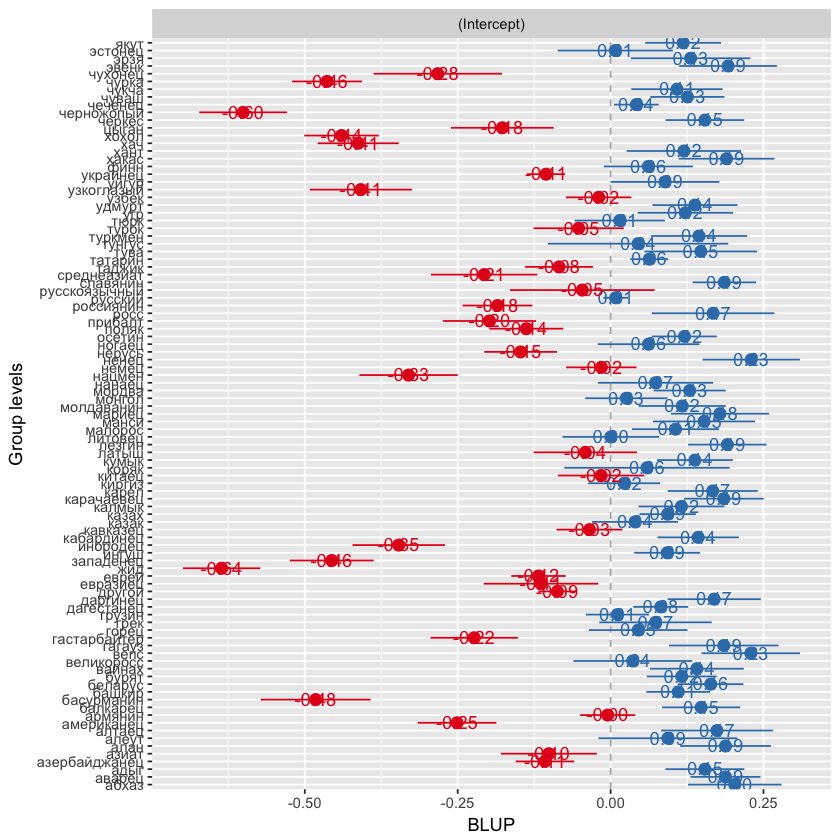

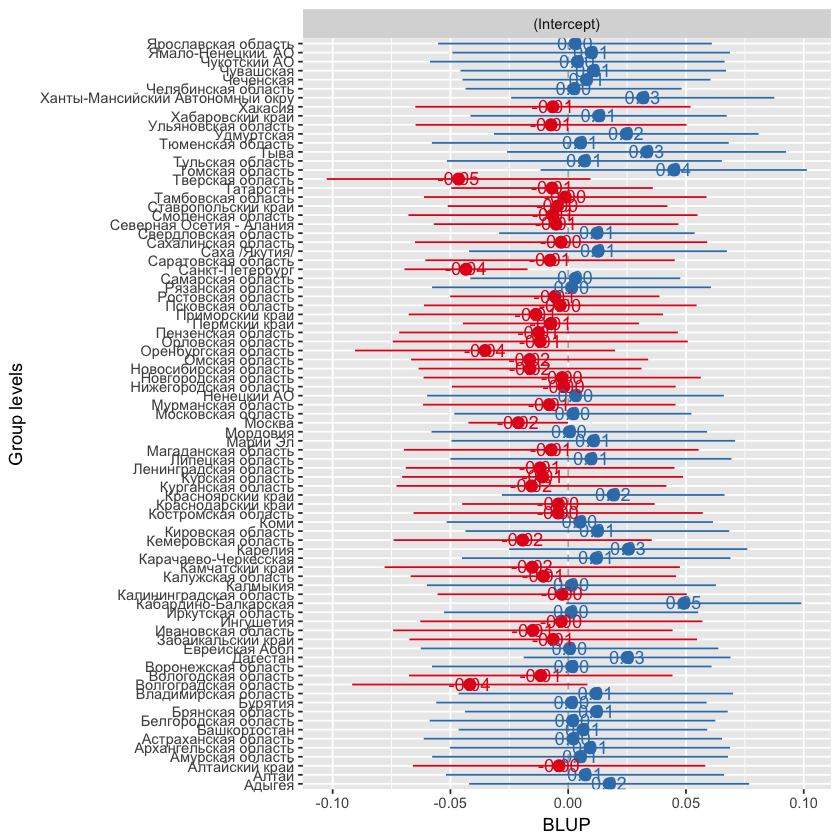

In [36]:
sjp.lmer(model_1_1)

Модель, показывающая, как принадлженость к этнической группе влияет на отношение

In [107]:
represent_add_01 = lmer(opinion_about_ethnonym_recoded_value ~ 
               represent_ethicity_meaning_value * auth_gender +
               represent_ethicity_meaning_value * eth_group_to_code +
               (1|region) +
               (1|document.id),
             data=df, REML = F)

fixed-effect model matrix is rank deficient so dropping 10 columns / coefficients


In [17]:
represent_add_01_agg_gr = lmer(opinion_about_ethnonym_recoded_value ~ 
               represent_ethicity_meaning_value * auth_gender +
               represent_ethicity_meaning_value * aggregated_groups +
               (1|region) +
               (1|document.id),
             data=df, REML = F)

In [18]:
r.squaredGLMM(represent_add_01_agg_gr)

R2m       R2c 
0.1367469 0.4836418

In [112]:
represent_add_02 = lmer(opinion_about_ethnonym_recoded_value ~ 
               represent_ethicity_meaning_value * auth_gender +
               represent_ethicity_meaning_value : eth_group_to_code +
               (1|region) +
               (1|document.id),
             data=df, REML = F)

fixed-effect model matrix is rank deficient so dropping 10 columns / coefficients


In [110]:
r.squaredGLMM(represent_add_01)

R2m       R2c 
0.2262640 0.5133643

In [113]:
r.squaredGLMM(represent_add_02)

R2m       R2c 
0.2262640 0.5133642

In [114]:
represent_add_02_table <- as.data.frame(coef(summary(represent_add_02)))

fixed-effect model matrix is rank deficient so dropping 10 columns / coefficients
fixed-effect model matrix is rank deficient so dropping 10 columns / coefficients
fixed-effect model matrix is rank deficient so dropping 10 columns / coefficients
fixed-effect model matrix is rank deficient so dropping 10 columns / coefficients
fixed-effect model matrix is rank deficient so dropping 10 columns / coefficients
fixed-effect model matrix is rank deficient so dropping 10 columns / coefficients
fixed-effect model matrix is rank deficient so dropping 10 columns / coefficients
fixed-effect model matrix is rank deficient so dropping 10 columns / coefficients
fixed-effect model matrix is rank deficient so dropping 10 columns / coefficients
fixed-effect model matrix is rank deficient so dropping 10 columns / coefficients
fixed-effect model matrix is rank deficient so dropping 10 columns / coefficients
fixed-effect model matrix is rank deficient so dropping 10 columns / coefficients
fixed-effect mod

fixed-effect model matrix is rank deficient so dropping 10 columns / coefficients
fixed-effect model matrix is rank deficient so dropping 10 columns / coefficients
fixed-effect model matrix is rank deficient so dropping 10 columns / coefficients
fixed-effect model matrix is rank deficient so dropping 10 columns / coefficients
fixed-effect model matrix is rank deficient so dropping 10 columns / coefficients
fixed-effect model matrix is rank deficient so dropping 10 columns / coefficients
fixed-effect model matrix is rank deficient so dropping 10 columns / coefficients
fixed-effect model matrix is rank deficient so dropping 10 columns / coefficients
fixed-effect model matrix is rank deficient so dropping 10 columns / coefficients
fixed-effect model matrix is rank deficient so dropping 10 columns / coefficients
fixed-effect model matrix is rank deficient so dropping 10 columns / coefficients
fixed-effect model matrix is rank deficient so dropping 10 columns / coefficients
fixed-effect mod

In [108]:
(represent_add_01_table <- as.data.frame(coef(summary(represent_add_01))))

fixed-effect model matrix is rank deficient so dropping 10 columns / coefficients
fixed-effect model matrix is rank deficient so dropping 10 columns / coefficients
fixed-effect model matrix is rank deficient so dropping 10 columns / coefficients
fixed-effect model matrix is rank deficient so dropping 10 columns / coefficients
fixed-effect model matrix is rank deficient so dropping 10 columns / coefficients
fixed-effect model matrix is rank deficient so dropping 10 columns / coefficients
fixed-effect model matrix is rank deficient so dropping 10 columns / coefficients
fixed-effect model matrix is rank deficient so dropping 10 columns / coefficients
fixed-effect model matrix is rank deficient so dropping 10 columns / coefficients
fixed-effect model matrix is rank deficient so dropping 10 columns / coefficients
fixed-effect model matrix is rank deficient so dropping 10 columns / coefficients
fixed-effect model matrix is rank deficient so dropping 10 columns / coefficients
fixed-effect mod

fixed-effect model matrix is rank deficient so dropping 10 columns / coefficients
fixed-effect model matrix is rank deficient so dropping 10 columns / coefficients
fixed-effect model matrix is rank deficient so dropping 10 columns / coefficients
fixed-effect model matrix is rank deficient so dropping 10 columns / coefficients
fixed-effect model matrix is rank deficient so dropping 10 columns / coefficients
fixed-effect model matrix is rank deficient so dropping 10 columns / coefficients
fixed-effect model matrix is rank deficient so dropping 10 columns / coefficients
fixed-effect model matrix is rank deficient so dropping 10 columns / coefficients
fixed-effect model matrix is rank deficient so dropping 10 columns / coefficients
fixed-effect model matrix is rank deficient so dropping 10 columns / coefficients
fixed-effect model matrix is rank deficient so dropping 10 columns / coefficients
fixed-effect model matrix is rank deficient so dropping 10 columns / coefficients
fixed-effect mod

,Estimate,Std. Error,df,t value,Pr(>|t|)
(Intercept),1.207409042,0.04159361,12964.443,29.02871291,0.000000e+00
represent_ethicity_meaning_value1,0.458999837,0.16608178,17678.903,2.76369779,5.720958e-03
auth_genderМужчина,-0.063647960,0.01126081,6982.255,-5.65216411,1.646897e-08
eth_group_to_codeаварец,0.006498720,0.05049238,16726.063,0.12870695,8.975911e-01
eth_group_to_codeадыг,-0.035648709,0.05394494,16486.460,-0.66083509,5.087273e-01
eth_group_to_codeазербайджанец,-0.328524126,0.04717841,16919.458,-6.96344144,3.442580e-12
eth_group_to_codeазиат,-0.311668601,0.05761557,17329.044,-5.40945054,6.405660e-08
eth_group_to_codeалан,-0.029619636,0.05760794,16702.292,-0.51415891,6.071477e-01
eth_group_to_codeалеут,-0.104230720,0.07230754,17510.089,-1.44149178,1.494637e-01
eth_group_to_codeалтаец,0.003322377,0.06550534,16574.923,0.05071918,9.595499e-01


In [109]:
write.xlsx(represent_add_01_table, file = "../output/represent_add_01_table.xlsx")

In [94]:
represent_add = lmer(opinion_about_ethnonym_recoded_value ~ 
               represent_ethicity_meaning_value *
                is_ethicity_superior_meaning_value * is_ethicity_aggressor_meaning_value +
               (1|eth_group_to_code) +
               (1|region) +
               (1|document.id),
             data=df, REML = F)

In [95]:
summary(represent_add)

Linear mixed model fit by maximum likelihood t-tests use Satterthwaite
  approximations to degrees of freedom [lmerMod]
Formula: 
opinion_about_ethnonym_recoded_value ~ represent_ethicity_meaning_value *  
    is_ethicity_superior_meaning_value * is_ethicity_aggressor_meaning_value +  
    (1 | eth_group_to_code) + (1 | document.id)
   Data: df

     AIC      BIC   logLik deviance df.resid 
  2141.5   2205.4  -1059.8   2119.5     2456 

Scaled residuals: 
    Min      1Q  Median      3Q     Max 
-2.9512 -0.5144 -0.0723  0.5565  3.5175 

Random effects:
 Groups            Name        Variance Std.Dev.
 document.id       (Intercept) 0.03455  0.1859  
 eth_group_to_code (Intercept) 0.01657  0.1287  
 Residual                      0.10180  0.3191  
Number of obs: 2467, groups:  document.id, 1592; eth_group_to_code, 96

Fixed effects:
                                                                                                             Estimate
(Intercept)                             

In [131]:
represent_add_2_2 = lmer(opinion_about_ethnonym_recoded_value ~ 
                eth_group_to_code +
               (1|region) +
               (1|document.id),
             data=df, REML = F)

In [132]:
represent_add_2_2_table <- as.data.frame(coef(summary(represent_add_2_2)))

In [133]:
write.xlsx(represent_add_2_2_table, file = "../output/represent_add_2_2_table.xlsx")

In [118]:
represent_add_2_0 = lmer(opinion_about_ethnonym_recoded_value ~ 
                eth_group_to_code * is_ethicity_superior_meaning_value +
               (1|region) +
               (1|document.id),
             data=df, REML = F)

In [119]:
represent_add_2_0_table <- as.data.frame(coef(summary(represent_add_2_0)))

In [120]:
write.xlsx(represent_add_2_0_table, file = "../output/represent_add_2_0_table.xlsx")

In [25]:
represent_add_2_0_0_ethLevel = lmer(opinion_about_ethnonym_recoded_value ~ 
                is_ethicity_superior_meaning_value * represent_ethicity_meaning_value +
                (1|eth_group_to_code) +
               (1|region) +
               (1|document.id),
             data=df, REML = F)

In [ ]:
plot_model(represent_add_2_0_0_ethLevel, sort = "(Intercept)")

`sjp.lmer()` will become deprecated in the future. Please use `plot_model()` instead.
Plotting random effects...
Plotting random effects...
Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'жид' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'жид' in 'mbcsToSbcs': dot substituted for <b6>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'жид' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'жид' in 'mbcsToSbcs': dot substituted for <b8>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'жид' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion f

“conversion failure on 'хохол' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'хохол' in 'mbcsToSbcs': dot substituted for <85>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'хохол' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'хохол' in 'mbcsToSbcs': dot substituted for <be>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'хохол' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'хохол' in 'mbcsToSbcs': dot substituted for <bb>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'чурка' in 'mbcsToSbcs': dot substituted for <d

“conversion failure on 'инородец' in 'mbcsToSbcs': dot substituted for <b8>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'инородец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'инородец' in 'mbcsToSbcs': dot substituted for <bd>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'инородец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'инородец' in 'mbcsToSbcs': dot substituted for <be>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'инородец' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'инородец' in 'mbcsToSbcs': d

“conversion failure on 'нацмен' in 'mbcsToSbcs': dot substituted for <bd>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'украинец' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'украинец' in 'mbcsToSbcs': dot substituted for <83>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'украинец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'украинец' in 'mbcsToSbcs': dot substituted for <ba>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'украинец' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'украинец' in 'mbcsToSbcs': dot

“conversion failure on 'среднеазиат' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'среднеазиат' in 'mbcsToSbcs': dot substituted for <bd>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'среднеазиат' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'среднеазиат' in 'mbcsToSbcs': dot substituted for <b5>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'среднеазиат' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'среднеазиат' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'среднеазиа

“conversion failure on 'литовец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'литовец' in 'mbcsToSbcs': dot substituted for <bb>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'литовец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'литовец' in 'mbcsToSbcs': dot substituted for <b8>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'литовец' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'литовец' in 'mbcsToSbcs': dot substituted for <82>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'литовец' in 'mbcsToSbcs': dot subs

“conversion failure on 'русскоязычный' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'русскоязычный' in 'mbcsToSbcs': dot substituted for <8f>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'русскоязычный' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'русскоязычный' in 'mbcsToSbcs': dot substituted for <b7>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'русскоязычный' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'русскоязычный' in 'mbcsToSbcs': dot substituted for <8b>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on

“conversion failure on 'гастарбайтер' in 'mbcsToSbcs': dot substituted for <b1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'гастарбайтер' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'гастарбайтер' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'гастарбайтер' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'гастарбайтер' in 'mbcsToSbcs': dot substituted for <b9>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'гастарбайтер' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'гаст

“conversion failure on 'грек' in 'mbcsToSbcs': dot substituted for <b5>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'грек' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'грек' in 'mbcsToSbcs': dot substituted for <ba>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'тува' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'тува' in 'mbcsToSbcs': dot substituted for <82>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'тува' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'тува' in 'mbcsToSbcs': dot substituted for <83>”Warn

“conversion failure on 'азиат' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'азиат' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'азиат' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'азиат' in 'mbcsToSbcs': dot substituted for <82>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'лезгин' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'лезгин' in 'mbcsToSbcs': dot substituted for <bb>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'лезгин' in 'mbcsToSbcs': dot substituted for

“conversion failure on 'хант' in 'mbcsToSbcs': dot substituted for <82>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'молдаванин' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'молдаванин' in 'mbcsToSbcs': dot substituted for <bc>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'молдаванин' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'молдаванин' in 'mbcsToSbcs': dot substituted for <be>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'молдаванин' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'молдаванин' in 'mbcsTo

“conversion failure on 'славянин' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'славянин' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'славянин' in 'mbcsToSbcs': dot substituted for <b2>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'славянин' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'славянин' in 'mbcsToSbcs': dot substituted for <8f>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'славянин' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'славянин' in 'mbcsToSbcs': d

“conversion failure on 'ногаец' in 'mbcsToSbcs': dot substituted for <86>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'аварец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'аварец' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'аварец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'аварец' in 'mbcsToSbcs': dot substituted for <b2>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'аварец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'аварец' in 'mbcsToSbcs': dot substituted

“conversion failure on 'адыг' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'адыг' in 'mbcsToSbcs': dot substituted for <b4>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'адыг' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'адыг' in 'mbcsToSbcs': dot substituted for <8b>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'адыг' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'адыг' in 'mbcsToSbcs': dot substituted for <b3>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'манси' in 'mbcsToSbcs': dot substituted for <d0>”War

“conversion failure on 'нанаец' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'нанаец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'нанаец' in 'mbcsToSbcs': dot substituted for <bd>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'нанаец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'нанаец' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'нанаец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'нанаец' in 'mbcsToSbcs': dot substituted

“conversion failure on 'беларус' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'беларус' in 'mbcsToSbcs': dot substituted for <b5>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'беларус' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'беларус' in 'mbcsToSbcs': dot substituted for <bb>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'беларус' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'беларус' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'беларус' in 'mbcsToSbcs': dot subs

“conversion failure on 'американец' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'американец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'американец' in 'mbcsToSbcs': dot substituted for <bd>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'американец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'американец' in 'mbcsToSbcs': dot substituted for <b5>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'американец' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'американец' in '

“conversion failure on 'другой' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'другой' in 'mbcsToSbcs': dot substituted for <83>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'другой' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'другой' in 'mbcsToSbcs': dot substituted for <b3>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'другой' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'другой' in 'mbcsToSbcs': dot substituted for <be>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'другой' in 'mbcsToSbcs': dot substituted

“conversion failure on 'азербайджанец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'азербайджанец' in 'mbcsToSbcs': dot substituted for <b7>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'азербайджанец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'азербайджанец' in 'mbcsToSbcs': dot substituted for <b5>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'азербайджанец' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'азербайджанец' in 'mbcsToSbcs': dot substituted for <80>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on

“conversion failure on 'немец' in 'mbcsToSbcs': dot substituted for <bc>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'немец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'немец' in 'mbcsToSbcs': dot substituted for <b5>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'немец' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'немец' in 'mbcsToSbcs': dot substituted for <86>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'еврей' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'еврей' in 'mbcsToSbcs': dot substituted for <b

“conversion failure on 'латыш' in 'mbcsToSbcs': dot substituted for <bb>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'латыш' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'латыш' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'латыш' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'латыш' in 'mbcsToSbcs': dot substituted for <82>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'латыш' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'латыш' in 'mbcsToSbcs': dot substituted for <8

“conversion failure on 'турок' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'турок' in 'mbcsToSbcs': dot substituted for <83>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'турок' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'турок' in 'mbcsToSbcs': dot substituted for <80>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'турок' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'турок' in 'mbcsToSbcs': dot substituted for <be>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'турок' in 'mbcsToSbcs': dot substituted for <d

“conversion failure on 'китаец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'китаец' in 'mbcsToSbcs': dot substituted for <b5>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'китаец' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'китаец' in 'mbcsToSbcs': dot substituted for <86>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'казак' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'казак' in 'mbcsToSbcs': dot substituted for <ba>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'казак' in 'mbcsToSbcs': dot substituted fo

“conversion failure on 'татарин' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'татарин' in 'mbcsToSbcs': dot substituted for <80>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'татарин' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'татарин' in 'mbcsToSbcs': dot substituted for <b8>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'татарин' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'татарин' in 'mbcsToSbcs': dot substituted for <bd>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'таджик' in 'mbcsToSbcs': dot subst

“conversion failure on 'кумык' in 'mbcsToSbcs': dot substituted for <83>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'кумык' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'кумык' in 'mbcsToSbcs': dot substituted for <bc>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'кумык' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'кумык' in 'mbcsToSbcs': dot substituted for <8b>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'кумык' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'кумык' in 'mbcsToSbcs': dot substituted for <b

“conversion failure on 'кабардинец' in 'mbcsToSbcs': dot substituted for <86>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'даргинец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'даргинец' in 'mbcsToSbcs': dot substituted for <b4>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'даргинец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'даргинец' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'даргинец' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'даргинец' in 'mbcsToSbcs':

“conversion failure on 'балкарец' in 'mbcsToSbcs': dot substituted for <b5>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'балкарец' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'балкарец' in 'mbcsToSbcs': dot substituted for <86>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'осетин' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'осетин' in 'mbcsToSbcs': dot substituted for <be>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'осетин' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'осетин' in 'mbcsToSbcs': dot subst

“conversion failure on 'вайнах' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'вайнах' in 'mbcsToSbcs': dot substituted for <bd>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'вайнах' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'вайнах' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'вайнах' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'вайнах' in 'mbcsToSbcs': dot substituted for <85>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'калмык' in 'mbcsToSbcs': dot substituted

“conversion failure on 'бурят' in 'mbcsToSbcs': dot substituted for <82>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'чукча' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'чукча' in 'mbcsToSbcs': dot substituted for <87>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'чукча' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'чукча' in 'mbcsToSbcs': dot substituted for <83>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'чукча' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'чукча' in 'mbcsToSbcs': dot substituted for <b

“conversion failure on 'удмурт' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'удмурт' in 'mbcsToSbcs': dot substituted for <bc>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'удмурт' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'удмурт' in 'mbcsToSbcs': dot substituted for <83>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'удмурт' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'удмурт' in 'mbcsToSbcs': dot substituted for <80>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'удмурт' in 'mbcsToSbcs': dot substituted

“conversion failure on 'абхаз' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'абхаз' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'абхаз' in 'mbcsToSbcs': dot substituted for <b1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'абхаз' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'абхаз' in 'mbcsToSbcs': dot substituted for <85>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'абхаз' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'абхаз' in 'mbcsToSbcs': dot substituted for <b

“conversion failure on 'хакас' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'хакас' in 'mbcsToSbcs': dot substituted for <81>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'карачаевец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'карачаевец' in 'mbcsToSbcs': dot substituted for <ba>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'карачаевец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'карачаевец' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'карачаевец' in 'mbcsToSbcs

“conversion failure on 'западенец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'западенец' in 'mbcsToSbcs': dot substituted for <bd>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'западенец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'западенец' in 'mbcsToSbcs': dot substituted for <b5>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'западенец' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'западенец' in 'mbcsToSbcs': dot substituted for <86>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'черножопый' in 'mbcsTo

“conversion failure on 'чухонец' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'чухонец' in 'mbcsToSbcs': dot substituted for <83>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'чухонец' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'чухонец' in 'mbcsToSbcs': dot substituted for <85>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'чухонец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'чухонец' in 'mbcsToSbcs': dot substituted for <be>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'чухонец' in 'mbcsToSbcs': dot subs

“conversion failure on 'узкоглазый' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'узкоглазый' in 'mbcsToSbcs': dot substituted for <b9>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'нацмен' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'нацмен' in 'mbcsToSbcs': dot substituted for <bd>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'нацмен' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'нацмен' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'нацмен' in 'mbcsToSbcs': dot sub

“conversion failure on 'россиянин' in 'mbcsToSbcs': dot substituted for <81>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'россиянин' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'россиянин' in 'mbcsToSbcs': dot substituted for <81>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'россиянин' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'россиянин' in 'mbcsToSbcs': dot substituted for <b8>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'россиянин' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'россиянин' in 'mbcsToS

“conversion failure on 'монгол' in 'mbcsToSbcs': dot substituted for <bb>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'русскоязычный' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'русскоязычный' in 'mbcsToSbcs': dot substituted for <80>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'русскоязычный' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'русскоязычный' in 'mbcsToSbcs': dot substituted for <83>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'русскоязычный' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'русск

“conversion failure on 'гастарбайтер' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'гастарбайтер' in 'mbcsToSbcs': dot substituted for <b3>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'гастарбайтер' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'гастарбайтер' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'гастарбайтер' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'гастарбайтер' in 'mbcsToSbcs': dot substituted for <81>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'гаст

“conversion failure on 'узбек' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'узбек' in 'mbcsToSbcs': dot substituted for <b5>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'узбек' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'узбек' in 'mbcsToSbcs': dot substituted for <ba>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'чеченец' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'чеченец' in 'mbcsToSbcs': dot substituted for <87>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'чеченец' in 'mbcsToSbcs': dot substituted 

“conversion failure on 'тюрк' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'тюрк' in 'mbcsToSbcs': dot substituted for <82>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'тюрк' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'тюрк' in 'mbcsToSbcs': dot substituted for <8e>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'тюрк' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'тюрк' in 'mbcsToSbcs': dot substituted for <80>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'тюрк' in 'mbcsToSbcs': dot substituted for <d0>”Warn

“conversion failure on 'коряк' in 'mbcsToSbcs': dot substituted for <be>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'коряк' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'коряк' in 'mbcsToSbcs': dot substituted for <80>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'коряк' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'коряк' in 'mbcsToSbcs': dot substituted for <8f>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'коряк' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'коряк' in 'mbcsToSbcs': dot substituted for <b

“conversion failure on 'алан' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'алан' in 'mbcsToSbcs': dot substituted for <bb>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'алан' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'алан' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'алан' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'алан' in 'mbcsToSbcs': dot substituted for <bd>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'хант' in 'mbcsToSbcs': dot substituted for <d1>”Warn

“conversion failure on 'башкир' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'башкир' in 'mbcsToSbcs': dot substituted for <88>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'башкир' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'башкир' in 'mbcsToSbcs': dot substituted for <ba>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'башкир' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'башкир' in 'mbcsToSbcs': dot substituted for <b8>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'башкир' in 'mbcsToSbcs': dot substituted

“conversion failure on 'якут' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'якут' in 'mbcsToSbcs': dot substituted for <82>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'ногаец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'ногаец' in 'mbcsToSbcs': dot substituted for <bd>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'ногаец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'ногаец' in 'mbcsToSbcs': dot substituted for <be>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'ногаец' in 'mbcsToSbcs': dot substituted for

“conversion failure on 'туркмен' in 'mbcsToSbcs': dot substituted for <83>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'туркмен' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'туркмен' in 'mbcsToSbcs': dot substituted for <80>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'туркмен' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'туркмен' in 'mbcsToSbcs': dot substituted for <ba>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'туркмен' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'туркмен' in 'mbcsToSbcs': dot subs

“conversion failure on 'мордва' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'мордва' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'эрзя' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'эрзя' in 'mbcsToSbcs': dot substituted for <8d>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'эрзя' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'эрзя' in 'mbcsToSbcs': dot substituted for <80>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'эрзя' in 'mbcsToSbcs': dot substituted for <d0>”

“conversion failure on 'чуваш' in 'mbcsToSbcs': dot substituted for <87>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'чуваш' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'чуваш' in 'mbcsToSbcs': dot substituted for <83>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'чуваш' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'чуваш' in 'mbcsToSbcs': dot substituted for <b2>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'чуваш' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'чуваш' in 'mbcsToSbcs': dot substituted for <b

“conversion failure on 'мариец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'мариец' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'мариец' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'мариец' in 'mbcsToSbcs': dot substituted for <80>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'мариец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'мариец' in 'mbcsToSbcs': dot substituted for <b8>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'мариец' in 'mbcsToSbcs': dot substituted

“conversion failure on 'американец' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'американец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'американец' in 'mbcsToSbcs': dot substituted for <bc>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'американец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'американец' in 'mbcsToSbcs': dot substituted for <b5>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'американец' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'американец' in '

“conversion failure on 'чурка' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'чурка' in 'mbcsToSbcs': dot substituted for <83>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'чурка' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'чурка' in 'mbcsToSbcs': dot substituted for <80>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'чурка' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'чурка' in 'mbcsToSbcs': dot substituted for <ba>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'чурка' in 'mbcsToSbcs': dot substituted for <d

“conversion failure on 'украинец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'украинец' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'украинец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'украинец' in 'mbcsToSbcs': dot substituted for <b8>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'украинец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'украинец' in 'mbcsToSbcs': dot substituted for <bd>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'украинец' in 'mbcsToSbcs': d

“conversion failure on 'среднеазиат' in 'mbcsToSbcs': dot substituted for <b7>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'среднеазиат' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'среднеазиат' in 'mbcsToSbcs': dot substituted for <b8>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'среднеазиат' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'среднеазиат' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'среднеазиат' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'среднеазиа

“conversion failure on 'евразиец' in 'mbcsToSbcs': dot substituted for <80>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'евразиец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'евразиец' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'евразиец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'евразиец' in 'mbcsToSbcs': dot substituted for <b7>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'евразиец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'евразиец' in 'mbcsToSbcs': d

“conversion failure on 'русскоязычный' in 'mbcsToSbcs': dot substituted for <87>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'русскоязычный' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'русскоязычный' in 'mbcsToSbcs': dot substituted for <bd>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'русскоязычный' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'русскоязычный' in 'mbcsToSbcs': dot substituted for <8b>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'русскоязычный' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on

“conversion failure on 'цыган' in 'mbcsToSbcs': dot substituted for <86>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'цыган' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'цыган' in 'mbcsToSbcs': dot substituted for <8b>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'цыган' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'цыган' in 'mbcsToSbcs': dot substituted for <b3>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'цыган' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'цыган' in 'mbcsToSbcs': dot substituted for <b

“conversion failure on 'гастарбайтер' in 'mbcsToSbcs': dot substituted for <b5>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'гастарбайтер' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'гастарбайтер' in 'mbcsToSbcs': dot substituted for <80>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'китаец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'китаец' in 'mbcsToSbcs': dot substituted for <ba>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'китаец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'китаец' in 'mbcsToSbcs

“conversion failure on 'тува' in 'mbcsToSbcs': dot substituted for <b2>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'тува' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'тува' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'татарин' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'татарин' in 'mbcsToSbcs': dot substituted for <82>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'татарин' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'татарин' in 'mbcsToSbcs': dot substituted f

“conversion failure on 'лезгин' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'лезгин' in 'mbcsToSbcs': dot substituted for <b7>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'лезгин' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'лезгин' in 'mbcsToSbcs': dot substituted for <b3>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'лезгин' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'лезгин' in 'mbcsToSbcs': dot substituted for <b8>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'лезгин' in 'mbcsToSbcs': dot substituted

“conversion failure on 'молдаванин' in 'mbcsToSbcs': dot substituted for <b4>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'молдаванин' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'молдаванин' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'молдаванин' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'молдаванин' in 'mbcsToSbcs': dot substituted for <b2>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'молдаванин' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'молдаванин' in '

“conversion failure on 'славянин' in 'mbcsToSbcs': dot substituted for <b8>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'славянин' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'славянин' in 'mbcsToSbcs': dot substituted for <bd>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'ингуш' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'ингуш' in 'mbcsToSbcs': dot substituted for <b8>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'ингуш' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'ингуш' in 'mbcsToSbcs': dot substitut

“conversion failure on 'аварец' in 'mbcsToSbcs': dot substituted for <80>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'аварец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'аварец' in 'mbcsToSbcs': dot substituted for <b5>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'аварец' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'аварец' in 'mbcsToSbcs': dot substituted for <86>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'вайнах' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'вайнах' in 'mbcsToSbcs': dot substituted

“conversion failure on 'манси' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'манси' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'манси' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'манси' in 'mbcsToSbcs': dot substituted for <bd>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'манси' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'манси' in 'mbcsToSbcs': dot substituted for <81>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'манси' in 'mbcsToSbcs': dot substituted for <d

“conversion failure on 'нанаец' in 'mbcsToSbcs': dot substituted for <86>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'ненец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'ненец' in 'mbcsToSbcs': dot substituted for <bd>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'ненец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'ненец' in 'mbcsToSbcs': dot substituted for <b5>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'ненец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'ненец' in 'mbcsToSbcs': dot substituted for <

“conversion failure on 'беларус' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'беларус' in 'mbcsToSbcs': dot substituted for <83>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'беларус' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'беларус' in 'mbcsToSbcs': dot substituted for <81>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'хакас' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'хакас' in 'mbcsToSbcs': dot substituted for <85>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'хакас' in 'mbcsToSbcs': dot substitute

“conversion failure on 'западенец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'западенец' in 'mbcsToSbcs': dot substituted for <b7>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'западенец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'западенец' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'западенец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'западенец' in 'mbcsToSbcs': dot substituted for <bf>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'западенец' in 'mbcsToS

“conversion failure on 'другой' in 'mbcsToSbcs': dot substituted for <b9>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'поляк' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'поляк' in 'mbcsToSbcs': dot substituted for <bf>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'поляк' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'поляк' in 'mbcsToSbcs': dot substituted for <be>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'поляк' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'поляк' in 'mbcsToSbcs': dot substituted for <

“conversion failure on 'азербайджанец' in 'mbcsToSbcs': dot substituted for <b1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'азербайджанец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'азербайджанец' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'азербайджанец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'азербайджанец' in 'mbcsToSbcs': dot substituted for <b9>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'азербайджанец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on

“conversion failure on 'русский' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'русский' in 'mbcsToSbcs': dot substituted for <b9>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'эстонец' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'эстонец' in 'mbcsToSbcs': dot substituted for <8d>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'эстонец' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'эстонец' in 'mbcsToSbcs': dot substituted for <81>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'эстонец' in 'mbcsToSbcs': dot subs

“conversion failure on 'кавказец' in 'mbcsToSbcs': dot substituted for <b7>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'кавказец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'кавказец' in 'mbcsToSbcs': dot substituted for <b5>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'кавказец' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'кавказец' in 'mbcsToSbcs': dot substituted for <86>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'финн' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'финн' in 'mbcsToSbcs': dot subst

“conversion failure on 'казак' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'казак' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'казак' in 'mbcsToSbcs': dot substituted for <b7>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'казак' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'казак' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'казак' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'казак' in 'mbcsToSbcs': dot substituted for <b

“conversion failure on 'таджик' in 'mbcsToSbcs': dot substituted for <82>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'таджик' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'таджик' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'таджик' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'таджик' in 'mbcsToSbcs': dot substituted for <b4>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'таджик' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'таджик' in 'mbcsToSbcs': dot substituted

“conversion failure on 'алтаец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'алтаец' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'алтаец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'алтаец' in 'mbcsToSbcs': dot substituted for <bb>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'алтаец' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'алтаец' in 'mbcsToSbcs': dot substituted for <82>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'алтаец' in 'mbcsToSbcs': dot substituted

“conversion failure on 'даргинец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'даргинец' in 'mbcsToSbcs': dot substituted for <b3>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'даргинец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'даргинец' in 'mbcsToSbcs': dot substituted for <b8>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'даргинец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'даргинец' in 'mbcsToSbcs': dot substituted for <bd>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'даргинец' in 'mbcsToSbcs': d

“conversion failure on 'осетин' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'осетин' in 'mbcsToSbcs': dot substituted for <b5>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'осетин' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'осетин' in 'mbcsToSbcs': dot substituted for <82>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'осетин' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'осетин' in 'mbcsToSbcs': dot substituted for <b8>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'осетин' in 'mbcsToSbcs': dot substituted

“conversion failure on 'калмык' in 'mbcsToSbcs': dot substituted for <ba>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'калмык' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'калмык' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'калмык' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'калмык' in 'mbcsToSbcs': dot substituted for <bb>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'калмык' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'калмык' in 'mbcsToSbcs': dot substituted

“conversion failure on 'чукча' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'чукча' in 'mbcsToSbcs': dot substituted for <87>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'чукча' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'чукча' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'мордва' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'мордва' in 'mbcsToSbcs': dot substituted for <bc>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'мордва' in 'mbcsToSbcs': dot substituted for

“conversion failure on 'удмурт' in 'mbcsToSbcs': dot substituted for <82>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'черкес' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'черкес' in 'mbcsToSbcs': dot substituted for <87>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'черкес' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'черкес' in 'mbcsToSbcs': dot substituted for <b5>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'черкес' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'черкес' in 'mbcsToSbcs': dot substituted

“conversion failure on 'абхаз' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'абхаз' in 'mbcsToSbcs': dot substituted for <b7>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'алеут' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'алеут' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'алеут' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'алеут' in 'mbcsToSbcs': dot substituted for <bb>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'алеут' in 'mbcsToSbcs': dot substituted for <d

“conversion failure on 'эвенк' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'эвенк' in 'mbcsToSbcs': dot substituted for <ba>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'угр' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'угр' in 'mbcsToSbcs': dot substituted for <83>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'угр' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'угр' in 'mbcsToSbcs': dot substituted for <b3>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'угр' in 'mbcsToSbcs': dot substituted for <d1>”Warning

“conversion failure on 'черножопый' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'черножопый' in 'mbcsToSbcs': dot substituted for <87>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'черножопый' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'черножопый' in 'mbcsToSbcs': dot substituted for <b5>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'черножопый' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'черножопый' in 'mbcsToSbcs': dot substituted for <80>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'черножопый' in '

“conversion failure on 'чухонец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'чухонец' in 'mbcsToSbcs': dot substituted for <bd>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'чухонец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'чухонец' in 'mbcsToSbcs': dot substituted for <b5>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'чухонец' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'чухонец' in 'mbcsToSbcs': dot substituted for <86>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'инородец' in 'mbcsToSbcs': dot sub

“conversion failure on 'нацмен' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'нацмен' in 'mbcsToSbcs': dot substituted for <86>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'нацмен' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'нацмен' in 'mbcsToSbcs': dot substituted for <bc>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'нацмен' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'нацмен' in 'mbcsToSbcs': dot substituted for <b5>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'нацмен' in 'mbcsToSbcs': dot substituted

“conversion failure on 'россиянин' in 'mbcsToSbcs': dot substituted for <8f>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'россиянин' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'россиянин' in 'mbcsToSbcs': dot substituted for <bd>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'россиянин' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'россиянин' in 'mbcsToSbcs': dot substituted for <b8>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'россиянин' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'россиянин' in 'mbcsToS

“conversion failure on 'русскоязычный' in 'mbcsToSbcs': dot substituted for <81>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'русскоязычный' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'русскоязычный' in 'mbcsToSbcs': dot substituted for <81>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'русскоязычный' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'русскоязычный' in 'mbcsToSbcs': dot substituted for <ba>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'русскоязычный' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on

“conversion failure on 'гастарбайтер' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'гастарбайтер' in 'mbcsToSbcs': dot substituted for <82>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'гастарбайтер' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'гастарбайтер' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'гастарбайтер' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'гастарбайтер' in 'mbcsToSbcs': dot substituted for <80>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'гаст

“conversion failure on 'чеченец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'чеченец' in 'mbcsToSbcs': dot substituted for <b5>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'чеченец' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'чеченец' in 'mbcsToSbcs': dot substituted for <87>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'чеченец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'чеченец' in 'mbcsToSbcs': dot substituted for <b5>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'чеченец' in 'mbcsToSbcs': dot subs

“conversion failure on 'тюрк' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'тюрк' in 'mbcsToSbcs': dot substituted for <ba>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'грек' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'грек' in 'mbcsToSbcs': dot substituted for <b3>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'грек' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'грек' in 'mbcsToSbcs': dot substituted for <80>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'грек' in 'mbcsToSbcs': dot substituted for <d0>”Warn

“conversion failure on 'коряк' in 'mbcsToSbcs': dot substituted for <ba>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'азиат' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'азиат' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'азиат' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'азиат' in 'mbcsToSbcs': dot substituted for <b7>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'азиат' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'азиат' in 'mbcsToSbcs': dot substituted for <b

“conversion failure on 'хант' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'хант' in 'mbcsToSbcs': dot substituted for <85>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'хант' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'хант' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'хант' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'хант' in 'mbcsToSbcs': dot substituted for <bd>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'хант' in 'mbcsToSbcs': dot substituted for <d1>”Warn

“conversion failure on 'башкир' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'башкир' in 'mbcsToSbcs': dot substituted for <80>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'славянин' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'славянин' in 'mbcsToSbcs': dot substituted for <81>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'славянин' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'славянин' in 'mbcsToSbcs': dot substituted for <bb>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'славянин' in 'mbcsToSbcs': dot s

“conversion failure on 'ногаец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'ногаец' in 'mbcsToSbcs': dot substituted for <b3>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'ногаец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'ногаец' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'ногаец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'ногаец' in 'mbcsToSbcs': dot substituted for <b5>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'ногаец' in 'mbcsToSbcs': dot substituted

“conversion failure on 'эрзя' in 'mbcsToSbcs': dot substituted for <80>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'эрзя' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'эрзя' in 'mbcsToSbcs': dot substituted for <b7>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'эрзя' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'эрзя' in 'mbcsToSbcs': dot substituted for <8f>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'адыг' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'адыг' in 'mbcsToSbcs': dot substituted for <b0>”Warn

“conversion failure on 'чуваш' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'чуваш' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'чуваш' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'чуваш' in 'mbcsToSbcs': dot substituted for <88>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'нанаец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'нанаец' in 'mbcsToSbcs': dot substituted for <bd>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'нанаец' in 'mbcsToSbcs': dot substituted for

“conversion failure on 'мариец' in 'mbcsToSbcs': dot substituted for <b8>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'мариец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'мариец' in 'mbcsToSbcs': dot substituted for <b5>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'мариец' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'мариец' in 'mbcsToSbcs': dot substituted for <86>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'беларус' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'беларус' in 'mbcsToSbcs': dot substitut

“conversion failure on 'уйгур' in 'mbcsToSbcs': dot substituted for <b9>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'уйгур' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'уйгур' in 'mbcsToSbcs': dot substituted for <b3>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'уйгур' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'уйгур' in 'mbcsToSbcs': dot substituted for <83>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'уйгур' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'уйгур' in 'mbcsToSbcs': dot substituted for <8

“conversion failure on 'американец' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'американец' in 'mbcsToSbcs': dot substituted for <80>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'американец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'американец' in 'mbcsToSbcs': dot substituted for <b8>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'американец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'американец' in 'mbcsToSbcs': dot substituted for <ba>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'американец' in '

“conversion failure on 'чурка' in 'mbcsToSbcs': dot substituted for <ba>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'чурка' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'чурка' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'другой' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'другой' in 'mbcsToSbcs': dot substituted for <b4>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'другой' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'другой' in 'mbcsToSbcs': dot substituted fo

“conversion failure on 'украинец' in 'mbcsToSbcs': dot substituted for <bd>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'украинец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'украинец' in 'mbcsToSbcs': dot substituted for <b5>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'украинец' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'украинец' in 'mbcsToSbcs': dot substituted for <86>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'азербайджанец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'азербайджанец' in 'mbcs

“conversion failure on 'среднеазиат' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'среднеазиат' in 'mbcsToSbcs': dot substituted for <82>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'немец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'немец' in 'mbcsToSbcs': dot substituted for <bd>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'немец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'немец' in 'mbcsToSbcs': dot substituted for <b5>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'немец' in 'mbcsToSbcs': dot substi

“conversion failure on 'евразиец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'евразиец' in 'mbcsToSbcs': dot substituted for <b8>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'евразиец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'евразиец' in 'mbcsToSbcs': dot substituted for <b5>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'евразиец' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'евразиец' in 'mbcsToSbcs': dot substituted for <86>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'латыш' in 'mbcsToSbcs': dot 

“conversion failure on 'цыган' in 'mbcsToSbcs': dot substituted for <b3>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'цыган' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'цыган' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'цыган' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'цыган' in 'mbcsToSbcs': dot substituted for <bd>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'турок' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'турок' in 'mbcsToSbcs': dot substituted for <8

“conversion failure on 'китаец' in 'mbcsToSbcs': dot substituted for <ba>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'китаец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'китаец' in 'mbcsToSbcs': dot substituted for <b8>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'китаец' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'китаец' in 'mbcsToSbcs': dot substituted for <82>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'китаец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'китаец' in 'mbcsToSbcs': dot substituted

“conversion failure on 'армянин' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'армянин' in 'mbcsToSbcs': dot substituted for <bd>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'армянин' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'армянин' in 'mbcsToSbcs': dot substituted for <b8>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'армянин' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'армянин' in 'mbcsToSbcs': dot substituted for <bd>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'дагестанец' in 'mbcsToSbcs': dot s

“conversion failure on 'лезгин' in 'mbcsToSbcs': dot substituted for <b8>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'лезгин' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'лезгин' in 'mbcsToSbcs': dot substituted for <bd>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'кумык' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'кумык' in 'mbcsToSbcs': dot substituted for <ba>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'кумык' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'кумык' in 'mbcsToSbcs': dot substituted for

“conversion failure on 'молдаванин' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'молдаванин' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'молдаванин' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'молдаванин' in 'mbcsToSbcs': dot substituted for <bd>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'молдаванин' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'молдаванин' in 'mbcsToSbcs': dot substituted for <b8>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'молдаванин' in '

“conversion failure on 'ингуш' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'ингуш' in 'mbcsToSbcs': dot substituted for <bd>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'ингуш' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'ингуш' in 'mbcsToSbcs': dot substituted for <b3>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'ингуш' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'ингуш' in 'mbcsToSbcs': dot substituted for <83>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'ингуш' in 'mbcsToSbcs': dot substituted for <d

“conversion failure on 'вайнах' in 'mbcsToSbcs': dot substituted for <b2>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'вайнах' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'вайнах' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'вайнах' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'вайнах' in 'mbcsToSbcs': dot substituted for <b9>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'вайнах' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'вайнах' in 'mbcsToSbcs': dot substituted

“conversion failure on 'манси' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'манси' in 'mbcsToSbcs': dot substituted for <b8>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'удмурт' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'удмурт' in 'mbcsToSbcs': dot substituted for <83>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'удмурт' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'удмурт' in 'mbcsToSbcs': dot substituted for <b4>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'удмурт' in 'mbcsToSbcs': dot substituted f

“conversion failure on 'ненец' in 'mbcsToSbcs': dot substituted for <bd>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'ненец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'ненец' in 'mbcsToSbcs': dot substituted for <b5>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'ненец' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'ненец' in 'mbcsToSbcs': dot substituted for <86>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'абхаз' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'абхаз' in 'mbcsToSbcs': dot substituted for <b

“conversion failure on 'хакас' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'хакас' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'хакас' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'хакас' in 'mbcsToSbcs': dot substituted for <ba>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'хакас' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'хакас' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'хакас' in 'mbcsToSbcs': dot substituted for <d

“conversion failure on 'западенец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'западенец' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'западенец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'западенец' in 'mbcsToSbcs': dot substituted for <b4>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'западенец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'западенец' in 'mbcsToSbcs': dot substituted for <b5>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'западенец' in 'mbcsToS

“conversion failure on 'поляк' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'поляк' in 'mbcsToSbcs': dot substituted for <8f>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'поляк' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'поляк' in 'mbcsToSbcs': dot substituted for <ba>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'чухонец' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'чухонец' in 'mbcsToSbcs': dot substituted for <87>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'чухонец' in 'mbcsToSbcs': dot substituted 

“conversion failure on 'азербайджанец' in 'mbcsToSbcs': dot substituted for <b4>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'азербайджанец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'азербайджанец' in 'mbcsToSbcs': dot substituted for <b6>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'азербайджанец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'азербайджанец' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'азербайджанец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on

“conversion failure on 'эстонец' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'эстонец' in 'mbcsToSbcs': dot substituted for <82>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'эстонец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'эстонец' in 'mbcsToSbcs': dot substituted for <be>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'эстонец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'эстонец' in 'mbcsToSbcs': dot substituted for <bd>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'эстонец' in 'mbcsToSbcs': dot subs

“conversion failure on 'финн' in 'mbcsToSbcs': dot substituted for <84>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'финн' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'финн' in 'mbcsToSbcs': dot substituted for <b8>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'финн' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'финн' in 'mbcsToSbcs': dot substituted for <bd>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'финн' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'финн' in 'mbcsToSbcs': dot substituted for <bd>”Warn

“conversion failure on 'казак' in 'mbcsToSbcs': dot substituted for <ba>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'узбек' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'узбек' in 'mbcsToSbcs': dot substituted for <83>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'узбек' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'узбек' in 'mbcsToSbcs': dot substituted for <b7>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'узбек' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'узбек' in 'mbcsToSbcs': dot substituted for <b

“conversion failure on 'таджик' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'таджик' in 'mbcsToSbcs': dot substituted for <b8>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'таджик' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'таджик' in 'mbcsToSbcs': dot substituted for <ba>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'коряк' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'коряк' in 'mbcsToSbcs': dot substituted for <ba>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'коряк' in 'mbcsToSbcs': dot substituted fo

“conversion failure on 'алтаец' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'алтаец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'алтаец' in 'mbcsToSbcs': dot substituted for <b5>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'алтаец' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'алтаец' in 'mbcsToSbcs': dot substituted for <86>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'алан' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'алан' in 'mbcsToSbcs': dot substituted for

“conversion failure on 'даргинец' in 'mbcsToSbcs': dot substituted for <b5>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'даргинец' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'даргинец' in 'mbcsToSbcs': dot substituted for <86>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'башкир' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'башкир' in 'mbcsToSbcs': dot substituted for <b1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'башкир' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'башкир' in 'mbcsToSbcs': dot subst

“conversion failure on 'осетин' in 'mbcsToSbcs': dot substituted for <bd>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'якут' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'якут' in 'mbcsToSbcs': dot substituted for <8f>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'якут' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'якут' in 'mbcsToSbcs': dot substituted for <ba>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'якут' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'якут' in 'mbcsToSbcs': dot substituted for <83>”Wa

“conversion failure on 'калмык' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'калмык' in 'mbcsToSbcs': dot substituted for <8b>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'калмык' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'калмык' in 'mbcsToSbcs': dot substituted for <ba>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'туркмен' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'туркмен' in 'mbcsToSbcs': dot substituted for <82>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'туркмен' in 'mbcsToSbcs': dot substitu

“conversion failure on 'мордва' in 'mbcsToSbcs': dot substituted for <be>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'мордва' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'мордва' in 'mbcsToSbcs': dot substituted for <80>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'мордва' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'мордва' in 'mbcsToSbcs': dot substituted for <b4>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'мордва' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'мордва' in 'mbcsToSbcs': dot substituted

“conversion failure on 'черкес' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'черкес' in 'mbcsToSbcs': dot substituted for <ba>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'черкес' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'черкес' in 'mbcsToSbcs': dot substituted for <b5>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'черкес' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'черкес' in 'mbcsToSbcs': dot substituted for <81>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'чуваш' in 'mbcsToSbcs': dot substituted 

“conversion failure on 'алеут' in 'mbcsToSbcs': dot substituted for <b5>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'алеут' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'алеут' in 'mbcsToSbcs': dot substituted for <83>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'алеут' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'алеут' in 'mbcsToSbcs': dot substituted for <82>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'мариец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'мариец' in 'mbcsToSbcs': dot substituted for 

“conversion failure on 'жид' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'жид' in 'mbcsToSbcs': dot substituted for <b6>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'жид' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'жид' in 'mbcsToSbcs': dot substituted for <b8>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'жид' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'жид' in 'mbcsToSbcs': dot substituted for <b4>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'американец' in 'mbcsToSbcs': dot substituted for <d0>”Warn

“conversion failure on 'черножопый' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'черножопый' in 'mbcsToSbcs': dot substituted for <be>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'черножопый' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'черножопый' in 'mbcsToSbcs': dot substituted for <b6>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'черножопый' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'черножопый' in 'mbcsToSbcs': dot substituted for <be>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'черножопый' in '

“conversion failure on 'хохол' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'хохол' in 'mbcsToSbcs': dot substituted for <be>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'хохол' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'хохол' in 'mbcsToSbcs': dot substituted for <bb>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'чурка' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'чурка' in 'mbcsToSbcs': dot substituted for <87>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'чурка' in 'mbcsToSbcs': dot substituted for <d

“conversion failure on 'инородец' in 'mbcsToSbcs': dot substituted for <bd>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'инородец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'инородец' in 'mbcsToSbcs': dot substituted for <be>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'инородец' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'инородец' in 'mbcsToSbcs': dot substituted for <80>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'инородец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'инородец' in 'mbcsToSbcs': d

“conversion failure on 'украинец' in 'mbcsToSbcs': dot substituted for <83>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'украинец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'украинец' in 'mbcsToSbcs': dot substituted for <ba>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'украинец' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'украинец' in 'mbcsToSbcs': dot substituted for <80>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'украинец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'украинец' in 'mbcsToSbcs': d

“conversion failure on 'среднеазиат' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'среднеазиат' in 'mbcsToSbcs': dot substituted for <b5>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'среднеазиат' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'среднеазиат' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'среднеазиат' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'среднеазиат' in 'mbcsToSbcs': dot substituted for <b7>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'среднеазиа

“conversion failure on 'литовец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'литовец' in 'mbcsToSbcs': dot substituted for <b8>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'литовец' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'литовец' in 'mbcsToSbcs': dot substituted for <82>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'литовец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'литовец' in 'mbcsToSbcs': dot substituted for <be>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'литовец' in 'mbcsToSbcs': dot subs

“conversion failure on 'русскоязычный' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'русскоязычный' in 'mbcsToSbcs': dot substituted for <b7>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'русскоязычный' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'русскоязычный' in 'mbcsToSbcs': dot substituted for <8b>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'русскоязычный' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'русскоязычный' in 'mbcsToSbcs': dot substituted for <87>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on

“conversion failure on 'гастарбайтер' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'гастарбайтер' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'гастарбайтер' in 'mbcsToSbcs': dot substituted for <b9>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'гастарбайтер' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'гастарбайтер' in 'mbcsToSbcs': dot substituted for <82>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'гастарбайтер' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'гаст

“conversion failure on 'грек' in 'mbcsToSbcs': dot substituted for <ba>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'тува' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'тува' in 'mbcsToSbcs': dot substituted for <82>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'тува' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'тува' in 'mbcsToSbcs': dot substituted for <83>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'тува' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'тува' in 'mbcsToSbcs': dot substituted for <b2>”Warn

“conversion failure on 'азиат' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'азиат' in 'mbcsToSbcs': dot substituted for <82>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'лезгин' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'лезгин' in 'mbcsToSbcs': dot substituted for <bb>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'лезгин' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'лезгин' in 'mbcsToSbcs': dot substituted for <b5>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'лезгин' in 'mbcsToSbcs': dot substituted f

“conversion failure on 'молдаванин' in 'mbcsToSbcs': dot substituted for <bc>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'молдаванин' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'молдаванин' in 'mbcsToSbcs': dot substituted for <be>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'молдаванин' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'молдаванин' in 'mbcsToSbcs': dot substituted for <bb>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'молдаванин' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'молдаванин' in '

“conversion failure on 'славянин' in 'mbcsToSbcs': dot substituted for <b2>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'славянин' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'славянин' in 'mbcsToSbcs': dot substituted for <8f>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'славянин' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'славянин' in 'mbcsToSbcs': dot substituted for <bd>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'славянин' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'славянин' in 'mbcsToSbcs': d

“conversion failure on 'аварец' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'аварец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'аварец' in 'mbcsToSbcs': dot substituted for <b2>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'аварец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'аварец' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'аварец' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'аварец' in 'mbcsToSbcs': dot substituted

“conversion failure on 'адыг' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'адыг' in 'mbcsToSbcs': dot substituted for <8b>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'адыг' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'адыг' in 'mbcsToSbcs': dot substituted for <b3>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'манси' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'манси' in 'mbcsToSbcs': dot substituted for <bc>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'манси' in 'mbcsToSbcs': dot substituted for <d0>”W

“conversion failure on 'нанаец' in 'mbcsToSbcs': dot substituted for <bd>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'нанаец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'нанаец' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'нанаец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'нанаец' in 'mbcsToSbcs': dot substituted for <b5>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'нанаец' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'нанаец' in 'mbcsToSbcs': dot substituted

“conversion failure on 'беларус' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'беларус' in 'mbcsToSbcs': dot substituted for <bb>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'беларус' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'беларус' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'беларус' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'беларус' in 'mbcsToSbcs': dot substituted for <80>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'беларус' in 'mbcsToSbcs': dot subs

“conversion failure on 'американец' in 'mbcsToSbcs': dot substituted for <bd>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'американец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'американец' in 'mbcsToSbcs': dot substituted for <b5>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'американец' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'американец' in 'mbcsToSbcs': dot substituted for <86>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'западенец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'западенец' in 'mb

“conversion failure on 'другой' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'другой' in 'mbcsToSbcs': dot substituted for <b3>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'другой' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'другой' in 'mbcsToSbcs': dot substituted for <be>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'другой' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'другой' in 'mbcsToSbcs': dot substituted for <b9>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'поляк' in 'mbcsToSbcs': dot substituted 

“conversion failure on 'азербайджанец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'азербайджанец' in 'mbcsToSbcs': dot substituted for <b5>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'азербайджанец' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'азербайджанец' in 'mbcsToSbcs': dot substituted for <80>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'азербайджанец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'азербайджанец' in 'mbcsToSbcs': dot substituted for <b1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on

“conversion failure on 'немец' in 'mbcsToSbcs': dot substituted for <b5>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'немец' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'немец' in 'mbcsToSbcs': dot substituted for <86>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'еврей' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'еврей' in 'mbcsToSbcs': dot substituted for <b5>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'еврей' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'еврей' in 'mbcsToSbcs': dot substituted for <b

“conversion failure on 'латыш' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'латыш' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'латыш' in 'mbcsToSbcs': dot substituted for <82>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'латыш' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'латыш' in 'mbcsToSbcs': dot substituted for <8b>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'латыш' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'латыш' in 'mbcsToSbcs': dot substituted for <8

“conversion failure on 'турок' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'турок' in 'mbcsToSbcs': dot substituted for <80>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'турок' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'турок' in 'mbcsToSbcs': dot substituted for <be>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'турок' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'турок' in 'mbcsToSbcs': dot substituted for <ba>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'грузин' in 'mbcsToSbcs': dot substituted for <

“conversion failure on 'китаец' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'китаец' in 'mbcsToSbcs': dot substituted for <86>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'казак' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'казак' in 'mbcsToSbcs': dot substituted for <ba>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'казак' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'казак' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'казак' in 'mbcsToSbcs': dot substituted for 

“conversion failure on 'татарин' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'татарин' in 'mbcsToSbcs': dot substituted for <b8>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'татарин' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'татарин' in 'mbcsToSbcs': dot substituted for <bd>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'таджик' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'таджик' in 'mbcsToSbcs': dot substituted for <82>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'таджик' in 'mbcsToSbcs': dot substit

“conversion failure on 'кумык' in 'mbcsToSbcs': dot substituted for <bc>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'кумык' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'кумык' in 'mbcsToSbcs': dot substituted for <8b>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'кумык' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'кумык' in 'mbcsToSbcs': dot substituted for <ba>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'алтаец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'алтаец' in 'mbcsToSbcs': dot substituted for 

“conversion failure on 'даргинец' in 'mbcsToSbcs': dot substituted for <b4>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'даргинец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'даргинец' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'даргинец' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'даргинец' in 'mbcsToSbcs': dot substituted for <80>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'даргинец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'даргинец' in 'mbcsToSbcs': d

“conversion failure on 'балкарец' in 'mbcsToSbcs': dot substituted for <86>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'осетин' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'осетин' in 'mbcsToSbcs': dot substituted for <be>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'осетин' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'осетин' in 'mbcsToSbcs': dot substituted for <81>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'осетин' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'осетин' in 'mbcsToSbcs': dot substitut

“conversion failure on 'вайнах' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'вайнах' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'вайнах' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'вайнах' in 'mbcsToSbcs': dot substituted for <85>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'калмык' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'калмык' in 'mbcsToSbcs': dot substituted for <ba>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'калмык' in 'mbcsToSbcs': dot substituted

“conversion failure on 'чукча' in 'mbcsToSbcs': dot substituted for <87>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'чукча' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'чукча' in 'mbcsToSbcs': dot substituted for <83>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'чукча' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'чукча' in 'mbcsToSbcs': dot substituted for <ba>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'чукча' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'чукча' in 'mbcsToSbcs': dot substituted for <8

“conversion failure on 'удмурт' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'удмурт' in 'mbcsToSbcs': dot substituted for <83>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'удмурт' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'удмурт' in 'mbcsToSbcs': dot substituted for <80>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'удмурт' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'удмурт' in 'mbcsToSbcs': dot substituted for <82>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'черкес' in 'mbcsToSbcs': dot substituted

“conversion failure on 'абхаз' in 'mbcsToSbcs': dot substituted for <b1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'абхаз' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'абхаз' in 'mbcsToSbcs': dot substituted for <85>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'абхаз' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'абхаз' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'абхаз' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'абхаз' in 'mbcsToSbcs': dot substituted for <b

“conversion failure on 'карачаевец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'карачаевец' in 'mbcsToSbcs': dot substituted for <ba>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'карачаевец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'карачаевец' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'карачаевец' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'карачаевец' in 'mbcsToSbcs': dot substituted for <80>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'карачаевец' in '

“conversion failure on 'западенец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'западенец' in 'mbcsToSbcs': dot substituted for <b5>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'западенец' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'западенец' in 'mbcsToSbcs': dot substituted for <86>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'черножопый' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'черножопый' in 'mbcsToSbcs': dot substituted for <87>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'черножопый' in 'mbcs

“conversion failure on 'чухонец' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'чухонец' in 'mbcsToSbcs': dot substituted for <85>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'чухонец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'чухонец' in 'mbcsToSbcs': dot substituted for <be>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'чухонец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'чухонец' in 'mbcsToSbcs': dot substituted for <bd>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'чухонец' in 'mbcsToSbcs': dot subs

“conversion failure on 'нацмен' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'нацмен' in 'mbcsToSbcs': dot substituted for <bd>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'нацмен' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'нацмен' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'нацмен' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'нацмен' in 'mbcsToSbcs': dot substituted for <86>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'нацмен' in 'mbcsToSbcs': dot substituted

“conversion failure on 'россиянин' in 'mbcsToSbcs': dot substituted for <81>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'россиянин' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'россиянин' in 'mbcsToSbcs': dot substituted for <b8>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'россиянин' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'россиянин' in 'mbcsToSbcs': dot substituted for <8f>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'россиянин' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'россиянин' in 'mbcsToS

“conversion failure on 'русскоязычный' in 'mbcsToSbcs': dot substituted for <80>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'русскоязычный' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'русскоязычный' in 'mbcsToSbcs': dot substituted for <83>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'русскоязычный' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'русскоязычный' in 'mbcsToSbcs': dot substituted for <81>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'русскоязычный' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on

“conversion failure on 'гастарбайтер' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'гастарбайтер' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'гастарбайтер' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'гастарбайтер' in 'mbcsToSbcs': dot substituted for <81>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'гастарбайтер' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'гастарбайтер' in 'mbcsToSbcs': dot substituted for <82>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'гаст

“conversion failure on 'узбек' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'узбек' in 'mbcsToSbcs': dot substituted for <ba>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'чеченец' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'чеченец' in 'mbcsToSbcs': dot substituted for <87>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'чеченец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'чеченец' in 'mbcsToSbcs': dot substituted for <b5>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'чеченец' in 'mbcsToSbcs': dot substitu

“conversion failure on 'тюрк' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'тюрк' in 'mbcsToSbcs': dot substituted for <8e>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'тюрк' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'тюрк' in 'mbcsToSbcs': dot substituted for <80>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'тюрк' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'тюрк' in 'mbcsToSbcs': dot substituted for <ba>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'грек' in 'mbcsToSbcs': dot substituted for <d0>”Warn

“conversion failure on 'коряк' in 'mbcsToSbcs': dot substituted for <80>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'коряк' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'коряк' in 'mbcsToSbcs': dot substituted for <8f>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'коряк' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'коряк' in 'mbcsToSbcs': dot substituted for <ba>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'азиат' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'азиат' in 'mbcsToSbcs': dot substituted for <b

“conversion failure on 'алан' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'алан' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'алан' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'алан' in 'mbcsToSbcs': dot substituted for <bd>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'хант' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'хант' in 'mbcsToSbcs': dot substituted for <85>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'хант' in 'mbcsToSbcs': dot substituted for <d0>”Warn

“conversion failure on 'башкир' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'башкир' in 'mbcsToSbcs': dot substituted for <ba>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'башкир' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'башкир' in 'mbcsToSbcs': dot substituted for <b8>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'башкир' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'башкир' in 'mbcsToSbcs': dot substituted for <80>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'славянин' in 'mbcsToSbcs': dot substitut

“conversion failure on 'ногаец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'ногаец' in 'mbcsToSbcs': dot substituted for <bd>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'ногаец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'ногаец' in 'mbcsToSbcs': dot substituted for <be>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'ногаец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'ногаец' in 'mbcsToSbcs': dot substituted for <b3>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'ногаец' in 'mbcsToSbcs': dot substituted

“conversion failure on 'туркмен' in 'mbcsToSbcs': dot substituted for <80>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'туркмен' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'туркмен' in 'mbcsToSbcs': dot substituted for <ba>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'туркмен' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'туркмен' in 'mbcsToSbcs': dot substituted for <bc>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'туркмен' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'туркмен' in 'mbcsToSbcs': dot subs

“conversion failure on 'эрзя' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'эрзя' in 'mbcsToSbcs': dot substituted for <8d>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'эрзя' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'эрзя' in 'mbcsToSbcs': dot substituted for <80>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'эрзя' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'эрзя' in 'mbcsToSbcs': dot substituted for <b7>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'эрзя' in 'mbcsToSbcs': dot substituted for <d1>”Warn

“conversion failure on 'чуваш' in 'mbcsToSbcs': dot substituted for <83>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'чуваш' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'чуваш' in 'mbcsToSbcs': dot substituted for <b2>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'чуваш' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'чуваш' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'чуваш' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'чуваш' in 'mbcsToSbcs': dot substituted for <8

“conversion failure on 'мариец' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'мариец' in 'mbcsToSbcs': dot substituted for <80>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'мариец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'мариец' in 'mbcsToSbcs': dot substituted for <b8>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'мариец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'мариец' in 'mbcsToSbcs': dot substituted for <b5>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'мариец' in 'mbcsToSbcs': dot substituted

“conversion failure on 'уйгур' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'уйгур' in 'mbcsToSbcs': dot substituted for <83>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'уйгур' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'уйгур' in 'mbcsToSbcs': dot substituted for <b9>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'уйгур' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'уйгур' in 'mbcsToSbcs': dot substituted for <b3>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'уйгур' in 'mbcsToSbcs': dot substituted for <d

“conversion failure on 'американец' in 'mbcsToSbcs': dot substituted for <bc>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'американец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'американец' in 'mbcsToSbcs': dot substituted for <b5>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'американец' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'американец' in 'mbcsToSbcs': dot substituted for <80>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'американец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'американец' in '

“conversion failure on 'чурка' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'чурка' in 'mbcsToSbcs': dot substituted for <80>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'чурка' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'чурка' in 'mbcsToSbcs': dot substituted for <ba>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'чурка' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'чурка' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'другой' in 'mbcsToSbcs': dot substituted for <

“conversion failure on 'украинец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'украинец' in 'mbcsToSbcs': dot substituted for <b8>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'украинец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'украинец' in 'mbcsToSbcs': dot substituted for <bd>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'украинец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'украинец' in 'mbcsToSbcs': dot substituted for <b5>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'украинец' in 'mbcsToSbcs': d

“conversion failure on 'среднеазиат' in 'mbcsToSbcs': dot substituted for <b8>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'среднеазиат' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'среднеазиат' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'среднеазиат' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'среднеазиат' in 'mbcsToSbcs': dot substituted for <82>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'немец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'немец' in 'mbcsT

“conversion failure on 'евразиец' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'евразиец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'евразиец' in 'mbcsToSbcs': dot substituted for <b7>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'евразиец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'евразиец' in 'mbcsToSbcs': dot substituted for <b8>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'евразиец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'евразиец' in 'mbcsToSbcs': d

“conversion failure on 'русскоязычный' in 'mbcsToSbcs': dot substituted for <bd>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'русскоязычный' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'русскоязычный' in 'mbcsToSbcs': dot substituted for <8b>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'русскоязычный' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'русскоязычный' in 'mbcsToSbcs': dot substituted for <b9>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'кавказец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'кав

“conversion failure on 'цыган' in 'mbcsToSbcs': dot substituted for <8b>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'цыган' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'цыган' in 'mbcsToSbcs': dot substituted for <b3>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'цыган' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'цыган' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'цыган' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'цыган' in 'mbcsToSbcs': dot substituted for <b

“conversion failure on 'гастарбайтер' in 'mbcsToSbcs': dot substituted for <80>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'китаец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'китаец' in 'mbcsToSbcs': dot substituted for <ba>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'китаец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'китаец' in 'mbcsToSbcs': dot substituted for <b8>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'китаец' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'китаец' in 'mbcsToSbcs': dot subst

“conversion failure on 'армянин' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'армянин' in 'mbcsToSbcs': dot substituted for <8f>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'армянин' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'армянин' in 'mbcsToSbcs': dot substituted for <bd>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'армянин' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'армянин' in 'mbcsToSbcs': dot substituted for <b8>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'армянин' in 'mbcsToSbcs': dot subs

“conversion failure on 'лезгин' in 'mbcsToSbcs': dot substituted for <b3>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'лезгин' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'лезгин' in 'mbcsToSbcs': dot substituted for <b8>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'лезгин' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'лезгин' in 'mbcsToSbcs': dot substituted for <bd>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'кумык' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'кумык' in 'mbcsToSbcs': dot substituted f

“conversion failure on 'молдаванин' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'молдаванин' in 'mbcsToSbcs': dot substituted for <b2>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'молдаванин' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'молдаванин' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'молдаванин' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'молдаванин' in 'mbcsToSbcs': dot substituted for <bd>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'молдаванин' in '

“conversion failure on 'ингуш' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'ингуш' in 'mbcsToSbcs': dot substituted for <b8>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'ингуш' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'ингуш' in 'mbcsToSbcs': dot substituted for <bd>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'ингуш' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'ингуш' in 'mbcsToSbcs': dot substituted for <b3>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'ингуш' in 'mbcsToSbcs': dot substituted for <d

“conversion failure on 'аварец' in 'mbcsToSbcs': dot substituted for <86>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'вайнах' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'вайнах' in 'mbcsToSbcs': dot substituted for <b2>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'вайнах' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'вайнах' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'вайнах' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'вайнах' in 'mbcsToSbcs': dot substituted

“conversion failure on 'манси' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'манси' in 'mbcsToSbcs': dot substituted for <81>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'манси' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'манси' in 'mbcsToSbcs': dot substituted for <b8>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'удмурт' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'удмурт' in 'mbcsToSbcs': dot substituted for <83>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'удмурт' in 'mbcsToSbcs': dot substituted for

“conversion failure on 'ненец' in 'mbcsToSbcs': dot substituted for <b5>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'ненец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'ненец' in 'mbcsToSbcs': dot substituted for <bd>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'ненец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'ненец' in 'mbcsToSbcs': dot substituted for <b5>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'ненец' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'ненец' in 'mbcsToSbcs': dot substituted for <8

“conversion failure on 'хакас' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'хакас' in 'mbcsToSbcs': dot substituted for <85>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'хакас' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'хакас' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'хакас' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'хакас' in 'mbcsToSbcs': dot substituted for <ba>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'хакас' in 'mbcsToSbcs': dot substituted for <d

“conversion failure on 'западенец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'западенец' in 'mbcsToSbcs': dot substituted for <bf>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'западенец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'западенец' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'западенец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'западенец' in 'mbcsToSbcs': dot substituted for <b4>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'западенец' in 'mbcsToS

“conversion failure on 'поляк' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'поляк' in 'mbcsToSbcs': dot substituted for <bb>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'поляк' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'поляк' in 'mbcsToSbcs': dot substituted for <8f>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'поляк' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'поляк' in 'mbcsToSbcs': dot substituted for <ba>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'чухонец' in 'mbcsToSbcs': dot substituted for 

“conversion failure on 'азербайджанец' in 'mbcsToSbcs': dot substituted for <b9>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'азербайджанец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'азербайджанец' in 'mbcsToSbcs': dot substituted for <b4>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'азербайджанец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'азербайджанец' in 'mbcsToSbcs': dot substituted for <b6>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'азербайджанец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on

“conversion failure on 'эстонец' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'эстонец' in 'mbcsToSbcs': dot substituted for <81>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'эстонец' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'эстонец' in 'mbcsToSbcs': dot substituted for <82>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'эстонец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'эстонец' in 'mbcsToSbcs': dot substituted for <be>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'эстонец' in 'mbcsToSbcs': dot subs

“conversion failure on 'кавказец' in 'mbcsToSbcs': dot substituted for <86>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'финн' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'финн' in 'mbcsToSbcs': dot substituted for <84>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'финн' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'финн' in 'mbcsToSbcs': dot substituted for <b8>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'финн' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'финн' in 'mbcsToSbcs': dot substituted for <bd>”

“conversion failure on 'казак' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'казак' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'казак' in 'mbcsToSbcs': dot substituted for <ba>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'узбек' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'узбек' in 'mbcsToSbcs': dot substituted for <83>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'узбек' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'узбек' in 'mbcsToSbcs': dot substituted for <b

“conversion failure on 'таджик' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'таджик' in 'mbcsToSbcs': dot substituted for <b6>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'таджик' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'таджик' in 'mbcsToSbcs': dot substituted for <b8>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'таджик' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'таджик' in 'mbcsToSbcs': dot substituted for <ba>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'коряк' in 'mbcsToSbcs': dot substituted 

“conversion failure on 'алтаец' in 'mbcsToSbcs': dot substituted for <82>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'алтаец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'алтаец' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'алтаец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'алтаец' in 'mbcsToSbcs': dot substituted for <b5>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'алтаец' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'алтаец' in 'mbcsToSbcs': dot substituted

“conversion failure on 'даргинец' in 'mbcsToSbcs': dot substituted for <bd>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'даргинец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'даргинец' in 'mbcsToSbcs': dot substituted for <b5>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'даргинец' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'даргинец' in 'mbcsToSbcs': dot substituted for <86>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'башкир' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'башкир' in 'mbcsToSbcs': dot s

“conversion failure on 'осетин' in 'mbcsToSbcs': dot substituted for <b8>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'осетин' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'осетин' in 'mbcsToSbcs': dot substituted for <bd>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'якут' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'якут' in 'mbcsToSbcs': dot substituted for <8f>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'якут' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'якут' in 'mbcsToSbcs': dot substituted for <ba

“conversion failure on 'калмык' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'калмык' in 'mbcsToSbcs': dot substituted for <bc>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'калмык' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'калмык' in 'mbcsToSbcs': dot substituted for <8b>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'калмык' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'калмык' in 'mbcsToSbcs': dot substituted for <ba>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'туркмен' in 'mbcsToSbcs': dot substitute

“conversion failure on 'мордва' in 'mbcsToSbcs': dot substituted for <bc>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'мордва' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'мордва' in 'mbcsToSbcs': dot substituted for <be>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'мордва' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'мордва' in 'mbcsToSbcs': dot substituted for <80>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'мордва' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'мордва' in 'mbcsToSbcs': dot substituted

“conversion failure on 'черкес' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'черкес' in 'mbcsToSbcs': dot substituted for <80>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'черкес' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'черкес' in 'mbcsToSbcs': dot substituted for <ba>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'черкес' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'черкес' in 'mbcsToSbcs': dot substituted for <b5>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'черкес' in 'mbcsToSbcs': dot substituted

“conversion failure on 'алеут' in 'mbcsToSbcs': dot substituted for <bb>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'алеут' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'алеут' in 'mbcsToSbcs': dot substituted for <b5>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'алеут' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'алеут' in 'mbcsToSbcs': dot substituted for <83>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'алеут' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'алеут' in 'mbcsToSbcs': dot substituted for <8

“conversion failure on 'угр' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'угр' in 'mbcsToSbcs': dot substituted for <80>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'жид' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'жид' in 'mbcsToSbcs': dot substituted for <b6>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'жид' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'жид' in 'mbcsToSbcs': dot substituted for <b8>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'жид' in 'mbcsToSbcs': dot substituted for <

“conversion failure on 'черножопый' in 'mbcsToSbcs': dot substituted for <80>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'черножопый' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'черножопый' in 'mbcsToSbcs': dot substituted for <bd>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'черножопый' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'черножопый' in 'mbcsToSbcs': dot substituted for <be>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'черножопый' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on

“conversion failure on 'хохол' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'хохол' in 'mbcsToSbcs': dot substituted for <be>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'хохол' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'хохол' in 'mbcsToSbcs': dot substituted for <85>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'хохол' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'хохол' in 'mbcsToSbcs': dot substituted for <be>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'хохол' in 'mbcsToSbcs': dot 

“conversion failure on 'чухонец' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'чухонец' in 'mbcsToSbcs': dot substituted for <86>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'инородец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'инородец' in 'mbcsToSbcs': dot substituted for <b8>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'инородец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'инородец' in 'mbcsToSbcs': dot substituted for <bd>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'инородец' in

“conversion failure on 'нацмен' in 'mbcsToSbcs': dot substituted for <bc>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'нацмен' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'нацмен' in 'mbcsToSbcs': dot substituted for <b5>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'нацмен' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'нацмен' in 'mbcsToSbcs': dot substituted for <bd>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'украинец' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'украинец' in 'mbcsTo

“conversion failure on 'россиянин' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'россиянин' in 'mbcsToSbcs': dot substituted for <bd>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'россиянин' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'россиянин' in 'mbcsToSbcs': dot substituted for <b8>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'россиянин' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'россиянин' in 'mbcsToSbcs': dot substituted for <bd>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'лито

“conversion failure on 'русскоязычный' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'русскоязычный' in 'mbcsToSbcs': dot substituted for <81>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'русскоязычный' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'русскоязычный' in 'mbcsToSbcs': dot substituted for <81>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'русскоязычный' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'русскоязычный' in 'mbcsToSbcs': dot substituted for <ba>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“con

“conversion failure on 'гастарбайтер' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'гастарбайтер' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'гастарбайтер' in 'mbcsToSbcs': dot substituted for <81>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'гастарбайтер' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'гастарбайтер' in 'mbcsToSbcs': dot substituted for <82>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'гастарбайтер' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversio

“conversion failure on 'узбек' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'узбек' in 'mbcsToSbcs': dot substituted for <ba>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'чеченец' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'чеченец' in 'mbcsToSbcs': dot substituted for <87>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'чеченец' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'чеченец' in 'mbcsToSbcs': dot substituted for <b5>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'чеченец' in 'mbcsToS

“conversion failure on 'тюрк' in 'mbcsToSbcs': dot substituted for <82>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'тюрк' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'тюрк' in 'mbcsToSbcs': dot substituted for <8e>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'тюрк' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'тюрк' in 'mbcsToSbcs': dot substituted for <80>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'тюрк' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'тюрк' in 'mbcsToSbcs': dot substit

“conversion failure on 'коряк' in 'mbcsToSbcs': dot substituted for <be>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'коряк' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'коряк' in 'mbcsToSbcs': dot substituted for <80>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'коряк' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'коряк' in 'mbcsToSbcs': dot substituted for <8f>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'коряк' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'коряк' in 'mbcsToSbcs': dot 

“conversion failure on 'алан' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'алан' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'алан' in 'mbcsToSbcs': dot substituted for <bb>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'алан' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'алан' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'алан' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'алан' in 'mbcsToSbcs': dot substit

“conversion failure on 'башкир' in 'mbcsToSbcs': dot substituted for <b1>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'башкир' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'башкир' in 'mbcsToSbcs': dot substituted for <b0>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'башкир' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'башкир' in 'mbcsToSbcs': dot substituted for <88>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'башкир' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'башкир' in 'mbcsToSbcs

“conversion failure on 'якут' in 'mbcsToSbcs': dot substituted for <8f>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'якут' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'якут' in 'mbcsToSbcs': dot substituted for <ba>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'якут' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'якут' in 'mbcsToSbcs': dot substituted for <83>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'якут' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'якут' in 'mbcsToSbcs': dot substit

“conversion failure on 'калмык' in 'mbcsToSbcs': dot substituted for <8b>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'калмык' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'калмык' in 'mbcsToSbcs': dot substituted for <ba>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'туркмен' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'туркмен' in 'mbcsToSbcs': dot substituted for <82>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'туркмен' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'туркмен' in 'mbcsTo

“conversion failure on 'мордва' in 'mbcsToSbcs': dot substituted for <be>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'мордва' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'мордва' in 'mbcsToSbcs': dot substituted for <80>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'мордва' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'мордва' in 'mbcsToSbcs': dot substituted for <b4>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'мордва' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'мордва' in 'mbcsToSbcs

“conversion failure on 'черкес' in 'mbcsToSbcs': dot substituted for <80>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'черкес' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'черкес' in 'mbcsToSbcs': dot substituted for <ba>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'черкес' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'черкес' in 'mbcsToSbcs': dot substituted for <b5>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'черкес' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'черкес' in 'mbcsToSbcs

“conversion failure on 'алеут' in 'mbcsToSbcs': dot substituted for <bb>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'алеут' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'алеут' in 'mbcsToSbcs': dot substituted for <b5>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'алеут' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'алеут' in 'mbcsToSbcs': dot substituted for <83>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'алеут' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'алеут' in 'mbcsToSbcs': dot 

“conversion failure on 'угр' in 'mbcsToSbcs': dot substituted for <d0>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'угр' in 'mbcsToSbcs': dot substituted for <b3>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'угр' in 'mbcsToSbcs': dot substituted for <d1>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'угр' in 'mbcsToSbcs': dot substituted for <80>”Plotting random effects...


ERROR: Error in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, : Java called System.exit(130) requesting R to quit - trying to recover


plot without title

In [27]:
r.squaredGLMM(represent_add_2_0_0_ethLevel)

R2m       R2c 
0.4672233 0.6767773

In [24]:
represent_add_2_0_0_arrEth = lmer(opinion_about_ethnonym_recoded_value ~ 
                aggregated_groups * is_ethicity_superior_meaning_value * represent_ethicity_meaning_value +
               (1|region) +
               (1|document.id),
             data=df, REML = F)

fixed-effect model matrix is rank deficient so dropping 10 columns / coefficients


In [26]:
r.squaredGLMM(represent_add_2_0_0_arrEth)

R2m       R2c 
0.5436143 0.6842963

In [14]:
represent_add_2_0_0 = lmer(opinion_about_ethnonym_recoded_value ~ 
                eth_group_to_code * is_ethicity_superior_meaning_value * represent_ethicity_meaning_value +
               (1|region) +
               (1|document.id),
             data=df, REML = F)

fixed-effect model matrix is rank deficient so dropping 83 columns / coefficients


In [140]:
sum(is.na(df$is_ethicity_superior_meaning_value))

[1] 19373

In [136]:
represent_add_2_0_0_sum


Correlation matrix not shown by default, as p = 305 > 12.
Use print(obj, correlation=TRUE)  or
	 vcov(obj)	 if you need it



Linear mixed model fit by maximum likelihood t-tests use Satterthwaite
  approximations to degrees of freedom [lmerMod]
Formula: 
opinion_about_ethnonym_recoded_value ~ eth_group_to_code * is_ethicity_superior_meaning_value *  
    represent_ethicity_meaning_value + (1 | region) + (1 | document.id)
   Data: df

     AIC      BIC   logLik deviance df.resid 
  7420.8   9512.1  -3402.4   6804.8     6259 

Scaled residuals: 
    Min      1Q  Median      3Q     Max 
-4.0629 -0.6422 -0.0588  0.6135  3.9363 

Random effects:
 Groups      Name        Variance Std.Dev.
 document.id (Intercept) 0.05316  0.2306  
 region      (Intercept) 0.00000  0.0000  
 Residual                0.12186  0.3491  
Number of obs: 6567, groups:  document.id, 3715; region, 83

Fixed effects:
                                                                                                       Estimate
(Intercept)                                                                                           8.518e-01
eth_

In [130]:
represent_add_2_0_0_sum = summary(represent_add_2_0_0)
represent_add_2_0_0_table = as.data.frame(coef(represent_add_2_0_0_sum))

fixed-effect model matrix is rank deficient so dropping 83 columns / coefficients
fixed-effect model matrix is rank deficient so dropping 83 columns / coefficients
fixed-effect model matrix is rank deficient so dropping 83 columns / coefficients
fixed-effect model matrix is rank deficient so dropping 83 columns / coefficients
fixed-effect model matrix is rank deficient so dropping 83 columns / coefficients
fixed-effect model matrix is rank deficient so dropping 83 columns / coefficients
fixed-effect model matrix is rank deficient so dropping 83 columns / coefficients
fixed-effect model matrix is rank deficient so dropping 83 columns / coefficients
fixed-effect model matrix is rank deficient so dropping 83 columns / coefficients
fixed-effect model matrix is rank deficient so dropping 83 columns / coefficients
fixed-effect model matrix is rank deficient so dropping 83 columns / coefficients
fixed-effect model matrix is rank deficient so dropping 83 columns / coefficients
fixed-effect mod

fixed-effect model matrix is rank deficient so dropping 83 columns / coefficients
fixed-effect model matrix is rank deficient so dropping 83 columns / coefficients
fixed-effect model matrix is rank deficient so dropping 83 columns / coefficients
fixed-effect model matrix is rank deficient so dropping 83 columns / coefficients
fixed-effect model matrix is rank deficient so dropping 83 columns / coefficients
fixed-effect model matrix is rank deficient so dropping 83 columns / coefficients
fixed-effect model matrix is rank deficient so dropping 83 columns / coefficients
fixed-effect model matrix is rank deficient so dropping 83 columns / coefficients
fixed-effect model matrix is rank deficient so dropping 83 columns / coefficients
fixed-effect model matrix is rank deficient so dropping 83 columns / coefficients
fixed-effect model matrix is rank deficient so dropping 83 columns / coefficients
fixed-effect model matrix is rank deficient so dropping 83 columns / coefficients
fixed-effect mod

fixed-effect model matrix is rank deficient so dropping 83 columns / coefficients
fixed-effect model matrix is rank deficient so dropping 83 columns / coefficients
fixed-effect model matrix is rank deficient so dropping 83 columns / coefficients
fixed-effect model matrix is rank deficient so dropping 83 columns / coefficients
fixed-effect model matrix is rank deficient so dropping 83 columns / coefficients
fixed-effect model matrix is rank deficient so dropping 83 columns / coefficients
fixed-effect model matrix is rank deficient so dropping 83 columns / coefficients
fixed-effect model matrix is rank deficient so dropping 83 columns / coefficients
fixed-effect model matrix is rank deficient so dropping 83 columns / coefficients
fixed-effect model matrix is rank deficient so dropping 83 columns / coefficients
fixed-effect model matrix is rank deficient so dropping 83 columns / coefficients
fixed-effect model matrix is rank deficient so dropping 83 columns / coefficients
fixed-effect mod

fixed-effect model matrix is rank deficient so dropping 83 columns / coefficients
fixed-effect model matrix is rank deficient so dropping 83 columns / coefficients
fixed-effect model matrix is rank deficient so dropping 83 columns / coefficients
fixed-effect model matrix is rank deficient so dropping 83 columns / coefficients
fixed-effect model matrix is rank deficient so dropping 83 columns / coefficients
fixed-effect model matrix is rank deficient so dropping 83 columns / coefficients


In [135]:
write.xlsx(represent_add_2_0_0_table, file = "../output/represent_add_2_0_0_table.xlsx")

In [16]:
represent_log_sup = glmer(is_ethicity_superior_meaning_value ~ 
                eth_group_to_code * represent_ethicity_meaning_value +
               (1|region) +
               (1|document.id), family = binomial,
             data=df)

fixed-effect model matrix is rank deficient so dropping 25 columns / coefficients
Warning message in (function (fn, par, lower = rep.int(-Inf, n), upper = rep.int(Inf, :
“failure to converge in 10000 evaluations”

In [ ]:
represent_log_sup_sum = summary(represent_log_sup)
represent_log_sup_table = as.data.frame(coef(represent_log_sup))
write.xlsx(represent_log_sup, file = "../output/represent_log_sup.xlsx")

In [121]:
represent_add_2_1 = lmer(opinion_about_ethnonym_recoded_value ~ 
                eth_group_to_code * is_ethicity_aggressor_meaning_value +
               (1|region) +
               (1|document.id),
             data=df, REML = F)

fixed-effect model matrix is rank deficient so dropping 1 column / coefficient


In [128]:
represent_add_2_1_table <- as.data.frame(coef(summary(represent_add_2_1)))
write.xlsx(represent_add_2_1_table, file = "../output/represent_add_2_1_table.xlsx")

fixed-effect model matrix is rank deficient so dropping 1 column / coefficient
fixed-effect model matrix is rank deficient so dropping 1 column / coefficient
fixed-effect model matrix is rank deficient so dropping 1 column / coefficient
fixed-effect model matrix is rank deficient so dropping 1 column / coefficient
fixed-effect model matrix is rank deficient so dropping 1 column / coefficient
fixed-effect model matrix is rank deficient so dropping 1 column / coefficient
fixed-effect model matrix is rank deficient so dropping 1 column / coefficient
fixed-effect model matrix is rank deficient so dropping 1 column / coefficient
fixed-effect model matrix is rank deficient so dropping 1 column / coefficient
fixed-effect model matrix is rank deficient so dropping 1 column / coefficient
fixed-effect model matrix is rank deficient so dropping 1 column / coefficient
fixed-effect model matrix is rank deficient so dropping 1 column / coefficient
fixed-effect model matrix is rank deficient so dropp

fixed-effect model matrix is rank deficient so dropping 1 column / coefficient
fixed-effect model matrix is rank deficient so dropping 1 column / coefficient
fixed-effect model matrix is rank deficient so dropping 1 column / coefficient
fixed-effect model matrix is rank deficient so dropping 1 column / coefficient
fixed-effect model matrix is rank deficient so dropping 1 column / coefficient
fixed-effect model matrix is rank deficient so dropping 1 column / coefficient
fixed-effect model matrix is rank deficient so dropping 1 column / coefficient
fixed-effect model matrix is rank deficient so dropping 1 column / coefficient
fixed-effect model matrix is rank deficient so dropping 1 column / coefficient
fixed-effect model matrix is rank deficient so dropping 1 column / coefficient
fixed-effect model matrix is rank deficient so dropping 1 column / coefficient
fixed-effect model matrix is rank deficient so dropping 1 column / coefficient
fixed-effect model matrix is rank deficient so dropp

In [97]:
represent_add_2 = lmer(opinion_about_ethnonym_recoded_value ~ 
               eth_group_to_code * represent_ethicity_meaning_value +
                eth_group_to_code * is_ethicity_superior_meaning_value +
                eth_group_to_code * is_ethicity_aggressor_meaning_value +
               (1|region) +
               (1|document.id),
             data=df, REML = F)

fixed-effect model matrix is rank deficient so dropping 67 columns / coefficients


In [98]:
summary(represent_add_2)

fixed-effect model matrix is rank deficient so dropping 67 columns / coefficients
fixed-effect model matrix is rank deficient so dropping 67 columns / coefficients
fixed-effect model matrix is rank deficient so dropping 67 columns / coefficients
fixed-effect model matrix is rank deficient so dropping 67 columns / coefficients
fixed-effect model matrix is rank deficient so dropping 67 columns / coefficients
fixed-effect model matrix is rank deficient so dropping 67 columns / coefficients
fixed-effect model matrix is rank deficient so dropping 67 columns / coefficients
fixed-effect model matrix is rank deficient so dropping 67 columns / coefficients
fixed-effect model matrix is rank deficient so dropping 67 columns / coefficients
fixed-effect model matrix is rank deficient so dropping 67 columns / coefficients
fixed-effect model matrix is rank deficient so dropping 67 columns / coefficients
fixed-effect model matrix is rank deficient so dropping 67 columns / coefficients
fixed-effect mod

fixed-effect model matrix is rank deficient so dropping 67 columns / coefficients
fixed-effect model matrix is rank deficient so dropping 67 columns / coefficients
fixed-effect model matrix is rank deficient so dropping 67 columns / coefficients
fixed-effect model matrix is rank deficient so dropping 67 columns / coefficients
fixed-effect model matrix is rank deficient so dropping 67 columns / coefficients
fixed-effect model matrix is rank deficient so dropping 67 columns / coefficients
fixed-effect model matrix is rank deficient so dropping 67 columns / coefficients
fixed-effect model matrix is rank deficient so dropping 67 columns / coefficients
fixed-effect model matrix is rank deficient so dropping 67 columns / coefficients
fixed-effect model matrix is rank deficient so dropping 67 columns / coefficients
fixed-effect model matrix is rank deficient so dropping 67 columns / coefficients
fixed-effect model matrix is rank deficient so dropping 67 columns / coefficients
fixed-effect mod

fixed-effect model matrix is rank deficient so dropping 67 columns / coefficients
fixed-effect model matrix is rank deficient so dropping 67 columns / coefficients
fixed-effect model matrix is rank deficient so dropping 67 columns / coefficients
fixed-effect model matrix is rank deficient so dropping 67 columns / coefficients
fixed-effect model matrix is rank deficient so dropping 67 columns / coefficients
fixed-effect model matrix is rank deficient so dropping 67 columns / coefficients
fixed-effect model matrix is rank deficient so dropping 67 columns / coefficients
fixed-effect model matrix is rank deficient so dropping 67 columns / coefficients
fixed-effect model matrix is rank deficient so dropping 67 columns / coefficients
fixed-effect model matrix is rank deficient so dropping 67 columns / coefficients
fixed-effect model matrix is rank deficient so dropping 67 columns / coefficients
fixed-effect model matrix is rank deficient so dropping 67 columns / coefficients
fixed-effect mod

fixed-effect model matrix is rank deficient so dropping 67 columns / coefficients
fixed-effect model matrix is rank deficient so dropping 67 columns / coefficients
fixed-effect model matrix is rank deficient so dropping 67 columns / coefficients
fixed-effect model matrix is rank deficient so dropping 67 columns / coefficients
fixed-effect model matrix is rank deficient so dropping 67 columns / coefficients
fixed-effect model matrix is rank deficient so dropping 67 columns / coefficients
fixed-effect model matrix is rank deficient so dropping 67 columns / coefficients
fixed-effect model matrix is rank deficient so dropping 67 columns / coefficients
fixed-effect model matrix is rank deficient so dropping 67 columns / coefficients
fixed-effect model matrix is rank deficient so dropping 67 columns / coefficients
fixed-effect model matrix is rank deficient so dropping 67 columns / coefficients
fixed-effect model matrix is rank deficient so dropping 67 columns / coefficients
fixed-effect mod

Linear mixed model fit by maximum likelihood t-tests use Satterthwaite
  approximations to degrees of freedom [lmerMod]
Formula: 
opinion_about_ethnonym_recoded_value ~ eth_group_to_code * represent_ethicity_meaning_value +  
    eth_group_to_code * is_ethicity_superior_meaning_value +  
    eth_group_to_code * is_ethicity_aggressor_meaning_value +  
    (1 | region) + (1 | document.id)
   Data: df

     AIC      BIC   logLik deviance df.resid 
  2255.3   4114.7   -807.6   1615.3     2147 

Scaled residuals: 
    Min      1Q  Median      3Q     Max 
-3.3403 -0.4941 -0.0839  0.5207  3.8949 

Random effects:
 Groups      Name        Variance Std.Dev.
 document.id (Intercept) 0.02819  0.1679  
 region      (Intercept) 0.00000  0.0000  
 Residual                0.08793  0.2965  
Number of obs: 2467, groups:  document.id, 1592; region, 78

Fixed effects:
                                                                      Estimate
(Intercept)                                                

In [115]:
write.xlsx(represent_add_2_table, file = "../output/represent_add_2_table.xlsx")

In [101]:
(represent_add_2_table <- as.data.frame(coef(summary(represent_add_2))))

fixed-effect model matrix is rank deficient so dropping 67 columns / coefficients
fixed-effect model matrix is rank deficient so dropping 67 columns / coefficients
fixed-effect model matrix is rank deficient so dropping 67 columns / coefficients
fixed-effect model matrix is rank deficient so dropping 67 columns / coefficients
fixed-effect model matrix is rank deficient so dropping 67 columns / coefficients
fixed-effect model matrix is rank deficient so dropping 67 columns / coefficients
fixed-effect model matrix is rank deficient so dropping 67 columns / coefficients
fixed-effect model matrix is rank deficient so dropping 67 columns / coefficients
fixed-effect model matrix is rank deficient so dropping 67 columns / coefficients
fixed-effect model matrix is rank deficient so dropping 67 columns / coefficients
fixed-effect model matrix is rank deficient so dropping 67 columns / coefficients
fixed-effect model matrix is rank deficient so dropping 67 columns / coefficients
fixed-effect mod

fixed-effect model matrix is rank deficient so dropping 67 columns / coefficients
fixed-effect model matrix is rank deficient so dropping 67 columns / coefficients
fixed-effect model matrix is rank deficient so dropping 67 columns / coefficients
fixed-effect model matrix is rank deficient so dropping 67 columns / coefficients
fixed-effect model matrix is rank deficient so dropping 67 columns / coefficients
fixed-effect model matrix is rank deficient so dropping 67 columns / coefficients
fixed-effect model matrix is rank deficient so dropping 67 columns / coefficients
fixed-effect model matrix is rank deficient so dropping 67 columns / coefficients
fixed-effect model matrix is rank deficient so dropping 67 columns / coefficients
fixed-effect model matrix is rank deficient so dropping 67 columns / coefficients
fixed-effect model matrix is rank deficient so dropping 67 columns / coefficients
fixed-effect model matrix is rank deficient so dropping 67 columns / coefficients
fixed-effect mod

fixed-effect model matrix is rank deficient so dropping 67 columns / coefficients
fixed-effect model matrix is rank deficient so dropping 67 columns / coefficients
fixed-effect model matrix is rank deficient so dropping 67 columns / coefficients
fixed-effect model matrix is rank deficient so dropping 67 columns / coefficients
fixed-effect model matrix is rank deficient so dropping 67 columns / coefficients
fixed-effect model matrix is rank deficient so dropping 67 columns / coefficients
fixed-effect model matrix is rank deficient so dropping 67 columns / coefficients
fixed-effect model matrix is rank deficient so dropping 67 columns / coefficients
fixed-effect model matrix is rank deficient so dropping 67 columns / coefficients
fixed-effect model matrix is rank deficient so dropping 67 columns / coefficients
fixed-effect model matrix is rank deficient so dropping 67 columns / coefficients
fixed-effect model matrix is rank deficient so dropping 67 columns / coefficients
fixed-effect mod

fixed-effect model matrix is rank deficient so dropping 67 columns / coefficients
fixed-effect model matrix is rank deficient so dropping 67 columns / coefficients
fixed-effect model matrix is rank deficient so dropping 67 columns / coefficients
fixed-effect model matrix is rank deficient so dropping 67 columns / coefficients
fixed-effect model matrix is rank deficient so dropping 67 columns / coefficients
fixed-effect model matrix is rank deficient so dropping 67 columns / coefficients
fixed-effect model matrix is rank deficient so dropping 67 columns / coefficients
fixed-effect model matrix is rank deficient so dropping 67 columns / coefficients
fixed-effect model matrix is rank deficient so dropping 67 columns / coefficients
fixed-effect model matrix is rank deficient so dropping 67 columns / coefficients
fixed-effect model matrix is rank deficient so dropping 67 columns / coefficients
fixed-effect model matrix is rank deficient so dropping 67 columns / coefficients
fixed-effect mod

,Estimate,Std. Error,df,t value,Pr(>|t|)
(Intercept),1.02444254,0.1259065,2466.148,8.13653126,6.661338e-16
eth_group_to_codeаварец,-0.41349077,0.1900010,2462.256,-2.17625624,2.963086e-02
eth_group_to_codeадыг,-0.06405831,0.1945607,2461.176,-0.32924586,7.419979e-01
eth_group_to_codeазербайджанец,-0.51755869,0.1496240,2456.598,-3.45906269,5.512929e-04
eth_group_to_codeазиат,-0.06356467,0.1725911,2454.601,-0.36829623,7.126841e-01
eth_group_to_codeалан,0.55213070,0.5442530,2463.419,1.01447442,3.104561e-01
eth_group_to_codeалеут,0.25266407,0.2652695,2340.331,0.95248084,3.409515e-01
eth_group_to_codeалтаец,-0.02444254,0.3632824,2325.661,-0.06728248,9.463626e-01
eth_group_to_codeамериканец,-0.52444254,0.2718700,2354.986,-1.92901984,5.384843e-02
eth_group_to_codeармянин,-0.13346264,0.1486317,2397.473,-0.89794172,3.693068e-01


In [102]:
write.xlsx(represent_add_2_table, file = "../output/eth_models_aggAssessor.xlsx", sheetName = "represent_add_2_table", append = T)

In [99]:
represent_add_3 = lmer(opinion_about_ethnonym_recoded_value ~ 
               aggregated_groups * represent_ethicity_meaning_value +
                aggregated_groups * is_ethicity_superior_meaning_value +
                aggregated_groups * is_ethicity_aggressor_meaning_value +
               (1|region) +
               (1|document.id),
             data=df, REML = F)

fixed-effect model matrix is rank deficient so dropping 5 columns / coefficients


In [100]:
summary(represent_add_3)

fixed-effect model matrix is rank deficient so dropping 5 columns / coefficients
fixed-effect model matrix is rank deficient so dropping 5 columns / coefficients
fixed-effect model matrix is rank deficient so dropping 5 columns / coefficients
fixed-effect model matrix is rank deficient so dropping 5 columns / coefficients
fixed-effect model matrix is rank deficient so dropping 5 columns / coefficients
fixed-effect model matrix is rank deficient so dropping 5 columns / coefficients
fixed-effect model matrix is rank deficient so dropping 5 columns / coefficients
fixed-effect model matrix is rank deficient so dropping 5 columns / coefficients
fixed-effect model matrix is rank deficient so dropping 5 columns / coefficients
fixed-effect model matrix is rank deficient so dropping 5 columns / coefficients
fixed-effect model matrix is rank deficient so dropping 5 columns / coefficients
fixed-effect model matrix is rank deficient so dropping 5 columns / coefficients
fixed-effect model matrix is

Linear mixed model fit by maximum likelihood t-tests use Satterthwaite
  approximations to degrees of freedom [lmerMod]
Formula: 
opinion_about_ethnonym_recoded_value ~ aggregated_groups * represent_ethicity_meaning_value +  
    aggregated_groups * is_ethicity_superior_meaning_value +  
    aggregated_groups * is_ethicity_aggressor_meaning_value +  
    (1 | region) + (1 | document.id)
   Data: df

     AIC      BIC   logLik deviance df.resid 
  2280.7   2641.0  -1078.3   2156.7     2405 

Scaled residuals: 
    Min      1Q  Median      3Q     Max 
-3.3073 -0.5122 -0.0904  0.5941  3.7614 

Random effects:
 Groups      Name        Variance Std.Dev.
 document.id (Intercept) 0.04046  0.2011  
 region      (Intercept) 0.00000  0.0000  
 Residual                0.10542  0.3247  
Number of obs: 2467, groups:  document.id, 1592; region, 78

Fixed effects:
                                                                                 Estimate
(Intercept)                                     

In [52]:
represent_ethicity_model_1 = lmer(opinion_about_ethnonym_recoded_value ~ 
               represent_ethicity_meaning_value +
               (1|eth_group_to_code) +
               (1|document.id),
             data=df, REML = F)

In [53]:
represent_ethicity_model_2 = lmer(opinion_about_ethnonym_recoded_value ~ 
               represent_ethicity_meaning_value + auth_gender +
               (1|eth_group_to_code) +
               (1|document.id),
             data=df, REML = F)

In [60]:
represent_ethicity_model_4 = lmer(opinion_about_ethnonym_recoded_value ~ 
               auth_gender +
               (1|eth_group_to_code) +
               (1|document.id),
             data=df, REML = F)

In [54]:
represent_ethicity_model = lmer(opinion_about_ethnonym_recoded_value ~ 
               represent_ethicity_meaning_value * auth_gender +
               (1|eth_group_to_code) +
               (1|document.id),
             data=df, REML = F)

In [55]:
Anova(represent_ethicity_model)

,Chisq,Df,Pr(>Chisq)
represent_ethicity_meaning_value,1972.30183,1,0.000000e+00
auth_gender,23.32011,1,1.371582e-06
represent_ethicity_meaning_value:auth_gender,12.78223,1,3.499277e-04


In [56]:
r.squaredGLMM(represent_ethicity_model_2)

R2m       R2c 
0.1020008 0.5276878

In [57]:
r.squaredGLMM(represent_ethicity_model_1)

R2m        R2c 
0.09810012 0.52844526

In [61]:
r.squaredGLMM(represent_ethicity_model_4)

R2m         R2c 
0.001967923 0.507100363

In [58]:
r.squaredGLMM(represent_ethicity_model)

R2m       R2c 
0.1024321 0.5279899

In [59]:
(represent_ethicity_model_table <- as.data.frame(coef(summary(represent_ethicity_model))))

,Estimate,Std. Error,df,t value,Pr(>|t|)
(Intercept),0.98141266,0.02249311,140.7644,43.631697,0.000000e+00
represent_ethicity_meaning_value,0.42908295,0.01993523,16777.7770,21.523855,0.000000e+00
auth_genderМужчина,-0.06516590,0.01137945,7174.2706,-5.726631,1.065845e-08
represent_ethicity_meaning_value:auth_genderМужчина,0.07748195,0.02167191,16570.5301,3.575224,3.509230e-04


In [13]:
(represent_ethicity_model_table <- as.data.frame(coef(summary(represent_ethicity_model))))

,Estimate,Std. Error,df,t value,Pr(>|t|)
(Intercept),0.950805698,0.022739941,146.9359,41.812144,0.000000e+00
represent_ethicity_meaning_value,0.030638230,0.001425737,16778.4610,21.489399,0.000000e+00
auth_genderМужчина,-0.070750030,0.011973111,8207.0462,-5.909077,3.577602e-09
represent_ethicity_meaning_value:auth_genderМужчина,0.005555381,0.001550058,16571.8615,3.583983,3.393656e-04


In [14]:
model_eth_1 = lmer(opinion_about_ethnonym_recoded_value ~ 
               represent_ethicity_meaning_value*auth_gender +
               eth_group_to_code +
               (1|document.id),
             data=df, REML = F)

In [15]:
r.squaredGLMM(model_eth_1)

R2m       R2c 
0.2315578 0.5185340

In [16]:
(model_eth_1 <- as.data.frame(coef(summary(model_eth_1))))

,Estimate,Std. Error,df,t value,Pr(>|t|)
(Intercept),1.16489644,0.040124448,13264.978,29.0320865,0.000000e+00
represent_ethicity_meaning_value,0.03052266,0.001423493,16799.454,21.4420812,0.000000e+00
auth_genderМужчина,-0.07014732,0.011938073,8240.394,-5.8759332,4.368104e-09
eth_group_to_codeаварец,-0.01702215,0.048197993,16978.454,-0.3531713,7.239644e-01
eth_group_to_codeадыг,-0.06149035,0.050222747,16647.029,-1.2243525,2.208366e-01
eth_group_to_codeазербайджанец,-0.31900550,0.045508812,16960.430,-7.0097522,2.477130e-12
eth_group_to_codeазиат,-0.31471939,0.055935876,17297.361,-5.6264318,1.868249e-08
eth_group_to_codeалан,-0.02465154,0.054021538,16895.306,-0.4563280,6.481600e-01
eth_group_to_codeалеут,-0.11258567,0.071372230,17527.198,-1.5774436,1.147115e-01
eth_group_to_codeалтаец,-0.02926703,0.061076719,17397.706,-0.4791847,6.318133e-01


In [24]:
model_eth_2 = lmer(opinion_about_ethnonym_recoded_value ~ 
               represent_ethicity_meaning_value*auth_gender +
               eth_group_to_code +
               (1|region) +
               (1|document.id),
             data=df, REML = F)

In [25]:
r.squaredGLMM(model_eth_2)

R2m       R2c 
0.2305397 0.5179023

In [26]:
(model_eth_2 <- as.data.frame(coef(summary(model_eth_2))))

,Estimate,Std. Error,df,t value,Pr(>|t|)
(Intercept),1.20576998,0.04025188,12925.76,29.9556205,0.000000e+00
represent_ethicity_meaning_value,0.42600663,0.01989765,16825.11,21.4098934,0.000000e+00
auth_genderМужчина,-0.06464743,0.01133829,7197.83,-5.7016935,1.233188e-08
eth_group_to_codeаварец,-0.02155598,0.04827868,16734.18,-0.4464905,6.552487e-01
eth_group_to_codeадыг,-0.06885660,0.05027144,16547.22,-1.3696962,1.708004e-01
eth_group_to_codeазербайджанец,-0.32009919,0.04549401,16962.09,-7.0360728,2.053024e-12
eth_group_to_codeазиат,-0.31447054,0.05591901,17298.86,-5.6236788,1.898225e-08
eth_group_to_codeалан,-0.02733048,0.05406087,16793.35,-0.5055501,6.131791e-01
eth_group_to_codeалеут,-0.10997192,0.07134579,17519.78,-1.5413933,1.232392e-01
eth_group_to_codeалтаец,-0.03592889,0.06128911,15518.28,-0.5862198,5.577363e-01


In [27]:
model_eth_3 = lmer(opinion_about_ethnonym_recoded_value ~ 
               represent_ethicity_meaning_value*auth_gender +
               represent_ethicity_meaning_value*eth_group_to_code +
               (1|region) +
               (1|document.id),
             data=df, REML = F)

fixed-effect model matrix is rank deficient so dropping 6 columns / coefficients


In [62]:
model_eth_3_4 = lmer(opinion_about_ethnonym_recoded_value ~ 
               represent_ethicity_meaning_value*eth_group_to_code +
               (1|region) +
               (1|document.id),
             data=df, REML = F)

fixed-effect model matrix is rank deficient so dropping 3 columns / coefficients


In [28]:
r.squaredGLMM(model_eth_3)

R2m       R2c 
0.2346587 0.5224959

In [63]:
r.squaredGLMM(model_eth_3_4)

R2m       R2c 
0.2314188 0.5218896

In [29]:
(model_eth_3_table <- as.data.frame(coef(summary(model_eth_3))))

fixed-effect model matrix is rank deficient so dropping 6 columns / coefficients
fixed-effect model matrix is rank deficient so dropping 6 columns / coefficients
fixed-effect model matrix is rank deficient so dropping 6 columns / coefficients
fixed-effect model matrix is rank deficient so dropping 6 columns / coefficients
fixed-effect model matrix is rank deficient so dropping 6 columns / coefficients
fixed-effect model matrix is rank deficient so dropping 6 columns / coefficients
fixed-effect model matrix is rank deficient so dropping 6 columns / coefficients
fixed-effect model matrix is rank deficient so dropping 6 columns / coefficients
fixed-effect model matrix is rank deficient so dropping 6 columns / coefficients
fixed-effect model matrix is rank deficient so dropping 6 columns / coefficients
fixed-effect model matrix is rank deficient so dropping 6 columns / coefficients
fixed-effect model matrix is rank deficient so dropping 6 columns / coefficients
fixed-effect model matrix is

fixed-effect model matrix is rank deficient so dropping 6 columns / coefficients
fixed-effect model matrix is rank deficient so dropping 6 columns / coefficients
fixed-effect model matrix is rank deficient so dropping 6 columns / coefficients
fixed-effect model matrix is rank deficient so dropping 6 columns / coefficients
fixed-effect model matrix is rank deficient so dropping 6 columns / coefficients
fixed-effect model matrix is rank deficient so dropping 6 columns / coefficients
fixed-effect model matrix is rank deficient so dropping 6 columns / coefficients
fixed-effect model matrix is rank deficient so dropping 6 columns / coefficients
fixed-effect model matrix is rank deficient so dropping 6 columns / coefficients
fixed-effect model matrix is rank deficient so dropping 6 columns / coefficients
fixed-effect model matrix is rank deficient so dropping 6 columns / coefficients
fixed-effect model matrix is rank deficient so dropping 6 columns / coefficients
fixed-effect model matrix is

,Estimate,Std. Error,df,t value,Pr(>|t|)
(Intercept),1.2041564645,0.04148016,13253.746,29.029697376,0.000000e+00
represent_ethicity_meaning_value,0.4519153011,0.16320126,17681.710,2.769067398,5.627557e-03
auth_genderМужчина,-0.0642659870,0.01132620,7156.078,-5.674099446,1.448664e-08
eth_group_to_codeаварец,0.0027664771,0.05048352,16673.531,0.054799604,9.562988e-01
eth_group_to_codeадыг,-0.0514151888,0.05447707,16425.914,-0.943795090,3.452883e-01
eth_group_to_codeазербайджанец,-0.3331769511,0.04709885,16882.346,-7.073993437,1.564526e-12
eth_group_to_codeазиат,-0.3092042111,0.05731426,17308.954,-5.394891454,6.946562e-08
eth_group_to_codeалан,-0.0461442622,0.05791879,16704.997,-0.796706234,4.256330e-01
eth_group_to_codeалеут,-0.0990569954,0.07244682,17527.410,-1.367306280,1.715469e-01
eth_group_to_codeалтаец,0.0005230845,0.06566496,16684.275,0.007965962,9.936442e-01


In [30]:
write.xlsx(model_eth_3_table, file = "../output/eth_models_aggAssessor.xlsx", sheetName = "model_eth_3_table", append = F)

In [ ]:
model_eth_3_3 = lmer(opinion_about_ethnonym_recoded_value ~ 
               represent_ethicity_meaning_value*auth_gender +
               represent_ethicity_meaning_value +
               (1|eth_group_to_code) +
               (1|region) +
               (1|document.id),
             data=df, REML = F)

In [33]:
r.squaredGLMM(model_eth_3_3)

R2m       R2c 
0.1021367 0.5271456

In [32]:
(model_eth_3_3_table <- as.data.frame(coef(summary(model_eth_3_3))))

,Estimate,Std. Error,df,t value,Pr(>|t|)
(Intercept),0.99103840,0.02297751,152.9128,43.130795,0.000000e+00
represent_ethicity_meaning_value,0.42752452,0.01993248,16782.6127,21.448633,0.000000e+00
auth_genderМужчина,-0.06494392,0.01137417,7167.1969,-5.709772,1.176503e-08
represent_ethicity_meaning_value:auth_genderМужчина,0.07812423,0.02166699,16573.8587,3.605680,3.122503e-04


In [64]:
(model_eth_3_4_table <- as.data.frame(coef(summary(model_eth_3_4))))

fixed-effect model matrix is rank deficient so dropping 3 columns / coefficients
fixed-effect model matrix is rank deficient so dropping 3 columns / coefficients
fixed-effect model matrix is rank deficient so dropping 3 columns / coefficients
fixed-effect model matrix is rank deficient so dropping 3 columns / coefficients
fixed-effect model matrix is rank deficient so dropping 3 columns / coefficients
fixed-effect model matrix is rank deficient so dropping 3 columns / coefficients
fixed-effect model matrix is rank deficient so dropping 3 columns / coefficients
fixed-effect model matrix is rank deficient so dropping 3 columns / coefficients
fixed-effect model matrix is rank deficient so dropping 3 columns / coefficients
fixed-effect model matrix is rank deficient so dropping 3 columns / coefficients
fixed-effect model matrix is rank deficient so dropping 3 columns / coefficients
fixed-effect model matrix is rank deficient so dropping 3 columns / coefficients
fixed-effect model matrix is

fixed-effect model matrix is rank deficient so dropping 3 columns / coefficients
fixed-effect model matrix is rank deficient so dropping 3 columns / coefficients
fixed-effect model matrix is rank deficient so dropping 3 columns / coefficients
fixed-effect model matrix is rank deficient so dropping 3 columns / coefficients
fixed-effect model matrix is rank deficient so dropping 3 columns / coefficients
fixed-effect model matrix is rank deficient so dropping 3 columns / coefficients
fixed-effect model matrix is rank deficient so dropping 3 columns / coefficients
fixed-effect model matrix is rank deficient so dropping 3 columns / coefficients
fixed-effect model matrix is rank deficient so dropping 3 columns / coefficients
fixed-effect model matrix is rank deficient so dropping 3 columns / coefficients
fixed-effect model matrix is rank deficient so dropping 3 columns / coefficients
fixed-effect model matrix is rank deficient so dropping 3 columns / coefficients
fixed-effect model matrix is

,Estimate,Std. Error,df,t value,Pr(>|t|)
(Intercept),1.1317350179,0.03774900,13615.35,29.98052634,0.000000e+00
represent_ethicity_meaning_value,0.5416144405,0.16122852,19477.60,3.35929671,7.829100e-04
eth_group_to_codeаварец,0.0298177286,0.04763719,18323.18,0.62593377,5.313662e-01
eth_group_to_codeадыг,-0.0231299428,0.05182144,18062.07,-0.44633930,6.553575e-01
eth_group_to_codeазербайджанец,-0.3128955933,0.04399448,18639.13,-7.11215617,1.183942e-12
eth_group_to_codeазиат,-0.2801601574,0.05364840,18992.63,-5.22215266,1.787196e-07
eth_group_to_codeалан,-0.0229935137,0.05574370,18387.86,-0.41248633,6.799878e-01
eth_group_to_codeалеут,-0.0825917455,0.06608906,19227.09,-1.24970371,2.114230e-01
eth_group_to_codeалтаец,0.0203412713,0.06048198,18561.32,0.33631953,7.366337e-01
eth_group_to_codeамериканец,-0.4684994184,0.04847424,18013.75,-9.66491494,0.000000e+00
